In [ ]:
!pip3 install 'torch==1.3.1'
!pip3 install 'torchvision==0.5.0'
!pip3 install 'Pillow-SIMD'
!pip3 install 'tqdm'

     |████████████████████████████████| 734.6MB 24kB/s 
ERROR: torchvision 0.8.1+cu101 has requirement torch==1.7.0, but you'll have torch 1.3.1 which is incompatible.
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
     |████████████████████████████████| 4.0MB 10.8MB/s 
     |████████████████████████████████| 753.4MB 23kB/s 
  Found existing installation: torch 1.3.1
    Uninstalling torch-1.3.1:
      Successfully uninstalled torch-1.3.1
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
     |████████████████████████████████| 634kB 15.7MB/s 
  Created wheel for Pillow-SIMD: filename=Pillow_SIMD-7.0.0.post3-cp36-cp36m-linux_x86_64.whl size=1110320 sha256=6f45be286cc6807faa08b503ab1a38ba2087bb7f9b28bca9068a909af9d668af
  Stored in directory: /root/.cache/pip/wheels/d3/ac/4f/4cdf8febba528e5f1b09fc58d51

# PROJECT

In [ ]:
!pip install pretrainedmodels

In [ ]:
import os
import logging
from torch.hub import load_state_dict_from_url

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Subset, DataLoader
from torch.backends import cudnn
import tensorflow as tf
import datetime
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
from torch.autograd import Function
import torchvision
from torchvision import transforms
from torchvision.models import alexnet
from torchvision.utils import make_grid
from sklearn.model_selection import RandomizedSearchCV
import pandas.util.testing as tm
from PIL import Image
from tqdm.notebook import tqdm

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.


In [ ]:
DEVICE = 'cuda' 

NUM_CLASSES = 7  

BATCH_SIZE = 256     
                     

LR = 1e-3            
MOMENTUM = 0.9       
WEIGHT_DECAY = 5e-5  
ALPHA = 0.1         

NUM_EPOCHS = 30      
STEP_SIZE = 10       
GAMMA = 0.1          

LOG_FREQUENCY = 10

NUM_DOMAINS = 2

In [ ]:
train_transform = transforms.Compose([transforms.Resize(256),      
                                      transforms.CenterCrop(224),  
                                      transforms.ToTensor(), 
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), # Normalizes tensor with mean and standard deviation
])
eval_transform = transforms.Compose([transforms.Resize(256),
                                      transforms.CenterCrop(224),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),                                    
])

In [ ]:
if not os.path.isdir('./Homework3-PACS'):
  !git clone https://github.com/davibuss/Homework3-PACS.git

DATA_DIR = 'Homework3-PACS/PACS'

src_dataset = torchvision.datasets.ImageFolder(DATA_DIR+"/photo", transform=train_transform)
target_dataset = torchvision.datasets.ImageFolder(DATA_DIR+"/art_painting", transform=eval_transform)
val_dataset_1 = torchvision.datasets.ImageFolder(DATA_DIR+"/cartoon", transform=train_transform)
val_dataset_2 = torchvision.datasets.ImageFolder(DATA_DIR+"/sketch", transform=train_transform)

print('Source Dataset: {}'.format(len(src_dataset)))
print('Target Dataset: {}'.format(len(target_dataset)))
print('Val Dataset Cartoon: {}'.format(len(val_dataset_1)))
print('Val Dataset Sketch: {}'.format(len(val_dataset_2)))

Source Dataset: 1670
Target Dataset: 2048
Val Dataset Cartoon: 2344
Val Dataset Sketch: 3929


In [ ]:
src_dataloader = DataLoader(src_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
target_dataloader = DataLoader(target_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
cartoon_dataloader = DataLoader(val_dataset_1, batch_size=BATCH_SIZE, shuffle=False, num_workers=4,drop_last=True)
sketch_dataloader = DataLoader(val_dataset_2, batch_size=BATCH_SIZE, shuffle=False, num_workers=4,drop_last=True)

# DATA VISUALIZATION

## CHECK CLASSES' DISTRIBUTION






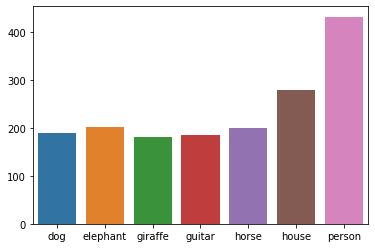

In [ ]:
src_classes = np.zeros(NUM_CLASSES)

for elem in src_dataset:
  src_classes[elem[1]] += 1


ax=sns.barplot(x=src_dataset.classes,y=src_classes)

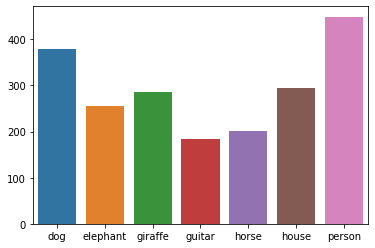

In [ ]:
target_classes = np.zeros(NUM_CLASSES)

for elem in target_dataset:
  target_classes[elem[1]] += 1


ax=sns.barplot(x=target_dataset.classes,y=target_classes)

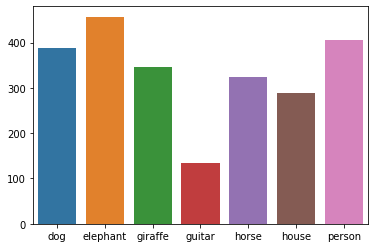

In [ ]:
cartoon_classes = np.zeros(NUM_CLASSES)

for elem in val_dataset_1:
  cartoon_classes[elem[1]] += 1


ax=sns.barplot(x=val_dataset_1.classes,y=cartoon_classes)

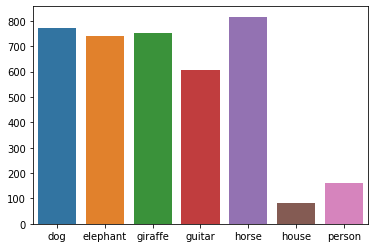

In [ ]:
sketch_classes = np.zeros(NUM_CLASSES)

for elem in val_dataset_2:
  sketch_classes[elem[1]] += 1


ax=sns.barplot(x=val_dataset_2.classes,y=sketch_classes)

## VISUALIZE A SAMPLE OF IMAGES

In [ ]:
def imshow(img):
    plt.figure(figsize=(12, 10))
    img = img.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std*img + mean
    img = np.clip(img, 0, 1)
    
    plt.imshow(img)
    plt.pause(0.001)

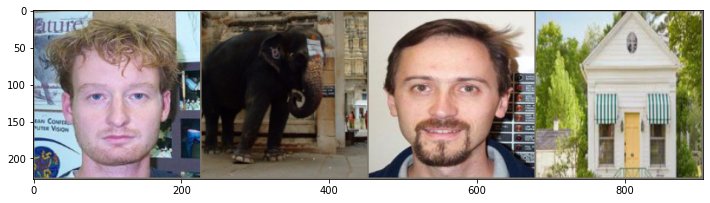

In [ ]:
images, labels = next(iter(src_dataloader))
grid_img = make_grid(images[:4], nrow=4)
imshow(grid_img)

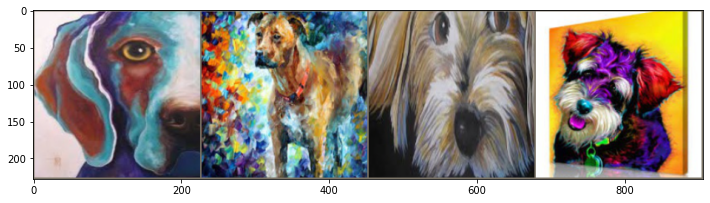

In [ ]:
images, labels = next(iter(target_dataloader))
grid_img = make_grid(images[:4], nrow=4)
imshow(grid_img)

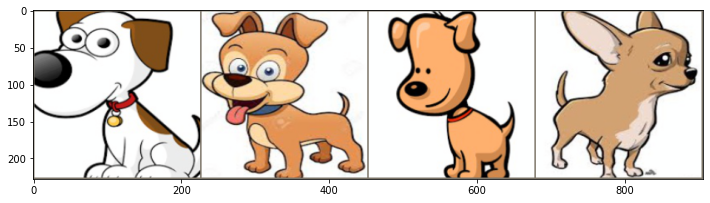

In [ ]:
images, labels = next(iter(cartoon_dataloader))
grid_img = make_grid(images[:4], nrow=4)
imshow(grid_img)

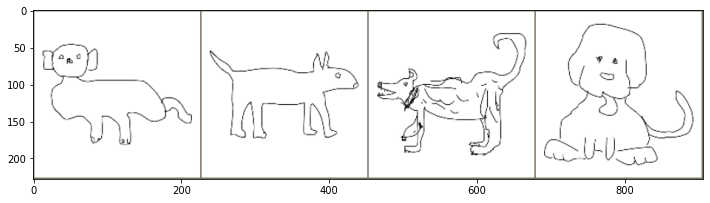

In [ ]:
images, labels = next(iter(sketch_dataloader))
grid_img = make_grid(images[:4], nrow=4)
imshow(grid_img)

# NO DOMAIN ADAPTATION

In [ ]:
def fit(net,train_dataloader,val_dataloader):
  net = net.to(DEVICE) 
  cudnn.benchmark 
  train_loss , train_accuracy = [], []
  val_loss , val_accuracy = [], []

  current_step = 0
  
  for epoch in range(NUM_EPOCHS):
    val_running_loss = 0.0
    val_running_correct = 0
    train_running_loss = 0.0
    train_running_correct = 0
    train_NUM_BATCHES = 0
    val_NUM_BATCHES = 0
    print('Starting epoch {}/{}, LR = {}'.format(epoch+1, NUM_EPOCHS, scheduler.get_last_lr()))
    net.train(True)
    
    for images, labels in train_dataloader:  
      train_NUM_BATCHES += 1
      
      images = images.to(DEVICE)
      labels = labels.to(DEVICE)

      net.train() 

      
      optimizer.zero_grad() 

      
      outputs = net(images)

      
      loss = criterion(outputs, labels)

      train_running_loss += loss.item()
      _, preds = torch.max(outputs.data, 1)
      train_running_correct += torch.sum(preds == labels.data).data.item()
     
      if current_step % LOG_FREQUENCY == 0:
        print('Step {}, Loss {}'.format(current_step, loss.item()))

      
      loss.backward()  
      optimizer.step() 
      

      current_step += 1


    net.train(False) 
    for val_images, val_labels in tqdm(val_dataloader): 
      val_NUM_BATCHES += 1
      val_images = val_images.to(DEVICE)
      val_labels = val_labels.to(DEVICE)

      
      outputs = net(val_images)
      loss = criterion(outputs, val_labels)
      
      _, preds = torch.max(outputs.data, 1)

      
      val_running_correct += torch.sum(preds == val_labels.data).data.item()

      val_running_loss += loss.item()

    print()
    epoch_train_loss = train_running_loss/train_NUM_BATCHES
    epoch_train_accuracy = train_running_correct/float(len(train_dataloader)*BATCH_SIZE)
    print(f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_accuracy:.2f}")
    epoch_val_loss = val_running_loss/val_NUM_BATCHES
    epoch_val_accuracy = val_running_correct / float(len(target_dataloader)*BATCH_SIZE)
    print(f'Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_accuracy:.2f}')
    train_loss.append(epoch_train_loss)
    train_accuracy.append(epoch_train_accuracy)
    val_loss.append(epoch_val_loss)
    val_accuracy.append(epoch_val_accuracy)
    
    scheduler.step() 
    print()
    print()


    

  
  return train_loss,train_accuracy,val_loss,val_accuracy


In [ ]:
def plot_results(train_loss,train_accuracy,val_loss,val_accuracy,title):
  
  
  plt.figure(figsize=(10, 7))
  plt.plot(train_accuracy, color='red', label='train accuracy')
  plt.plot(val_accuracy, color='blue', label='validation accuracy')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.savefig(title+'_accuracy.png')
  plt.show()

  
  plt.figure(figsize=(10, 7))
  plt.plot(train_loss, color='red', label='train loss')
  plt.plot(val_loss, color='blue', label='validation loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.savefig(title+'_loss.png')
  plt.show()

In [ ]:
def test(net, test_dataloader):
  net = net.to(DEVICE) 
  net.train(False) 

  running_corrects = 0
  for images, labels in tqdm(test_dataloader):
    images = images.to(DEVICE)
    labels = labels.to(DEVICE)

    
    outputs = net(images)

    
    _, preds = torch.max(outputs.data, 1)

    
    running_corrects += torch.sum(preds == labels.data).data.item()

  
  accuracy = running_corrects / float(len(target_dataloader)*BATCH_SIZE)

  print('Test Accuracy: {}'.format(accuracy))
  return accuracy

In [ ]:
net = alexnet(pretrained = True)
net.classifier[6] = nn.Linear(4096,NUM_CLASSES)
criterion = nn.CrossEntropyLoss() 
domain_criterion = nn.CrossEntropyLoss()

parameters_to_optimize = net.parameters() 


optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)


scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

## RUNS

In [ ]:
training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=target_dataloader)

Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.0608673095703125




Train Loss: 1.4254, Train Acc: 0.49
Val Loss: 1.6710, Val Acc: 0.39


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.34369975328445435




Train Loss: 0.4725, Train Acc: 0.86
Val Loss: 1.5732, Val Acc: 0.45


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2053, Train Acc: 0.93
Val Loss: 1.9349, Val Acc: 0.44


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.14823825657367706




Train Loss: 0.1285, Train Acc: 0.96
Val Loss: 2.2799, Val Acc: 0.44


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1054, Train Acc: 0.97
Val Loss: 2.4402, Val Acc: 0.45


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.04606328532099724




Train Loss: 0.0823, Train Acc: 0.97
Val Loss: 2.5548, Val Acc: 0.44


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.08792880922555923




Train Loss: 0.0669, Train Acc: 0.98
Val Loss: 2.5495, Val Acc: 0.45


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0614, Train Acc: 0.98
Val Loss: 2.4537, Val Acc: 0.47


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.03362258896231651




Train Loss: 0.0511, Train Acc: 0.99
Val Loss: 2.4366, Val Acc: 0.47


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0421, Train Acc: 0.99
Val Loss: 2.4687, Val Acc: 0.46


Starting epoch 11/30, LR = [0.0001]
Step 60, Loss 0.03630981594324112




Train Loss: 0.0364, Train Acc: 0.99
Val Loss: 2.4791, Val Acc: 0.46


Starting epoch 12/30, LR = [0.0001]
Step 70, Loss 0.03535379841923714




Train Loss: 0.0362, Train Acc: 0.99
Val Loss: 2.4919, Val Acc: 0.46


Starting epoch 13/30, LR = [0.0001]




Train Loss: 0.0379, Train Acc: 0.99
Val Loss: 2.5059, Val Acc: 0.46


Starting epoch 14/30, LR = [0.0001]
Step 80, Loss 0.03804966062307358




Train Loss: 0.0325, Train Acc: 0.99
Val Loss: 2.5184, Val Acc: 0.46


Starting epoch 15/30, LR = [0.0001]




Train Loss: 0.0362, Train Acc: 0.99
Val Loss: 2.5273, Val Acc: 0.46


Starting epoch 16/30, LR = [0.0001]
Step 90, Loss 0.02783924713730812




Train Loss: 0.0402, Train Acc: 0.99
Val Loss: 2.5305, Val Acc: 0.46


Starting epoch 17/30, LR = [0.0001]
Step 100, Loss 0.03254251927137375




Train Loss: 0.0331, Train Acc: 0.99
Val Loss: 2.5364, Val Acc: 0.46


Starting epoch 18/30, LR = [0.0001]




Train Loss: 0.0339, Train Acc: 0.99
Val Loss: 2.5404, Val Acc: 0.46


Starting epoch 19/30, LR = [0.0001]
Step 110, Loss 0.03009052760899067




Train Loss: 0.0366, Train Acc: 0.99
Val Loss: 2.5454, Val Acc: 0.46


Starting epoch 20/30, LR = [0.0001]




Train Loss: 0.0335, Train Acc: 0.99
Val Loss: 2.5499, Val Acc: 0.47


Starting epoch 21/30, LR = [1e-05]
Step 120, Loss 0.02339026890695095




Train Loss: 0.0345, Train Acc: 0.99
Val Loss: 2.5506, Val Acc: 0.47


Starting epoch 22/30, LR = [1e-05]
Step 130, Loss 0.04864596202969551




Train Loss: 0.0330, Train Acc: 0.99
Val Loss: 2.5512, Val Acc: 0.47


Starting epoch 23/30, LR = [1e-05]




Train Loss: 0.0375, Train Acc: 0.99
Val Loss: 2.5515, Val Acc: 0.47


Starting epoch 24/30, LR = [1e-05]
Step 140, Loss 0.026963194832205772




Train Loss: 0.0310, Train Acc: 0.99
Val Loss: 2.5520, Val Acc: 0.47


Starting epoch 25/30, LR = [1e-05]




Train Loss: 0.0349, Train Acc: 0.99
Val Loss: 2.5527, Val Acc: 0.47


Starting epoch 26/30, LR = [1e-05]
Step 150, Loss 0.04344283416867256




Train Loss: 0.0376, Train Acc: 0.99
Val Loss: 2.5533, Val Acc: 0.47


Starting epoch 27/30, LR = [1e-05]
Step 160, Loss 0.04318726807832718




Train Loss: 0.0349, Train Acc: 0.99
Val Loss: 2.5537, Val Acc: 0.47


Starting epoch 28/30, LR = [1e-05]


## PLOT 

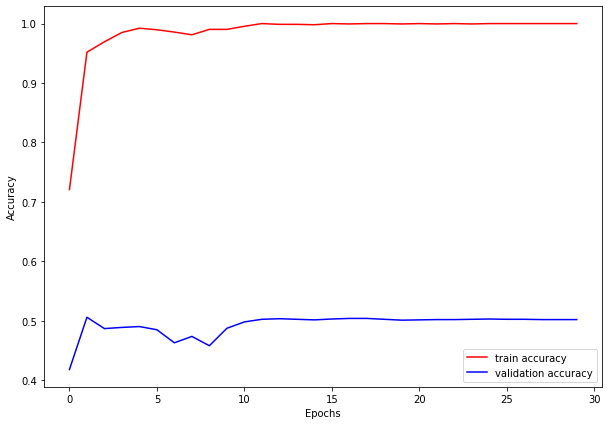

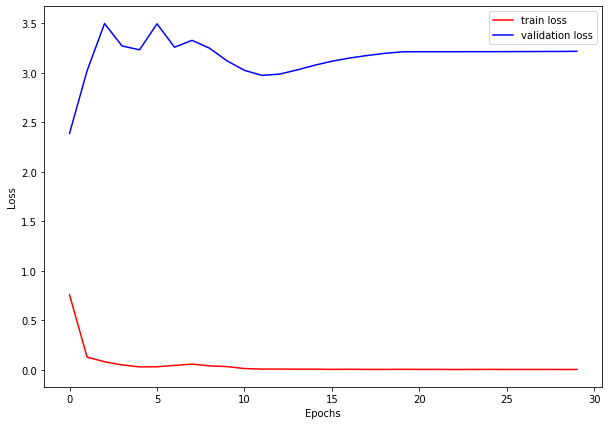

In [ ]:
plot_results(training_loss,training_accuracy,validation_loss,validation_accuracy,"alexnet_noDANN_pretrained")

## TESTING

In [ ]:
test(net,target_dataloader)


Test Accuracy: 0.501953125


0.501953125

# DOMAIN ADAPTATION

In [ ]:
import torch.nn as nn
from torch.autograd import Function
from torch import hub


class ReverseLayerF(Function):
    
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha

        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        output = grad_output.neg() * ctx.alpha

        return output, None

__all__ = ['AlexNet', 'alexnet']


model_urls = {
    'alexnet': 'https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth',
}


class AlexNet(nn.Module):

    def __init__(self, num_classes=1000):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )
        self.domain_classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x, alpha=None):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
      
        # With alpha, the discriminator is trained
        if alpha is not None:
            
            reverse_feature = ReverseLayerF.apply(x, alpha)
            x = self.domain_classifier(x)
            return x
        
        else:
            
            x = self.classifier(x)
            return x

    def assign_wb(self):

        self.domain_classifier[1].weight.data.copy_(self.classifier[1].weight.data)
        self.domain_classifier[1].bias.data.copy_(self.classifier[1].bias.data)
        self.domain_classifier[4].weight.data.copy_(self.classifier[4].weight.data)
        self.domain_classifier[4].bias.data.copy_(self.classifier[4].bias.data)
        self.domain_classifier[6].weight.data.copy_(self.classifier[6].weight.data)
        self.domain_classifier[6].bias.data.copy_(self.classifier[6].bias.data)


def alexnet(pretrained=False, progress=True, **kwargs):
    r"""AlexNet model architecture from the
    `"One weird trick..." <https://arxiv.org/abs/1404.5997>`_ paper.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    model = AlexNet(**kwargs)
    if pretrained:
        state_dict = hub.load_state_dict_from_url(model_urls['alexnet'],
                                              progress=progress)
        model.load_state_dict(state_dict,strict = False)
        model.assign_wb()
    return model

In [ ]:
def train_dann(net,src_dataloader,target_dataloader,ALPHA):
  
  net = net.to(DEVICE) 
  
  cudnn.benchmark 
  train_loss , train_accuracy , train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy = [], [], [], [], [], []
  train_domain_loss, train_domain_accuracy,train_total_loss, train_total_accuracy = [], [], [], []
  val_loss , val_accuracy = [], []

  current_step = 0
  
  for epoch in range(NUM_EPOCHS):
    val_running_loss = 0.0
    val_running_correct = 0
    train_running_loss = 0.0
    train_running_correct = 0
    train_running_src_domain_loss = 0.0
    train_running_src_domain_correct = 0
    train_running_target_domain_loss = 0.0
    train_running_target_domain_correct = 0
    train_running_total_loss = 0.0
    train_running_total_correct = 0

    train_NUM_BATCHES = 0
    val_NUM_BATCHES = 0
    print('Starting epoch {}/{}, LR = {}'.format(epoch+1, NUM_EPOCHS, scheduler.get_last_lr()))
    net.train(True)
    len_dataloader = max(len(src_dataloader), len(target_dataloader))
    data_source_iter = iter(src_dataloader)
    data_target_iter = iter(target_dataloader)
   
    
    for i in range(len_dataloader):
      
    

      try:
        data_source = data_source_iter.next()
        src_images, src_labels = data_source
      except StopIteration:
        data_source_iter = iter(src_dataloader)
        src_images, src_labels = next(data_source_iter)
     
      
      
      src_images = src_images.to(DEVICE)
      src_labels = src_labels.to(DEVICE)
      domain_src_labels = torch.zeros(BATCH_SIZE,dtype=torch.int64).to(DEVICE)
      train_NUM_BATCHES += 1
      
      net.train() 

      
      optimizer.zero_grad() 

      
      outputs = net(src_images)

      # STEP 1: Classification task for source dataloader
      loss = criterion(outputs, src_labels)

      train_running_loss += loss.item()
      _, preds = torch.max(outputs.data, 1)
      train_running_correct += torch.sum(preds == src_labels.data).data.item()
      

     
      
      # STEP 2: Domain classification for source dataloader
      domain_src_outputs = net(src_images,alpha = ALPHA)
      domain_src_loss = domain_criterion(domain_src_outputs, domain_src_labels)
      train_running_src_domain_loss += domain_src_loss.item()
      _, dom_src_preds = torch.max(domain_src_outputs.data, 1)
      train_running_src_domain_correct += torch.sum(dom_src_preds == domain_src_labels.data).data.item()
      

      # STEP 3: Domain classification for target dataloader
      try:
        data_target = data_target_iter.next()
        target_images, target_labels = data_target
      except StopIteration:
        data_target_iter = iter(target_dataloader)
        target_images, target_labels = next(data_target_iter)
      
      target_images = target_images.to(DEVICE)
      domain_target_labels = torch.ones(BATCH_SIZE,dtype=torch.int64).to(DEVICE)
      domain_target_outputs = net(target_images,alpha = ALPHA)
      #print(domain_target_labels.shape)
      #print("outputs:",domain_target_outputs.shape)
      domain_target_loss = domain_criterion(domain_target_outputs, domain_target_labels)
      train_running_target_domain_loss += domain_target_loss.item()
      _, dom_target_preds = torch.max(domain_target_outputs.data, 1)
      train_running_target_domain_correct += torch.sum(dom_target_preds == domain_target_labels.data).data.item()
      
      total_loss = loss + domain_src_loss + domain_target_loss
      total_loss.backward()

      train_running_total_loss += total_loss.item()
      

      optimizer.step()
      current_step += 1
      

    net.train(False) # Set model to validation mode
    
    for val_images, val_labels in tqdm(target_dataloader): 
      val_NUM_BATCHES += 1
      val_images = val_images.to(DEVICE)
      val_labels = val_labels.to(DEVICE)

      
      outputs = net(val_images)
      domain_outputs = net(val_images,ALPHA)

      
      _, preds = torch.max(outputs.data, 1)

      
      val_running_correct += torch.sum(preds == val_labels.data).data.item()

      val_running_loss += loss.item()
    print()
    epoch_train_loss = train_running_loss/float(train_NUM_BATCHES)
    epoch_train_accuracy = train_running_correct/float(len(target_dataloader)*BATCH_SIZE)
    print(f"Source class Loss: {epoch_train_loss:.4f}, Train class Acc: {epoch_train_accuracy:.2f}")
    epoch_val_loss = val_running_loss/float(val_NUM_BATCHES)
    epoch_val_accuracy = val_running_correct / float(len(target_dataloader)*BATCH_SIZE)
    print(f'Target class Loss: {epoch_val_loss:.4f}, Val class Acc: {epoch_val_accuracy:.2f}')
    epoch_train_domain_loss = train_running_src_domain_loss/float(train_NUM_BATCHES)
    epoch_train_domain_accuracy = train_running_src_domain_correct/float(len(target_dataloader)*BATCH_SIZE)
    print(f"Source domain Loss: {epoch_train_domain_loss:.4f}, Source domain Acc: {epoch_train_domain_accuracy:.2f}")
    epoch_target_domain_loss = train_running_target_domain_loss/float(train_NUM_BATCHES)
    epoch_target_domain_accuracy = train_running_target_domain_correct/float(len(target_dataloader)*BATCH_SIZE)
    print(f"Target domain Loss: {epoch_target_domain_loss:.4f}, Target domain Acc: {epoch_target_domain_accuracy:.2f}")
    epoch_train_total_loss = train_running_total_loss/float((train_NUM_BATCHES*3))
    epoch_train_total_accuracy = (train_running_correct + train_running_src_domain_correct + train_running_target_domain_correct)/float(len(target_dataloader)*BATCH_SIZE*3)
    print(f"Total train Loss: {epoch_train_total_loss:.4f}, Total train Acc: {epoch_train_total_accuracy:.2f}")
    epoch_train_tot_domain_loss = (train_running_src_domain_loss + train_running_target_domain_loss)/float(train_NUM_BATCHES*2)
    epoch_train_tot_domain_accuracy = (train_running_src_domain_correct + train_running_target_domain_correct)/float(len(target_dataloader)*2*BATCH_SIZE)
    print(f"Total domain Loss: {epoch_train_tot_domain_loss:.4f}, Total domain Acc: {epoch_train_tot_domain_accuracy:.2f}")
    train_loss.append(epoch_train_loss)
    train_accuracy.append(epoch_train_accuracy)
    val_loss.append(epoch_val_loss)
    val_accuracy.append(epoch_val_accuracy)
    train_src_domain_loss.append(epoch_train_domain_loss) 
    train_src_domain_accuracy.append(epoch_train_domain_accuracy) 
    train_target_domain_loss.append(epoch_target_domain_loss) 
    train_target_domain_accuracy.append(epoch_target_domain_accuracy)
    train_total_loss.append(epoch_train_total_loss)
    train_total_accuracy.append(epoch_train_total_accuracy)
    train_domain_loss.append(epoch_train_tot_domain_loss)
    train_domain_accuracy.append(epoch_train_tot_domain_accuracy)
    # Step the scheduler
    scheduler.step() 
    print()
    print()


    
  return train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy

In [ ]:
BATCH_SIZE = 256
src_dataloader = DataLoader(src_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
target_dataloader = DataLoader(target_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(pretrained=True) 

net.classifier[6] = nn.Linear(4096, NUM_CLASSES) 
                                                 
net.domain_classifier[6] = nn.Linear(4096,NUM_DOMAINS)
criterion = nn.CrossEntropyLoss() 
domain_criterion = nn.CrossEntropyLoss()
 


parameters_to_optimize = net.parameters() 


optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)


scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)





## RUNS

In [ ]:
train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy = train_dann(net,src_dataloader=src_dataloader,target_dataloader=target_dataloader,ALPHA=0.1)

Starting epoch 1/30, LR = [0.01]




Source class Loss: 0.7997, Train class Acc: 0.72
Target class Loss: 1.4356, Val class Acc: 0.17
Source domain Loss: 0.9826, Source domain Acc: 0.72
Target domain Loss: 0.8408, Target domain Acc: 0.78
Total train Loss: 0.8743, Total train Acc: 0.74
Total domain Loss: 0.9117, Total domain Acc: 0.75


Starting epoch 2/30, LR = [0.01]




Source class Loss: 1.8917, Train class Acc: 0.24
Target class Loss: 1.9077, Val class Acc: 0.23
Source domain Loss: 0.6527, Source domain Acc: 0.49
Target domain Loss: 0.8125, Target domain Acc: 0.61
Total train Loss: 1.1190, Total train Acc: 0.45
Total domain Loss: 0.7326, Total domain Acc: 0.55


Starting epoch 3/30, LR = [0.01]




Source class Loss: 199.0579, Train class Acc: 0.18
Target class Loss: 1562.9528, Val class Acc: 0.22
Source domain Loss: 357.6295, Source domain Acc: 0.36
Target domain Loss: 24.8409, Target domain Acc: 0.69
Total train Loss: 193.8427, Total train Acc: 0.41
Total domain Loss: 191.2352, Total domain Acc: 0.53


Starting epoch 4/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.13
Target class Loss: nan, Val class Acc: 0.19
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.38
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 5/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.19
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 6/30, LR = [0.01]


KeyboardInterrupt: ignored

## PLOT

In [ ]:
def plot_DANN(total_loss,total_accuracy,domain_loss,domain_acc,train_loss,train_accuracy,train_domain_loss,train_domain_accuracy,target_domain_loss,target_domain_accuracy,val_loss,val_acc,title):
  
  plt.figure(figsize=(10, 7))
  plt.plot(total_accuracy, color='purple', label='total train accuracy')
  plt.plot(domain_acc, color='pink', label='total domain accuracy')
  
  
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.savefig(title+'_train_accuracies.png')
  plt.show()

  plt.figure(figsize=(10,7))
  plt.plot(train_accuracy, color='blue', label='source class accuracy')
  plt.plot(train_domain_accuracy, color='green', label='source domain accuracy')
  plt.plot(target_domain_accuracy, color='red', label='target domain accuracy')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.savefig(title+'_accuracies.png')
  plt.show()

  
  plt.figure(figsize=(10, 7))
  plt.plot(total_loss, color='green', label='Avg train loss')
  plt.plot(domain_loss, color='gray', label='Avg domain loss')
  
  
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.savefig(title+'_train_loss.png')
  plt.show()

  plt.figure(figsize=(10, 7))
  plt.plot(train_loss, color='blue', label='source class loss')
  plt.plot(train_domain_loss, color='orange', label='source domain loss')
  plt.plot(target_domain_loss, color='red', label='target domain loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.savefig(title+'_losses.png')
  plt.show()


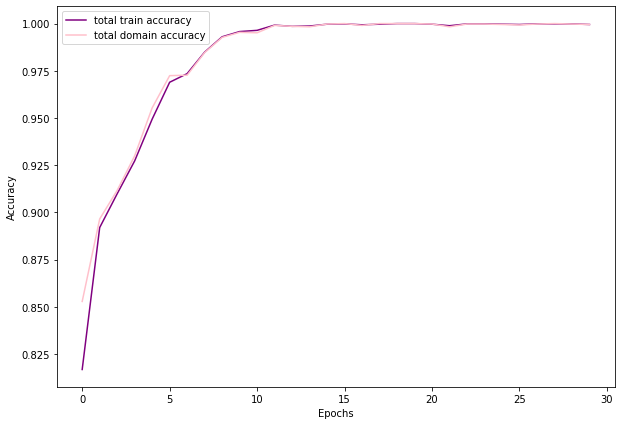

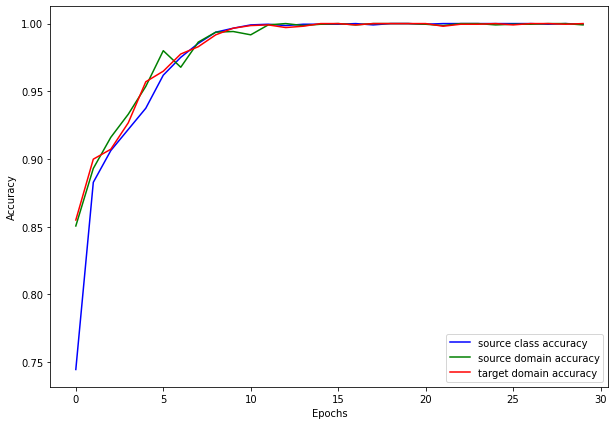

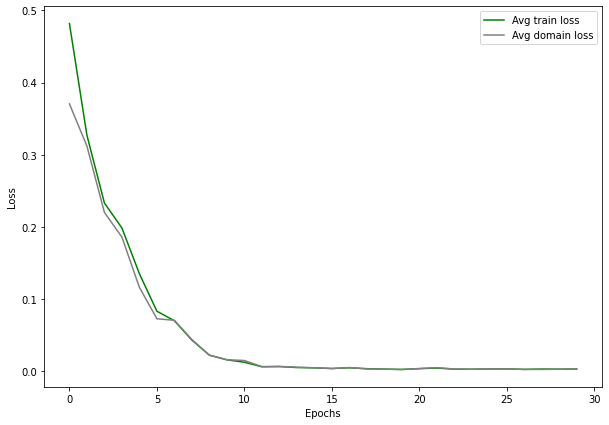

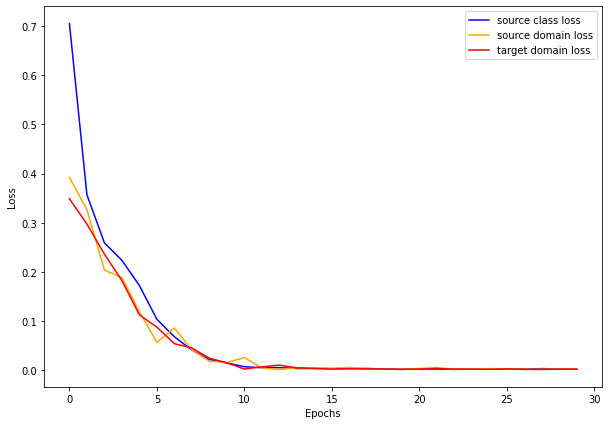

In [ ]:
plot_DANN(train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy ,"DANN")

## TESTING

In [ ]:
def test(net, test_dataloader):
  net = net.to(DEVICE) 
  net.train(False) 

  running_corrects = 0
  for images, labels in tqdm(test_dataloader):
    images = images.to(DEVICE)
    labels = labels.to(DEVICE)

    
    outputs = net(images)

    
    _, preds = torch.max(outputs.data, 1)

    
    running_corrects += torch.sum(preds == labels.data).data.item()

  
  accuracy = running_corrects / float(len(target_dataset))

  print('Test Accuracy: {}'.format(accuracy))
  return accuracy

In [ ]:
test(net,target_dataloader)



Test Accuracy: 0.44287109375


0.44287109375

# VALIDATE ON ART PAINTING

## NO DOMAIN ADAPTATION

### RUNS

In [ ]:
NUM_CLASSES = 7  

BATCH_SIZE = 256     
                     

LR = 1e-2            
MOMENTUM = 0.9       
WEIGHT_DECAY = 5e-5  
ALPHA = 0.1         

NUM_EPOCHS = 30      
STEP_SIZE = 10       
GAMMA = 0.1          

LOG_FREQUENCY = 10

NUM_DOMAINS = 2

Iteration 1 / 8
lr: 1e-05_wd: 4.9999999999999996e-06_gamma: 0.282700330026464
Starting epoch 1/30, LR = [1e-05]
Step 0, Loss 2.0498056411743164




Train Loss: 2.0262, Train Acc: 0.15
Val Loss: 2.1555, Val Acc: 0.13


Starting epoch 2/30, LR = [1e-05]
Step 10, Loss 1.9631835222244263




Train Loss: 1.9584, Train Acc: 0.21
Val Loss: 2.1388, Val Acc: 0.13


Starting epoch 3/30, LR = [1e-05]




Train Loss: 1.8721, Train Acc: 0.25
Val Loss: 2.1182, Val Acc: 0.14


Starting epoch 4/30, LR = [1e-05]
Step 20, Loss 1.8056824207305908




Train Loss: 1.7778, Train Acc: 0.31
Val Loss: 2.0961, Val Acc: 0.15


Starting epoch 5/30, LR = [1e-05]




Train Loss: 1.6785, Train Acc: 0.37
Val Loss: 2.0740, Val Acc: 0.16


Starting epoch 6/30, LR = [1e-05]
Step 30, Loss 1.603067398071289




Train Loss: 1.5733, Train Acc: 0.43
Val Loss: 2.0529, Val Acc: 0.17


Starting epoch 7/30, LR = [1e-05]
Step 40, Loss 1.4934883117675781




Train Loss: 1.4983, Train Acc: 0.46
Val Loss: 2.0330, Val Acc: 0.18


Starting epoch 8/30, LR = [1e-05]




Train Loss: 1.4055, Train Acc: 0.49
Val Loss: 2.0143, Val Acc: 0.19


Starting epoch 9/30, LR = [1e-05]
Step 50, Loss 1.3342746496200562




Train Loss: 1.3400, Train Acc: 0.51
Val Loss: 1.9967, Val Acc: 0.19


Starting epoch 10/30, LR = [1e-05]




Train Loss: 1.2687, Train Acc: 0.54
Val Loss: 1.9803, Val Acc: 0.21


Starting epoch 11/30, LR = [2.82700330026464e-06]
Step 60, Loss 1.2502964735031128




Train Loss: 1.2321, Train Acc: 0.55
Val Loss: 1.9759, Val Acc: 0.21


Starting epoch 12/30, LR = [2.82700330026464e-06]
Step 70, Loss 1.215227484703064




Train Loss: 1.2185, Train Acc: 0.56
Val Loss: 1.9719, Val Acc: 0.21


Starting epoch 13/30, LR = [2.82700330026464e-06]




Train Loss: 1.2124, Train Acc: 0.55
Val Loss: 1.9679, Val Acc: 0.22


Starting epoch 14/30, LR = [2.82700330026464e-06]
Step 80, Loss 1.2114157676696777




Train Loss: 1.2052, Train Acc: 0.56
Val Loss: 1.9641, Val Acc: 0.22


Starting epoch 15/30, LR = [2.82700330026464e-06]




Train Loss: 1.1878, Train Acc: 0.56
Val Loss: 1.9604, Val Acc: 0.22


Starting epoch 16/30, LR = [2.82700330026464e-06]
Step 90, Loss 1.1466532945632935




Train Loss: 1.1722, Train Acc: 0.57
Val Loss: 1.9567, Val Acc: 0.23


Starting epoch 17/30, LR = [2.82700330026464e-06]
Step 100, Loss 1.090748906135559




Train Loss: 1.1421, Train Acc: 0.58
Val Loss: 1.9531, Val Acc: 0.23


Starting epoch 18/30, LR = [2.82700330026464e-06]




Train Loss: 1.1456, Train Acc: 0.58
Val Loss: 1.9496, Val Acc: 0.23


Starting epoch 19/30, LR = [2.82700330026464e-06]
Step 110, Loss 1.1406556367874146




Train Loss: 1.1288, Train Acc: 0.58
Val Loss: 1.9461, Val Acc: 0.23


Starting epoch 20/30, LR = [2.82700330026464e-06]




Train Loss: 1.1169, Train Acc: 0.59
Val Loss: 1.9427, Val Acc: 0.23


Starting epoch 21/30, LR = [7.991947659707167e-07]
Step 120, Loss 1.0036611557006836




Train Loss: 1.1078, Train Acc: 0.59
Val Loss: 1.9418, Val Acc: 0.23


Starting epoch 22/30, LR = [7.991947659707167e-07]
Step 130, Loss 1.0397508144378662




Train Loss: 1.1114, Train Acc: 0.60
Val Loss: 1.9409, Val Acc: 0.24


Starting epoch 23/30, LR = [7.991947659707167e-07]




Train Loss: 1.1039, Train Acc: 0.60
Val Loss: 1.9399, Val Acc: 0.24


Starting epoch 24/30, LR = [7.991947659707167e-07]
Step 140, Loss 1.0941883325576782




Train Loss: 1.1153, Train Acc: 0.59
Val Loss: 1.9390, Val Acc: 0.24


Starting epoch 25/30, LR = [7.991947659707167e-07]




Train Loss: 1.0907, Train Acc: 0.61
Val Loss: 1.9381, Val Acc: 0.24


Starting epoch 26/30, LR = [7.991947659707167e-07]
Step 150, Loss 1.0886253118515015




Train Loss: 1.1055, Train Acc: 0.60
Val Loss: 1.9372, Val Acc: 0.24


Starting epoch 27/30, LR = [7.991947659707167e-07]
Step 160, Loss 1.2251293659210205




Train Loss: 1.0984, Train Acc: 0.60
Val Loss: 1.9363, Val Acc: 0.24


Starting epoch 28/30, LR = [7.991947659707167e-07]




Train Loss: 1.0953, Train Acc: 0.60
Val Loss: 1.9354, Val Acc: 0.24


Starting epoch 29/30, LR = [7.991947659707167e-07]
Step 170, Loss 1.0669292211532593




Train Loss: 1.0832, Train Acc: 0.60
Val Loss: 1.9346, Val Acc: 0.24


Starting epoch 30/30, LR = [7.991947659707167e-07]




Train Loss: 1.0977, Train Acc: 0.61
Val Loss: 1.9337, Val Acc: 0.24




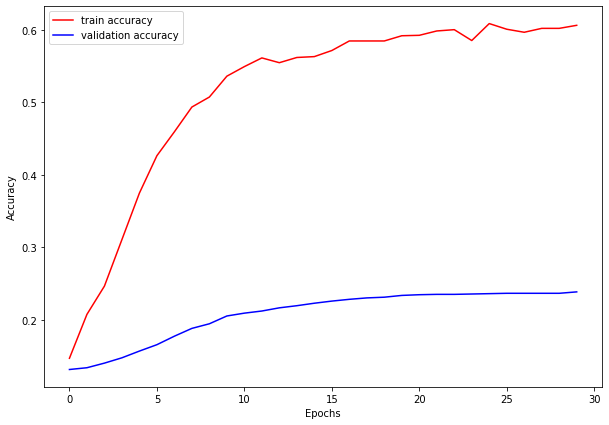

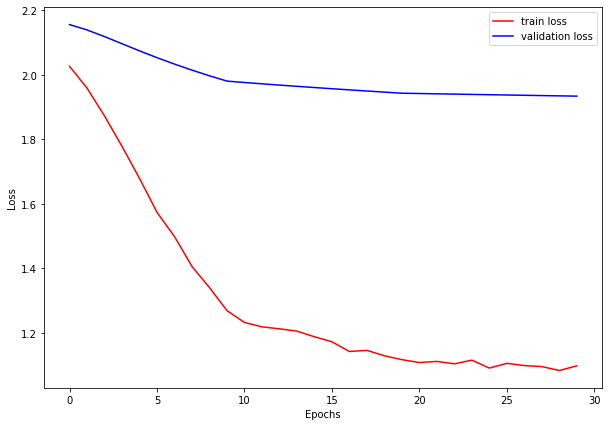

Iteration 2 / 8
lr: 0.001_wd: 5e-05_gamma: 0.12792823074668874
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.0838468074798584




Train Loss: 1.4332, Train Acc: 0.43
Val Loss: 1.6909, Val Acc: 0.35


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.3354419469833374




Train Loss: 0.4465, Train Acc: 0.79
Val Loss: 1.6445, Val Acc: 0.43


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.1994, Train Acc: 0.87
Val Loss: 1.9533, Val Acc: 0.43


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.14590150117874146




Train Loss: 0.1388, Train Acc: 0.88
Val Loss: 2.2385, Val Acc: 0.43


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1121, Train Acc: 0.89
Val Loss: 2.4169, Val Acc: 0.44


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.0823943167924881




Train Loss: 0.0908, Train Acc: 0.89
Val Loss: 2.4654, Val Acc: 0.46


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.052313968539237976




Train Loss: 0.0714, Train Acc: 0.90
Val Loss: 2.4833, Val Acc: 0.46


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0613, Train Acc: 0.90
Val Loss: 2.4189, Val Acc: 0.47


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.04173008352518082




Train Loss: 0.0482, Train Acc: 0.91
Val Loss: 2.4314, Val Acc: 0.48


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0538, Train Acc: 0.90
Val Loss: 2.4448, Val Acc: 0.48


Starting epoch 11/30, LR = [0.00012792823074668874]
Step 60, Loss 0.0327480249106884




Train Loss: 0.0370, Train Acc: 0.91
Val Loss: 2.4393, Val Acc: 0.48


Starting epoch 12/30, LR = [0.00012792823074668874]
Step 70, Loss 0.04877680912613869




Train Loss: 0.0451, Train Acc: 0.91
Val Loss: 2.4369, Val Acc: 0.48


Starting epoch 13/30, LR = [0.00012792823074668874]




Train Loss: 0.0383, Train Acc: 0.91
Val Loss: 2.4350, Val Acc: 0.48


Starting epoch 14/30, LR = [0.00012792823074668874]
Step 80, Loss 0.03021905943751335




Train Loss: 0.0412, Train Acc: 0.91
Val Loss: 2.4322, Val Acc: 0.48


Starting epoch 15/30, LR = [0.00012792823074668874]




Train Loss: 0.0394, Train Acc: 0.91
Val Loss: 2.4337, Val Acc: 0.48


Starting epoch 16/30, LR = [0.00012792823074668874]
Step 90, Loss 0.048622045665979385




Train Loss: 0.0330, Train Acc: 0.91
Val Loss: 2.4394, Val Acc: 0.48


Starting epoch 17/30, LR = [0.00012792823074668874]
Step 100, Loss 0.04276494309306145




Train Loss: 0.0321, Train Acc: 0.91
Val Loss: 2.4485, Val Acc: 0.48


Starting epoch 18/30, LR = [0.00012792823074668874]




Train Loss: 0.0430, Train Acc: 0.91
Val Loss: 2.4512, Val Acc: 0.48


Starting epoch 19/30, LR = [0.00012792823074668874]
Step 110, Loss 0.0454639308154583




Train Loss: 0.0320, Train Acc: 0.91
Val Loss: 2.4528, Val Acc: 0.48


Starting epoch 20/30, LR = [0.00012792823074668874]




Train Loss: 0.0347, Train Acc: 0.91
Val Loss: 2.4537, Val Acc: 0.48


Starting epoch 21/30, LR = [1.6365632221978037e-05]
Step 120, Loss 0.03447617217898369




Train Loss: 0.0343, Train Acc: 0.91
Val Loss: 2.4539, Val Acc: 0.48


Starting epoch 22/30, LR = [1.6365632221978037e-05]
Step 130, Loss 0.04937869682908058




Train Loss: 0.0391, Train Acc: 0.91
Val Loss: 2.4545, Val Acc: 0.48


Starting epoch 23/30, LR = [1.6365632221978037e-05]




Train Loss: 0.0338, Train Acc: 0.91
Val Loss: 2.4545, Val Acc: 0.48


Starting epoch 24/30, LR = [1.6365632221978037e-05]
Step 140, Loss 0.03304823860526085




Train Loss: 0.0333, Train Acc: 0.91
Val Loss: 2.4542, Val Acc: 0.48


Starting epoch 25/30, LR = [1.6365632221978037e-05]




Train Loss: 0.0322, Train Acc: 0.91
Val Loss: 2.4541, Val Acc: 0.48


Starting epoch 26/30, LR = [1.6365632221978037e-05]
Step 150, Loss 0.021738551557064056




Train Loss: 0.0334, Train Acc: 0.91
Val Loss: 2.4539, Val Acc: 0.48


Starting epoch 27/30, LR = [1.6365632221978037e-05]
Step 160, Loss 0.05498852953314781




Train Loss: 0.0324, Train Acc: 0.91
Val Loss: 2.4534, Val Acc: 0.48


Starting epoch 28/30, LR = [1.6365632221978037e-05]




Train Loss: 0.0357, Train Acc: 0.91
Val Loss: 2.4531, Val Acc: 0.48


Starting epoch 29/30, LR = [1.6365632221978037e-05]
Step 170, Loss 0.03782927617430687




Train Loss: 0.0402, Train Acc: 0.91
Val Loss: 2.4528, Val Acc: 0.48


Starting epoch 30/30, LR = [1.6365632221978037e-05]




Train Loss: 0.0271, Train Acc: 0.91
Val Loss: 2.4530, Val Acc: 0.48




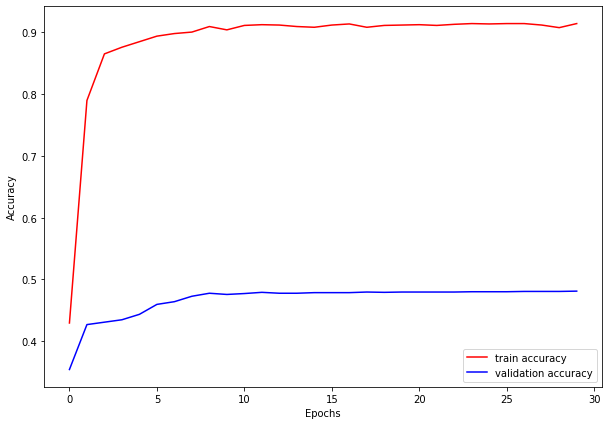

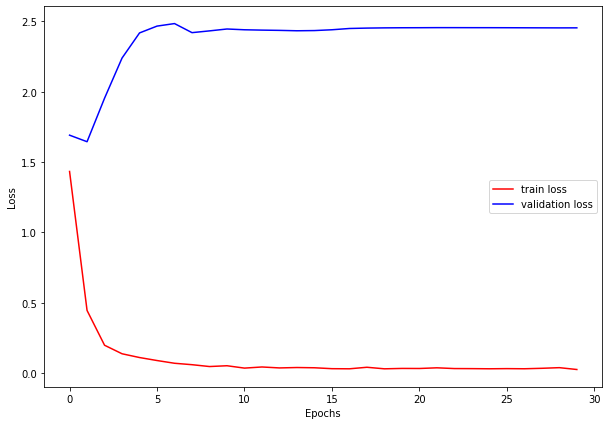

Iteration 3 / 8
lr: 1e-05_wd: 0.0005_gamma: 0.47704249022921386
Starting epoch 1/30, LR = [1e-05]
Step 0, Loss 2.1563127040863037




Train Loss: 2.0869, Train Acc: 0.13
Val Loss: 2.1195, Val Acc: 0.13


Starting epoch 2/30, LR = [1e-05]
Step 10, Loss 1.9808000326156616




Train Loss: 2.0338, Train Acc: 0.14
Val Loss: 2.1024, Val Acc: 0.14


Starting epoch 3/30, LR = [1e-05]




Train Loss: 1.9139, Train Acc: 0.19
Val Loss: 2.0816, Val Acc: 0.16


Starting epoch 4/30, LR = [1e-05]
Step 20, Loss 1.8611990213394165




Train Loss: 1.8203, Train Acc: 0.27
Val Loss: 2.0595, Val Acc: 0.17


Starting epoch 5/30, LR = [1e-05]




Train Loss: 1.7021, Train Acc: 0.34
Val Loss: 2.0376, Val Acc: 0.18


Starting epoch 6/30, LR = [1e-05]
Step 30, Loss 1.6719651222229004




Train Loss: 1.6060, Train Acc: 0.39
Val Loss: 2.0167, Val Acc: 0.20


Starting epoch 7/30, LR = [1e-05]
Step 40, Loss 1.4506555795669556




Train Loss: 1.5176, Train Acc: 0.44
Val Loss: 1.9972, Val Acc: 0.21


Starting epoch 8/30, LR = [1e-05]




Train Loss: 1.4448, Train Acc: 0.49
Val Loss: 1.9789, Val Acc: 0.22


Starting epoch 9/30, LR = [1e-05]
Step 50, Loss 1.3258137702941895




Train Loss: 1.3549, Train Acc: 0.53
Val Loss: 1.9621, Val Acc: 0.23


Starting epoch 10/30, LR = [1e-05]




Train Loss: 1.3072, Train Acc: 0.54
Val Loss: 1.9467, Val Acc: 0.24


Starting epoch 11/30, LR = [4.770424902292139e-06]
Step 60, Loss 1.2340781688690186




Train Loss: 1.2437, Train Acc: 0.57
Val Loss: 1.9400, Val Acc: 0.25


Starting epoch 12/30, LR = [4.770424902292139e-06]
Step 70, Loss 1.2177672386169434




Train Loss: 1.2221, Train Acc: 0.57
Val Loss: 1.9337, Val Acc: 0.25


Starting epoch 13/30, LR = [4.770424902292139e-06]




Train Loss: 1.2025, Train Acc: 0.57
Val Loss: 1.9278, Val Acc: 0.25


Starting epoch 14/30, LR = [4.770424902292139e-06]
Step 80, Loss 1.1771827936172485




Train Loss: 1.1880, Train Acc: 0.57
Val Loss: 1.9221, Val Acc: 0.26


Starting epoch 15/30, LR = [4.770424902292139e-06]




Train Loss: 1.1869, Train Acc: 0.56
Val Loss: 1.9166, Val Acc: 0.26


Starting epoch 16/30, LR = [4.770424902292139e-06]
Step 90, Loss 1.112092137336731




Train Loss: 1.1405, Train Acc: 0.58
Val Loss: 1.9113, Val Acc: 0.26


Starting epoch 17/30, LR = [4.770424902292139e-06]
Step 100, Loss 1.0940970182418823




Train Loss: 1.1309, Train Acc: 0.60
Val Loss: 1.9062, Val Acc: 0.26


Starting epoch 18/30, LR = [4.770424902292139e-06]




Train Loss: 1.1175, Train Acc: 0.60
Val Loss: 1.9013, Val Acc: 0.27


Starting epoch 19/30, LR = [4.770424902292139e-06]
Step 110, Loss 1.0934967994689941




Train Loss: 1.0996, Train Acc: 0.59
Val Loss: 1.8966, Val Acc: 0.27


Starting epoch 20/30, LR = [4.770424902292139e-06]




Train Loss: 1.1007, Train Acc: 0.60
Val Loss: 1.8919, Val Acc: 0.27


Starting epoch 21/30, LR = [2.2756953748408962e-06]
Step 120, Loss 1.1095041036605835




Train Loss: 1.0627, Train Acc: 0.61
Val Loss: 1.8898, Val Acc: 0.27


Starting epoch 22/30, LR = [2.2756953748408962e-06]
Step 130, Loss 0.9872207045555115




Train Loss: 1.0475, Train Acc: 0.63
Val Loss: 1.8878, Val Acc: 0.27


Starting epoch 23/30, LR = [2.2756953748408962e-06]




Train Loss: 1.0481, Train Acc: 0.61
Val Loss: 1.8857, Val Acc: 0.27


Starting epoch 24/30, LR = [2.2756953748408962e-06]
Step 140, Loss 1.0152007341384888




Train Loss: 1.0494, Train Acc: 0.61
Val Loss: 1.8837, Val Acc: 0.28


Starting epoch 25/30, LR = [2.2756953748408962e-06]




Train Loss: 1.0370, Train Acc: 0.62
Val Loss: 1.8817, Val Acc: 0.28


Starting epoch 26/30, LR = [2.2756953748408962e-06]
Step 150, Loss 1.0427833795547485




Train Loss: 1.0309, Train Acc: 0.63
Val Loss: 1.8798, Val Acc: 0.28


Starting epoch 27/30, LR = [2.2756953748408962e-06]
Step 160, Loss 0.9785155653953552




Train Loss: 1.0140, Train Acc: 0.63
Val Loss: 1.8778, Val Acc: 0.28


Starting epoch 28/30, LR = [2.2756953748408962e-06]




Train Loss: 1.0094, Train Acc: 0.63
Val Loss: 1.8758, Val Acc: 0.28


Starting epoch 29/30, LR = [2.2756953748408962e-06]
Step 170, Loss 1.0694118738174438




Train Loss: 1.0104, Train Acc: 0.62
Val Loss: 1.8739, Val Acc: 0.28


Starting epoch 30/30, LR = [2.2756953748408962e-06]




Train Loss: 1.0056, Train Acc: 0.64
Val Loss: 1.8720, Val Acc: 0.29




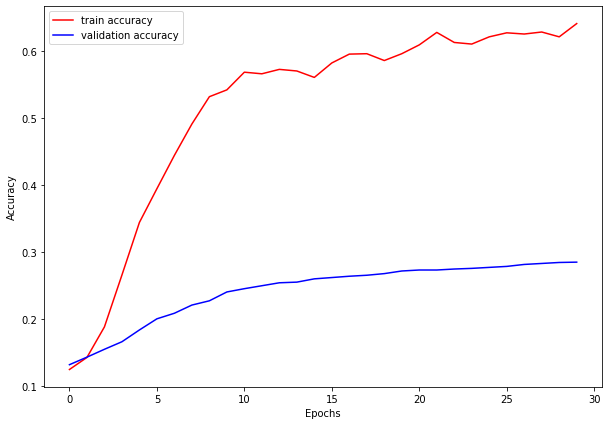

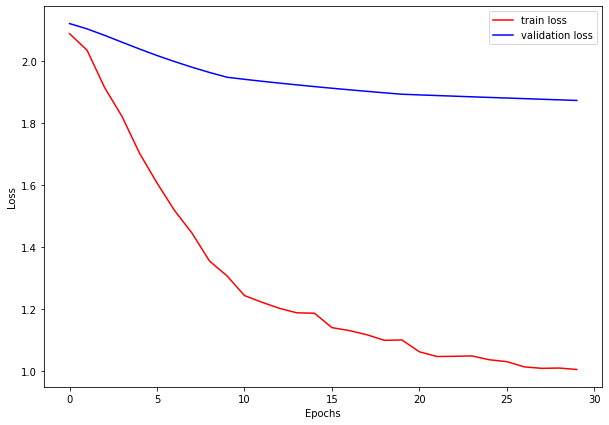

Iteration 4 / 8
lr: 0.001_wd: 4.9999999999999996e-06_gamma: 0.3473630350203547
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 1.95779550075531




Train Loss: 1.3231, Train Acc: 0.49
Val Loss: 1.5582, Val Acc: 0.43


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.3151797354221344




Train Loss: 0.4319, Train Acc: 0.80
Val Loss: 1.5170, Val Acc: 0.47


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2112, Train Acc: 0.86
Val Loss: 1.7943, Val Acc: 0.47


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.15949667990207672




Train Loss: 0.1450, Train Acc: 0.87
Val Loss: 2.0244, Val Acc: 0.48


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1079, Train Acc: 0.89
Val Loss: 2.2294, Val Acc: 0.47


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.059079114347696304




Train Loss: 0.0995, Train Acc: 0.89
Val Loss: 2.2578, Val Acc: 0.48


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.04894858971238136




Train Loss: 0.0739, Train Acc: 0.90
Val Loss: 2.1591, Val Acc: 0.49


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0656, Train Acc: 0.90
Val Loss: 2.1087, Val Acc: 0.51


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.03348539397120476




Train Loss: 0.0577, Train Acc: 0.91
Val Loss: 2.0914, Val Acc: 0.51


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0436, Train Acc: 0.91
Val Loss: 2.0985, Val Acc: 0.51


Starting epoch 11/30, LR = [0.00034736303502035473]
Step 60, Loss 0.0504329539835453




Train Loss: 0.0430, Train Acc: 0.91
Val Loss: 2.1022, Val Acc: 0.50


Starting epoch 12/30, LR = [0.00034736303502035473]
Step 70, Loss 0.0412743017077446




Train Loss: 0.0406, Train Acc: 0.91
Val Loss: 2.1165, Val Acc: 0.51


Starting epoch 13/30, LR = [0.00034736303502035473]




Train Loss: 0.0444, Train Acc: 0.91
Val Loss: 2.1365, Val Acc: 0.51


Starting epoch 14/30, LR = [0.00034736303502035473]
Step 80, Loss 0.058029234409332275




Train Loss: 0.0400, Train Acc: 0.91
Val Loss: 2.1603, Val Acc: 0.50


Starting epoch 15/30, LR = [0.00034736303502035473]




Train Loss: 0.0325, Train Acc: 0.91
Val Loss: 2.1848, Val Acc: 0.50


Starting epoch 16/30, LR = [0.00034736303502035473]
Step 90, Loss 0.0418238528072834




Train Loss: 0.0328, Train Acc: 0.91
Val Loss: 2.2074, Val Acc: 0.50


Starting epoch 17/30, LR = [0.00034736303502035473]
Step 100, Loss 0.045792460441589355




Train Loss: 0.0389, Train Acc: 0.91
Val Loss: 2.2185, Val Acc: 0.50


Starting epoch 18/30, LR = [0.00034736303502035473]




Train Loss: 0.0369, Train Acc: 0.91
Val Loss: 2.2292, Val Acc: 0.50


Starting epoch 19/30, LR = [0.00034736303502035473]
Step 110, Loss 0.030894920229911804




Train Loss: 0.0332, Train Acc: 0.91
Val Loss: 2.2329, Val Acc: 0.50


Starting epoch 20/30, LR = [0.00034736303502035473]




Train Loss: 0.0293, Train Acc: 0.91
Val Loss: 2.2388, Val Acc: 0.50


Starting epoch 21/30, LR = [0.00012066107809855218]
Step 120, Loss 0.031955983489751816




Train Loss: 0.0302, Train Acc: 0.91
Val Loss: 2.2438, Val Acc: 0.50


Starting epoch 22/30, LR = [0.00012066107809855218]
Step 130, Loss 0.031249061226844788




Train Loss: 0.0313, Train Acc: 0.91
Val Loss: 2.2475, Val Acc: 0.50


Starting epoch 23/30, LR = [0.00012066107809855218]




Train Loss: 0.0276, Train Acc: 0.91
Val Loss: 2.2525, Val Acc: 0.50


Starting epoch 24/30, LR = [0.00012066107809855218]
Step 140, Loss 0.022431280463933945




Train Loss: 0.0286, Train Acc: 0.91
Val Loss: 2.2558, Val Acc: 0.50


Starting epoch 25/30, LR = [0.00012066107809855218]




Train Loss: 0.0289, Train Acc: 0.91
Val Loss: 2.2598, Val Acc: 0.50


Starting epoch 26/30, LR = [0.00012066107809855218]
Step 150, Loss 0.020739858970046043




Train Loss: 0.0236, Train Acc: 0.92
Val Loss: 2.2619, Val Acc: 0.50


Starting epoch 27/30, LR = [0.00012066107809855218]
Step 160, Loss 0.018833590671420097




Train Loss: 0.0272, Train Acc: 0.91
Val Loss: 2.2627, Val Acc: 0.50


Starting epoch 28/30, LR = [0.00012066107809855218]




Train Loss: 0.0281, Train Acc: 0.91
Val Loss: 2.2627, Val Acc: 0.50


Starting epoch 29/30, LR = [0.00012066107809855218]
Step 170, Loss 0.026369446888566017




Train Loss: 0.0278, Train Acc: 0.91
Val Loss: 2.2643, Val Acc: 0.50


Starting epoch 30/30, LR = [0.00012066107809855218]




Train Loss: 0.0223, Train Acc: 0.92
Val Loss: 2.2650, Val Acc: 0.50




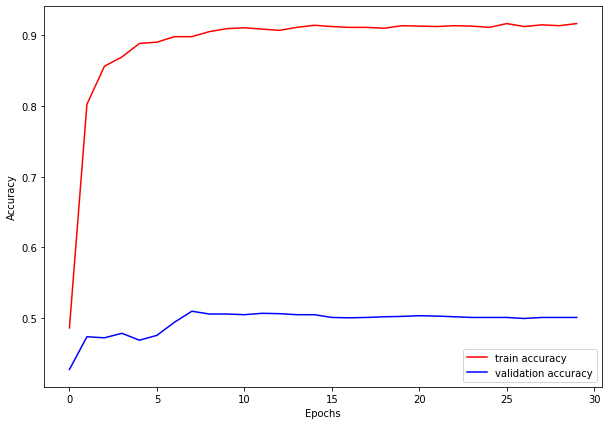

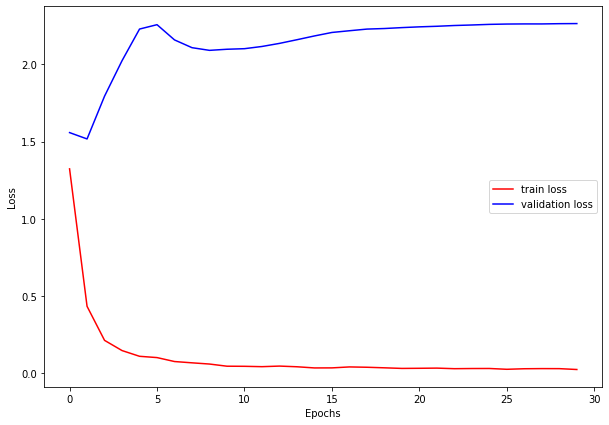

Iteration 5 / 8
lr: 0.001_wd: 4.9999999999999996e-06_gamma: 0.34857587746852314
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.3699281215667725




Train Loss: 1.5424, Train Acc: 0.39
Val Loss: 1.7008, Val Acc: 0.37


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.3923194706439972




Train Loss: 0.4806, Train Acc: 0.79
Val Loss: 1.5507, Val Acc: 0.45


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2188, Train Acc: 0.86
Val Loss: 1.8103, Val Acc: 0.43


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.13991397619247437




Train Loss: 0.1423, Train Acc: 0.88
Val Loss: 2.0043, Val Acc: 0.44


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1206, Train Acc: 0.88
Val Loss: 2.1472, Val Acc: 0.46


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.07555612921714783




Train Loss: 0.0942, Train Acc: 0.89
Val Loss: 2.2440, Val Acc: 0.45


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.056372370570898056




Train Loss: 0.0726, Train Acc: 0.90
Val Loss: 2.2145, Val Acc: 0.47


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0647, Train Acc: 0.90
Val Loss: 2.2152, Val Acc: 0.48


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.07607667148113251




Train Loss: 0.0603, Train Acc: 0.90
Val Loss: 2.2355, Val Acc: 0.48


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0514, Train Acc: 0.90
Val Loss: 2.2547, Val Acc: 0.49


Starting epoch 11/30, LR = [0.00034857587746852314]
Step 60, Loss 0.038777511566877365




Train Loss: 0.0392, Train Acc: 0.91
Val Loss: 2.2558, Val Acc: 0.49


Starting epoch 12/30, LR = [0.00034857587746852314]
Step 70, Loss 0.028149569407105446




Train Loss: 0.0372, Train Acc: 0.91
Val Loss: 2.2526, Val Acc: 0.49


Starting epoch 13/30, LR = [0.00034857587746852314]




Train Loss: 0.0419, Train Acc: 0.91
Val Loss: 2.2640, Val Acc: 0.49


Starting epoch 14/30, LR = [0.00034857587746852314]
Step 80, Loss 0.04618686065077782




Train Loss: 0.0400, Train Acc: 0.91
Val Loss: 2.2780, Val Acc: 0.49


Starting epoch 15/30, LR = [0.00034857587746852314]




Train Loss: 0.0295, Train Acc: 0.91
Val Loss: 2.2885, Val Acc: 0.49


Starting epoch 16/30, LR = [0.00034857587746852314]
Step 90, Loss 0.02612488344311714




Train Loss: 0.0359, Train Acc: 0.91
Val Loss: 2.2925, Val Acc: 0.49


Starting epoch 17/30, LR = [0.00034857587746852314]
Step 100, Loss 0.046033237129449844




Train Loss: 0.0324, Train Acc: 0.91
Val Loss: 2.3120, Val Acc: 0.49


Starting epoch 18/30, LR = [0.00034857587746852314]




Train Loss: 0.0357, Train Acc: 0.91
Val Loss: 2.3274, Val Acc: 0.49


Starting epoch 19/30, LR = [0.00034857587746852314]
Step 110, Loss 0.03181800991296768




Train Loss: 0.0312, Train Acc: 0.92
Val Loss: 2.3207, Val Acc: 0.49


Starting epoch 20/30, LR = [0.00034857587746852314]




Train Loss: 0.0309, Train Acc: 0.91
Val Loss: 2.3343, Val Acc: 0.49


Starting epoch 21/30, LR = [0.00012150514235295086]
Step 120, Loss 0.030096344649791718




Train Loss: 0.0303, Train Acc: 0.91
Val Loss: 2.3420, Val Acc: 0.49


Starting epoch 22/30, LR = [0.00012150514235295086]
Step 130, Loss 0.02913651056587696




Train Loss: 0.0267, Train Acc: 0.91
Val Loss: 2.3487, Val Acc: 0.49


Starting epoch 23/30, LR = [0.00012150514235295086]




Train Loss: 0.0292, Train Acc: 0.91
Val Loss: 2.3485, Val Acc: 0.49


Starting epoch 24/30, LR = [0.00012150514235295086]
Step 140, Loss 0.027488453313708305




Train Loss: 0.0265, Train Acc: 0.92
Val Loss: 2.3531, Val Acc: 0.49


Starting epoch 25/30, LR = [0.00012150514235295086]




Train Loss: 0.0283, Train Acc: 0.91
Val Loss: 2.3572, Val Acc: 0.49


Starting epoch 26/30, LR = [0.00012150514235295086]
Step 150, Loss 0.037952158600091934




Train Loss: 0.0241, Train Acc: 0.91
Val Loss: 2.3616, Val Acc: 0.49


Starting epoch 27/30, LR = [0.00012150514235295086]
Step 160, Loss 0.026178844273090363




Train Loss: 0.0302, Train Acc: 0.92
Val Loss: 2.3658, Val Acc: 0.49


Starting epoch 28/30, LR = [0.00012150514235295086]




Train Loss: 0.0314, Train Acc: 0.91
Val Loss: 2.3697, Val Acc: 0.49


Starting epoch 29/30, LR = [0.00012150514235295086]
Step 170, Loss 0.02340180054306984




Train Loss: 0.0276, Train Acc: 0.91
Val Loss: 2.3764, Val Acc: 0.49


Starting epoch 30/30, LR = [0.00012150514235295086]




Train Loss: 0.0251, Train Acc: 0.92
Val Loss: 2.3809, Val Acc: 0.49




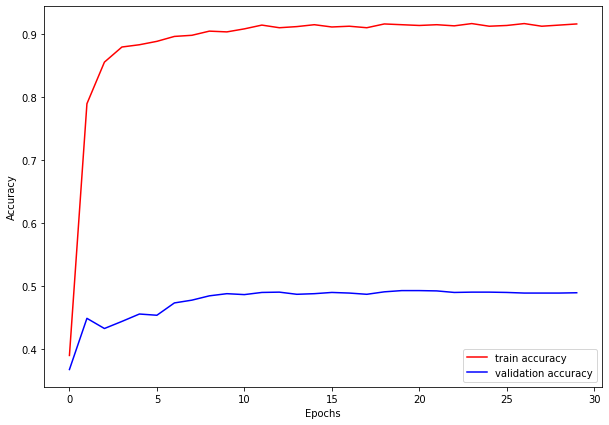

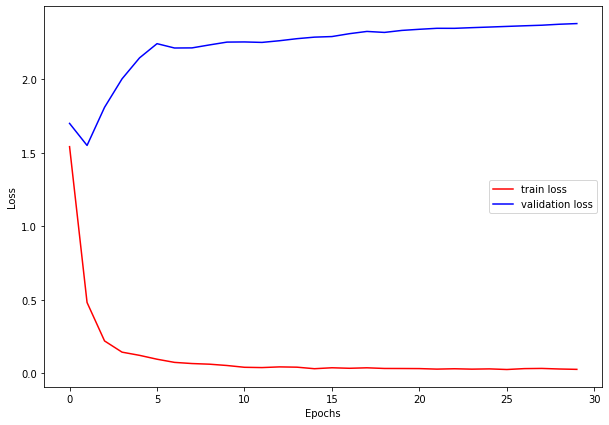

Iteration 6 / 8
lr: 0.0001_wd: 0.0005_gamma: 0.4670010068619903
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.2204830646514893




Train Loss: 2.0569, Train Acc: 0.13
Val Loss: 2.0596, Val Acc: 0.15


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.4707508087158203




Train Loss: 1.5492, Train Acc: 0.42
Val Loss: 1.9187, Val Acc: 0.24


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0967, Train Acc: 0.59
Val Loss: 1.7977, Val Acc: 0.31


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.750863254070282




Train Loss: 0.8440, Train Acc: 0.67
Val Loss: 1.7156, Val Acc: 0.36


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6724, Train Acc: 0.74
Val Loss: 1.6701, Val Acc: 0.39


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.6271759867668152




Train Loss: 0.5460, Train Acc: 0.79
Val Loss: 1.6483, Val Acc: 0.39


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.4074510931968689




Train Loss: 0.4558, Train Acc: 0.81
Val Loss: 1.6443, Val Acc: 0.40


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.3919, Train Acc: 0.83
Val Loss: 1.6488, Val Acc: 0.40


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.34692302346229553




Train Loss: 0.3428, Train Acc: 0.84
Val Loss: 1.6554, Val Acc: 0.41


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3084, Train Acc: 0.86
Val Loss: 1.6667, Val Acc: 0.42


Starting epoch 11/30, LR = [4.670010068619903e-05]
Step 60, Loss 0.32155025005340576




Train Loss: 0.2893, Train Acc: 0.86
Val Loss: 1.6704, Val Acc: 0.42


Starting epoch 12/30, LR = [4.670010068619903e-05]
Step 70, Loss 0.27779674530029297




Train Loss: 0.2786, Train Acc: 0.86
Val Loss: 1.6740, Val Acc: 0.42


Starting epoch 13/30, LR = [4.670010068619903e-05]




Train Loss: 0.2679, Train Acc: 0.86
Val Loss: 1.6774, Val Acc: 0.42


Starting epoch 14/30, LR = [4.670010068619903e-05]
Step 80, Loss 0.289207398891449




Train Loss: 0.2547, Train Acc: 0.86
Val Loss: 1.6802, Val Acc: 0.42


Starting epoch 15/30, LR = [4.670010068619903e-05]




Train Loss: 0.2537, Train Acc: 0.86
Val Loss: 1.6830, Val Acc: 0.42


Starting epoch 16/30, LR = [4.670010068619903e-05]
Step 90, Loss 0.24370624125003815




Train Loss: 0.2423, Train Acc: 0.86
Val Loss: 1.6869, Val Acc: 0.42


Starting epoch 17/30, LR = [4.670010068619903e-05]
Step 100, Loss 0.26455068588256836




Train Loss: 0.2421, Train Acc: 0.87
Val Loss: 1.6900, Val Acc: 0.42


Starting epoch 18/30, LR = [4.670010068619903e-05]




Train Loss: 0.2331, Train Acc: 0.86
Val Loss: 1.6941, Val Acc: 0.43


Starting epoch 19/30, LR = [4.670010068619903e-05]
Step 110, Loss 0.23082934319972992




Train Loss: 0.2216, Train Acc: 0.87
Val Loss: 1.6977, Val Acc: 0.43


Starting epoch 20/30, LR = [4.670010068619903e-05]




Train Loss: 0.2230, Train Acc: 0.87
Val Loss: 1.7011, Val Acc: 0.43


Starting epoch 21/30, LR = [2.1808994041011273e-05]
Step 120, Loss 0.24504247307777405




Train Loss: 0.2116, Train Acc: 0.87
Val Loss: 1.7032, Val Acc: 0.43


Starting epoch 22/30, LR = [2.1808994041011273e-05]
Step 130, Loss 0.2279784381389618




Train Loss: 0.2127, Train Acc: 0.87
Val Loss: 1.7047, Val Acc: 0.43


Starting epoch 23/30, LR = [2.1808994041011273e-05]




Train Loss: 0.2135, Train Acc: 0.87
Val Loss: 1.7059, Val Acc: 0.43


Starting epoch 24/30, LR = [2.1808994041011273e-05]
Step 140, Loss 0.22143055498600006




Train Loss: 0.2103, Train Acc: 0.87
Val Loss: 1.7067, Val Acc: 0.43


Starting epoch 25/30, LR = [2.1808994041011273e-05]




Train Loss: 0.2048, Train Acc: 0.87
Val Loss: 1.7076, Val Acc: 0.43


Starting epoch 26/30, LR = [2.1808994041011273e-05]
Step 150, Loss 0.22190479934215546




Train Loss: 0.2040, Train Acc: 0.87
Val Loss: 1.7087, Val Acc: 0.43


Starting epoch 27/30, LR = [2.1808994041011273e-05]
Step 160, Loss 0.2343931794166565




Train Loss: 0.1924, Train Acc: 0.88
Val Loss: 1.7098, Val Acc: 0.43


Starting epoch 28/30, LR = [2.1808994041011273e-05]




Train Loss: 0.1990, Train Acc: 0.88
Val Loss: 1.7113, Val Acc: 0.43


Starting epoch 29/30, LR = [2.1808994041011273e-05]
Step 170, Loss 0.1932016909122467




Train Loss: 0.1918, Train Acc: 0.88
Val Loss: 1.7129, Val Acc: 0.43


Starting epoch 30/30, LR = [2.1808994041011273e-05]




Train Loss: 0.1977, Train Acc: 0.88
Val Loss: 1.7140, Val Acc: 0.43




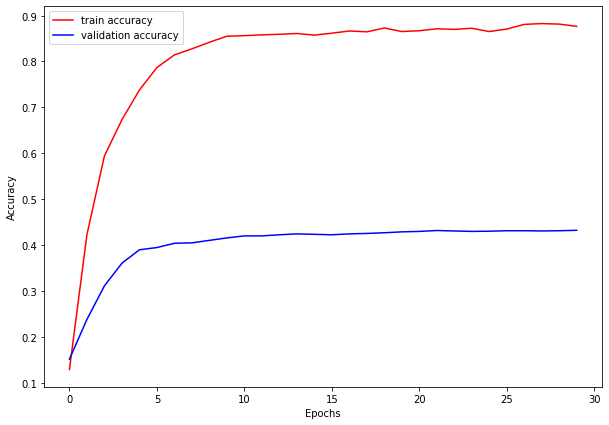

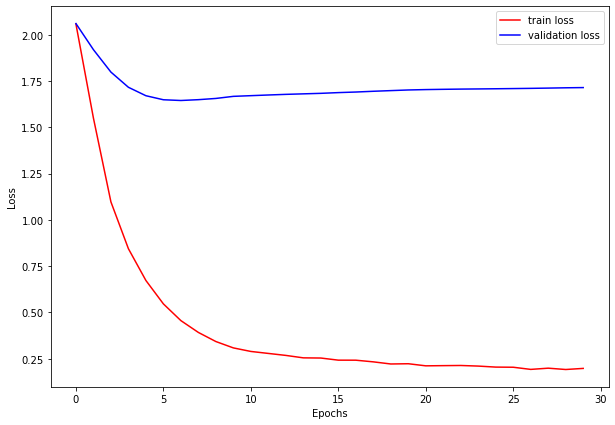

Iteration 7 / 8
lr: 0.0001_wd: 5e-05_gamma: 0.3765277622518681
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.0973095893859863




Train Loss: 1.9768, Train Acc: 0.19
Val Loss: 2.0187, Val Acc: 0.20


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.3248276710510254




Train Loss: 1.4782, Train Acc: 0.48
Val Loss: 1.9035, Val Acc: 0.28


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0295, Train Acc: 0.61
Val Loss: 1.8014, Val Acc: 0.34


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.8567774295806885




Train Loss: 0.7755, Train Acc: 0.72
Val Loss: 1.7278, Val Acc: 0.37


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6153, Train Acc: 0.77
Val Loss: 1.6826, Val Acc: 0.39


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.5687273740768433




Train Loss: 0.5072, Train Acc: 0.80
Val Loss: 1.6619, Val Acc: 0.40


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.4216896891593933




Train Loss: 0.4295, Train Acc: 0.82
Val Loss: 1.6551, Val Acc: 0.40


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.3843, Train Acc: 0.83
Val Loss: 1.6571, Val Acc: 0.41


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.356256902217865




Train Loss: 0.3365, Train Acc: 0.83
Val Loss: 1.6637, Val Acc: 0.41


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3055, Train Acc: 0.85
Val Loss: 1.6706, Val Acc: 0.41


Starting epoch 11/30, LR = [3.765277622518681e-05]
Step 60, Loss 0.27272865176200867




Train Loss: 0.2815, Train Acc: 0.85
Val Loss: 1.6723, Val Acc: 0.41


Starting epoch 12/30, LR = [3.765277622518681e-05]
Step 70, Loss 0.2771473228931427




Train Loss: 0.2748, Train Acc: 0.85
Val Loss: 1.6731, Val Acc: 0.41


Starting epoch 13/30, LR = [3.765277622518681e-05]




Train Loss: 0.2606, Train Acc: 0.86
Val Loss: 1.6742, Val Acc: 0.42


Starting epoch 14/30, LR = [3.765277622518681e-05]
Step 80, Loss 0.257234662771225




Train Loss: 0.2576, Train Acc: 0.85
Val Loss: 1.6752, Val Acc: 0.42


Starting epoch 15/30, LR = [3.765277622518681e-05]




Train Loss: 0.2512, Train Acc: 0.85
Val Loss: 1.6770, Val Acc: 0.41


Starting epoch 16/30, LR = [3.765277622518681e-05]
Step 90, Loss 0.2576875388622284




Train Loss: 0.2422, Train Acc: 0.86
Val Loss: 1.6779, Val Acc: 0.42


Starting epoch 17/30, LR = [3.765277622518681e-05]
Step 100, Loss 0.20677562057971954




Train Loss: 0.2420, Train Acc: 0.86
Val Loss: 1.6797, Val Acc: 0.42


Starting epoch 18/30, LR = [3.765277622518681e-05]




Train Loss: 0.2384, Train Acc: 0.86
Val Loss: 1.6816, Val Acc: 0.42


Starting epoch 19/30, LR = [3.765277622518681e-05]
Step 110, Loss 0.195867121219635




Train Loss: 0.2300, Train Acc: 0.87
Val Loss: 1.6834, Val Acc: 0.42


Starting epoch 20/30, LR = [3.765277622518681e-05]




Train Loss: 0.2312, Train Acc: 0.86
Val Loss: 1.6850, Val Acc: 0.42


Starting epoch 21/30, LR = [1.4177315574639933e-05]
Step 120, Loss 0.20172886550426483




Train Loss: 0.2325, Train Acc: 0.86
Val Loss: 1.6854, Val Acc: 0.42


Starting epoch 22/30, LR = [1.4177315574639933e-05]
Step 130, Loss 0.21754400432109833




Train Loss: 0.2215, Train Acc: 0.86
Val Loss: 1.6861, Val Acc: 0.42


Starting epoch 23/30, LR = [1.4177315574639933e-05]




Train Loss: 0.2263, Train Acc: 0.86
Val Loss: 1.6867, Val Acc: 0.42


Starting epoch 24/30, LR = [1.4177315574639933e-05]
Step 140, Loss 0.19457581639289856




Train Loss: 0.2157, Train Acc: 0.87
Val Loss: 1.6875, Val Acc: 0.43


Starting epoch 25/30, LR = [1.4177315574639933e-05]




Train Loss: 0.2185, Train Acc: 0.86
Val Loss: 1.6877, Val Acc: 0.43


Starting epoch 26/30, LR = [1.4177315574639933e-05]
Step 150, Loss 0.2262011021375656




Train Loss: 0.2218, Train Acc: 0.87
Val Loss: 1.6877, Val Acc: 0.43


Starting epoch 27/30, LR = [1.4177315574639933e-05]
Step 160, Loss 0.24543695151805878




Train Loss: 0.2163, Train Acc: 0.87
Val Loss: 1.6879, Val Acc: 0.43


Starting epoch 28/30, LR = [1.4177315574639933e-05]




Train Loss: 0.2134, Train Acc: 0.87
Val Loss: 1.6886, Val Acc: 0.43


Starting epoch 29/30, LR = [1.4177315574639933e-05]
Step 170, Loss 0.21272049844264984




Train Loss: 0.2108, Train Acc: 0.87
Val Loss: 1.6893, Val Acc: 0.43


Starting epoch 30/30, LR = [1.4177315574639933e-05]




Train Loss: 0.2061, Train Acc: 0.87
Val Loss: 1.6901, Val Acc: 0.43




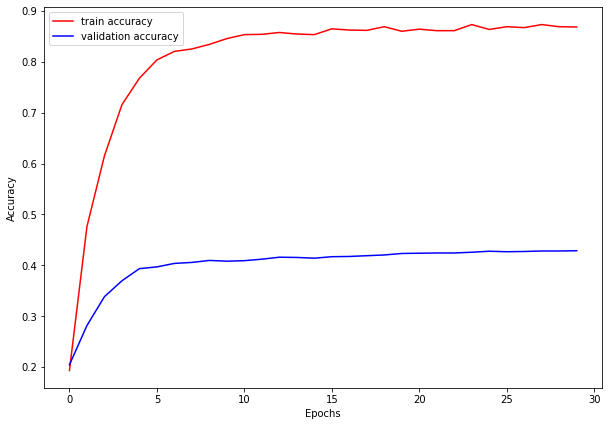

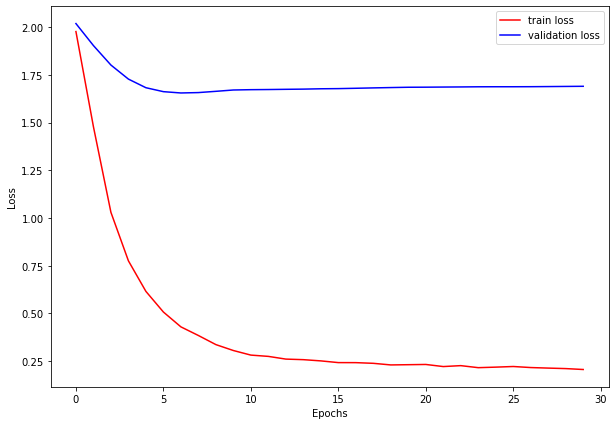

Iteration 8 / 8
lr: 1e-05_wd: 5e-05_gamma: 0.3373137611614161
Starting epoch 1/30, LR = [1e-05]
Step 0, Loss 2.056839942932129




Train Loss: 2.1038, Train Acc: 0.16
Val Loss: 2.1554, Val Acc: 0.12


Starting epoch 2/30, LR = [1e-05]
Step 10, Loss 2.0712685585021973




Train Loss: 2.0570, Train Acc: 0.20
Val Loss: 2.1403, Val Acc: 0.13


Starting epoch 3/30, LR = [1e-05]




Train Loss: 1.9677, Train Acc: 0.24
Val Loss: 2.1217, Val Acc: 0.14


Starting epoch 4/30, LR = [1e-05]
Step 20, Loss 1.8965747356414795




Train Loss: 1.8725, Train Acc: 0.32
Val Loss: 2.1019, Val Acc: 0.15


Starting epoch 5/30, LR = [1e-05]




Train Loss: 1.7716, Train Acc: 0.37
Val Loss: 2.0822, Val Acc: 0.16


Starting epoch 6/30, LR = [1e-05]
Step 30, Loss 1.7597239017486572




Train Loss: 1.6854, Train Acc: 0.40
Val Loss: 2.0633, Val Acc: 0.18


Starting epoch 7/30, LR = [1e-05]
Step 40, Loss 1.5518558025360107




Train Loss: 1.5869, Train Acc: 0.44
Val Loss: 2.0454, Val Acc: 0.19


Starting epoch 8/30, LR = [1e-05]




Train Loss: 1.5019, Train Acc: 0.46
Val Loss: 2.0289, Val Acc: 0.20


Starting epoch 9/30, LR = [1e-05]
Step 50, Loss 1.3661656379699707




Train Loss: 1.4438, Train Acc: 0.49
Val Loss: 2.0134, Val Acc: 0.21


Starting epoch 10/30, LR = [1e-05]




Train Loss: 1.3871, Train Acc: 0.49
Val Loss: 1.9993, Val Acc: 0.22


Starting epoch 11/30, LR = [3.3731376116141613e-06]
Step 60, Loss 1.3499175310134888




Train Loss: 1.3339, Train Acc: 0.51
Val Loss: 1.9949, Val Acc: 0.22


Starting epoch 12/30, LR = [3.3731376116141613e-06]
Step 70, Loss 1.319982886314392




Train Loss: 1.3006, Train Acc: 0.53
Val Loss: 1.9906, Val Acc: 0.22


Starting epoch 13/30, LR = [3.3731376116141613e-06]




Train Loss: 1.2862, Train Acc: 0.53
Val Loss: 1.9864, Val Acc: 0.23


Starting epoch 14/30, LR = [3.3731376116141613e-06]
Step 80, Loss 1.2683771848678589




Train Loss: 1.2705, Train Acc: 0.53
Val Loss: 1.9825, Val Acc: 0.23


Starting epoch 15/30, LR = [3.3731376116141613e-06]




Train Loss: 1.2540, Train Acc: 0.54
Val Loss: 1.9787, Val Acc: 0.23


Starting epoch 16/30, LR = [3.3731376116141613e-06]
Step 90, Loss 1.201521873474121




Train Loss: 1.2471, Train Acc: 0.55
Val Loss: 1.9749, Val Acc: 0.23


Starting epoch 17/30, LR = [3.3731376116141613e-06]
Step 100, Loss 1.2626149654388428




Train Loss: 1.2284, Train Acc: 0.55
Val Loss: 1.9712, Val Acc: 0.23


Starting epoch 18/30, LR = [3.3731376116141613e-06]




Train Loss: 1.2215, Train Acc: 0.55
Val Loss: 1.9676, Val Acc: 0.23


Starting epoch 19/30, LR = [3.3731376116141613e-06]
Step 110, Loss 1.2376598119735718




Train Loss: 1.1903, Train Acc: 0.56
Val Loss: 1.9640, Val Acc: 0.24


Starting epoch 20/30, LR = [3.3731376116141613e-06]




Train Loss: 1.1976, Train Acc: 0.56
Val Loss: 1.9606, Val Acc: 0.24


Starting epoch 21/30, LR = [1.1378057346886088e-06]
Step 120, Loss 1.1178122758865356




Train Loss: 1.1575, Train Acc: 0.56
Val Loss: 1.9594, Val Acc: 0.24


Starting epoch 22/30, LR = [1.1378057346886088e-06]
Step 130, Loss 1.2149872779846191




Train Loss: 1.1719, Train Acc: 0.56
Val Loss: 1.9583, Val Acc: 0.24


Starting epoch 23/30, LR = [1.1378057346886088e-06]




Train Loss: 1.1637, Train Acc: 0.57
Val Loss: 1.9572, Val Acc: 0.24


Starting epoch 24/30, LR = [1.1378057346886088e-06]
Step 140, Loss 1.173373818397522




Train Loss: 1.1558, Train Acc: 0.57
Val Loss: 1.9560, Val Acc: 0.24


Starting epoch 25/30, LR = [1.1378057346886088e-06]




Train Loss: 1.1546, Train Acc: 0.58
Val Loss: 1.9549, Val Acc: 0.24


Starting epoch 26/30, LR = [1.1378057346886088e-06]
Step 150, Loss 1.1116209030151367




Train Loss: 1.1633, Train Acc: 0.58
Val Loss: 1.9538, Val Acc: 0.24


Starting epoch 27/30, LR = [1.1378057346886088e-06]
Step 160, Loss 1.165746808052063




Train Loss: 1.1454, Train Acc: 0.59
Val Loss: 1.9527, Val Acc: 0.24


Starting epoch 28/30, LR = [1.1378057346886088e-06]




Train Loss: 1.1492, Train Acc: 0.58
Val Loss: 1.9517, Val Acc: 0.25


Starting epoch 29/30, LR = [1.1378057346886088e-06]
Step 170, Loss 1.1369216442108154




Train Loss: 1.1394, Train Acc: 0.59
Val Loss: 1.9506, Val Acc: 0.25


Starting epoch 30/30, LR = [1.1378057346886088e-06]




Train Loss: 1.1321, Train Acc: 0.59
Val Loss: 1.9495, Val Acc: 0.25




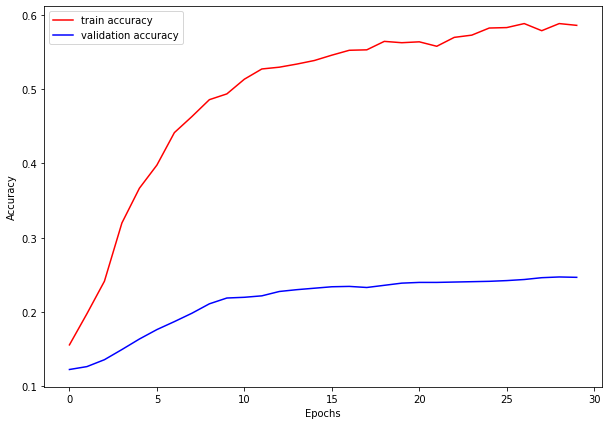

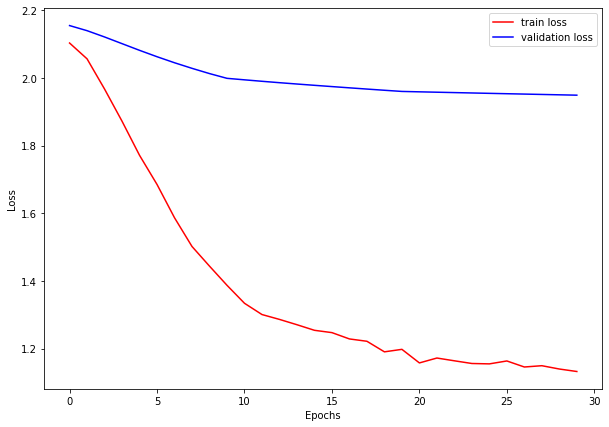

In [ ]:
import random
num_iters=8

for i in range(num_iters):
    print(f'Iteration {i+1} / {num_iters}')
    lr = 10**(-random.randint(2,4))
    wd = 5*10**(-random.randint(4,6))
    gamma = random.uniform(0.1,0.5)
    
    s = f'lr: {lr}_wd: {wd}_gamma: {gamma}'
    print(s)
    net = torchvision.models.alexnet(pretrained=True) 
    net.classifier[6] = nn.Linear(4096, NUM_CLASSES) 
    criterion = nn.CrossEntropyLoss() 
    parameters_to_optimize = net.parameters() 
    optimizer = optim.SGD(parameters_to_optimize, lr=lr, momentum=MOMENTUM, weight_decay=wd)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=gamma)
    training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=target_dataloader)
    
    plot_results(training_loss,training_accuracy,validation_loss,validation_accuracy,"alexnet_noDANN_pretrained_"+s)
    

    

### TESTING THE BEST SET

In [ ]:
DEVICE = 'cuda' 

NUM_CLASSES = 7 

BATCH_SIZE = 256     
                     

LR = 1e-3
MOMENTUM = 0.9       
WEIGHT_DECAY = 5e-6  
ALPHA = 0.1         

NUM_EPOCHS = 30      
STEP_SIZE = 10       
GAMMA = 0.35          
LOG_FREQUENCY = 10

NUM_DOMAINS = 2

In [ ]:

net = alexnet(pretrained = True)
net.classifier[6] = nn.Linear(4096,NUM_CLASSES)
criterion = nn.CrossEntropyLoss() 
domain_criterion = nn.CrossEntropyLoss()

parameters_to_optimize = net.parameters() 


optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)


scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth


In [ ]:
training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=target_dataloader)

Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.2005090713500977




Train Loss: 1.4819, Train Acc: 0.43
Val Loss: 1.7050, Val Acc: 0.37


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.37441378831863403




Train Loss: 0.4778, Train Acc: 0.78
Val Loss: 1.5901, Val Acc: 0.44


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2165, Train Acc: 0.86
Val Loss: 1.9193, Val Acc: 0.43


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.14008113741874695




Train Loss: 0.1345, Train Acc: 0.88
Val Loss: 2.1881, Val Acc: 0.43


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1132, Train Acc: 0.89
Val Loss: 2.3691, Val Acc: 0.44


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.11617099493741989




Train Loss: 0.0944, Train Acc: 0.89
Val Loss: 2.4403, Val Acc: 0.44


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.07796403765678406




Train Loss: 0.0731, Train Acc: 0.90
Val Loss: 2.4421, Val Acc: 0.44


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0645, Train Acc: 0.90
Val Loss: 2.4391, Val Acc: 0.45


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.0655890554189682




Train Loss: 0.0563, Train Acc: 0.90
Val Loss: 2.4432, Val Acc: 0.46


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0488, Train Acc: 0.91
Val Loss: 2.4749, Val Acc: 0.45


Starting epoch 11/30, LR = [0.00035]
Step 60, Loss 0.03983376547694206




Train Loss: 0.0438, Train Acc: 0.91
Val Loss: 2.4769, Val Acc: 0.45


Starting epoch 12/30, LR = [0.00035]
Step 70, Loss 0.05958830565214157




Train Loss: 0.0382, Train Acc: 0.91
Val Loss: 2.4705, Val Acc: 0.45


Starting epoch 13/30, LR = [0.00035]




Train Loss: 0.0401, Train Acc: 0.91
Val Loss: 2.4732, Val Acc: 0.45


Starting epoch 14/30, LR = [0.00035]
Step 80, Loss 0.033615462481975555




Train Loss: 0.0391, Train Acc: 0.91
Val Loss: 2.4725, Val Acc: 0.46


Starting epoch 15/30, LR = [0.00035]




Train Loss: 0.0365, Train Acc: 0.91
Val Loss: 2.4712, Val Acc: 0.46


Starting epoch 16/30, LR = [0.00035]
Step 90, Loss 0.0351034440100193




Train Loss: 0.0325, Train Acc: 0.91
Val Loss: 2.4778, Val Acc: 0.46


Starting epoch 17/30, LR = [0.00035]
Step 100, Loss 0.039713338017463684




Train Loss: 0.0384, Train Acc: 0.91
Val Loss: 2.4752, Val Acc: 0.46


Starting epoch 18/30, LR = [0.00035]




Train Loss: 0.0320, Train Acc: 0.91
Val Loss: 2.4696, Val Acc: 0.46


Starting epoch 19/30, LR = [0.00035]
Step 110, Loss 0.04324604943394661




Train Loss: 0.0291, Train Acc: 0.92
Val Loss: 2.4899, Val Acc: 0.46


Starting epoch 20/30, LR = [0.00035]




Train Loss: 0.0283, Train Acc: 0.91
Val Loss: 2.5024, Val Acc: 0.46


Starting epoch 21/30, LR = [0.0001225]
Step 120, Loss 0.055694133043289185




Train Loss: 0.0325, Train Acc: 0.91
Val Loss: 2.5064, Val Acc: 0.46


Starting epoch 22/30, LR = [0.0001225]
Step 130, Loss 0.03993851691484451




Train Loss: 0.0284, Train Acc: 0.91
Val Loss: 2.5035, Val Acc: 0.46


Starting epoch 23/30, LR = [0.0001225]




Train Loss: 0.0249, Train Acc: 0.91
Val Loss: 2.5045, Val Acc: 0.46


Starting epoch 24/30, LR = [0.0001225]
Step 140, Loss 0.02576853707432747




Train Loss: 0.0317, Train Acc: 0.91
Val Loss: 2.5047, Val Acc: 0.46


Starting epoch 25/30, LR = [0.0001225]




Train Loss: 0.0277, Train Acc: 0.91
Val Loss: 2.5093, Val Acc: 0.46


Starting epoch 26/30, LR = [0.0001225]
Step 150, Loss 0.030685361474752426




Train Loss: 0.0271, Train Acc: 0.91
Val Loss: 2.5190, Val Acc: 0.46


Starting epoch 27/30, LR = [0.0001225]
Step 160, Loss 0.02774817869067192




Train Loss: 0.0317, Train Acc: 0.91
Val Loss: 2.5299, Val Acc: 0.46


Starting epoch 28/30, LR = [0.0001225]




Train Loss: 0.0287, Train Acc: 0.91
Val Loss: 2.5379, Val Acc: 0.45


Starting epoch 29/30, LR = [0.0001225]
Step 170, Loss 0.031901758164167404




Train Loss: 0.0307, Train Acc: 0.91
Val Loss: 2.5437, Val Acc: 0.45


Starting epoch 30/30, LR = [0.0001225]




Train Loss: 0.0244, Train Acc: 0.92
Val Loss: 2.5521, Val Acc: 0.45




In [ ]:
test(net,target_dataloader)


Test Accuracy: 0.45361328125


0.45361328125

## DOMAIN ADAPTATION

### RUNS

Iteration 1 / 8
lr: 1e-05_wd: 4.9999999999999996e-06_gamma: 0.4194920917235244_alpha: 0.47038634629718246
Starting epoch 1/30, LR = [1e-05]




Source class Loss: 1.8640, Train class Acc: 0.31
Target class Loss: 1.8909, Val class Acc: 0.13
Source domain Loss: 0.8325, Source domain Acc: 0.46
Target domain Loss: 0.6668, Target domain Acc: 0.60
Total train Loss: 1.1211, Total train Acc: 0.46
Total domain Loss: 0.7497, Total domain Acc: 0.53


Starting epoch 2/30, LR = [1e-05]




Source class Loss: 1.7870, Train class Acc: 0.37
Target class Loss: 1.7112, Val class Acc: 0.15
Source domain Loss: 0.7617, Source domain Acc: 0.53
Target domain Loss: 0.6089, Target domain Acc: 0.66
Total train Loss: 1.0525, Total train Acc: 0.52
Total domain Loss: 0.6853, Total domain Acc: 0.60


Starting epoch 3/30, LR = [1e-05]




Source class Loss: 1.6711, Train class Acc: 0.44
Target class Loss: 1.5905, Val class Acc: 0.17
Source domain Loss: 0.6808, Source domain Acc: 0.63
Target domain Loss: 0.5474, Target domain Acc: 0.73
Total train Loss: 0.9664, Total train Acc: 0.60
Total domain Loss: 0.6141, Total domain Acc: 0.68


Starting epoch 4/30, LR = [1e-05]




Source class Loss: 1.6026, Train class Acc: 0.46
Target class Loss: 1.5755, Val class Acc: 0.18
Source domain Loss: 0.6012, Source domain Acc: 0.70
Target domain Loss: 0.4798, Target domain Acc: 0.78
Total train Loss: 0.8945, Total train Acc: 0.65
Total domain Loss: 0.5405, Total domain Acc: 0.74


Starting epoch 5/30, LR = [1e-05]




Source class Loss: 1.4846, Train class Acc: 0.50
Target class Loss: 1.3851, Val class Acc: 0.19
Source domain Loss: 0.5318, Source domain Acc: 0.76
Target domain Loss: 0.4383, Target domain Acc: 0.80
Total train Loss: 0.8182, Total train Acc: 0.69
Total domain Loss: 0.4850, Total domain Acc: 0.78


Starting epoch 6/30, LR = [1e-05]




Source class Loss: 1.4098, Train class Acc: 0.51
Target class Loss: 1.4426, Val class Acc: 0.20
Source domain Loss: 0.4815, Source domain Acc: 0.80
Target domain Loss: 0.4033, Target domain Acc: 0.83
Total train Loss: 0.7648, Total train Acc: 0.72
Total domain Loss: 0.4424, Total domain Acc: 0.82


Starting epoch 7/30, LR = [1e-05]




Source class Loss: 1.3247, Train class Acc: 0.54
Target class Loss: 1.3438, Val class Acc: 0.22
Source domain Loss: 0.4358, Source domain Acc: 0.81
Target domain Loss: 0.3827, Target domain Acc: 0.84
Total train Loss: 0.7144, Total train Acc: 0.73
Total domain Loss: 0.4093, Total domain Acc: 0.83


Starting epoch 8/30, LR = [1e-05]




Source class Loss: 1.2623, Train class Acc: 0.56
Target class Loss: 1.2547, Val class Acc: 0.23
Source domain Loss: 0.4090, Source domain Acc: 0.83
Target domain Loss: 0.3571, Target domain Acc: 0.86
Total train Loss: 0.6761, Total train Acc: 0.75
Total domain Loss: 0.3831, Total domain Acc: 0.84


Starting epoch 9/30, LR = [1e-05]




Source class Loss: 1.2144, Train class Acc: 0.58
Target class Loss: 1.1960, Val class Acc: 0.23
Source domain Loss: 0.4009, Source domain Acc: 0.83
Target domain Loss: 0.3390, Target domain Acc: 0.87
Total train Loss: 0.6514, Total train Acc: 0.76
Total domain Loss: 0.3699, Total domain Acc: 0.85


Starting epoch 10/30, LR = [1e-05]




Source class Loss: 1.1547, Train class Acc: 0.61
Target class Loss: 1.1026, Val class Acc: 0.24
Source domain Loss: 0.3681, Source domain Acc: 0.85
Target domain Loss: 0.3268, Target domain Acc: 0.87
Total train Loss: 0.6165, Total train Acc: 0.78
Total domain Loss: 0.3475, Total domain Acc: 0.86


Starting epoch 11/30, LR = [4.194920917235245e-06]




Source class Loss: 1.1137, Train class Acc: 0.61
Target class Loss: 1.1314, Val class Acc: 0.24
Source domain Loss: 0.3370, Source domain Acc: 0.87
Target domain Loss: 0.3204, Target domain Acc: 0.87
Total train Loss: 0.5904, Total train Acc: 0.78
Total domain Loss: 0.3287, Total domain Acc: 0.87


Starting epoch 12/30, LR = [4.194920917235245e-06]




Source class Loss: 1.0987, Train class Acc: 0.62
Target class Loss: 1.1279, Val class Acc: 0.25
Source domain Loss: 0.3459, Source domain Acc: 0.87
Target domain Loss: 0.3026, Target domain Acc: 0.89
Total train Loss: 0.5824, Total train Acc: 0.79
Total domain Loss: 0.3242, Total domain Acc: 0.88


Starting epoch 13/30, LR = [4.194920917235245e-06]




Source class Loss: 1.0707, Train class Acc: 0.64
Target class Loss: 1.0790, Val class Acc: 0.25
Source domain Loss: 0.3394, Source domain Acc: 0.87
Target domain Loss: 0.3001, Target domain Acc: 0.88
Total train Loss: 0.5701, Total train Acc: 0.80
Total domain Loss: 0.3198, Total domain Acc: 0.88


Starting epoch 14/30, LR = [4.194920917235245e-06]




Source class Loss: 1.0599, Train class Acc: 0.64
Target class Loss: 1.0621, Val class Acc: 0.25
Source domain Loss: 0.3430, Source domain Acc: 0.86
Target domain Loss: 0.2999, Target domain Acc: 0.87
Total train Loss: 0.5676, Total train Acc: 0.79
Total domain Loss: 0.3215, Total domain Acc: 0.87


Starting epoch 15/30, LR = [4.194920917235245e-06]




Source class Loss: 1.0386, Train class Acc: 0.64
Target class Loss: 1.0692, Val class Acc: 0.25
Source domain Loss: 0.3387, Source domain Acc: 0.87
Target domain Loss: 0.2980, Target domain Acc: 0.88
Total train Loss: 0.5584, Total train Acc: 0.80
Total domain Loss: 0.3183, Total domain Acc: 0.88


Starting epoch 16/30, LR = [4.194920917235245e-06]




Source class Loss: 1.0401, Train class Acc: 0.65
Target class Loss: 1.0563, Val class Acc: 0.26
Source domain Loss: 0.3291, Source domain Acc: 0.87
Target domain Loss: 0.2914, Target domain Acc: 0.88
Total train Loss: 0.5535, Total train Acc: 0.80
Total domain Loss: 0.3103, Total domain Acc: 0.87


Starting epoch 17/30, LR = [4.194920917235245e-06]




Source class Loss: 1.0149, Train class Acc: 0.65
Target class Loss: 1.0475, Val class Acc: 0.26
Source domain Loss: 0.3229, Source domain Acc: 0.87
Target domain Loss: 0.2878, Target domain Acc: 0.88
Total train Loss: 0.5418, Total train Acc: 0.80
Total domain Loss: 0.3053, Total domain Acc: 0.87


Starting epoch 18/30, LR = [4.194920917235245e-06]




Source class Loss: 1.0063, Train class Acc: 0.66
Target class Loss: 1.0267, Val class Acc: 0.26
Source domain Loss: 0.3166, Source domain Acc: 0.87
Target domain Loss: 0.2840, Target domain Acc: 0.89
Total train Loss: 0.5356, Total train Acc: 0.81
Total domain Loss: 0.3003, Total domain Acc: 0.88


Starting epoch 19/30, LR = [4.194920917235245e-06]




Source class Loss: 0.9824, Train class Acc: 0.67
Target class Loss: 1.0718, Val class Acc: 0.26
Source domain Loss: 0.3125, Source domain Acc: 0.88
Target domain Loss: 0.2815, Target domain Acc: 0.89
Total train Loss: 0.5255, Total train Acc: 0.82
Total domain Loss: 0.2970, Total domain Acc: 0.89


Starting epoch 20/30, LR = [4.194920917235245e-06]




Source class Loss: 0.9545, Train class Acc: 0.68
Target class Loss: 0.9519, Val class Acc: 0.26
Source domain Loss: 0.3094, Source domain Acc: 0.88
Target domain Loss: 0.2783, Target domain Acc: 0.89
Total train Loss: 0.5140, Total train Acc: 0.82
Total domain Loss: 0.2938, Total domain Acc: 0.89


Starting epoch 21/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9444, Train class Acc: 0.68
Target class Loss: 0.9151, Val class Acc: 0.26
Source domain Loss: 0.3033, Source domain Acc: 0.89
Target domain Loss: 0.2682, Target domain Acc: 0.90
Total train Loss: 0.5053, Total train Acc: 0.82
Total domain Loss: 0.2857, Total domain Acc: 0.89


Starting epoch 22/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9590, Train class Acc: 0.68
Target class Loss: 0.9516, Val class Acc: 0.26
Source domain Loss: 0.3077, Source domain Acc: 0.88
Target domain Loss: 0.2723, Target domain Acc: 0.89
Total train Loss: 0.5130, Total train Acc: 0.82
Total domain Loss: 0.2900, Total domain Acc: 0.89


Starting epoch 23/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9474, Train class Acc: 0.68
Target class Loss: 0.9495, Val class Acc: 0.26
Source domain Loss: 0.3035, Source domain Acc: 0.88
Target domain Loss: 0.2645, Target domain Acc: 0.89
Total train Loss: 0.5051, Total train Acc: 0.82
Total domain Loss: 0.2840, Total domain Acc: 0.88


Starting epoch 24/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9406, Train class Acc: 0.69
Target class Loss: 0.8974, Val class Acc: 0.27
Source domain Loss: 0.3027, Source domain Acc: 0.89
Target domain Loss: 0.2750, Target domain Acc: 0.89
Total train Loss: 0.5061, Total train Acc: 0.82
Total domain Loss: 0.2888, Total domain Acc: 0.89


Starting epoch 25/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9198, Train class Acc: 0.69
Target class Loss: 0.9161, Val class Acc: 0.27
Source domain Loss: 0.2935, Source domain Acc: 0.89
Target domain Loss: 0.2688, Target domain Acc: 0.90
Total train Loss: 0.4940, Total train Acc: 0.82
Total domain Loss: 0.2811, Total domain Acc: 0.89


Starting epoch 26/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9264, Train class Acc: 0.69
Target class Loss: 0.9063, Val class Acc: 0.27
Source domain Loss: 0.3039, Source domain Acc: 0.89
Target domain Loss: 0.2668, Target domain Acc: 0.90
Total train Loss: 0.4990, Total train Acc: 0.83
Total domain Loss: 0.2853, Total domain Acc: 0.89


Starting epoch 27/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9370, Train class Acc: 0.70
Target class Loss: 0.9299, Val class Acc: 0.27
Source domain Loss: 0.3009, Source domain Acc: 0.88
Target domain Loss: 0.2622, Target domain Acc: 0.90
Total train Loss: 0.5000, Total train Acc: 0.83
Total domain Loss: 0.2815, Total domain Acc: 0.89


Starting epoch 28/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9138, Train class Acc: 0.71
Target class Loss: 0.8713, Val class Acc: 0.27
Source domain Loss: 0.2938, Source domain Acc: 0.90
Target domain Loss: 0.2590, Target domain Acc: 0.90
Total train Loss: 0.4889, Total train Acc: 0.83
Total domain Loss: 0.2764, Total domain Acc: 0.90


Starting epoch 29/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.9084, Train class Acc: 0.71
Target class Loss: 0.9297, Val class Acc: 0.27
Source domain Loss: 0.2937, Source domain Acc: 0.88
Target domain Loss: 0.2591, Target domain Acc: 0.90
Total train Loss: 0.4871, Total train Acc: 0.83
Total domain Loss: 0.2764, Total domain Acc: 0.89


Starting epoch 30/30, LR = [1.7597361501857784e-06]




Source class Loss: 0.8944, Train class Acc: 0.71
Target class Loss: 0.8944, Val class Acc: 0.27
Source domain Loss: 0.2905, Source domain Acc: 0.89
Target domain Loss: 0.2657, Target domain Acc: 0.89
Total train Loss: 0.4835, Total train Acc: 0.83
Total domain Loss: 0.2781, Total domain Acc: 0.89




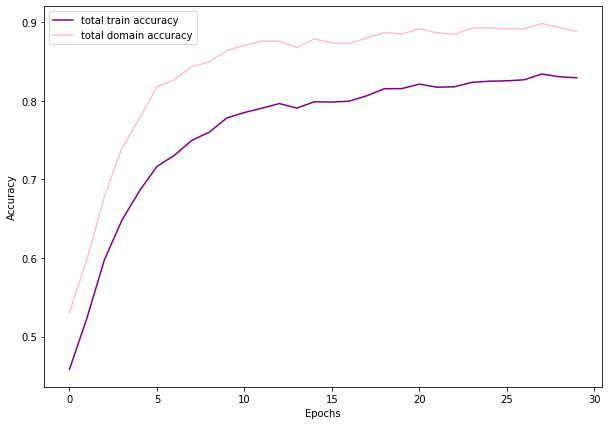

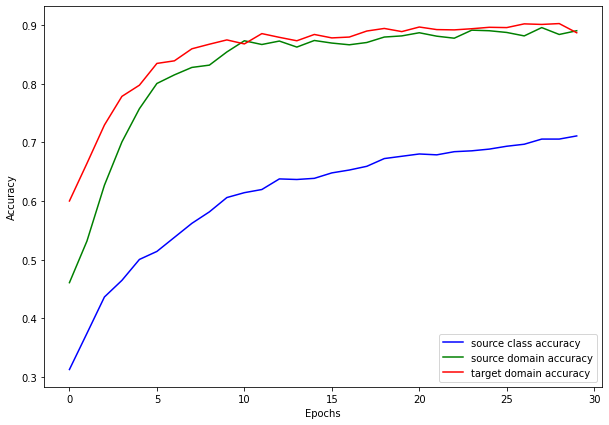

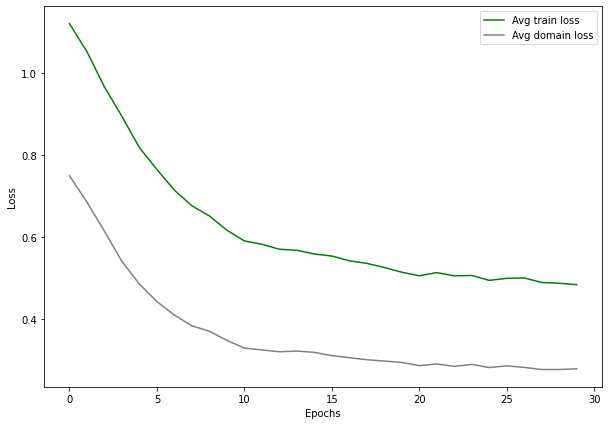

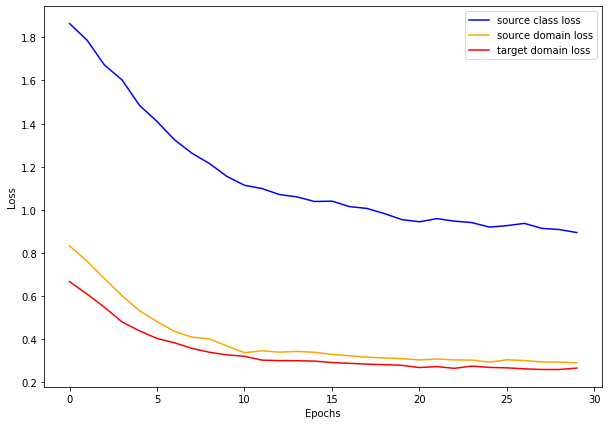

Iteration 2 / 8
lr: 0.0001_wd: 0.0005_gamma: 0.31671191921198727_alpha: 0.12446266313286965
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.9974, Train class Acc: 0.22
Target class Loss: 1.6315, Val class Acc: 0.19
Source domain Loss: 0.5140, Source domain Acc: 0.77
Target domain Loss: 0.8452, Target domain Acc: 0.47
Total train Loss: 1.1189, Total train Acc: 0.48
Total domain Loss: 0.6796, Total domain Acc: 0.62


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.3375, Train class Acc: 0.56
Target class Loss: 1.1055, Val class Acc: 0.29
Source domain Loss: 0.5344, Source domain Acc: 0.74
Target domain Loss: 0.2357, Target domain Acc: 0.93
Total train Loss: 0.7025, Total train Acc: 0.74
Total domain Loss: 0.3850, Total domain Acc: 0.83


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.9008, Train class Acc: 0.71
Target class Loss: 0.7966, Val class Acc: 0.36
Source domain Loss: 0.3034, Source domain Acc: 0.87
Target domain Loss: 0.2336, Target domain Acc: 0.90
Total train Loss: 0.4792, Total train Acc: 0.83
Total domain Loss: 0.2685, Total domain Acc: 0.89


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.6667, Train class Acc: 0.81
Target class Loss: 0.5710, Val class Acc: 0.38
Source domain Loss: 0.1917, Source domain Acc: 0.93
Target domain Loss: 0.2460, Target domain Acc: 0.89
Total train Loss: 0.3681, Total train Acc: 0.88
Total domain Loss: 0.2188, Total domain Acc: 0.91


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.4932, Train class Acc: 0.86
Target class Loss: 0.4659, Val class Acc: 0.39
Source domain Loss: 0.1837, Source domain Acc: 0.93
Target domain Loss: 0.1937, Target domain Acc: 0.92
Total train Loss: 0.2902, Total train Acc: 0.91
Total domain Loss: 0.1887, Total domain Acc: 0.93


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.4101, Train class Acc: 0.90
Target class Loss: 0.3537, Val class Acc: 0.39
Source domain Loss: 0.2091, Source domain Acc: 0.92
Target domain Loss: 0.1533, Target domain Acc: 0.94
Total train Loss: 0.2575, Total train Acc: 0.92
Total domain Loss: 0.1812, Total domain Acc: 0.93


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.3320, Train class Acc: 0.92
Target class Loss: 0.2899, Val class Acc: 0.39
Source domain Loss: 0.1858, Source domain Acc: 0.93
Target domain Loss: 0.1535, Target domain Acc: 0.94
Total train Loss: 0.2237, Total train Acc: 0.93
Total domain Loss: 0.1696, Total domain Acc: 0.93


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.3055, Train class Acc: 0.92
Target class Loss: 0.3232, Val class Acc: 0.39
Source domain Loss: 0.1611, Source domain Acc: 0.94
Target domain Loss: 0.1611, Target domain Acc: 0.94
Total train Loss: 0.2092, Total train Acc: 0.93
Total domain Loss: 0.1611, Total domain Acc: 0.94


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2689, Train class Acc: 0.93
Target class Loss: 0.2850, Val class Acc: 0.39
Source domain Loss: 0.1581, Source domain Acc: 0.94
Target domain Loss: 0.1465, Target domain Acc: 0.94
Total train Loss: 0.1912, Total train Acc: 0.94
Total domain Loss: 0.1523, Total domain Acc: 0.94


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2404, Train class Acc: 0.94
Target class Loss: 0.2552, Val class Acc: 0.39
Source domain Loss: 0.1396, Source domain Acc: 0.95
Target domain Loss: 0.1488, Target domain Acc: 0.94
Total train Loss: 0.1763, Total train Acc: 0.94
Total domain Loss: 0.1442, Total domain Acc: 0.95


Starting epoch 11/30, LR = [3.167119192119873e-05]




Source class Loss: 0.2211, Train class Acc: 0.94
Target class Loss: 0.2040, Val class Acc: 0.39
Source domain Loss: 0.1291, Source domain Acc: 0.95
Target domain Loss: 0.1408, Target domain Acc: 0.94
Total train Loss: 0.1637, Total train Acc: 0.94
Total domain Loss: 0.1350, Total domain Acc: 0.95


Starting epoch 12/30, LR = [3.167119192119873e-05]




Source class Loss: 0.2161, Train class Acc: 0.94
Target class Loss: 0.1726, Val class Acc: 0.39
Source domain Loss: 0.1391, Source domain Acc: 0.95
Target domain Loss: 0.1262, Target domain Acc: 0.95
Total train Loss: 0.1605, Total train Acc: 0.95
Total domain Loss: 0.1327, Total domain Acc: 0.95


Starting epoch 13/30, LR = [3.167119192119873e-05]




Source class Loss: 0.2100, Train class Acc: 0.94
Target class Loss: 0.2030, Val class Acc: 0.39
Source domain Loss: 0.1403, Source domain Acc: 0.95
Target domain Loss: 0.1225, Target domain Acc: 0.95
Total train Loss: 0.1576, Total train Acc: 0.95
Total domain Loss: 0.1314, Total domain Acc: 0.95


Starting epoch 14/30, LR = [3.167119192119873e-05]




Source class Loss: 0.2076, Train class Acc: 0.95
Target class Loss: 0.2244, Val class Acc: 0.39
Source domain Loss: 0.1493, Source domain Acc: 0.95
Target domain Loss: 0.1308, Target domain Acc: 0.95
Total train Loss: 0.1625, Total train Acc: 0.95
Total domain Loss: 0.1400, Total domain Acc: 0.95


Starting epoch 15/30, LR = [3.167119192119873e-05]




Source class Loss: 0.2056, Train class Acc: 0.94
Target class Loss: 0.2290, Val class Acc: 0.39
Source domain Loss: 0.1372, Source domain Acc: 0.95
Target domain Loss: 0.1237, Target domain Acc: 0.95
Total train Loss: 0.1555, Total train Acc: 0.95
Total domain Loss: 0.1305, Total domain Acc: 0.95


Starting epoch 16/30, LR = [3.167119192119873e-05]




Source class Loss: 0.1969, Train class Acc: 0.95
Target class Loss: 0.1506, Val class Acc: 0.39
Source domain Loss: 0.1321, Source domain Acc: 0.95
Target domain Loss: 0.1438, Target domain Acc: 0.94
Total train Loss: 0.1576, Total train Acc: 0.95
Total domain Loss: 0.1380, Total domain Acc: 0.94


Starting epoch 17/30, LR = [3.167119192119873e-05]




Source class Loss: 0.1973, Train class Acc: 0.95
Target class Loss: 0.1979, Val class Acc: 0.40
Source domain Loss: 0.1287, Source domain Acc: 0.95
Target domain Loss: 0.1309, Target domain Acc: 0.95
Total train Loss: 0.1523, Total train Acc: 0.95
Total domain Loss: 0.1298, Total domain Acc: 0.95


Starting epoch 18/30, LR = [3.167119192119873e-05]




Source class Loss: 0.1901, Train class Acc: 0.94
Target class Loss: 0.1763, Val class Acc: 0.40
Source domain Loss: 0.1323, Source domain Acc: 0.95
Target domain Loss: 0.1232, Target domain Acc: 0.95
Total train Loss: 0.1485, Total train Acc: 0.95
Total domain Loss: 0.1277, Total domain Acc: 0.95


Starting epoch 19/30, LR = [3.167119192119873e-05]




Source class Loss: 0.1880, Train class Acc: 0.95
Target class Loss: 0.1908, Val class Acc: 0.40
Source domain Loss: 0.1274, Source domain Acc: 0.95
Target domain Loss: 0.1189, Target domain Acc: 0.95
Total train Loss: 0.1448, Total train Acc: 0.95
Total domain Loss: 0.1232, Total domain Acc: 0.95


Starting epoch 20/30, LR = [3.167119192119873e-05]




Source class Loss: 0.1824, Train class Acc: 0.96
Target class Loss: 0.2074, Val class Acc: 0.40
Source domain Loss: 0.1323, Source domain Acc: 0.95
Target domain Loss: 0.1207, Target domain Acc: 0.95
Total train Loss: 0.1451, Total train Acc: 0.95
Total domain Loss: 0.1265, Total domain Acc: 0.95


Starting epoch 21/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1779, Train class Acc: 0.95
Target class Loss: 0.1248, Val class Acc: 0.40
Source domain Loss: 0.1309, Source domain Acc: 0.95
Target domain Loss: 0.1176, Target domain Acc: 0.95
Total train Loss: 0.1421, Total train Acc: 0.95
Total domain Loss: 0.1243, Total domain Acc: 0.95


Starting epoch 22/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1854, Train class Acc: 0.95
Target class Loss: 0.1732, Val class Acc: 0.40
Source domain Loss: 0.1260, Source domain Acc: 0.95
Target domain Loss: 0.1222, Target domain Acc: 0.95
Total train Loss: 0.1445, Total train Acc: 0.95
Total domain Loss: 0.1241, Total domain Acc: 0.95


Starting epoch 23/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1786, Train class Acc: 0.95
Target class Loss: 0.1641, Val class Acc: 0.40
Source domain Loss: 0.1248, Source domain Acc: 0.95
Target domain Loss: 0.1133, Target domain Acc: 0.96
Total train Loss: 0.1389, Total train Acc: 0.95
Total domain Loss: 0.1190, Total domain Acc: 0.95


Starting epoch 24/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1740, Train class Acc: 0.96
Target class Loss: 0.1728, Val class Acc: 0.40
Source domain Loss: 0.1213, Source domain Acc: 0.95
Target domain Loss: 0.1235, Target domain Acc: 0.95
Total train Loss: 0.1396, Total train Acc: 0.95
Total domain Loss: 0.1224, Total domain Acc: 0.95


Starting epoch 25/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1818, Train class Acc: 0.95
Target class Loss: 0.1974, Val class Acc: 0.40
Source domain Loss: 0.1151, Source domain Acc: 0.96
Target domain Loss: 0.1221, Target domain Acc: 0.95
Total train Loss: 0.1397, Total train Acc: 0.95
Total domain Loss: 0.1186, Total domain Acc: 0.95


Starting epoch 26/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1697, Train class Acc: 0.96
Target class Loss: 0.1401, Val class Acc: 0.40
Source domain Loss: 0.1219, Source domain Acc: 0.95
Target domain Loss: 0.1180, Target domain Acc: 0.95
Total train Loss: 0.1365, Total train Acc: 0.95
Total domain Loss: 0.1199, Total domain Acc: 0.95


Starting epoch 27/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1793, Train class Acc: 0.95
Target class Loss: 0.1909, Val class Acc: 0.40
Source domain Loss: 0.1243, Source domain Acc: 0.95
Target domain Loss: 0.1213, Target domain Acc: 0.95
Total train Loss: 0.1416, Total train Acc: 0.95
Total domain Loss: 0.1228, Total domain Acc: 0.95


Starting epoch 28/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1730, Train class Acc: 0.95
Target class Loss: 0.1421, Val class Acc: 0.40
Source domain Loss: 0.1245, Source domain Acc: 0.95
Target domain Loss: 0.1240, Target domain Acc: 0.95
Total train Loss: 0.1405, Total train Acc: 0.95
Total domain Loss: 0.1242, Total domain Acc: 0.95


Starting epoch 29/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1770, Train class Acc: 0.95
Target class Loss: 0.1951, Val class Acc: 0.40
Source domain Loss: 0.1266, Source domain Acc: 0.95
Target domain Loss: 0.1173, Target domain Acc: 0.95
Total train Loss: 0.1403, Total train Acc: 0.95
Total domain Loss: 0.1220, Total domain Acc: 0.95


Starting epoch 30/30, LR = [1.0030643977094036e-05]




Source class Loss: 0.1735, Train class Acc: 0.95
Target class Loss: 0.2082, Val class Acc: 0.40
Source domain Loss: 0.1264, Source domain Acc: 0.95
Target domain Loss: 0.1165, Target domain Acc: 0.95
Total train Loss: 0.1388, Total train Acc: 0.95
Total domain Loss: 0.1214, Total domain Acc: 0.95




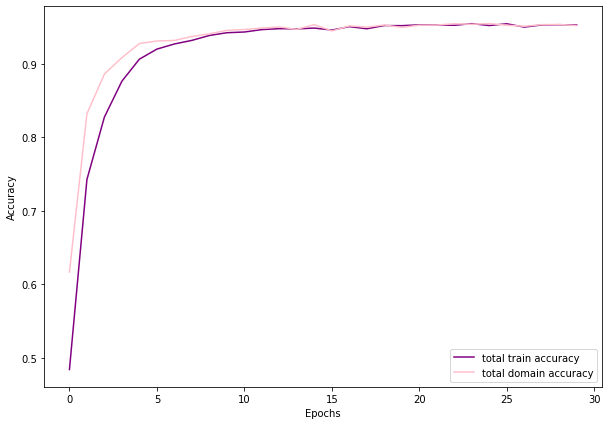

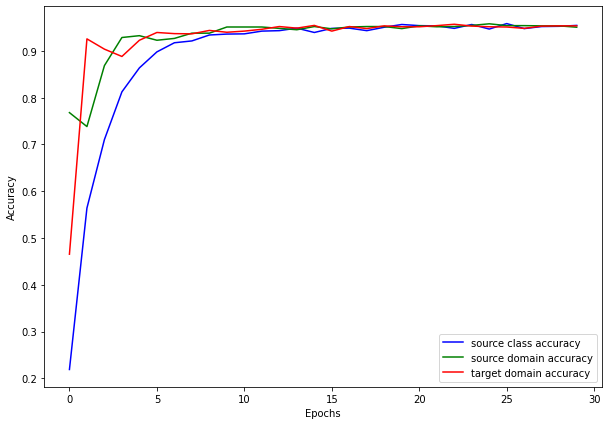

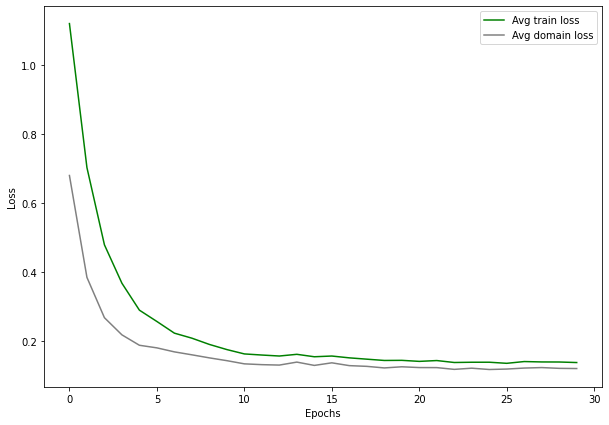

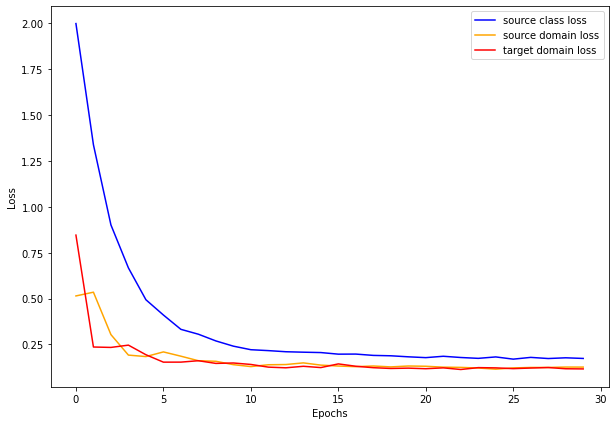

Iteration 3 / 8
lr: 0.0001_wd: 5e-05_gamma: 0.13777655884303308_alpha: 0.28639244888519433
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 2.0581, Train class Acc: 0.22
Target class Loss: 1.6981, Val class Acc: 0.15
Source domain Loss: 0.7047, Source domain Acc: 0.59
Target domain Loss: 0.5760, Target domain Acc: 0.71
Total train Loss: 1.1129, Total train Acc: 0.50
Total domain Loss: 0.6403, Total domain Acc: 0.65


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.3856, Train class Acc: 0.55
Target class Loss: 1.1291, Val class Acc: 0.26
Source domain Loss: 0.3689, Source domain Acc: 0.85
Target domain Loss: 0.3530, Target domain Acc: 0.85
Total train Loss: 0.7025, Total train Acc: 0.75
Total domain Loss: 0.3609, Total domain Acc: 0.85


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.9710, Train class Acc: 0.67
Target class Loss: 0.8739, Val class Acc: 0.32
Source domain Loss: 0.2641, Source domain Acc: 0.89
Target domain Loss: 0.2509, Target domain Acc: 0.89
Total train Loss: 0.4953, Total train Acc: 0.82
Total domain Loss: 0.2575, Total domain Acc: 0.89


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.7012, Train class Acc: 0.79
Target class Loss: 0.6083, Val class Acc: 0.36
Source domain Loss: 0.2292, Source domain Acc: 0.90
Target domain Loss: 0.1956, Target domain Acc: 0.92
Total train Loss: 0.3754, Total train Acc: 0.87
Total domain Loss: 0.2124, Total domain Acc: 0.91


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.5529, Train class Acc: 0.85
Target class Loss: 0.4935, Val class Acc: 0.37
Source domain Loss: 0.2009, Source domain Acc: 0.92
Target domain Loss: 0.1804, Target domain Acc: 0.92
Total train Loss: 0.3114, Total train Acc: 0.90
Total domain Loss: 0.1907, Total domain Acc: 0.92


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.4280, Train class Acc: 0.88
Target class Loss: 0.3740, Val class Acc: 0.38
Source domain Loss: 0.1792, Source domain Acc: 0.93
Target domain Loss: 0.1753, Target domain Acc: 0.92
Total train Loss: 0.2608, Total train Acc: 0.91
Total domain Loss: 0.1772, Total domain Acc: 0.93


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.3571, Train class Acc: 0.91
Target class Loss: 0.3326, Val class Acc: 0.38
Source domain Loss: 0.1802, Source domain Acc: 0.93
Target domain Loss: 0.1550, Target domain Acc: 0.94
Total train Loss: 0.2307, Total train Acc: 0.93
Total domain Loss: 0.1676, Total domain Acc: 0.94


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.3005, Train class Acc: 0.93
Target class Loss: 0.3141, Val class Acc: 0.39
Source domain Loss: 0.1543, Source domain Acc: 0.94
Target domain Loss: 0.1521, Target domain Acc: 0.94
Total train Loss: 0.2023, Total train Acc: 0.94
Total domain Loss: 0.1532, Total domain Acc: 0.94


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2813, Train class Acc: 0.93
Target class Loss: 0.3019, Val class Acc: 0.39
Source domain Loss: 0.1411, Source domain Acc: 0.95
Target domain Loss: 0.1441, Target domain Acc: 0.94
Total train Loss: 0.1888, Total train Acc: 0.94
Total domain Loss: 0.1426, Total domain Acc: 0.94


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2529, Train class Acc: 0.93
Target class Loss: 0.2648, Val class Acc: 0.40
Source domain Loss: 0.1451, Source domain Acc: 0.95
Target domain Loss: 0.1360, Target domain Acc: 0.95
Total train Loss: 0.1780, Total train Acc: 0.94
Total domain Loss: 0.1405, Total domain Acc: 0.95


Starting epoch 11/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2336, Train class Acc: 0.94
Target class Loss: 0.2467, Val class Acc: 0.40
Source domain Loss: 0.1416, Source domain Acc: 0.94
Target domain Loss: 0.1341, Target domain Acc: 0.95
Total train Loss: 0.1698, Total train Acc: 0.94
Total domain Loss: 0.1379, Total domain Acc: 0.94


Starting epoch 12/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2258, Train class Acc: 0.94
Target class Loss: 0.1962, Val class Acc: 0.40
Source domain Loss: 0.1342, Source domain Acc: 0.95
Target domain Loss: 0.1266, Target domain Acc: 0.95
Total train Loss: 0.1622, Total train Acc: 0.95
Total domain Loss: 0.1304, Total domain Acc: 0.95


Starting epoch 13/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2236, Train class Acc: 0.94
Target class Loss: 0.2208, Val class Acc: 0.40
Source domain Loss: 0.1378, Source domain Acc: 0.95
Target domain Loss: 0.1343, Target domain Acc: 0.95
Total train Loss: 0.1652, Total train Acc: 0.95
Total domain Loss: 0.1361, Total domain Acc: 0.95


Starting epoch 14/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2240, Train class Acc: 0.94
Target class Loss: 0.1876, Val class Acc: 0.40
Source domain Loss: 0.1345, Source domain Acc: 0.95
Target domain Loss: 0.1319, Target domain Acc: 0.95
Total train Loss: 0.1635, Total train Acc: 0.95
Total domain Loss: 0.1332, Total domain Acc: 0.95


Starting epoch 15/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2252, Train class Acc: 0.94
Target class Loss: 0.2075, Val class Acc: 0.40
Source domain Loss: 0.1417, Source domain Acc: 0.95
Target domain Loss: 0.1372, Target domain Acc: 0.94
Total train Loss: 0.1680, Total train Acc: 0.94
Total domain Loss: 0.1394, Total domain Acc: 0.95


Starting epoch 16/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2068, Train class Acc: 0.95
Target class Loss: 0.2179, Val class Acc: 0.40
Source domain Loss: 0.1337, Source domain Acc: 0.95
Target domain Loss: 0.1335, Target domain Acc: 0.95
Total train Loss: 0.1580, Total train Acc: 0.95
Total domain Loss: 0.1336, Total domain Acc: 0.95


Starting epoch 17/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2132, Train class Acc: 0.94
Target class Loss: 0.2232, Val class Acc: 0.40
Source domain Loss: 0.1308, Source domain Acc: 0.95
Target domain Loss: 0.1362, Target domain Acc: 0.95
Total train Loss: 0.1601, Total train Acc: 0.95
Total domain Loss: 0.1335, Total domain Acc: 0.95


Starting epoch 18/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2213, Train class Acc: 0.94
Target class Loss: 0.2226, Val class Acc: 0.40
Source domain Loss: 0.1362, Source domain Acc: 0.95
Target domain Loss: 0.1339, Target domain Acc: 0.95
Total train Loss: 0.1638, Total train Acc: 0.95
Total domain Loss: 0.1350, Total domain Acc: 0.95


Starting epoch 19/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2179, Train class Acc: 0.95
Target class Loss: 0.2295, Val class Acc: 0.40
Source domain Loss: 0.1383, Source domain Acc: 0.95
Target domain Loss: 0.1323, Target domain Acc: 0.95
Total train Loss: 0.1628, Total train Acc: 0.95
Total domain Loss: 0.1353, Total domain Acc: 0.95


Starting epoch 20/30, LR = [1.3777655884303309e-05]




Source class Loss: 0.2135, Train class Acc: 0.94
Target class Loss: 0.2647, Val class Acc: 0.40
Source domain Loss: 0.1211, Source domain Acc: 0.95
Target domain Loss: 0.1287, Target domain Acc: 0.95
Total train Loss: 0.1544, Total train Acc: 0.95
Total domain Loss: 0.1249, Total domain Acc: 0.95


Starting epoch 21/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2160, Train class Acc: 0.94
Target class Loss: 0.1869, Val class Acc: 0.40
Source domain Loss: 0.1370, Source domain Acc: 0.95
Target domain Loss: 0.1275, Target domain Acc: 0.95
Total train Loss: 0.1602, Total train Acc: 0.95
Total domain Loss: 0.1322, Total domain Acc: 0.95


Starting epoch 22/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2107, Train class Acc: 0.95
Target class Loss: 0.2056, Val class Acc: 0.40
Source domain Loss: 0.1193, Source domain Acc: 0.96
Target domain Loss: 0.1248, Target domain Acc: 0.96
Total train Loss: 0.1516, Total train Acc: 0.95
Total domain Loss: 0.1220, Total domain Acc: 0.96


Starting epoch 23/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2031, Train class Acc: 0.95
Target class Loss: 0.2330, Val class Acc: 0.40
Source domain Loss: 0.1364, Source domain Acc: 0.95
Target domain Loss: 0.1330, Target domain Acc: 0.94
Total train Loss: 0.1575, Total train Acc: 0.95
Total domain Loss: 0.1347, Total domain Acc: 0.95


Starting epoch 24/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2028, Train class Acc: 0.95
Target class Loss: 0.1978, Val class Acc: 0.40
Source domain Loss: 0.1290, Source domain Acc: 0.95
Target domain Loss: 0.1271, Target domain Acc: 0.95
Total train Loss: 0.1530, Total train Acc: 0.95
Total domain Loss: 0.1280, Total domain Acc: 0.95


Starting epoch 25/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2041, Train class Acc: 0.95
Target class Loss: 0.2025, Val class Acc: 0.40
Source domain Loss: 0.1408, Source domain Acc: 0.95
Target domain Loss: 0.1328, Target domain Acc: 0.94
Total train Loss: 0.1592, Total train Acc: 0.95
Total domain Loss: 0.1368, Total domain Acc: 0.95


Starting epoch 26/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2169, Train class Acc: 0.94
Target class Loss: 0.2590, Val class Acc: 0.40
Source domain Loss: 0.1249, Source domain Acc: 0.95
Target domain Loss: 0.1244, Target domain Acc: 0.95
Total train Loss: 0.1554, Total train Acc: 0.95
Total domain Loss: 0.1246, Total domain Acc: 0.95


Starting epoch 27/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2070, Train class Acc: 0.95
Target class Loss: 0.2155, Val class Acc: 0.40
Source domain Loss: 0.1308, Source domain Acc: 0.95
Target domain Loss: 0.1324, Target domain Acc: 0.95
Total train Loss: 0.1567, Total train Acc: 0.95
Total domain Loss: 0.1316, Total domain Acc: 0.95


Starting epoch 28/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2109, Train class Acc: 0.95
Target class Loss: 0.2284, Val class Acc: 0.40
Source domain Loss: 0.1329, Source domain Acc: 0.95
Target domain Loss: 0.1268, Target domain Acc: 0.95
Total train Loss: 0.1569, Total train Acc: 0.95
Total domain Loss: 0.1298, Total domain Acc: 0.95


Starting epoch 29/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2144, Train class Acc: 0.94
Target class Loss: 0.2163, Val class Acc: 0.40
Source domain Loss: 0.1275, Source domain Acc: 0.95
Target domain Loss: 0.1325, Target domain Acc: 0.95
Total train Loss: 0.1581, Total train Acc: 0.95
Total domain Loss: 0.1300, Total domain Acc: 0.95


Starting epoch 30/30, LR = [1.898238016662776e-06]




Source class Loss: 0.2104, Train class Acc: 0.94
Target class Loss: 0.2488, Val class Acc: 0.40
Source domain Loss: 0.1400, Source domain Acc: 0.95
Target domain Loss: 0.1293, Target domain Acc: 0.95
Total train Loss: 0.1599, Total train Acc: 0.95
Total domain Loss: 0.1346, Total domain Acc: 0.95




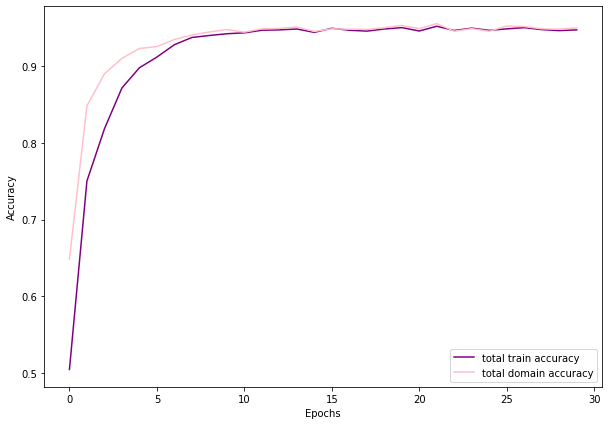

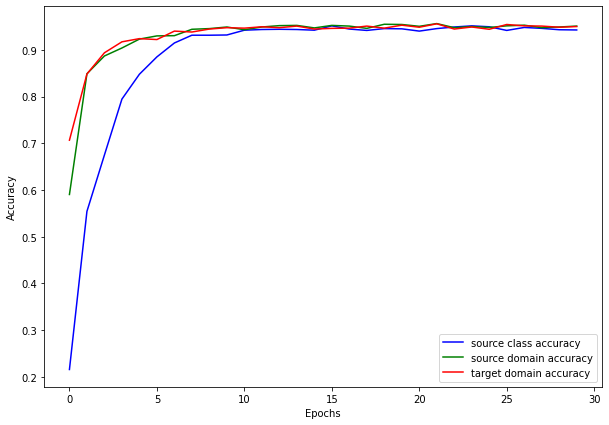

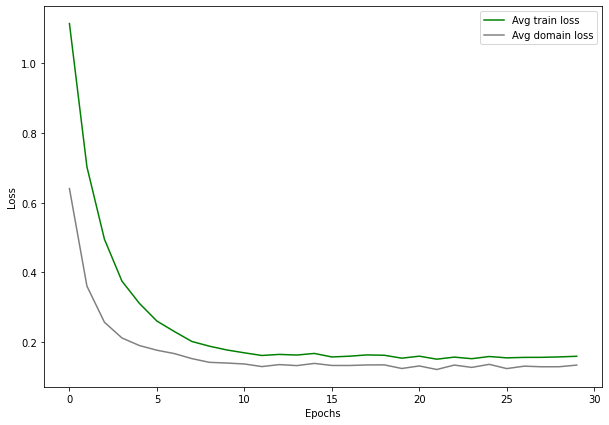

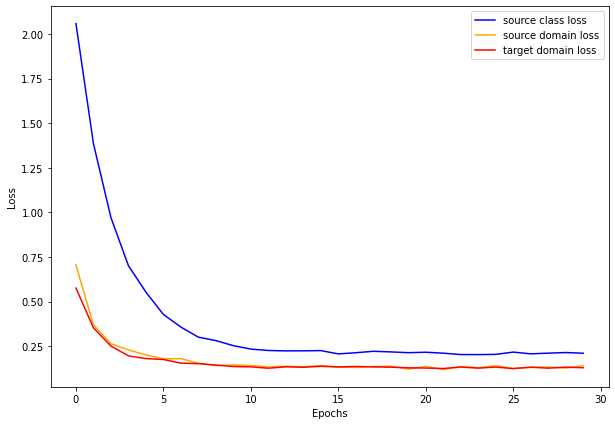

Iteration 4 / 8
lr: 0.0001_wd: 0.0005_gamma: 0.44165264461893494_alpha: 0.16532632287637447
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.9976, Train class Acc: 0.22
Target class Loss: 1.7082, Val class Acc: 0.21
Source domain Loss: 0.4527, Source domain Acc: 0.80
Target domain Loss: 0.7065, Target domain Acc: 0.58
Total train Loss: 1.0523, Total train Acc: 0.54
Total domain Loss: 0.5796, Total domain Acc: 0.69


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.3392, Train class Acc: 0.57
Target class Loss: 1.0845, Val class Acc: 0.28
Source domain Loss: 0.4827, Source domain Acc: 0.77
Target domain Loss: 0.2436, Target domain Acc: 0.92
Total train Loss: 0.6885, Total train Acc: 0.75
Total domain Loss: 0.3632, Total domain Acc: 0.85


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.9269, Train class Acc: 0.69
Target class Loss: 0.8611, Val class Acc: 0.34
Source domain Loss: 0.2837, Source domain Acc: 0.88
Target domain Loss: 0.2275, Target domain Acc: 0.91
Total train Loss: 0.4794, Total train Acc: 0.82
Total domain Loss: 0.2556, Total domain Acc: 0.89


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.6813, Train class Acc: 0.78
Target class Loss: 0.6060, Val class Acc: 0.38
Source domain Loss: 0.1922, Source domain Acc: 0.93
Target domain Loss: 0.2282, Target domain Acc: 0.90
Total train Loss: 0.3672, Total train Acc: 0.87
Total domain Loss: 0.2102, Total domain Acc: 0.91


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.5030, Train class Acc: 0.86
Target class Loss: 0.4369, Val class Acc: 0.38
Source domain Loss: 0.1806, Source domain Acc: 0.93
Target domain Loss: 0.1872, Target domain Acc: 0.92
Total train Loss: 0.2903, Total train Acc: 0.90
Total domain Loss: 0.1839, Total domain Acc: 0.92


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.4048, Train class Acc: 0.89
Target class Loss: 0.3778, Val class Acc: 0.40
Source domain Loss: 0.1770, Source domain Acc: 0.93
Target domain Loss: 0.1518, Target domain Acc: 0.94
Total train Loss: 0.2445, Total train Acc: 0.92
Total domain Loss: 0.1644, Total domain Acc: 0.94


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.3554, Train class Acc: 0.92
Target class Loss: 0.3520, Val class Acc: 0.40
Source domain Loss: 0.1675, Source domain Acc: 0.94
Target domain Loss: 0.1535, Target domain Acc: 0.94
Total train Loss: 0.2255, Total train Acc: 0.93
Total domain Loss: 0.1605, Total domain Acc: 0.94


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.2969, Train class Acc: 0.92
Target class Loss: 0.2956, Val class Acc: 0.40
Source domain Loss: 0.1561, Source domain Acc: 0.95
Target domain Loss: 0.1555, Target domain Acc: 0.93
Total train Loss: 0.2028, Total train Acc: 0.94
Total domain Loss: 0.1558, Total domain Acc: 0.94


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2669, Train class Acc: 0.93
Target class Loss: 0.2315, Val class Acc: 0.41
Source domain Loss: 0.1434, Source domain Acc: 0.95
Target domain Loss: 0.1410, Target domain Acc: 0.94
Total train Loss: 0.1838, Total train Acc: 0.94
Total domain Loss: 0.1422, Total domain Acc: 0.95


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2370, Train class Acc: 0.94
Target class Loss: 0.2459, Val class Acc: 0.41
Source domain Loss: 0.1448, Source domain Acc: 0.95
Target domain Loss: 0.1357, Target domain Acc: 0.94
Total train Loss: 0.1725, Total train Acc: 0.95
Total domain Loss: 0.1402, Total domain Acc: 0.95


Starting epoch 11/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.2323, Train class Acc: 0.94
Target class Loss: 0.2368, Val class Acc: 0.41
Source domain Loss: 0.1411, Source domain Acc: 0.95
Target domain Loss: 0.1329, Target domain Acc: 0.95
Total train Loss: 0.1688, Total train Acc: 0.95
Total domain Loss: 0.1370, Total domain Acc: 0.95


Starting epoch 12/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.2247, Train class Acc: 0.95
Target class Loss: 0.2345, Val class Acc: 0.41
Source domain Loss: 0.1448, Source domain Acc: 0.95
Target domain Loss: 0.1321, Target domain Acc: 0.95
Total train Loss: 0.1672, Total train Acc: 0.95
Total domain Loss: 0.1384, Total domain Acc: 0.95


Starting epoch 13/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.2219, Train class Acc: 0.94
Target class Loss: 0.1773, Val class Acc: 0.41
Source domain Loss: 0.1358, Source domain Acc: 0.96
Target domain Loss: 0.1259, Target domain Acc: 0.95
Total train Loss: 0.1612, Total train Acc: 0.95
Total domain Loss: 0.1309, Total domain Acc: 0.95


Starting epoch 14/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.2181, Train class Acc: 0.94
Target class Loss: 0.2233, Val class Acc: 0.41
Source domain Loss: 0.1194, Source domain Acc: 0.96
Target domain Loss: 0.1295, Target domain Acc: 0.95
Total train Loss: 0.1557, Total train Acc: 0.95
Total domain Loss: 0.1244, Total domain Acc: 0.95


Starting epoch 15/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.2095, Train class Acc: 0.95
Target class Loss: 0.2444, Val class Acc: 0.41
Source domain Loss: 0.1318, Source domain Acc: 0.95
Target domain Loss: 0.1189, Target domain Acc: 0.95
Total train Loss: 0.1534, Total train Acc: 0.95
Total domain Loss: 0.1253, Total domain Acc: 0.95


Starting epoch 16/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.1990, Train class Acc: 0.95
Target class Loss: 0.2100, Val class Acc: 0.42
Source domain Loss: 0.1200, Source domain Acc: 0.96
Target domain Loss: 0.1186, Target domain Acc: 0.96
Total train Loss: 0.1459, Total train Acc: 0.95
Total domain Loss: 0.1193, Total domain Acc: 0.96


Starting epoch 17/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.1990, Train class Acc: 0.94
Target class Loss: 0.1892, Val class Acc: 0.42
Source domain Loss: 0.1180, Source domain Acc: 0.96
Target domain Loss: 0.1246, Target domain Acc: 0.95
Total train Loss: 0.1472, Total train Acc: 0.95
Total domain Loss: 0.1213, Total domain Acc: 0.95


Starting epoch 18/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.1882, Train class Acc: 0.95
Target class Loss: 0.2056, Val class Acc: 0.42
Source domain Loss: 0.1278, Source domain Acc: 0.95
Target domain Loss: 0.1217, Target domain Acc: 0.95
Total train Loss: 0.1459, Total train Acc: 0.95
Total domain Loss: 0.1248, Total domain Acc: 0.95


Starting epoch 19/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.1931, Train class Acc: 0.95
Target class Loss: 0.1772, Val class Acc: 0.42
Source domain Loss: 0.1265, Source domain Acc: 0.96
Target domain Loss: 0.1115, Target domain Acc: 0.96
Total train Loss: 0.1437, Total train Acc: 0.96
Total domain Loss: 0.1190, Total domain Acc: 0.96


Starting epoch 20/30, LR = [4.4165264461893494e-05]




Source class Loss: 0.1811, Train class Acc: 0.95
Target class Loss: 0.1789, Val class Acc: 0.42
Source domain Loss: 0.1101, Source domain Acc: 0.97
Target domain Loss: 0.1134, Target domain Acc: 0.96
Total train Loss: 0.1349, Total train Acc: 0.96
Total domain Loss: 0.1117, Total domain Acc: 0.96


Starting epoch 21/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1769, Train class Acc: 0.96
Target class Loss: 0.2142, Val class Acc: 0.42
Source domain Loss: 0.1168, Source domain Acc: 0.96
Target domain Loss: 0.1200, Target domain Acc: 0.95
Total train Loss: 0.1379, Total train Acc: 0.96
Total domain Loss: 0.1184, Total domain Acc: 0.96


Starting epoch 22/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1808, Train class Acc: 0.95
Target class Loss: 0.1952, Val class Acc: 0.42
Source domain Loss: 0.1196, Source domain Acc: 0.96
Target domain Loss: 0.1123, Target domain Acc: 0.96
Total train Loss: 0.1376, Total train Acc: 0.96
Total domain Loss: 0.1159, Total domain Acc: 0.96


Starting epoch 23/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1725, Train class Acc: 0.95
Target class Loss: 0.1618, Val class Acc: 0.42
Source domain Loss: 0.1184, Source domain Acc: 0.96
Target domain Loss: 0.1071, Target domain Acc: 0.96
Total train Loss: 0.1327, Total train Acc: 0.96
Total domain Loss: 0.1128, Total domain Acc: 0.96


Starting epoch 24/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1730, Train class Acc: 0.95
Target class Loss: 0.1957, Val class Acc: 0.42
Source domain Loss: 0.1122, Source domain Acc: 0.96
Target domain Loss: 0.1115, Target domain Acc: 0.96
Total train Loss: 0.1322, Total train Acc: 0.96
Total domain Loss: 0.1119, Total domain Acc: 0.96


Starting epoch 25/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1625, Train class Acc: 0.96
Target class Loss: 0.1410, Val class Acc: 0.42
Source domain Loss: 0.1134, Source domain Acc: 0.96
Target domain Loss: 0.1136, Target domain Acc: 0.96
Total train Loss: 0.1299, Total train Acc: 0.96
Total domain Loss: 0.1135, Total domain Acc: 0.96


Starting epoch 26/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1617, Train class Acc: 0.96
Target class Loss: 0.1414, Val class Acc: 0.42
Source domain Loss: 0.1246, Source domain Acc: 0.95
Target domain Loss: 0.1129, Target domain Acc: 0.96
Total train Loss: 0.1331, Total train Acc: 0.96
Total domain Loss: 0.1187, Total domain Acc: 0.96


Starting epoch 27/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1711, Train class Acc: 0.95
Target class Loss: 0.1798, Val class Acc: 0.42
Source domain Loss: 0.1104, Source domain Acc: 0.97
Target domain Loss: 0.1051, Target domain Acc: 0.96
Total train Loss: 0.1289, Total train Acc: 0.96
Total domain Loss: 0.1078, Total domain Acc: 0.96


Starting epoch 28/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1634, Train class Acc: 0.96
Target class Loss: 0.1550, Val class Acc: 0.42
Source domain Loss: 0.1049, Source domain Acc: 0.96
Target domain Loss: 0.1117, Target domain Acc: 0.96
Total train Loss: 0.1267, Total train Acc: 0.96
Total domain Loss: 0.1083, Total domain Acc: 0.96


Starting epoch 29/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1711, Train class Acc: 0.96
Target class Loss: 0.1909, Val class Acc: 0.42
Source domain Loss: 0.1255, Source domain Acc: 0.96
Target domain Loss: 0.1059, Target domain Acc: 0.96
Total train Loss: 0.1342, Total train Acc: 0.96
Total domain Loss: 0.1157, Total domain Acc: 0.96


Starting epoch 30/30, LR = [1.9505705849889924e-05]




Source class Loss: 0.1621, Train class Acc: 0.96
Target class Loss: 0.1688, Val class Acc: 0.42
Source domain Loss: 0.1138, Source domain Acc: 0.96
Target domain Loss: 0.1090, Target domain Acc: 0.96
Total train Loss: 0.1283, Total train Acc: 0.96
Total domain Loss: 0.1114, Total domain Acc: 0.96




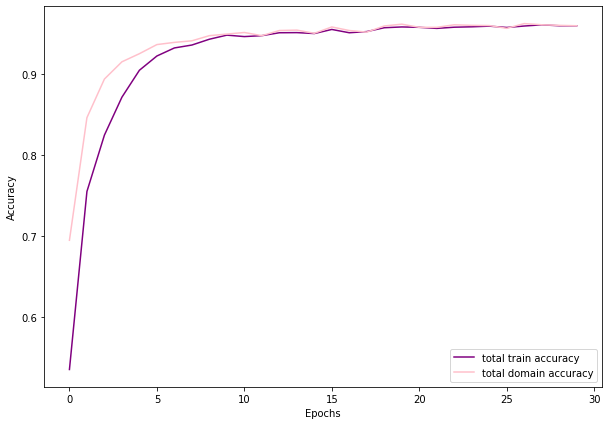

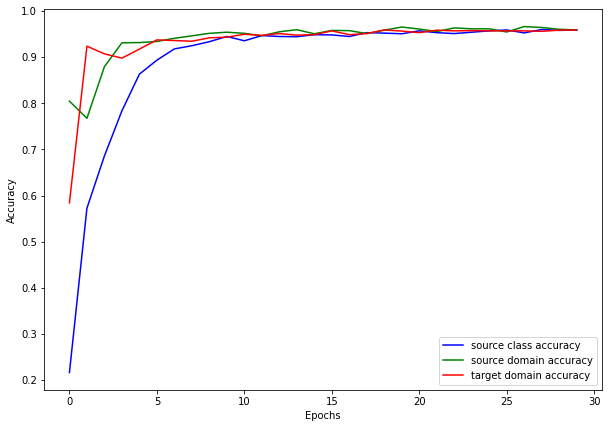

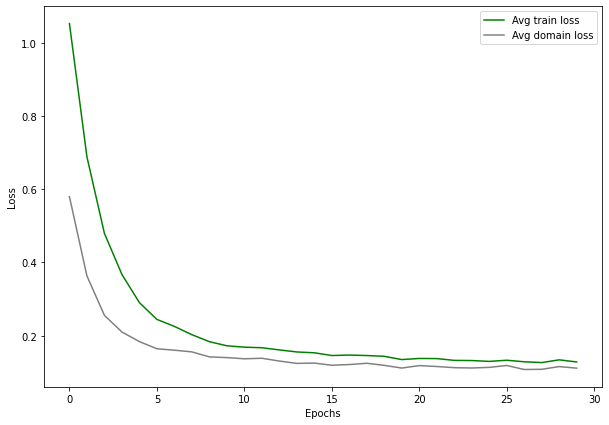

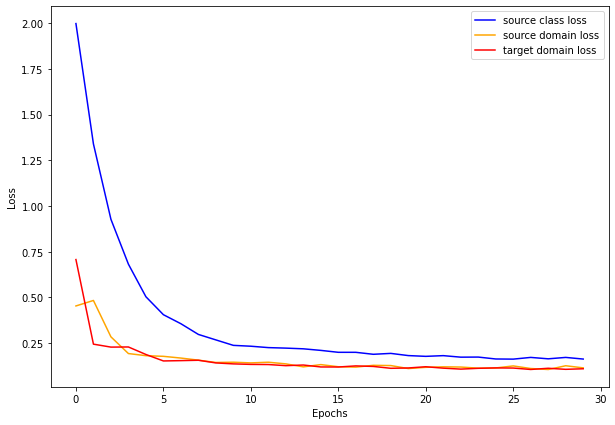

Iteration 5 / 8
lr: 0.0001_wd: 0.0005_gamma: 0.3827986458407956_alpha: 0.3390884153282982
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 2.0108, Train class Acc: 0.17
Target class Loss: 1.6937, Val class Acc: 0.15
Source domain Loss: 0.7839, Source domain Acc: 0.51
Target domain Loss: 0.6634, Target domain Acc: 0.61
Total train Loss: 1.1527, Total train Acc: 0.43
Total domain Loss: 0.7236, Total domain Acc: 0.56


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.2962, Train class Acc: 0.55
Target class Loss: 1.0292, Val class Acc: 0.26
Source domain Loss: 0.4458, Source domain Acc: 0.80
Target domain Loss: 0.3434, Target domain Acc: 0.86
Total train Loss: 0.6951, Total train Acc: 0.74
Total domain Loss: 0.3946, Total domain Acc: 0.83


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.8686, Train class Acc: 0.71
Target class Loss: 0.7124, Val class Acc: 0.34
Source domain Loss: 0.2773, Source domain Acc: 0.89
Target domain Loss: 0.2657, Target domain Acc: 0.89
Total train Loss: 0.4705, Total train Acc: 0.83
Total domain Loss: 0.2715, Total domain Acc: 0.89


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.6436, Train class Acc: 0.82
Target class Loss: 0.5316, Val class Acc: 0.38
Source domain Loss: 0.2309, Source domain Acc: 0.91
Target domain Loss: 0.2131, Target domain Acc: 0.91
Total train Loss: 0.3625, Total train Acc: 0.88
Total domain Loss: 0.2220, Total domain Acc: 0.91


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.5243, Train class Acc: 0.85
Target class Loss: 0.4834, Val class Acc: 0.41
Source domain Loss: 0.2097, Source domain Acc: 0.92
Target domain Loss: 0.1835, Target domain Acc: 0.92
Total train Loss: 0.3058, Total train Acc: 0.90
Total domain Loss: 0.1966, Total domain Acc: 0.92


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.4105, Train class Acc: 0.89
Target class Loss: 0.4143, Val class Acc: 0.42
Source domain Loss: 0.1889, Source domain Acc: 0.93
Target domain Loss: 0.1699, Target domain Acc: 0.93
Total train Loss: 0.2564, Total train Acc: 0.92
Total domain Loss: 0.1794, Total domain Acc: 0.93


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.3637, Train class Acc: 0.90
Target class Loss: 0.3445, Val class Acc: 0.41
Source domain Loss: 0.1855, Source domain Acc: 0.94
Target domain Loss: 0.1657, Target domain Acc: 0.93
Total train Loss: 0.2383, Total train Acc: 0.93
Total domain Loss: 0.1756, Total domain Acc: 0.94


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.3044, Train class Acc: 0.93
Target class Loss: 0.3139, Val class Acc: 0.42
Source domain Loss: 0.1647, Source domain Acc: 0.94
Target domain Loss: 0.1629, Target domain Acc: 0.93
Total train Loss: 0.2107, Total train Acc: 0.93
Total domain Loss: 0.1638, Total domain Acc: 0.94


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2698, Train class Acc: 0.93
Target class Loss: 0.2477, Val class Acc: 0.43
Source domain Loss: 0.1484, Source domain Acc: 0.95
Target domain Loss: 0.1445, Target domain Acc: 0.95
Total train Loss: 0.1876, Total train Acc: 0.94
Total domain Loss: 0.1465, Total domain Acc: 0.95


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2532, Train class Acc: 0.93
Target class Loss: 0.2864, Val class Acc: 0.43
Source domain Loss: 0.1521, Source domain Acc: 0.95
Target domain Loss: 0.1389, Target domain Acc: 0.95
Total train Loss: 0.1814, Total train Acc: 0.94
Total domain Loss: 0.1455, Total domain Acc: 0.95


Starting epoch 11/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2283, Train class Acc: 0.94
Target class Loss: 0.2069, Val class Acc: 0.43
Source domain Loss: 0.1378, Source domain Acc: 0.95
Target domain Loss: 0.1303, Target domain Acc: 0.94
Total train Loss: 0.1655, Total train Acc: 0.95
Total domain Loss: 0.1340, Total domain Acc: 0.95


Starting epoch 12/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2269, Train class Acc: 0.94
Target class Loss: 0.1708, Val class Acc: 0.43
Source domain Loss: 0.1532, Source domain Acc: 0.95
Target domain Loss: 0.1282, Target domain Acc: 0.95
Total train Loss: 0.1694, Total train Acc: 0.95
Total domain Loss: 0.1407, Total domain Acc: 0.95


Starting epoch 13/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2266, Train class Acc: 0.94
Target class Loss: 0.2285, Val class Acc: 0.43
Source domain Loss: 0.1409, Source domain Acc: 0.94
Target domain Loss: 0.1334, Target domain Acc: 0.95
Total train Loss: 0.1670, Total train Acc: 0.94
Total domain Loss: 0.1372, Total domain Acc: 0.95


Starting epoch 14/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2171, Train class Acc: 0.94
Target class Loss: 0.2109, Val class Acc: 0.43
Source domain Loss: 0.1445, Source domain Acc: 0.95
Target domain Loss: 0.1347, Target domain Acc: 0.95
Total train Loss: 0.1654, Total train Acc: 0.95
Total domain Loss: 0.1396, Total domain Acc: 0.95


Starting epoch 15/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2047, Train class Acc: 0.95
Target class Loss: 0.2285, Val class Acc: 0.44
Source domain Loss: 0.1343, Source domain Acc: 0.95
Target domain Loss: 0.1306, Target domain Acc: 0.95
Total train Loss: 0.1566, Total train Acc: 0.95
Total domain Loss: 0.1325, Total domain Acc: 0.95


Starting epoch 16/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2005, Train class Acc: 0.95
Target class Loss: 0.1896, Val class Acc: 0.44
Source domain Loss: 0.1381, Source domain Acc: 0.95
Target domain Loss: 0.1322, Target domain Acc: 0.95
Total train Loss: 0.1569, Total train Acc: 0.95
Total domain Loss: 0.1351, Total domain Acc: 0.95


Starting epoch 17/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2095, Train class Acc: 0.94
Target class Loss: 0.2118, Val class Acc: 0.44
Source domain Loss: 0.1410, Source domain Acc: 0.95
Target domain Loss: 0.1320, Target domain Acc: 0.95
Total train Loss: 0.1608, Total train Acc: 0.95
Total domain Loss: 0.1365, Total domain Acc: 0.95


Starting epoch 18/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2061, Train class Acc: 0.94
Target class Loss: 0.2352, Val class Acc: 0.44
Source domain Loss: 0.1345, Source domain Acc: 0.95
Target domain Loss: 0.1315, Target domain Acc: 0.95
Total train Loss: 0.1574, Total train Acc: 0.95
Total domain Loss: 0.1330, Total domain Acc: 0.95


Starting epoch 19/30, LR = [3.827986458407956e-05]




Source class Loss: 0.2021, Train class Acc: 0.95
Target class Loss: 0.2267, Val class Acc: 0.44
Source domain Loss: 0.1363, Source domain Acc: 0.95
Target domain Loss: 0.1265, Target domain Acc: 0.95
Total train Loss: 0.1549, Total train Acc: 0.95
Total domain Loss: 0.1314, Total domain Acc: 0.95


Starting epoch 20/30, LR = [3.827986458407956e-05]




Source class Loss: 0.1910, Train class Acc: 0.95
Target class Loss: 0.2031, Val class Acc: 0.44
Source domain Loss: 0.1248, Source domain Acc: 0.96
Target domain Loss: 0.1288, Target domain Acc: 0.95
Total train Loss: 0.1482, Total train Acc: 0.95
Total domain Loss: 0.1268, Total domain Acc: 0.95


Starting epoch 21/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1770, Train class Acc: 0.95
Target class Loss: 0.1763, Val class Acc: 0.44
Source domain Loss: 0.1234, Source domain Acc: 0.96
Target domain Loss: 0.1263, Target domain Acc: 0.95
Total train Loss: 0.1422, Total train Acc: 0.95
Total domain Loss: 0.1248, Total domain Acc: 0.95


Starting epoch 22/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1851, Train class Acc: 0.95
Target class Loss: 0.2208, Val class Acc: 0.44
Source domain Loss: 0.1357, Source domain Acc: 0.95
Target domain Loss: 0.1212, Target domain Acc: 0.95
Total train Loss: 0.1474, Total train Acc: 0.95
Total domain Loss: 0.1285, Total domain Acc: 0.95


Starting epoch 23/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1782, Train class Acc: 0.95
Target class Loss: 0.1624, Val class Acc: 0.44
Source domain Loss: 0.1271, Source domain Acc: 0.95
Target domain Loss: 0.1212, Target domain Acc: 0.95
Total train Loss: 0.1422, Total train Acc: 0.95
Total domain Loss: 0.1241, Total domain Acc: 0.95


Starting epoch 24/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1873, Train class Acc: 0.95
Target class Loss: 0.1815, Val class Acc: 0.44
Source domain Loss: 0.1325, Source domain Acc: 0.95
Target domain Loss: 0.1179, Target domain Acc: 0.95
Total train Loss: 0.1459, Total train Acc: 0.95
Total domain Loss: 0.1252, Total domain Acc: 0.95


Starting epoch 25/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1712, Train class Acc: 0.96
Target class Loss: 0.1513, Val class Acc: 0.44
Source domain Loss: 0.1176, Source domain Acc: 0.96
Target domain Loss: 0.1201, Target domain Acc: 0.95
Total train Loss: 0.1363, Total train Acc: 0.96
Total domain Loss: 0.1188, Total domain Acc: 0.96


Starting epoch 26/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1740, Train class Acc: 0.95
Target class Loss: 0.1801, Val class Acc: 0.44
Source domain Loss: 0.1315, Source domain Acc: 0.95
Target domain Loss: 0.1201, Target domain Acc: 0.96
Total train Loss: 0.1419, Total train Acc: 0.95
Total domain Loss: 0.1258, Total domain Acc: 0.95


Starting epoch 27/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1838, Train class Acc: 0.95
Target class Loss: 0.1741, Val class Acc: 0.44
Source domain Loss: 0.1411, Source domain Acc: 0.95
Target domain Loss: 0.1130, Target domain Acc: 0.96
Total train Loss: 0.1460, Total train Acc: 0.95
Total domain Loss: 0.1270, Total domain Acc: 0.95


Starting epoch 28/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1782, Train class Acc: 0.95
Target class Loss: 0.1734, Val class Acc: 0.44
Source domain Loss: 0.1258, Source domain Acc: 0.96
Target domain Loss: 0.1160, Target domain Acc: 0.95
Total train Loss: 0.1400, Total train Acc: 0.95
Total domain Loss: 0.1209, Total domain Acc: 0.95


Starting epoch 29/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1667, Train class Acc: 0.96
Target class Loss: 0.1410, Val class Acc: 0.45
Source domain Loss: 0.1267, Source domain Acc: 0.96
Target domain Loss: 0.1235, Target domain Acc: 0.95
Total train Loss: 0.1390, Total train Acc: 0.95
Total domain Loss: 0.1251, Total domain Acc: 0.95


Starting epoch 30/30, LR = [1.4653480325754685e-05]




Source class Loss: 0.1752, Train class Acc: 0.95
Target class Loss: 0.2045, Val class Acc: 0.45
Source domain Loss: 0.1255, Source domain Acc: 0.96
Target domain Loss: 0.1153, Target domain Acc: 0.96
Total train Loss: 0.1387, Total train Acc: 0.96
Total domain Loss: 0.1204, Total domain Acc: 0.96




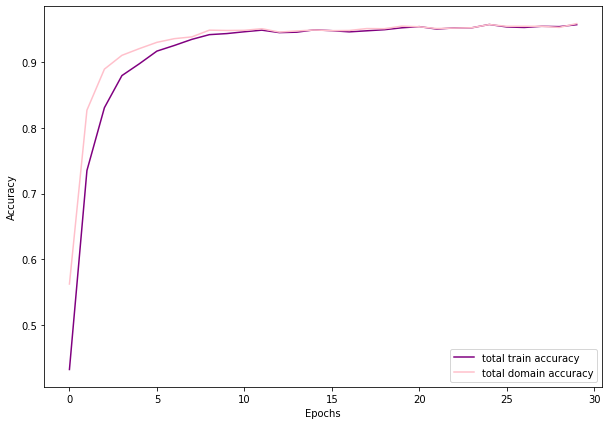

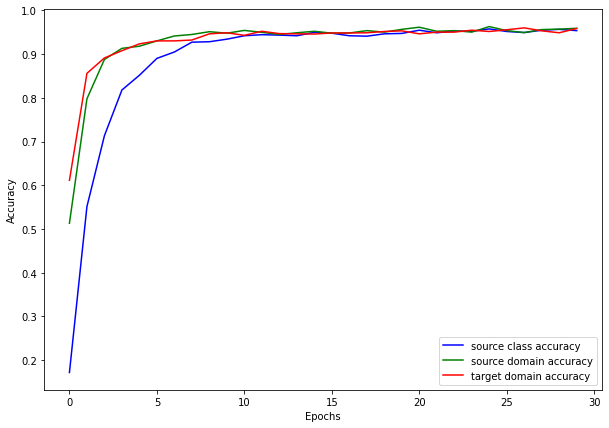

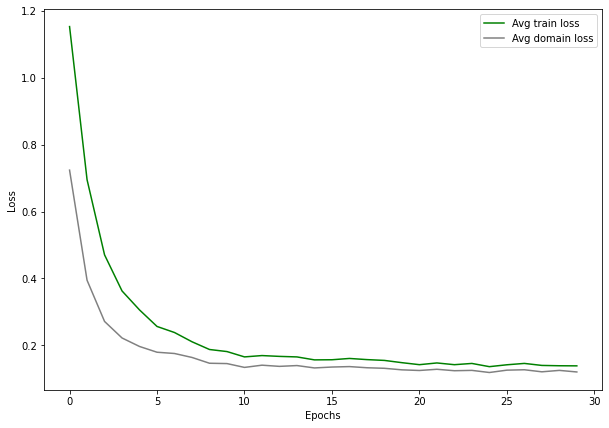

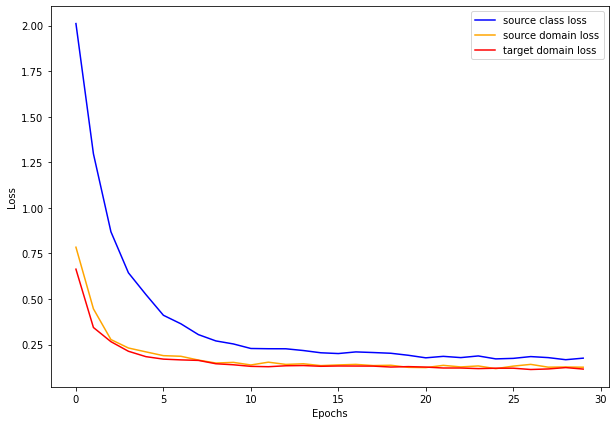

Iteration 6 / 8
lr: 1e-05_wd: 0.0005_gamma: 0.49898021734875175_alpha: 0.034614394204052906
Starting epoch 1/30, LR = [1e-05]




Source class Loss: 2.1518, Train class Acc: 0.12
Target class Loss: 2.1256, Val class Acc: 0.10
Source domain Loss: 0.9523, Source domain Acc: 0.37
Target domain Loss: 0.6689, Target domain Acc: 0.60
Total train Loss: 1.2576, Total train Acc: 0.36
Total domain Loss: 0.8106, Total domain Acc: 0.49


Starting epoch 2/30, LR = [1e-05]




Source class Loss: 2.0446, Train class Acc: 0.15
Target class Loss: 1.9884, Val class Acc: 0.12
Source domain Loss: 0.8710, Source domain Acc: 0.45
Target domain Loss: 0.6115, Target domain Acc: 0.66
Total train Loss: 1.1757, Total train Acc: 0.42
Total domain Loss: 0.7413, Total domain Acc: 0.55


Starting epoch 3/30, LR = [1e-05]




Source class Loss: 1.8898, Train class Acc: 0.23
Target class Loss: 1.8198, Val class Acc: 0.13
Source domain Loss: 0.7772, Source domain Acc: 0.53
Target domain Loss: 0.5483, Target domain Acc: 0.73
Total train Loss: 1.0718, Total train Acc: 0.49
Total domain Loss: 0.6627, Total domain Acc: 0.63


Starting epoch 4/30, LR = [1e-05]




Source class Loss: 1.7366, Train class Acc: 0.34
Target class Loss: 1.6537, Val class Acc: 0.15
Source domain Loss: 0.6601, Source domain Acc: 0.64
Target domain Loss: 0.5073, Target domain Acc: 0.75
Total train Loss: 0.9680, Total train Acc: 0.57
Total domain Loss: 0.5837, Total domain Acc: 0.69


Starting epoch 5/30, LR = [1e-05]




Source class Loss: 1.6083, Train class Acc: 0.44
Target class Loss: 1.5714, Val class Acc: 0.17
Source domain Loss: 0.5866, Source domain Acc: 0.70
Target domain Loss: 0.4602, Target domain Acc: 0.79
Total train Loss: 0.8850, Total train Acc: 0.64
Total domain Loss: 0.5234, Total domain Acc: 0.75


Starting epoch 6/30, LR = [1e-05]




Source class Loss: 1.4882, Train class Acc: 0.50
Target class Loss: 1.3730, Val class Acc: 0.18
Source domain Loss: 0.5376, Source domain Acc: 0.74
Target domain Loss: 0.4330, Target domain Acc: 0.81
Total train Loss: 0.8196, Total train Acc: 0.68
Total domain Loss: 0.4853, Total domain Acc: 0.78


Starting epoch 7/30, LR = [1e-05]




Source class Loss: 1.3937, Train class Acc: 0.55
Target class Loss: 1.3750, Val class Acc: 0.20
Source domain Loss: 0.4935, Source domain Acc: 0.76
Target domain Loss: 0.4148, Target domain Acc: 0.81
Total train Loss: 0.7673, Total train Acc: 0.71
Total domain Loss: 0.4541, Total domain Acc: 0.79


Starting epoch 8/30, LR = [1e-05]




Source class Loss: 1.2889, Train class Acc: 0.59
Target class Loss: 1.2213, Val class Acc: 0.21
Source domain Loss: 0.4463, Source domain Acc: 0.79
Target domain Loss: 0.3852, Target domain Acc: 0.84
Total train Loss: 0.7068, Total train Acc: 0.74
Total domain Loss: 0.4158, Total domain Acc: 0.81


Starting epoch 9/30, LR = [1e-05]




Source class Loss: 1.2325, Train class Acc: 0.60
Target class Loss: 1.2092, Val class Acc: 0.23
Source domain Loss: 0.4392, Source domain Acc: 0.79
Target domain Loss: 0.3665, Target domain Acc: 0.85
Total train Loss: 0.6794, Total train Acc: 0.75
Total domain Loss: 0.4028, Total domain Acc: 0.82


Starting epoch 10/30, LR = [1e-05]




Source class Loss: 1.1610, Train class Acc: 0.62
Target class Loss: 1.0985, Val class Acc: 0.23
Source domain Loss: 0.4003, Source domain Acc: 0.82
Target domain Loss: 0.3510, Target domain Acc: 0.85
Total train Loss: 0.6374, Total train Acc: 0.76
Total domain Loss: 0.3757, Total domain Acc: 0.84


Starting epoch 11/30, LR = [4.989802173487518e-06]




Source class Loss: 1.1226, Train class Acc: 0.63
Target class Loss: 1.1480, Val class Acc: 0.24
Source domain Loss: 0.3848, Source domain Acc: 0.82
Target domain Loss: 0.3436, Target domain Acc: 0.86
Total train Loss: 0.6170, Total train Acc: 0.77
Total domain Loss: 0.3642, Total domain Acc: 0.84


Starting epoch 12/30, LR = [4.989802173487518e-06]




Source class Loss: 1.0966, Train class Acc: 0.64
Target class Loss: 1.0937, Val class Acc: 0.24
Source domain Loss: 0.3883, Source domain Acc: 0.82
Target domain Loss: 0.3339, Target domain Acc: 0.86
Total train Loss: 0.6062, Total train Acc: 0.77
Total domain Loss: 0.3611, Total domain Acc: 0.84


Starting epoch 13/30, LR = [4.989802173487518e-06]




Source class Loss: 1.0609, Train class Acc: 0.66
Target class Loss: 0.9794, Val class Acc: 0.25
Source domain Loss: 0.3727, Source domain Acc: 0.83
Target domain Loss: 0.3311, Target domain Acc: 0.87
Total train Loss: 0.5882, Total train Acc: 0.78
Total domain Loss: 0.3519, Total domain Acc: 0.85


Starting epoch 14/30, LR = [4.989802173487518e-06]




Source class Loss: 1.0551, Train class Acc: 0.66
Target class Loss: 1.0776, Val class Acc: 0.25
Source domain Loss: 0.3689, Source domain Acc: 0.82
Target domain Loss: 0.3233, Target domain Acc: 0.86
Total train Loss: 0.5825, Total train Acc: 0.78
Total domain Loss: 0.3461, Total domain Acc: 0.84


Starting epoch 15/30, LR = [4.989802173487518e-06]




Source class Loss: 1.0282, Train class Acc: 0.67
Target class Loss: 0.9918, Val class Acc: 0.25
Source domain Loss: 0.3523, Source domain Acc: 0.84
Target domain Loss: 0.3173, Target domain Acc: 0.87
Total train Loss: 0.5660, Total train Acc: 0.79
Total domain Loss: 0.3348, Total domain Acc: 0.85


Starting epoch 16/30, LR = [4.989802173487518e-06]




Source class Loss: 0.9930, Train class Acc: 0.69
Target class Loss: 0.8971, Val class Acc: 0.26
Source domain Loss: 0.3434, Source domain Acc: 0.86
Target domain Loss: 0.3195, Target domain Acc: 0.87
Total train Loss: 0.5520, Total train Acc: 0.80
Total domain Loss: 0.3314, Total domain Acc: 0.86


Starting epoch 17/30, LR = [4.989802173487518e-06]




Source class Loss: 1.0027, Train class Acc: 0.67
Target class Loss: 0.9474, Val class Acc: 0.26
Source domain Loss: 0.3478, Source domain Acc: 0.85
Target domain Loss: 0.3106, Target domain Acc: 0.87
Total train Loss: 0.5537, Total train Acc: 0.80
Total domain Loss: 0.3292, Total domain Acc: 0.86


Starting epoch 18/30, LR = [4.989802173487518e-06]




Source class Loss: 0.9840, Train class Acc: 0.69
Target class Loss: 0.9818, Val class Acc: 0.26
Source domain Loss: 0.3441, Source domain Acc: 0.85
Target domain Loss: 0.3055, Target domain Acc: 0.87
Total train Loss: 0.5445, Total train Acc: 0.80
Total domain Loss: 0.3248, Total domain Acc: 0.86


Starting epoch 19/30, LR = [4.989802173487518e-06]




Source class Loss: 0.9401, Train class Acc: 0.71
Target class Loss: 0.9226, Val class Acc: 0.27
Source domain Loss: 0.3352, Source domain Acc: 0.86
Target domain Loss: 0.3005, Target domain Acc: 0.88
Total train Loss: 0.5253, Total train Acc: 0.82
Total domain Loss: 0.3179, Total domain Acc: 0.87


Starting epoch 20/30, LR = [4.989802173487518e-06]




Source class Loss: 0.9452, Train class Acc: 0.69
Target class Loss: 0.9106, Val class Acc: 0.27
Source domain Loss: 0.3266, Source domain Acc: 0.86
Target domain Loss: 0.2969, Target domain Acc: 0.88
Total train Loss: 0.5229, Total train Acc: 0.81
Total domain Loss: 0.3117, Total domain Acc: 0.87


Starting epoch 21/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.9167, Train class Acc: 0.71
Target class Loss: 0.9148, Val class Acc: 0.28
Source domain Loss: 0.3164, Source domain Acc: 0.86
Target domain Loss: 0.2903, Target domain Acc: 0.88
Total train Loss: 0.5078, Total train Acc: 0.82
Total domain Loss: 0.3034, Total domain Acc: 0.87


Starting epoch 22/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.9115, Train class Acc: 0.72
Target class Loss: 0.9218, Val class Acc: 0.28
Source domain Loss: 0.3302, Source domain Acc: 0.86
Target domain Loss: 0.2867, Target domain Acc: 0.89
Total train Loss: 0.5095, Total train Acc: 0.82
Total domain Loss: 0.3084, Total domain Acc: 0.87


Starting epoch 23/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.9119, Train class Acc: 0.71
Target class Loss: 0.8548, Val class Acc: 0.28
Source domain Loss: 0.3317, Source domain Acc: 0.85
Target domain Loss: 0.2906, Target domain Acc: 0.88
Total train Loss: 0.5114, Total train Acc: 0.81
Total domain Loss: 0.3111, Total domain Acc: 0.87


Starting epoch 24/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.9093, Train class Acc: 0.71
Target class Loss: 0.9435, Val class Acc: 0.28
Source domain Loss: 0.3190, Source domain Acc: 0.87
Target domain Loss: 0.2909, Target domain Acc: 0.88
Total train Loss: 0.5064, Total train Acc: 0.82
Total domain Loss: 0.3050, Total domain Acc: 0.87


Starting epoch 25/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.8781, Train class Acc: 0.75
Target class Loss: 0.8606, Val class Acc: 0.28
Source domain Loss: 0.3131, Source domain Acc: 0.87
Target domain Loss: 0.2839, Target domain Acc: 0.89
Total train Loss: 0.4917, Total train Acc: 0.83
Total domain Loss: 0.2985, Total domain Acc: 0.88


Starting epoch 26/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.8892, Train class Acc: 0.72
Target class Loss: 0.9250, Val class Acc: 0.28
Source domain Loss: 0.3271, Source domain Acc: 0.85
Target domain Loss: 0.2857, Target domain Acc: 0.88
Total train Loss: 0.5006, Total train Acc: 0.82
Total domain Loss: 0.3064, Total domain Acc: 0.86


Starting epoch 27/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.8775, Train class Acc: 0.73
Target class Loss: 0.8488, Val class Acc: 0.29
Source domain Loss: 0.3244, Source domain Acc: 0.86
Target domain Loss: 0.2859, Target domain Acc: 0.88
Total train Loss: 0.4959, Total train Acc: 0.83
Total domain Loss: 0.3051, Total domain Acc: 0.87


Starting epoch 28/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.8671, Train class Acc: 0.74
Target class Loss: 0.8153, Val class Acc: 0.29
Source domain Loss: 0.3044, Source domain Acc: 0.86
Target domain Loss: 0.2801, Target domain Acc: 0.88
Total train Loss: 0.4838, Total train Acc: 0.83
Total domain Loss: 0.2922, Total domain Acc: 0.87


Starting epoch 29/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.8464, Train class Acc: 0.75
Target class Loss: 0.8623, Val class Acc: 0.29
Source domain Loss: 0.3104, Source domain Acc: 0.87
Target domain Loss: 0.2808, Target domain Acc: 0.89
Total train Loss: 0.4792, Total train Acc: 0.84
Total domain Loss: 0.2956, Total domain Acc: 0.88


Starting epoch 30/30, LR = [2.4898125730540755e-06]




Source class Loss: 0.8423, Train class Acc: 0.75
Target class Loss: 0.8981, Val class Acc: 0.29
Source domain Loss: 0.3058, Source domain Acc: 0.87
Target domain Loss: 0.2830, Target domain Acc: 0.88
Total train Loss: 0.4770, Total train Acc: 0.83
Total domain Loss: 0.2944, Total domain Acc: 0.87




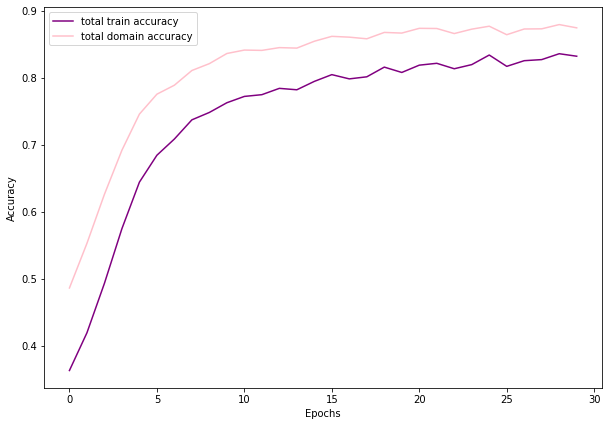

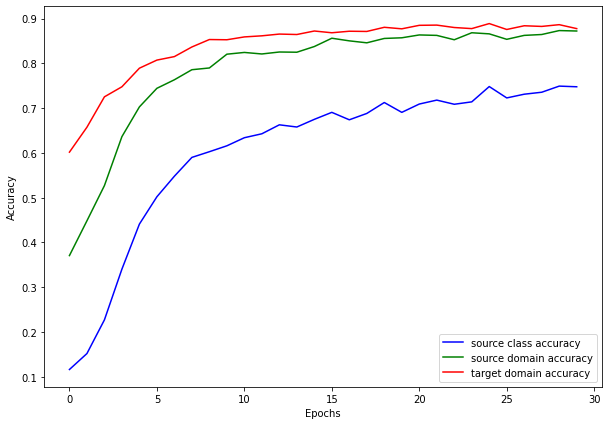

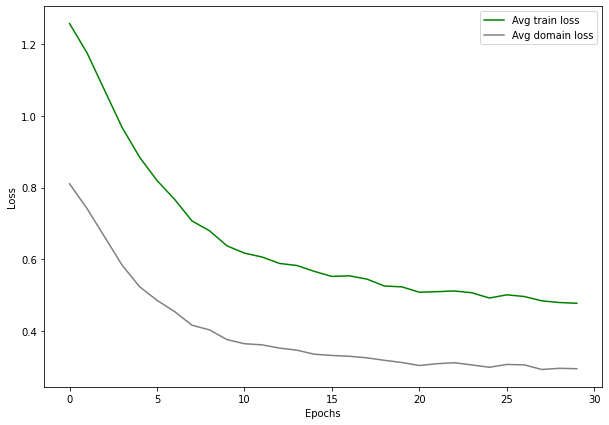

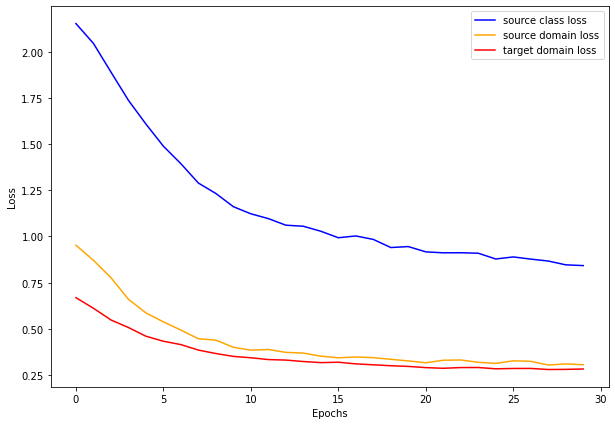

Iteration 7 / 8
lr: 0.0001_wd: 0.0005_gamma: 0.4564982721177585_alpha: 0.043153248658441
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.9422, Train class Acc: 0.25
Target class Loss: 1.6913, Val class Acc: 0.23
Source domain Loss: 0.7861, Source domain Acc: 0.50
Target domain Loss: 0.6933, Target domain Acc: 0.59
Total train Loss: 1.1405, Total train Acc: 0.44
Total domain Loss: 0.7397, Total domain Acc: 0.54


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.3020, Train class Acc: 0.56
Target class Loss: 1.0687, Val class Acc: 0.31
Source domain Loss: 0.4205, Source domain Acc: 0.81
Target domain Loss: 0.3349, Target domain Acc: 0.86
Total train Loss: 0.6858, Total train Acc: 0.75
Total domain Loss: 0.3777, Total domain Acc: 0.84


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.9148, Train class Acc: 0.70
Target class Loss: 0.8194, Val class Acc: 0.35
Source domain Loss: 0.2669, Source domain Acc: 0.90
Target domain Loss: 0.2700, Target domain Acc: 0.88
Total train Loss: 0.4839, Total train Acc: 0.82
Total domain Loss: 0.2685, Total domain Acc: 0.89


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.6539, Train class Acc: 0.81
Target class Loss: 0.5320, Val class Acc: 0.38
Source domain Loss: 0.2201, Source domain Acc: 0.92
Target domain Loss: 0.2128, Target domain Acc: 0.91
Total train Loss: 0.3623, Total train Acc: 0.88
Total domain Loss: 0.2164, Total domain Acc: 0.91


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.5062, Train class Acc: 0.86
Target class Loss: 0.3788, Val class Acc: 0.37
Source domain Loss: 0.2034, Source domain Acc: 0.93
Target domain Loss: 0.1786, Target domain Acc: 0.92
Total train Loss: 0.2961, Total train Acc: 0.90
Total domain Loss: 0.1910, Total domain Acc: 0.93


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.4294, Train class Acc: 0.88
Target class Loss: 0.4281, Val class Acc: 0.38
Source domain Loss: 0.1963, Source domain Acc: 0.92
Target domain Loss: 0.1642, Target domain Acc: 0.92
Total train Loss: 0.2633, Total train Acc: 0.91
Total domain Loss: 0.1802, Total domain Acc: 0.92


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.3659, Train class Acc: 0.90
Target class Loss: 0.3435, Val class Acc: 0.38
Source domain Loss: 0.1727, Source domain Acc: 0.94
Target domain Loss: 0.1556, Target domain Acc: 0.93
Total train Loss: 0.2314, Total train Acc: 0.93
Total domain Loss: 0.1641, Total domain Acc: 0.94


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.3193, Train class Acc: 0.91
Target class Loss: 0.3414, Val class Acc: 0.38
Source domain Loss: 0.1598, Source domain Acc: 0.95
Target domain Loss: 0.1561, Target domain Acc: 0.93
Total train Loss: 0.2117, Total train Acc: 0.93
Total domain Loss: 0.1580, Total domain Acc: 0.94


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2783, Train class Acc: 0.93
Target class Loss: 0.2838, Val class Acc: 0.39
Source domain Loss: 0.1502, Source domain Acc: 0.94
Target domain Loss: 0.1434, Target domain Acc: 0.94
Total train Loss: 0.1906, Total train Acc: 0.94
Total domain Loss: 0.1468, Total domain Acc: 0.94


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2557, Train class Acc: 0.93
Target class Loss: 0.2684, Val class Acc: 0.39
Source domain Loss: 0.1435, Source domain Acc: 0.95
Target domain Loss: 0.1390, Target domain Acc: 0.94
Total train Loss: 0.1794, Total train Acc: 0.94
Total domain Loss: 0.1413, Total domain Acc: 0.95


Starting epoch 11/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.2431, Train class Acc: 0.93
Target class Loss: 0.2414, Val class Acc: 0.39
Source domain Loss: 0.1468, Source domain Acc: 0.95
Target domain Loss: 0.1315, Target domain Acc: 0.95
Total train Loss: 0.1738, Total train Acc: 0.94
Total domain Loss: 0.1391, Total domain Acc: 0.95


Starting epoch 12/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.2214, Train class Acc: 0.95
Target class Loss: 0.2059, Val class Acc: 0.39
Source domain Loss: 0.1366, Source domain Acc: 0.95
Target domain Loss: 0.1309, Target domain Acc: 0.95
Total train Loss: 0.1630, Total train Acc: 0.95
Total domain Loss: 0.1338, Total domain Acc: 0.95


Starting epoch 13/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.2318, Train class Acc: 0.94
Target class Loss: 0.2528, Val class Acc: 0.39
Source domain Loss: 0.1398, Source domain Acc: 0.95
Target domain Loss: 0.1455, Target domain Acc: 0.94
Total train Loss: 0.1724, Total train Acc: 0.94
Total domain Loss: 0.1427, Total domain Acc: 0.94


Starting epoch 14/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.2146, Train class Acc: 0.94
Target class Loss: 0.1884, Val class Acc: 0.39
Source domain Loss: 0.1386, Source domain Acc: 0.95
Target domain Loss: 0.1238, Target domain Acc: 0.95
Total train Loss: 0.1590, Total train Acc: 0.95
Total domain Loss: 0.1312, Total domain Acc: 0.95


Starting epoch 15/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.2079, Train class Acc: 0.94
Target class Loss: 0.1806, Val class Acc: 0.40
Source domain Loss: 0.1380, Source domain Acc: 0.95
Target domain Loss: 0.1291, Target domain Acc: 0.95
Total train Loss: 0.1584, Total train Acc: 0.95
Total domain Loss: 0.1336, Total domain Acc: 0.95


Starting epoch 16/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.1976, Train class Acc: 0.95
Target class Loss: 0.1375, Val class Acc: 0.40
Source domain Loss: 0.1340, Source domain Acc: 0.95
Target domain Loss: 0.1244, Target domain Acc: 0.95
Total train Loss: 0.1520, Total train Acc: 0.95
Total domain Loss: 0.1292, Total domain Acc: 0.95


Starting epoch 17/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.1941, Train class Acc: 0.95
Target class Loss: 0.2100, Val class Acc: 0.40
Source domain Loss: 0.1267, Source domain Acc: 0.96
Target domain Loss: 0.1254, Target domain Acc: 0.95
Total train Loss: 0.1487, Total train Acc: 0.95
Total domain Loss: 0.1261, Total domain Acc: 0.95


Starting epoch 18/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.1834, Train class Acc: 0.95
Target class Loss: 0.1602, Val class Acc: 0.40
Source domain Loss: 0.1321, Source domain Acc: 0.95
Target domain Loss: 0.1219, Target domain Acc: 0.95
Total train Loss: 0.1458, Total train Acc: 0.95
Total domain Loss: 0.1270, Total domain Acc: 0.95


Starting epoch 19/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.1856, Train class Acc: 0.95
Target class Loss: 0.1752, Val class Acc: 0.40
Source domain Loss: 0.1221, Source domain Acc: 0.95
Target domain Loss: 0.1233, Target domain Acc: 0.95
Total train Loss: 0.1437, Total train Acc: 0.95
Total domain Loss: 0.1227, Total domain Acc: 0.95


Starting epoch 20/30, LR = [4.5649827211775853e-05]




Source class Loss: 0.1839, Train class Acc: 0.95
Target class Loss: 0.1702, Val class Acc: 0.40
Source domain Loss: 0.1179, Source domain Acc: 0.96
Target domain Loss: 0.1201, Target domain Acc: 0.96
Total train Loss: 0.1407, Total train Acc: 0.96
Total domain Loss: 0.1190, Total domain Acc: 0.96


Starting epoch 21/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1827, Train class Acc: 0.95
Target class Loss: 0.1986, Val class Acc: 0.40
Source domain Loss: 0.1221, Source domain Acc: 0.96
Target domain Loss: 0.1177, Target domain Acc: 0.96
Total train Loss: 0.1408, Total train Acc: 0.96
Total domain Loss: 0.1199, Total domain Acc: 0.96


Starting epoch 22/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1796, Train class Acc: 0.95
Target class Loss: 0.1773, Val class Acc: 0.40
Source domain Loss: 0.1247, Source domain Acc: 0.96
Target domain Loss: 0.1200, Target domain Acc: 0.96
Total train Loss: 0.1414, Total train Acc: 0.96
Total domain Loss: 0.1223, Total domain Acc: 0.96


Starting epoch 23/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1855, Train class Acc: 0.95
Target class Loss: 0.1979, Val class Acc: 0.40
Source domain Loss: 0.1147, Source domain Acc: 0.96
Target domain Loss: 0.1128, Target domain Acc: 0.96
Total train Loss: 0.1377, Total train Acc: 0.96
Total domain Loss: 0.1138, Total domain Acc: 0.96


Starting epoch 24/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1734, Train class Acc: 0.95
Target class Loss: 0.1610, Val class Acc: 0.40
Source domain Loss: 0.1275, Source domain Acc: 0.95
Target domain Loss: 0.1117, Target domain Acc: 0.96
Total train Loss: 0.1375, Total train Acc: 0.95
Total domain Loss: 0.1196, Total domain Acc: 0.96


Starting epoch 25/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1793, Train class Acc: 0.94
Target class Loss: 0.1777, Val class Acc: 0.40
Source domain Loss: 0.1200, Source domain Acc: 0.96
Target domain Loss: 0.1120, Target domain Acc: 0.95
Total train Loss: 0.1371, Total train Acc: 0.95
Total domain Loss: 0.1160, Total domain Acc: 0.95


Starting epoch 26/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1677, Train class Acc: 0.96
Target class Loss: 0.1380, Val class Acc: 0.40
Source domain Loss: 0.1192, Source domain Acc: 0.96
Target domain Loss: 0.1205, Target domain Acc: 0.95
Total train Loss: 0.1358, Total train Acc: 0.95
Total domain Loss: 0.1199, Total domain Acc: 0.95


Starting epoch 27/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1690, Train class Acc: 0.95
Target class Loss: 0.1419, Val class Acc: 0.40
Source domain Loss: 0.1189, Source domain Acc: 0.96
Target domain Loss: 0.1195, Target domain Acc: 0.95
Total train Loss: 0.1358, Total train Acc: 0.95
Total domain Loss: 0.1192, Total domain Acc: 0.95


Starting epoch 28/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1691, Train class Acc: 0.96
Target class Loss: 0.1800, Val class Acc: 0.40
Source domain Loss: 0.1197, Source domain Acc: 0.96
Target domain Loss: 0.1086, Target domain Acc: 0.95
Total train Loss: 0.1325, Total train Acc: 0.96
Total domain Loss: 0.1142, Total domain Acc: 0.96


Starting epoch 29/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1612, Train class Acc: 0.96
Target class Loss: 0.1685, Val class Acc: 0.40
Source domain Loss: 0.1229, Source domain Acc: 0.96
Target domain Loss: 0.1150, Target domain Acc: 0.96
Total train Loss: 0.1330, Total train Acc: 0.96
Total domain Loss: 0.1189, Total domain Acc: 0.96


Starting epoch 30/30, LR = [2.083906724464991e-05]




Source class Loss: 0.1578, Train class Acc: 0.95
Target class Loss: 0.1362, Val class Acc: 0.40
Source domain Loss: 0.1214, Source domain Acc: 0.96
Target domain Loss: 0.1048, Target domain Acc: 0.96
Total train Loss: 0.1280, Total train Acc: 0.96
Total domain Loss: 0.1131, Total domain Acc: 0.96




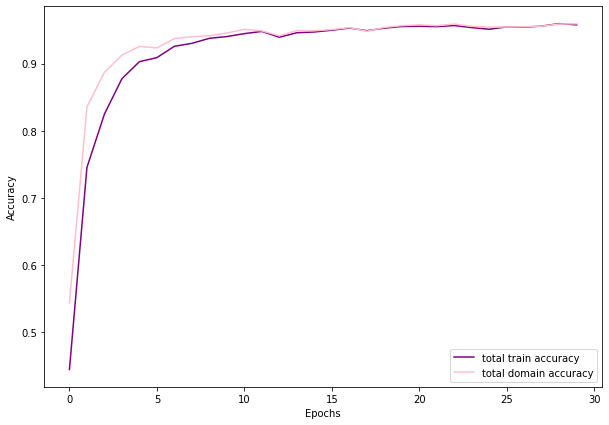

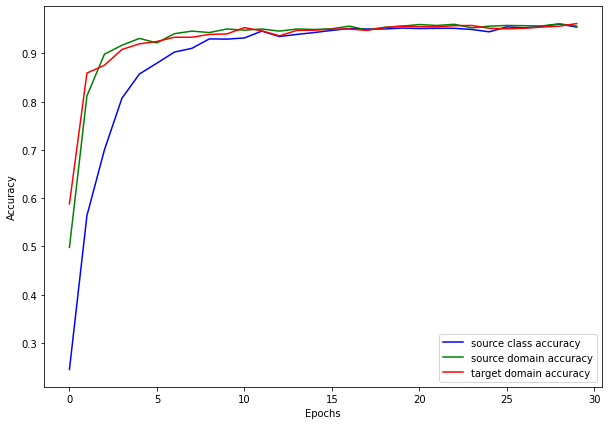

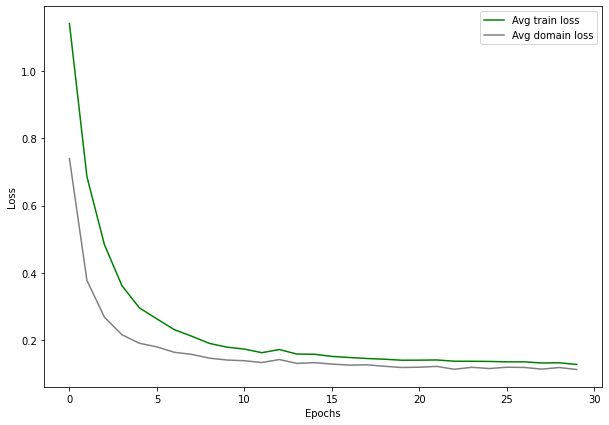

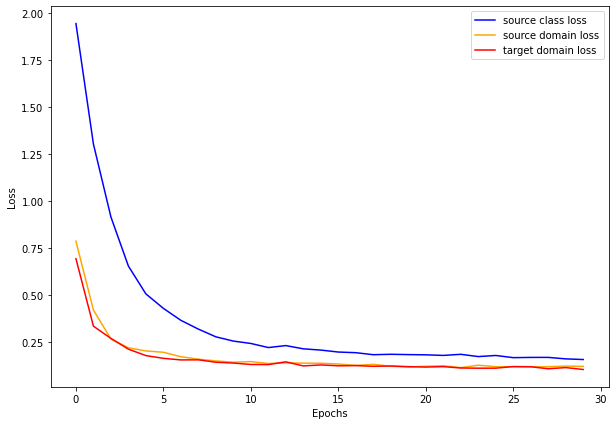

Iteration 8 / 8
lr: 0.001_wd: 4.9999999999999996e-06_gamma: 0.31628657683820305_alpha: 0.3033630215977338
Starting epoch 1/30, LR = [0.001]




Source class Loss: 1.3750, Train class Acc: 0.50
Target class Loss: 0.6559, Val class Acc: 0.37
Source domain Loss: 0.4640, Source domain Acc: 0.75
Target domain Loss: 0.4841, Target domain Acc: 0.76
Total train Loss: 0.7744, Total train Acc: 0.67
Total domain Loss: 0.4741, Total domain Acc: 0.76


Starting epoch 2/30, LR = [0.001]




Source class Loss: 0.3755, Train class Acc: 0.91
Target class Loss: 0.2065, Val class Acc: 0.39
Source domain Loss: 0.2325, Source domain Acc: 0.92
Target domain Loss: 0.2870, Target domain Acc: 0.90
Total train Loss: 0.2983, Total train Acc: 0.91
Total domain Loss: 0.2597, Total domain Acc: 0.91


Starting epoch 3/30, LR = [0.001]




Source class Loss: 0.1972, Train class Acc: 0.95
Target class Loss: 0.2011, Val class Acc: 0.40
Source domain Loss: 0.2192, Source domain Acc: 0.93
Target domain Loss: 0.1116, Target domain Acc: 0.96
Total train Loss: 0.1760, Total train Acc: 0.94
Total domain Loss: 0.1654, Total domain Acc: 0.94


Starting epoch 4/30, LR = [0.001]




Source class Loss: 0.1509, Train class Acc: 0.96
Target class Loss: 0.1326, Val class Acc: 0.41
Source domain Loss: 0.1183, Source domain Acc: 0.96
Target domain Loss: 0.1453, Target domain Acc: 0.94
Total train Loss: 0.1382, Total train Acc: 0.95
Total domain Loss: 0.1318, Total domain Acc: 0.95


Starting epoch 5/30, LR = [0.001]




Source class Loss: 0.1106, Train class Acc: 0.97
Target class Loss: 0.0927, Val class Acc: 0.42
Source domain Loss: 0.0951, Source domain Acc: 0.96
Target domain Loss: 0.1129, Target domain Acc: 0.95
Total train Loss: 0.1062, Total train Acc: 0.96
Total domain Loss: 0.1040, Total domain Acc: 0.96


Starting epoch 6/30, LR = [0.001]




Source class Loss: 0.0976, Train class Acc: 0.97
Target class Loss: 0.0914, Val class Acc: 0.44
Source domain Loss: 0.1010, Source domain Acc: 0.96
Target domain Loss: 0.0586, Target domain Acc: 0.98
Total train Loss: 0.0858, Total train Acc: 0.97
Total domain Loss: 0.0798, Total domain Acc: 0.97


Starting epoch 7/30, LR = [0.001]




Source class Loss: 0.0809, Train class Acc: 0.98
Target class Loss: 0.0936, Val class Acc: 0.45
Source domain Loss: 0.0664, Source domain Acc: 0.97
Target domain Loss: 0.0789, Target domain Acc: 0.97
Total train Loss: 0.0754, Total train Acc: 0.97
Total domain Loss: 0.0726, Total domain Acc: 0.97


Starting epoch 8/30, LR = [0.001]




Source class Loss: 0.0706, Train class Acc: 0.98
Target class Loss: 0.0671, Val class Acc: 0.45
Source domain Loss: 0.0568, Source domain Acc: 0.98
Target domain Loss: 0.0575, Target domain Acc: 0.98
Total train Loss: 0.0616, Total train Acc: 0.98
Total domain Loss: 0.0572, Total domain Acc: 0.98


Starting epoch 9/30, LR = [0.001]




Source class Loss: 0.0557, Train class Acc: 0.98
Target class Loss: 0.0700, Val class Acc: 0.46
Source domain Loss: 0.0596, Source domain Acc: 0.98
Target domain Loss: 0.0458, Target domain Acc: 0.99
Total train Loss: 0.0537, Total train Acc: 0.98
Total domain Loss: 0.0527, Total domain Acc: 0.98


Starting epoch 10/30, LR = [0.001]




Source class Loss: 0.0496, Train class Acc: 0.98
Target class Loss: 0.0548, Val class Acc: 0.45
Source domain Loss: 0.0471, Source domain Acc: 0.98
Target domain Loss: 0.0507, Target domain Acc: 0.98
Total train Loss: 0.0492, Total train Acc: 0.98
Total domain Loss: 0.0489, Total domain Acc: 0.98


Starting epoch 11/30, LR = [0.00031628657683820306]




Source class Loss: 0.0433, Train class Acc: 0.99
Target class Loss: 0.0371, Val class Acc: 0.46
Source domain Loss: 0.0429, Source domain Acc: 0.98
Target domain Loss: 0.0400, Target domain Acc: 0.99
Total train Loss: 0.0421, Total train Acc: 0.99
Total domain Loss: 0.0415, Total domain Acc: 0.99


Starting epoch 12/30, LR = [0.00031628657683820306]




Source class Loss: 0.0408, Train class Acc: 0.99
Target class Loss: 0.0436, Val class Acc: 0.45
Source domain Loss: 0.0328, Source domain Acc: 0.99
Target domain Loss: 0.0446, Target domain Acc: 0.98
Total train Loss: 0.0394, Total train Acc: 0.99
Total domain Loss: 0.0387, Total domain Acc: 0.99


Starting epoch 13/30, LR = [0.00031628657683820306]




Source class Loss: 0.0398, Train class Acc: 0.99
Target class Loss: 0.0586, Val class Acc: 0.45
Source domain Loss: 0.0401, Source domain Acc: 0.98
Target domain Loss: 0.0274, Target domain Acc: 0.99
Total train Loss: 0.0358, Total train Acc: 0.99
Total domain Loss: 0.0338, Total domain Acc: 0.99


Starting epoch 14/30, LR = [0.00031628657683820306]




Source class Loss: 0.0409, Train class Acc: 0.99
Target class Loss: 0.0369, Val class Acc: 0.45
Source domain Loss: 0.0238, Source domain Acc: 0.99
Target domain Loss: 0.0339, Target domain Acc: 0.99
Total train Loss: 0.0329, Total train Acc: 0.99
Total domain Loss: 0.0289, Total domain Acc: 0.99


Starting epoch 15/30, LR = [0.00031628657683820306]




Source class Loss: 0.0386, Train class Acc: 0.99
Target class Loss: 0.0448, Val class Acc: 0.45
Source domain Loss: 0.0352, Source domain Acc: 0.99
Target domain Loss: 0.0321, Target domain Acc: 0.99
Total train Loss: 0.0353, Total train Acc: 0.99
Total domain Loss: 0.0337, Total domain Acc: 0.99


Starting epoch 16/30, LR = [0.00031628657683820306]




Source class Loss: 0.0335, Train class Acc: 0.99
Target class Loss: 0.0311, Val class Acc: 0.45
Source domain Loss: 0.0318, Source domain Acc: 0.99
Target domain Loss: 0.0329, Target domain Acc: 0.99
Total train Loss: 0.0327, Total train Acc: 0.99
Total domain Loss: 0.0324, Total domain Acc: 0.99


Starting epoch 17/30, LR = [0.00031628657683820306]




Source class Loss: 0.0374, Train class Acc: 0.99
Target class Loss: 0.0433, Val class Acc: 0.45
Source domain Loss: 0.0310, Source domain Acc: 0.99
Target domain Loss: 0.0299, Target domain Acc: 0.99
Total train Loss: 0.0328, Total train Acc: 0.99
Total domain Loss: 0.0305, Total domain Acc: 0.99


Starting epoch 18/30, LR = [0.00031628657683820306]




Source class Loss: 0.0325, Train class Acc: 0.99
Target class Loss: 0.0258, Val class Acc: 0.45
Source domain Loss: 0.0295, Source domain Acc: 0.99
Target domain Loss: 0.0279, Target domain Acc: 0.99
Total train Loss: 0.0300, Total train Acc: 0.99
Total domain Loss: 0.0287, Total domain Acc: 0.99


Starting epoch 19/30, LR = [0.00031628657683820306]




Source class Loss: 0.0329, Train class Acc: 0.99
Target class Loss: 0.0248, Val class Acc: 0.45
Source domain Loss: 0.0286, Source domain Acc: 0.99
Target domain Loss: 0.0275, Target domain Acc: 0.99
Total train Loss: 0.0297, Total train Acc: 0.99
Total domain Loss: 0.0281, Total domain Acc: 0.99


Starting epoch 20/30, LR = [0.00031628657683820306]




Source class Loss: 0.0318, Train class Acc: 0.99
Target class Loss: 0.0190, Val class Acc: 0.45
Source domain Loss: 0.0236, Source domain Acc: 0.99
Target domain Loss: 0.0259, Target domain Acc: 0.99
Total train Loss: 0.0271, Total train Acc: 0.99
Total domain Loss: 0.0247, Total domain Acc: 0.99


Starting epoch 21/30, LR = [0.00010003719868802852]




Source class Loss: 0.0302, Train class Acc: 0.99
Target class Loss: 0.0329, Val class Acc: 0.45
Source domain Loss: 0.0257, Source domain Acc: 0.99
Target domain Loss: 0.0245, Target domain Acc: 0.99
Total train Loss: 0.0268, Total train Acc: 0.99
Total domain Loss: 0.0251, Total domain Acc: 0.99


Starting epoch 22/30, LR = [0.00010003719868802852]




Source class Loss: 0.0271, Train class Acc: 0.99
Target class Loss: 0.0238, Val class Acc: 0.45
Source domain Loss: 0.0282, Source domain Acc: 0.99
Target domain Loss: 0.0265, Target domain Acc: 0.99
Total train Loss: 0.0273, Total train Acc: 0.99
Total domain Loss: 0.0274, Total domain Acc: 0.99


Starting epoch 23/30, LR = [0.00010003719868802852]




Source class Loss: 0.0308, Train class Acc: 0.99
Target class Loss: 0.0292, Val class Acc: 0.45
Source domain Loss: 0.0290, Source domain Acc: 0.99
Target domain Loss: 0.0258, Target domain Acc: 0.99
Total train Loss: 0.0285, Total train Acc: 0.99
Total domain Loss: 0.0274, Total domain Acc: 0.99


Starting epoch 24/30, LR = [0.00010003719868802852]




Source class Loss: 0.0289, Train class Acc: 0.99
Target class Loss: 0.0335, Val class Acc: 0.45
Source domain Loss: 0.0229, Source domain Acc: 0.99
Target domain Loss: 0.0247, Target domain Acc: 0.99
Total train Loss: 0.0255, Total train Acc: 0.99
Total domain Loss: 0.0238, Total domain Acc: 0.99


Starting epoch 25/30, LR = [0.00010003719868802852]




Source class Loss: 0.0282, Train class Acc: 0.99
Target class Loss: 0.0236, Val class Acc: 0.45
Source domain Loss: 0.0264, Source domain Acc: 0.99
Target domain Loss: 0.0235, Target domain Acc: 1.00
Total train Loss: 0.0260, Total train Acc: 0.99
Total domain Loss: 0.0249, Total domain Acc: 0.99


Starting epoch 26/30, LR = [0.00010003719868802852]




Source class Loss: 0.0273, Train class Acc: 0.99
Target class Loss: 0.0218, Val class Acc: 0.45
Source domain Loss: 0.0218, Source domain Acc: 0.99
Target domain Loss: 0.0246, Target domain Acc: 0.99
Total train Loss: 0.0246, Total train Acc: 0.99
Total domain Loss: 0.0232, Total domain Acc: 0.99


Starting epoch 27/30, LR = [0.00010003719868802852]




Source class Loss: 0.0264, Train class Acc: 1.00
Target class Loss: 0.0207, Val class Acc: 0.45
Source domain Loss: 0.0243, Source domain Acc: 0.99
Target domain Loss: 0.0211, Target domain Acc: 0.99
Total train Loss: 0.0239, Total train Acc: 0.99
Total domain Loss: 0.0227, Total domain Acc: 0.99


Starting epoch 28/30, LR = [0.00010003719868802852]




Source class Loss: 0.0254, Train class Acc: 1.00
Target class Loss: 0.0319, Val class Acc: 0.45
Source domain Loss: 0.0236, Source domain Acc: 0.99
Target domain Loss: 0.0210, Target domain Acc: 1.00
Total train Loss: 0.0233, Total train Acc: 0.99
Total domain Loss: 0.0223, Total domain Acc: 0.99


Starting epoch 29/30, LR = [0.00010003719868802852]




Source class Loss: 0.0261, Train class Acc: 1.00
Target class Loss: 0.0233, Val class Acc: 0.45
Source domain Loss: 0.0243, Source domain Acc: 0.99
Target domain Loss: 0.0261, Target domain Acc: 0.99
Total train Loss: 0.0255, Total train Acc: 0.99
Total domain Loss: 0.0252, Total domain Acc: 0.99


Starting epoch 30/30, LR = [0.00010003719868802852]




Source class Loss: 0.0260, Train class Acc: 1.00
Target class Loss: 0.0299, Val class Acc: 0.45
Source domain Loss: 0.0213, Source domain Acc: 0.99
Target domain Loss: 0.0246, Target domain Acc: 0.99
Total train Loss: 0.0240, Total train Acc: 0.99
Total domain Loss: 0.0230, Total domain Acc: 0.99




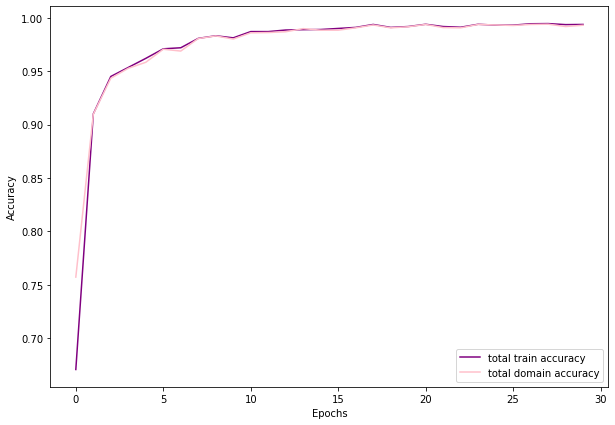

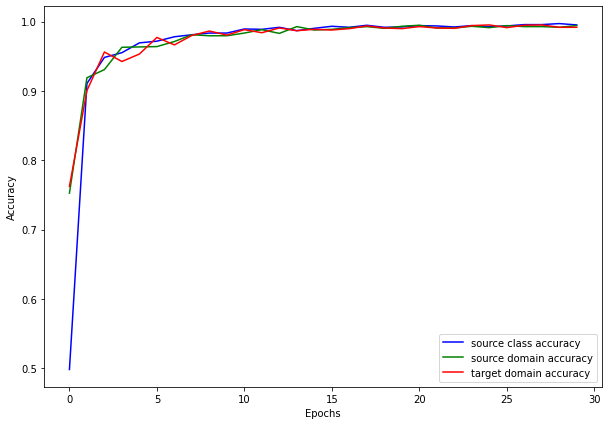

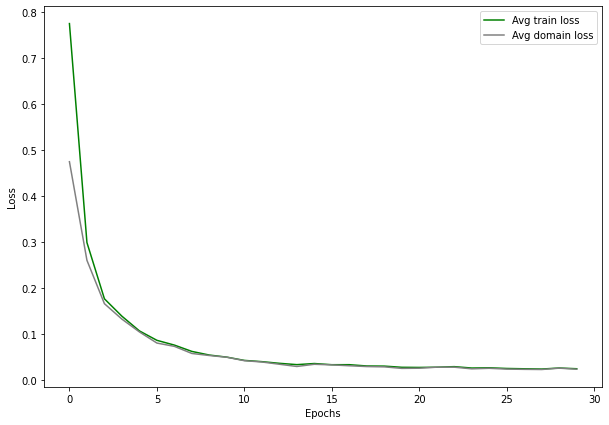

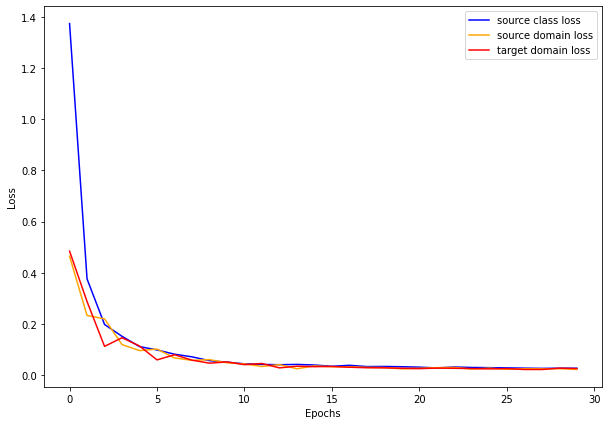

In [ ]:
import random
num_iters=8

for i in range(num_iters):    
    print(f'Iteration {i+1} / {num_iters}')
    lr = 10**(-random.randint(2,4))
    wd = 5*10**(-random.randint(4,6))
    gamma = random.uniform(0.1,0.5)
    alpha = random.uniform(0.01,0.5)
    s = f'lr: {lr}_wd: {wd}_gamma: {gamma}_alpha: {alpha}'
    print(s)
    net = alexnet(pretrained=True)
    net.classifier[6] = nn.Linear(4096, NUM_CLASSES)
    net.domain_classifier[6] = nn.Linear(4096,NUM_DOMAINS)
    parameters_to_optimize = net.parameters() 
    optimizer = optim.SGD(parameters_to_optimize, lr=lr, momentum=MOMENTUM, weight_decay=wd)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=gamma)
    train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy = train_dann(net,src_dataloader=src_dataloader,target_dataloader=target_dataloader,ALPHA=ALPHA)
    plot_DANN(train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy ,"DANN"+ s)

### TESTING THE BEST SET

In [ ]:
DEVICE = 'cuda' 

NUM_CLASSES = 7 
BATCH_SIZE = 256     
                     

LR = 1e-3            
MOMENTUM = 0.9       
WEIGHT_DECAY = 5e-6  
ALPHA = 0.30       

NUM_EPOCHS = 30      
STEP_SIZE = 10       
GAMMA = 0.32          

LOG_FREQUENCY = 10

NUM_DOMAINS = 2

In [ ]:
BATCH_SIZE = 256
src_dataloader = DataLoader(src_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
target_dataloader = DataLoader(target_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(pretrained=True) 

net.classifier[6] = nn.Linear(4096, NUM_CLASSES) 
                                                 
net.domain_classifier[6] = nn.Linear(4096,NUM_DOMAINS)
criterion = nn.CrossEntropyLoss() 
domain_criterion = nn.CrossEntropyLoss()
 


parameters_to_optimize = net.parameters() 


optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)


scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)


In [ ]:
train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy = train_dann(net,src_dataloader=src_dataloader,target_dataloader=target_dataloader,ALPHA=ALPHA)

Starting epoch 1/30, LR = [0.001]




Source class Loss: 1.2787, Train class Acc: 0.55
Target class Loss: 0.5857, Val class Acc: 0.41
Source domain Loss: 0.4463, Source domain Acc: 0.77
Target domain Loss: 0.4350, Target domain Acc: 0.81
Total train Loss: 0.7200, Total train Acc: 0.71
Total domain Loss: 0.4407, Total domain Acc: 0.79


Starting epoch 2/30, LR = [0.001]




Source class Loss: 0.3429, Train class Acc: 0.90
Target class Loss: 0.2584, Val class Acc: 0.42
Source domain Loss: 0.2464, Source domain Acc: 0.91
Target domain Loss: 0.2678, Target domain Acc: 0.91
Total train Loss: 0.2857, Total train Acc: 0.91
Total domain Loss: 0.2571, Total domain Acc: 0.91


Starting epoch 3/30, LR = [0.001]




Source class Loss: 0.1672, Train class Acc: 0.95
Target class Loss: 0.1169, Val class Acc: 0.43
Source domain Loss: 0.2142, Source domain Acc: 0.93
Target domain Loss: 0.1008, Target domain Acc: 0.96
Total train Loss: 0.1608, Total train Acc: 0.95
Total domain Loss: 0.1575, Total domain Acc: 0.95


Starting epoch 4/30, LR = [0.001]




Source class Loss: 0.1383, Train class Acc: 0.96
Target class Loss: 0.1446, Val class Acc: 0.43
Source domain Loss: 0.1226, Source domain Acc: 0.96
Target domain Loss: 0.1587, Target domain Acc: 0.94
Total train Loss: 0.1398, Total train Acc: 0.95
Total domain Loss: 0.1406, Total domain Acc: 0.95


Starting epoch 5/30, LR = [0.001]




Source class Loss: 0.1098, Train class Acc: 0.96
Target class Loss: 0.0996, Val class Acc: 0.45
Source domain Loss: 0.0855, Source domain Acc: 0.97
Target domain Loss: 0.1234, Target domain Acc: 0.95
Total train Loss: 0.1062, Total train Acc: 0.96
Total domain Loss: 0.1044, Total domain Acc: 0.96


Starting epoch 6/30, LR = [0.001]




Source class Loss: 0.0970, Train class Acc: 0.97
Target class Loss: 0.1058, Val class Acc: 0.46
Source domain Loss: 0.1098, Source domain Acc: 0.96
Target domain Loss: 0.0530, Target domain Acc: 0.98
Total train Loss: 0.0866, Total train Acc: 0.97
Total domain Loss: 0.0814, Total domain Acc: 0.97


Starting epoch 7/30, LR = [0.001]




Source class Loss: 0.0786, Train class Acc: 0.98
Target class Loss: 0.0810, Val class Acc: 0.46
Source domain Loss: 0.0480, Source domain Acc: 0.98
Target domain Loss: 0.0886, Target domain Acc: 0.96
Total train Loss: 0.0718, Total train Acc: 0.97
Total domain Loss: 0.0683, Total domain Acc: 0.97


Starting epoch 8/30, LR = [0.001]




Source class Loss: 0.0661, Train class Acc: 0.98
Target class Loss: 0.0489, Val class Acc: 0.44
Source domain Loss: 0.0680, Source domain Acc: 0.97
Target domain Loss: 0.0541, Target domain Acc: 0.98
Total train Loss: 0.0627, Total train Acc: 0.98
Total domain Loss: 0.0610, Total domain Acc: 0.98


Starting epoch 9/30, LR = [0.001]




Source class Loss: 0.0631, Train class Acc: 0.98
Target class Loss: 0.0585, Val class Acc: 0.44
Source domain Loss: 0.0561, Source domain Acc: 0.98
Target domain Loss: 0.0434, Target domain Acc: 0.98
Total train Loss: 0.0542, Total train Acc: 0.98
Total domain Loss: 0.0497, Total domain Acc: 0.98


Starting epoch 10/30, LR = [0.001]




Source class Loss: 0.0500, Train class Acc: 0.98
Target class Loss: 0.0391, Val class Acc: 0.46
Source domain Loss: 0.0447, Source domain Acc: 0.99
Target domain Loss: 0.0441, Target domain Acc: 0.99
Total train Loss: 0.0463, Total train Acc: 0.99
Total domain Loss: 0.0444, Total domain Acc: 0.99


Starting epoch 11/30, LR = [0.00032]




Source class Loss: 0.0454, Train class Acc: 0.99
Target class Loss: 0.0389, Val class Acc: 0.45
Source domain Loss: 0.0364, Source domain Acc: 0.99
Target domain Loss: 0.0359, Target domain Acc: 0.99
Total train Loss: 0.0393, Total train Acc: 0.99
Total domain Loss: 0.0362, Total domain Acc: 0.99


Starting epoch 12/30, LR = [0.00032]




Source class Loss: 0.0394, Train class Acc: 0.99
Target class Loss: 0.0482, Val class Acc: 0.45
Source domain Loss: 0.0341, Source domain Acc: 0.99
Target domain Loss: 0.0390, Target domain Acc: 0.98
Total train Loss: 0.0375, Total train Acc: 0.99
Total domain Loss: 0.0366, Total domain Acc: 0.99


Starting epoch 13/30, LR = [0.00032]




Source class Loss: 0.0386, Train class Acc: 0.99
Target class Loss: 0.0313, Val class Acc: 0.45
Source domain Loss: 0.0334, Source domain Acc: 0.99
Target domain Loss: 0.0316, Target domain Acc: 0.99
Total train Loss: 0.0345, Total train Acc: 0.99
Total domain Loss: 0.0325, Total domain Acc: 0.99


Starting epoch 14/30, LR = [0.00032]




Source class Loss: 0.0403, Train class Acc: 0.99
Target class Loss: 0.0357, Val class Acc: 0.45
Source domain Loss: 0.0278, Source domain Acc: 0.99
Target domain Loss: 0.0331, Target domain Acc: 0.99
Total train Loss: 0.0337, Total train Acc: 0.99
Total domain Loss: 0.0305, Total domain Acc: 0.99


Starting epoch 15/30, LR = [0.00032]




Source class Loss: 0.0317, Train class Acc: 0.99
Target class Loss: 0.0256, Val class Acc: 0.45
Source domain Loss: 0.0341, Source domain Acc: 0.99
Target domain Loss: 0.0321, Target domain Acc: 0.99
Total train Loss: 0.0326, Total train Acc: 0.99
Total domain Loss: 0.0331, Total domain Acc: 0.99


Starting epoch 16/30, LR = [0.00032]




Source class Loss: 0.0346, Train class Acc: 0.99
Target class Loss: 0.0389, Val class Acc: 0.45
Source domain Loss: 0.0304, Source domain Acc: 0.99
Target domain Loss: 0.0349, Target domain Acc: 0.99
Total train Loss: 0.0333, Total train Acc: 0.99
Total domain Loss: 0.0327, Total domain Acc: 0.99


Starting epoch 17/30, LR = [0.00032]




Source class Loss: 0.0348, Train class Acc: 0.99
Target class Loss: 0.0511, Val class Acc: 0.45
Source domain Loss: 0.0328, Source domain Acc: 0.99
Target domain Loss: 0.0251, Target domain Acc: 0.99
Total train Loss: 0.0309, Total train Acc: 0.99
Total domain Loss: 0.0289, Total domain Acc: 0.99


Starting epoch 18/30, LR = [0.00032]




Source class Loss: 0.0343, Train class Acc: 0.99
Target class Loss: 0.0377, Val class Acc: 0.45
Source domain Loss: 0.0279, Source domain Acc: 0.99
Target domain Loss: 0.0278, Target domain Acc: 0.99
Total train Loss: 0.0300, Total train Acc: 0.99
Total domain Loss: 0.0279, Total domain Acc: 0.99


Starting epoch 19/30, LR = [0.00032]




Source class Loss: 0.0286, Train class Acc: 0.99
Target class Loss: 0.0247, Val class Acc: 0.45
Source domain Loss: 0.0270, Source domain Acc: 0.99
Target domain Loss: 0.0284, Target domain Acc: 0.99
Total train Loss: 0.0280, Total train Acc: 0.99
Total domain Loss: 0.0277, Total domain Acc: 0.99


Starting epoch 20/30, LR = [0.00032]




Source class Loss: 0.0286, Train class Acc: 1.00
Target class Loss: 0.0367, Val class Acc: 0.45
Source domain Loss: 0.0262, Source domain Acc: 0.99
Target domain Loss: 0.0270, Target domain Acc: 0.99
Total train Loss: 0.0273, Total train Acc: 0.99
Total domain Loss: 0.0266, Total domain Acc: 0.99


Starting epoch 21/30, LR = [0.00010240000000000001]




Source class Loss: 0.0269, Train class Acc: 0.99
Target class Loss: 0.0229, Val class Acc: 0.45
Source domain Loss: 0.0266, Source domain Acc: 0.99
Target domain Loss: 0.0237, Target domain Acc: 0.99
Total train Loss: 0.0257, Total train Acc: 0.99
Total domain Loss: 0.0251, Total domain Acc: 0.99


Starting epoch 22/30, LR = [0.00010240000000000001]




Source class Loss: 0.0274, Train class Acc: 0.99
Target class Loss: 0.0165, Val class Acc: 0.45
Source domain Loss: 0.0211, Source domain Acc: 1.00
Target domain Loss: 0.0241, Target domain Acc: 0.99
Total train Loss: 0.0242, Total train Acc: 0.99
Total domain Loss: 0.0226, Total domain Acc: 0.99


Starting epoch 23/30, LR = [0.00010240000000000001]




Source class Loss: 0.0281, Train class Acc: 0.99
Target class Loss: 0.0402, Val class Acc: 0.45
Source domain Loss: 0.0226, Source domain Acc: 0.99
Target domain Loss: 0.0273, Target domain Acc: 0.99
Total train Loss: 0.0260, Total train Acc: 0.99
Total domain Loss: 0.0250, Total domain Acc: 0.99


Starting epoch 24/30, LR = [0.00010240000000000001]




Source class Loss: 0.0272, Train class Acc: 0.99
Target class Loss: 0.0372, Val class Acc: 0.45
Source domain Loss: 0.0246, Source domain Acc: 0.99
Target domain Loss: 0.0248, Target domain Acc: 0.99
Total train Loss: 0.0256, Total train Acc: 0.99
Total domain Loss: 0.0247, Total domain Acc: 0.99


Starting epoch 25/30, LR = [0.00010240000000000001]




Source class Loss: 0.0296, Train class Acc: 0.99
Target class Loss: 0.0215, Val class Acc: 0.45
Source domain Loss: 0.0260, Source domain Acc: 0.99
Target domain Loss: 0.0242, Target domain Acc: 0.99
Total train Loss: 0.0266, Total train Acc: 0.99
Total domain Loss: 0.0251, Total domain Acc: 0.99


Starting epoch 26/30, LR = [0.00010240000000000001]




Source class Loss: 0.0277, Train class Acc: 0.99
Target class Loss: 0.0274, Val class Acc: 0.45
Source domain Loss: 0.0236, Source domain Acc: 0.99
Target domain Loss: 0.0218, Target domain Acc: 0.99
Total train Loss: 0.0244, Total train Acc: 0.99
Total domain Loss: 0.0227, Total domain Acc: 0.99


Starting epoch 27/30, LR = [0.00010240000000000001]




Source class Loss: 0.0272, Train class Acc: 1.00
Target class Loss: 0.0324, Val class Acc: 0.45
Source domain Loss: 0.0213, Source domain Acc: 0.99
Target domain Loss: 0.0239, Target domain Acc: 0.99
Total train Loss: 0.0241, Total train Acc: 0.99
Total domain Loss: 0.0226, Total domain Acc: 0.99


Starting epoch 28/30, LR = [0.00010240000000000001]




Source class Loss: 0.0287, Train class Acc: 0.99
Target class Loss: 0.0332, Val class Acc: 0.45
Source domain Loss: 0.0242, Source domain Acc: 0.99
Target domain Loss: 0.0227, Target domain Acc: 0.99
Total train Loss: 0.0252, Total train Acc: 0.99
Total domain Loss: 0.0235, Total domain Acc: 0.99


Starting epoch 29/30, LR = [0.00010240000000000001]




Source class Loss: 0.0263, Train class Acc: 0.99
Target class Loss: 0.0298, Val class Acc: 0.45
Source domain Loss: 0.0245, Source domain Acc: 0.99
Target domain Loss: 0.0257, Target domain Acc: 0.99
Total train Loss: 0.0255, Total train Acc: 0.99
Total domain Loss: 0.0251, Total domain Acc: 0.99


Starting epoch 30/30, LR = [0.00010240000000000001]




Source class Loss: 0.0301, Train class Acc: 0.99
Target class Loss: 0.0347, Val class Acc: 0.45
Source domain Loss: 0.0250, Source domain Acc: 0.99
Target domain Loss: 0.0262, Target domain Acc: 0.99
Total train Loss: 0.0271, Total train Acc: 0.99
Total domain Loss: 0.0256, Total domain Acc: 0.99




In [ ]:
test(net,target_dataloader)



Test Accuracy: 0.453125


0.453125

# VALIDATE ON OTHER DATALOADERS

## NO DOMAIN ADAPTATION

### RUNS

In [ ]:
NUM_CLASSES = 7 

BATCH_SIZE = 256     

LR = 1e-2            
MOMENTUM = 0.9       
WEIGHT_DECAY = 5e-5  
ALPHA = 0.1         

NUM_EPOCHS = 30      
STEP_SIZE = 10       
GAMMA = 0.1          

LOG_FREQUENCY = 10

NUM_DOMAINS = 2

Iteration 1 / 8
lr: 0.001_wd: 4.9999999999999996e-06_gamma: 0.27451915596085785
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.3944973945617676




Train Loss: 1.5860, Train Acc: 0.43
Val Loss: 1.9389, Val Acc: 0.27


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.3033987283706665




Train Loss: 0.4724, Train Acc: 0.86
Val Loss: 2.1887, Val Acc: 0.27


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2128, Train Acc: 0.93
Val Loss: 3.0176, Val Acc: 0.23


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.12353463470935822




Train Loss: 0.1394, Train Acc: 0.96
Val Loss: 3.8514, Val Acc: 0.21


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1185, Train Acc: 0.97
Val Loss: 4.2448, Val Acc: 0.21


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.09707684069871902




Train Loss: 0.0999, Train Acc: 0.97
Val Loss: 4.3194, Val Acc: 0.22


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.06548459082841873




Train Loss: 0.0779, Train Acc: 0.97
Val Loss: 4.2915, Val Acc: 0.23


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0689, Train Acc: 0.98
Val Loss: 4.2830, Val Acc: 0.24


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.06157861649990082




Train Loss: 0.0586, Train Acc: 0.98
Val Loss: 4.2825, Val Acc: 0.24


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0565, Train Acc: 0.99
Val Loss: 4.4311, Val Acc: 0.23


Starting epoch 11/30, LR = [0.00027451915596085787]
Step 60, Loss 0.06580734252929688




Train Loss: 0.0527, Train Acc: 0.98
Val Loss: 4.4420, Val Acc: 0.23


Starting epoch 12/30, LR = [0.00027451915596085787]
Step 70, Loss 0.07151374965906143




Train Loss: 0.0505, Train Acc: 0.99
Val Loss: 4.4256, Val Acc: 0.23


Starting epoch 13/30, LR = [0.00027451915596085787]




Train Loss: 0.0471, Train Acc: 0.99
Val Loss: 4.4078, Val Acc: 0.23


Starting epoch 14/30, LR = [0.00027451915596085787]
Step 80, Loss 0.03330124542117119




Train Loss: 0.0400, Train Acc: 0.99
Val Loss: 4.3807, Val Acc: 0.24


Starting epoch 15/30, LR = [0.00027451915596085787]




Train Loss: 0.0430, Train Acc: 0.99
Val Loss: 4.3634, Val Acc: 0.24


Starting epoch 16/30, LR = [0.00027451915596085787]
Step 90, Loss 0.04895052686333656




Train Loss: 0.0392, Train Acc: 0.99
Val Loss: 4.3249, Val Acc: 0.24


Starting epoch 17/30, LR = [0.00027451915596085787]
Step 100, Loss 0.044309139251708984




Train Loss: 0.0411, Train Acc: 0.99
Val Loss: 4.2809, Val Acc: 0.24


Starting epoch 18/30, LR = [0.00027451915596085787]




Train Loss: 0.0425, Train Acc: 0.99
Val Loss: 4.2527, Val Acc: 0.25


Starting epoch 19/30, LR = [0.00027451915596085787]
Step 110, Loss 0.0473983958363533




Train Loss: 0.0410, Train Acc: 0.99
Val Loss: 4.2441, Val Acc: 0.25


Starting epoch 20/30, LR = [0.00027451915596085787]




Train Loss: 0.0325, Train Acc: 0.99
Val Loss: 4.2369, Val Acc: 0.25


Starting epoch 21/30, LR = [7.536076698946181e-05]
Step 120, Loss 0.04756378009915352




Train Loss: 0.0377, Train Acc: 0.99
Val Loss: 4.2350, Val Acc: 0.25


Starting epoch 22/30, LR = [7.536076698946181e-05]
Step 130, Loss 0.025510191917419434




Train Loss: 0.0346, Train Acc: 0.99
Val Loss: 4.2362, Val Acc: 0.25


Starting epoch 23/30, LR = [7.536076698946181e-05]




Train Loss: 0.0370, Train Acc: 0.99
Val Loss: 4.2388, Val Acc: 0.25


Starting epoch 24/30, LR = [7.536076698946181e-05]
Step 140, Loss 0.03269512578845024




Train Loss: 0.0335, Train Acc: 0.99
Val Loss: 4.2413, Val Acc: 0.25


Starting epoch 25/30, LR = [7.536076698946181e-05]




Train Loss: 0.0343, Train Acc: 0.99
Val Loss: 4.2476, Val Acc: 0.25


Starting epoch 26/30, LR = [7.536076698946181e-05]
Step 150, Loss 0.023749791085720062




Train Loss: 0.0300, Train Acc: 0.99
Val Loss: 4.2566, Val Acc: 0.25


Starting epoch 27/30, LR = [7.536076698946181e-05]
Step 160, Loss 0.02995275892317295




Train Loss: 0.0344, Train Acc: 0.99
Val Loss: 4.2631, Val Acc: 0.25


Starting epoch 28/30, LR = [7.536076698946181e-05]




Train Loss: 0.0342, Train Acc: 0.99
Val Loss: 4.2638, Val Acc: 0.25


Starting epoch 29/30, LR = [7.536076698946181e-05]
Step 170, Loss 0.05327106639742851




Train Loss: 0.0367, Train Acc: 0.99
Val Loss: 4.2561, Val Acc: 0.25


Starting epoch 30/30, LR = [7.536076698946181e-05]




Train Loss: 0.0346, Train Acc: 0.99
Val Loss: 4.2543, Val Acc: 0.25




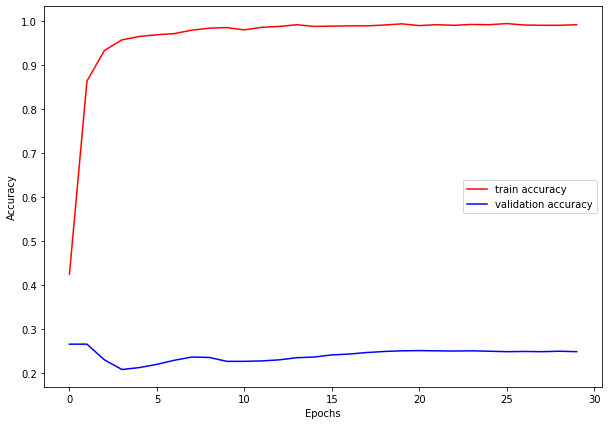

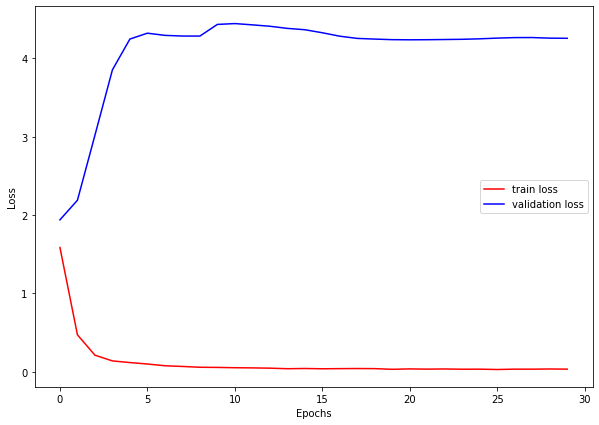

lr: 0.001_wd: 4.9999999999999996e-06_gamma: 0.27451915596085785
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.4086241722106934




Train Loss: 1.5409, Train Acc: 0.46
Val Loss: 1.9212, Val Acc: 0.37


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.3753129243850708




Train Loss: 0.4607, Train Acc: 0.87
Val Loss: 1.7809, Val Acc: 0.46


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2009, Train Acc: 0.94
Val Loss: 1.8943, Val Acc: 0.47


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.14959605038166046




Train Loss: 0.1395, Train Acc: 0.95
Val Loss: 2.1015, Val Acc: 0.47


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1167, Train Acc: 0.96
Val Loss: 2.3080, Val Acc: 0.44


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.08422429114580154




Train Loss: 0.0991, Train Acc: 0.96
Val Loss: 2.5179, Val Acc: 0.40


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.07043930143117905




Train Loss: 0.0765, Train Acc: 0.97
Val Loss: 2.5477, Val Acc: 0.40


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0625, Train Acc: 0.98
Val Loss: 2.4700, Val Acc: 0.42


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.06428681313991547




Train Loss: 0.0553, Train Acc: 0.99
Val Loss: 2.3965, Val Acc: 0.45


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0434, Train Acc: 0.99
Val Loss: 2.3669, Val Acc: 0.46


Starting epoch 11/30, LR = [0.00027451915596085787]
Step 60, Loss 0.02999269589781761




Train Loss: 0.0453, Train Acc: 0.99
Val Loss: 2.3684, Val Acc: 0.45


Starting epoch 12/30, LR = [0.00027451915596085787]
Step 70, Loss 0.035916805267333984




Train Loss: 0.0385, Train Acc: 0.99
Val Loss: 2.3762, Val Acc: 0.45


Starting epoch 13/30, LR = [0.00027451915596085787]




Train Loss: 0.0453, Train Acc: 0.99
Val Loss: 2.3809, Val Acc: 0.44


Starting epoch 14/30, LR = [0.00027451915596085787]
Step 80, Loss 0.037343479692935944




Train Loss: 0.0382, Train Acc: 0.99
Val Loss: 2.3952, Val Acc: 0.44


Starting epoch 15/30, LR = [0.00027451915596085787]




Train Loss: 0.0360, Train Acc: 0.99
Val Loss: 2.4074, Val Acc: 0.44


Starting epoch 16/30, LR = [0.00027451915596085787]
Step 90, Loss 0.028426019474864006




Train Loss: 0.0355, Train Acc: 0.99
Val Loss: 2.4163, Val Acc: 0.44


Starting epoch 17/30, LR = [0.00027451915596085787]
Step 100, Loss 0.032419368624687195




Train Loss: 0.0317, Train Acc: 0.99
Val Loss: 2.4219, Val Acc: 0.44


Starting epoch 18/30, LR = [0.00027451915596085787]




Train Loss: 0.0361, Train Acc: 0.99
Val Loss: 2.4339, Val Acc: 0.43


Starting epoch 19/30, LR = [0.00027451915596085787]
Step 110, Loss 0.03128968924283981




Train Loss: 0.0397, Train Acc: 0.99
Val Loss: 2.4347, Val Acc: 0.43


Starting epoch 20/30, LR = [0.00027451915596085787]




Train Loss: 0.0343, Train Acc: 0.99
Val Loss: 2.4294, Val Acc: 0.43


Starting epoch 21/30, LR = [7.536076698946181e-05]
Step 120, Loss 0.028337838128209114




Train Loss: 0.0318, Train Acc: 0.99
Val Loss: 2.4283, Val Acc: 0.43


Starting epoch 22/30, LR = [7.536076698946181e-05]
Step 130, Loss 0.02018856629729271




Train Loss: 0.0298, Train Acc: 0.99
Val Loss: 2.4288, Val Acc: 0.44


Starting epoch 23/30, LR = [7.536076698946181e-05]




Train Loss: 0.0342, Train Acc: 0.99
Val Loss: 2.4288, Val Acc: 0.44


Starting epoch 24/30, LR = [7.536076698946181e-05]
Step 140, Loss 0.039270028471946716




Train Loss: 0.0273, Train Acc: 1.00
Val Loss: 2.4298, Val Acc: 0.43


Starting epoch 25/30, LR = [7.536076698946181e-05]




Train Loss: 0.0268, Train Acc: 0.99
Val Loss: 2.4313, Val Acc: 0.43


Starting epoch 26/30, LR = [7.536076698946181e-05]
Step 150, Loss 0.033089492470026016




Train Loss: 0.0316, Train Acc: 0.99
Val Loss: 2.4327, Val Acc: 0.43


Starting epoch 27/30, LR = [7.536076698946181e-05]
Step 160, Loss 0.021164778620004654




Train Loss: 0.0305, Train Acc: 0.99
Val Loss: 2.4328, Val Acc: 0.44


Starting epoch 28/30, LR = [7.536076698946181e-05]




Train Loss: 0.0339, Train Acc: 0.99
Val Loss: 2.4333, Val Acc: 0.44


Starting epoch 29/30, LR = [7.536076698946181e-05]
Step 170, Loss 0.04411317780613899




Train Loss: 0.0304, Train Acc: 0.99
Val Loss: 2.4324, Val Acc: 0.44


Starting epoch 30/30, LR = [7.536076698946181e-05]




Train Loss: 0.0246, Train Acc: 1.00
Val Loss: 2.4337, Val Acc: 0.43




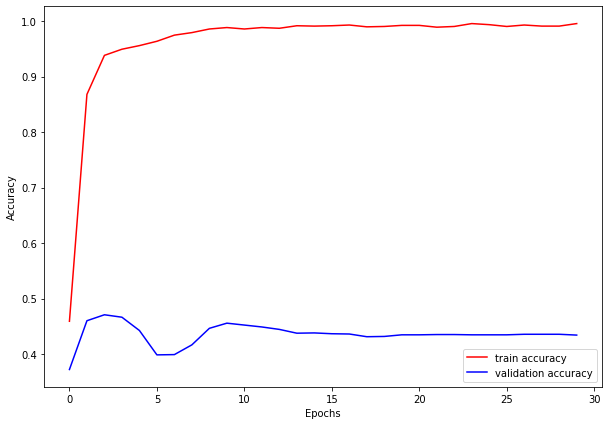

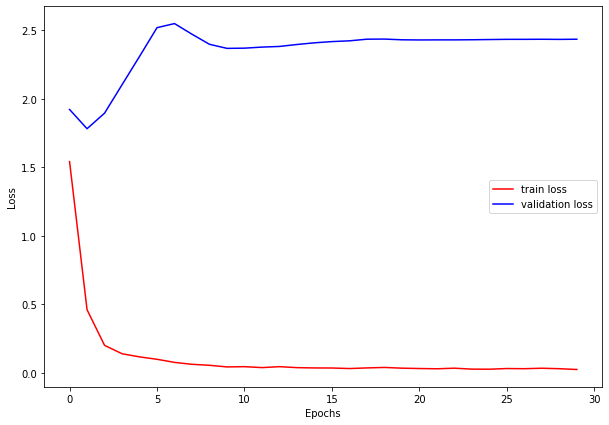

Iteration 2 / 8
lr: 1e-05_wd: 5e-05_gamma: 0.20909160329951387
Starting epoch 1/30, LR = [1e-05]
Step 0, Loss 2.2555739879608154




Train Loss: 2.2283, Train Acc: 0.09
Val Loss: 2.2894, Val Acc: 0.17


Starting epoch 2/30, LR = [1e-05]
Step 10, Loss 2.16866135597229




Train Loss: 2.1607, Train Acc: 0.09
Val Loss: 2.2766, Val Acc: 0.17


Starting epoch 3/30, LR = [1e-05]




Train Loss: 2.0670, Train Acc: 0.11
Val Loss: 2.2609, Val Acc: 0.18


Starting epoch 4/30, LR = [1e-05]
Step 20, Loss 1.9884510040283203




Train Loss: 1.9530, Train Acc: 0.18
Val Loss: 2.2444, Val Acc: 0.18


Starting epoch 5/30, LR = [1e-05]




Train Loss: 1.8338, Train Acc: 0.30
Val Loss: 2.2280, Val Acc: 0.19


Starting epoch 6/30, LR = [1e-05]
Step 30, Loss 1.8239885568618774




Train Loss: 1.7335, Train Acc: 0.36
Val Loss: 2.2125, Val Acc: 0.19


Starting epoch 7/30, LR = [1e-05]
Step 40, Loss 1.6866637468338013




Train Loss: 1.6500, Train Acc: 0.43
Val Loss: 2.1979, Val Acc: 0.20


Starting epoch 8/30, LR = [1e-05]




Train Loss: 1.5617, Train Acc: 0.48
Val Loss: 2.1848, Val Acc: 0.20


Starting epoch 9/30, LR = [1e-05]
Step 50, Loss 1.4332451820373535




Train Loss: 1.4905, Train Acc: 0.52
Val Loss: 2.1724, Val Acc: 0.21


Starting epoch 10/30, LR = [1e-05]




Train Loss: 1.3994, Train Acc: 0.55
Val Loss: 2.1609, Val Acc: 0.22


Starting epoch 11/30, LR = [2.090916032995139e-06]
Step 60, Loss 1.3609949350357056




Train Loss: 1.3735, Train Acc: 0.55
Val Loss: 2.1586, Val Acc: 0.22


Starting epoch 12/30, LR = [2.090916032995139e-06]
Step 70, Loss 1.3227715492248535




Train Loss: 1.3520, Train Acc: 0.56
Val Loss: 2.1564, Val Acc: 0.22


Starting epoch 13/30, LR = [2.090916032995139e-06]




Train Loss: 1.3345, Train Acc: 0.56
Val Loss: 2.1544, Val Acc: 0.22


Starting epoch 14/30, LR = [2.090916032995139e-06]
Step 80, Loss 1.256824016571045




Train Loss: 1.3231, Train Acc: 0.56
Val Loss: 2.1524, Val Acc: 0.22


Starting epoch 15/30, LR = [2.090916032995139e-06]




Train Loss: 1.2968, Train Acc: 0.58
Val Loss: 2.1505, Val Acc: 0.22


Starting epoch 16/30, LR = [2.090916032995139e-06]
Step 90, Loss 1.2292133569717407




Train Loss: 1.2939, Train Acc: 0.58
Val Loss: 2.1486, Val Acc: 0.22


Starting epoch 17/30, LR = [2.090916032995139e-06]
Step 100, Loss 1.2801034450531006




Train Loss: 1.2914, Train Acc: 0.58
Val Loss: 2.1467, Val Acc: 0.22


Starting epoch 18/30, LR = [2.090916032995139e-06]




Train Loss: 1.2763, Train Acc: 0.58
Val Loss: 2.1449, Val Acc: 0.23


Starting epoch 19/30, LR = [2.090916032995139e-06]
Step 110, Loss 1.286797046661377




Train Loss: 1.2695, Train Acc: 0.59
Val Loss: 2.1431, Val Acc: 0.23


Starting epoch 20/30, LR = [2.090916032995139e-06]




Train Loss: 1.2645, Train Acc: 0.58
Val Loss: 2.1414, Val Acc: 0.23


Starting epoch 21/30, LR = [4.371929857036129e-07]
Step 120, Loss 1.2315077781677246




Train Loss: 1.2495, Train Acc: 0.59
Val Loss: 2.1410, Val Acc: 0.23


Starting epoch 22/30, LR = [4.371929857036129e-07]
Step 130, Loss 1.2291477918624878




Train Loss: 1.2548, Train Acc: 0.59
Val Loss: 2.1406, Val Acc: 0.23


Starting epoch 23/30, LR = [4.371929857036129e-07]




Train Loss: 1.2460, Train Acc: 0.59
Val Loss: 2.1403, Val Acc: 0.23


Starting epoch 24/30, LR = [4.371929857036129e-07]
Step 140, Loss 1.2140470743179321




Train Loss: 1.2427, Train Acc: 0.59
Val Loss: 2.1399, Val Acc: 0.23


Starting epoch 25/30, LR = [4.371929857036129e-07]




Train Loss: 1.2528, Train Acc: 0.59
Val Loss: 2.1396, Val Acc: 0.23


Starting epoch 26/30, LR = [4.371929857036129e-07]
Step 150, Loss 1.15425443649292




Train Loss: 1.2415, Train Acc: 0.60
Val Loss: 2.1392, Val Acc: 0.23


Starting epoch 27/30, LR = [4.371929857036129e-07]
Step 160, Loss 1.2507858276367188




Train Loss: 1.2469, Train Acc: 0.60
Val Loss: 2.1389, Val Acc: 0.23


Starting epoch 28/30, LR = [4.371929857036129e-07]




Train Loss: 1.2402, Train Acc: 0.59
Val Loss: 2.1385, Val Acc: 0.23


Starting epoch 29/30, LR = [4.371929857036129e-07]
Step 170, Loss 1.1989446878433228




Train Loss: 1.2453, Train Acc: 0.60
Val Loss: 2.1382, Val Acc: 0.23


Starting epoch 30/30, LR = [4.371929857036129e-07]




Train Loss: 1.2543, Train Acc: 0.59
Val Loss: 2.1378, Val Acc: 0.23




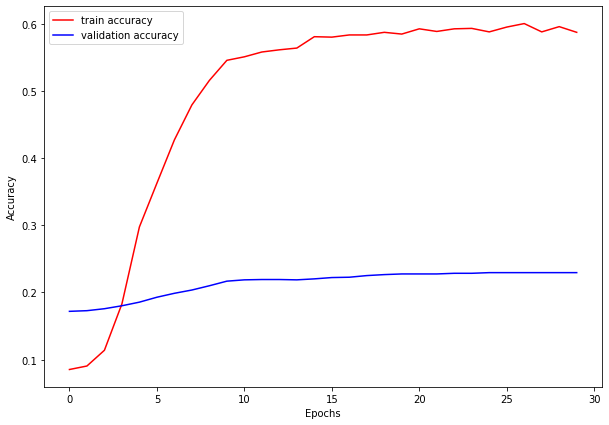

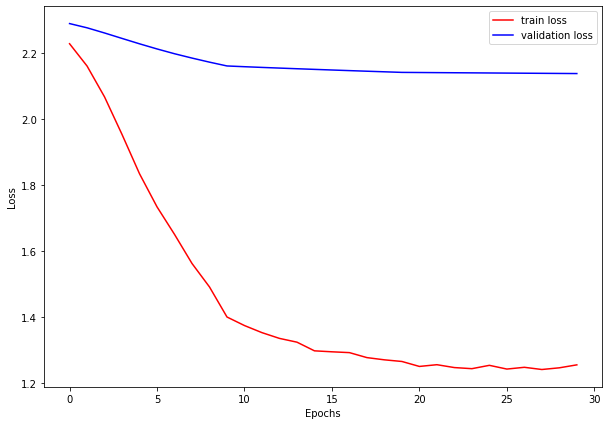

lr: 1e-05_wd: 5e-05_gamma: 0.20909160329951387
Starting epoch 1/30, LR = [1e-05]
Step 0, Loss 2.0102880001068115




Train Loss: 1.9520, Train Acc: 0.25
Val Loss: 2.1520, Val Acc: 0.36


Starting epoch 2/30, LR = [1e-05]
Step 10, Loss 1.894189715385437




Train Loss: 1.9268, Train Acc: 0.27
Val Loss: 2.1464, Val Acc: 0.37


Starting epoch 3/30, LR = [1e-05]




Train Loss: 1.8168, Train Acc: 0.34
Val Loss: 2.1397, Val Acc: 0.37


Starting epoch 4/30, LR = [1e-05]
Step 20, Loss 1.731156587600708




Train Loss: 1.7580, Train Acc: 0.39
Val Loss: 2.1326, Val Acc: 0.38


Starting epoch 5/30, LR = [1e-05]




Train Loss: 1.6460, Train Acc: 0.44
Val Loss: 2.1253, Val Acc: 0.39


Starting epoch 6/30, LR = [1e-05]
Step 30, Loss 1.6221330165863037




Train Loss: 1.5565, Train Acc: 0.47
Val Loss: 2.1177, Val Acc: 0.39


Starting epoch 7/30, LR = [1e-05]
Step 40, Loss 1.5105994939804077




Train Loss: 1.4987, Train Acc: 0.50
Val Loss: 2.1102, Val Acc: 0.40


Starting epoch 8/30, LR = [1e-05]




Train Loss: 1.4270, Train Acc: 0.51
Val Loss: 2.1028, Val Acc: 0.42


Starting epoch 9/30, LR = [1e-05]
Step 50, Loss 1.3816025257110596




Train Loss: 1.3650, Train Acc: 0.54
Val Loss: 2.0956, Val Acc: 0.43


Starting epoch 10/30, LR = [1e-05]




Train Loss: 1.3268, Train Acc: 0.55
Val Loss: 2.0887, Val Acc: 0.44


Starting epoch 11/30, LR = [2.090916032995139e-06]
Step 60, Loss 1.2834672927856445




Train Loss: 1.2810, Train Acc: 0.57
Val Loss: 2.0873, Val Acc: 0.44


Starting epoch 12/30, LR = [2.090916032995139e-06]
Step 70, Loss 1.3397027254104614




Train Loss: 1.2784, Train Acc: 0.56
Val Loss: 2.0859, Val Acc: 0.45


Starting epoch 13/30, LR = [2.090916032995139e-06]




Train Loss: 1.2579, Train Acc: 0.57
Val Loss: 2.0844, Val Acc: 0.45


Starting epoch 14/30, LR = [2.090916032995139e-06]
Step 80, Loss 1.302533745765686




Train Loss: 1.2472, Train Acc: 0.57
Val Loss: 2.0830, Val Acc: 0.45


Starting epoch 15/30, LR = [2.090916032995139e-06]




Train Loss: 1.2322, Train Acc: 0.58
Val Loss: 2.0816, Val Acc: 0.45


Starting epoch 16/30, LR = [2.090916032995139e-06]
Step 90, Loss 1.2302206754684448




Train Loss: 1.2253, Train Acc: 0.58
Val Loss: 2.0802, Val Acc: 0.46


Starting epoch 17/30, LR = [2.090916032995139e-06]
Step 100, Loss 1.2360823154449463




Train Loss: 1.2292, Train Acc: 0.57
Val Loss: 2.0788, Val Acc: 0.46


Starting epoch 18/30, LR = [2.090916032995139e-06]




Train Loss: 1.2199, Train Acc: 0.58
Val Loss: 2.0775, Val Acc: 0.46


Starting epoch 19/30, LR = [2.090916032995139e-06]
Step 110, Loss 1.1957329511642456




Train Loss: 1.2175, Train Acc: 0.59
Val Loss: 2.0761, Val Acc: 0.46


Starting epoch 20/30, LR = [2.090916032995139e-06]




Train Loss: 1.2108, Train Acc: 0.59
Val Loss: 2.0748, Val Acc: 0.47


Starting epoch 21/30, LR = [4.371929857036129e-07]
Step 120, Loss 1.230790376663208




Train Loss: 1.1818, Train Acc: 0.60
Val Loss: 2.0745, Val Acc: 0.47


Starting epoch 22/30, LR = [4.371929857036129e-07]
Step 130, Loss 1.184075117111206




Train Loss: 1.1887, Train Acc: 0.59
Val Loss: 2.0742, Val Acc: 0.47


Starting epoch 23/30, LR = [4.371929857036129e-07]




Train Loss: 1.1999, Train Acc: 0.60
Val Loss: 2.0739, Val Acc: 0.47


Starting epoch 24/30, LR = [4.371929857036129e-07]
Step 140, Loss 1.1928671598434448




Train Loss: 1.1839, Train Acc: 0.60
Val Loss: 2.0736, Val Acc: 0.47


Starting epoch 25/30, LR = [4.371929857036129e-07]




Train Loss: 1.1863, Train Acc: 0.59
Val Loss: 2.0734, Val Acc: 0.48


Starting epoch 26/30, LR = [4.371929857036129e-07]
Step 150, Loss 1.2104519605636597




Train Loss: 1.1626, Train Acc: 0.62
Val Loss: 2.0731, Val Acc: 0.48


Starting epoch 27/30, LR = [4.371929857036129e-07]
Step 160, Loss 1.2014896869659424




Train Loss: 1.1819, Train Acc: 0.61
Val Loss: 2.0728, Val Acc: 0.48


Starting epoch 28/30, LR = [4.371929857036129e-07]




Train Loss: 1.1783, Train Acc: 0.61
Val Loss: 2.0726, Val Acc: 0.48


Starting epoch 29/30, LR = [4.371929857036129e-07]
Step 170, Loss 1.1750901937484741




Train Loss: 1.1778, Train Acc: 0.60
Val Loss: 2.0723, Val Acc: 0.48


Starting epoch 30/30, LR = [4.371929857036129e-07]




Train Loss: 1.1844, Train Acc: 0.59
Val Loss: 2.0720, Val Acc: 0.48




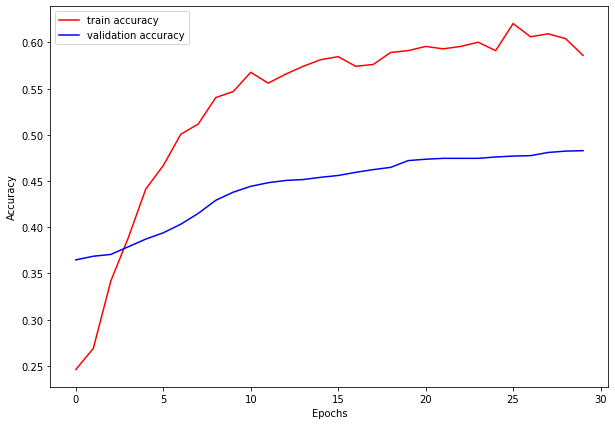

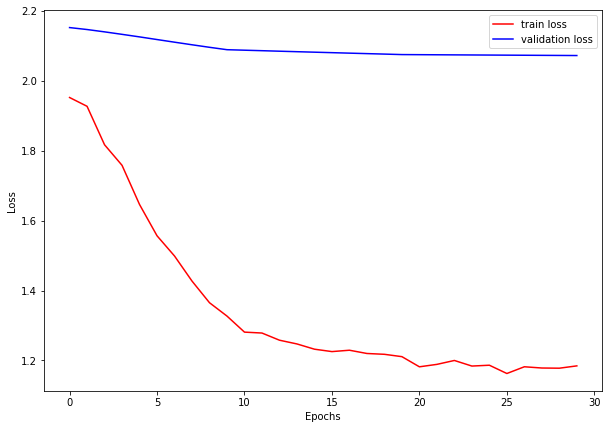

Iteration 3 / 8
lr: 0.001_wd: 0.0005_gamma: 0.2284502123246045
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.2499516010284424




Train Loss: 1.5256, Train Acc: 0.44
Val Loss: 1.8616, Val Acc: 0.33


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.4025491774082184




Train Loss: 0.4724, Train Acc: 0.86
Val Loss: 2.3648, Val Acc: 0.24


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2163, Train Acc: 0.93
Val Loss: 3.0496, Val Acc: 0.22


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.17571020126342773




Train Loss: 0.1556, Train Acc: 0.95
Val Loss: 3.5946, Val Acc: 0.22


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1268, Train Acc: 0.96
Val Loss: 3.9527, Val Acc: 0.22


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.10953262448310852




Train Loss: 0.0977, Train Acc: 0.97
Val Loss: 4.0833, Val Acc: 0.23


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.06641381978988647




Train Loss: 0.0673, Train Acc: 0.98
Val Loss: 4.0460, Val Acc: 0.24


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0622, Train Acc: 0.98
Val Loss: 4.0546, Val Acc: 0.24


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.05990830063819885




Train Loss: 0.0523, Train Acc: 0.99
Val Loss: 4.0797, Val Acc: 0.24


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0554, Train Acc: 0.98
Val Loss: 4.1651, Val Acc: 0.24


Starting epoch 11/30, LR = [0.0002284502123246045]
Step 60, Loss 0.05455877259373665




Train Loss: 0.0427, Train Acc: 0.99
Val Loss: 4.1760, Val Acc: 0.24


Starting epoch 12/30, LR = [0.0002284502123246045]
Step 70, Loss 0.030379289761185646




Train Loss: 0.0387, Train Acc: 0.99
Val Loss: 4.1803, Val Acc: 0.25


Starting epoch 13/30, LR = [0.0002284502123246045]




Train Loss: 0.0416, Train Acc: 0.99
Val Loss: 4.1992, Val Acc: 0.25


Starting epoch 14/30, LR = [0.0002284502123246045]
Step 80, Loss 0.026839938014745712




Train Loss: 0.0402, Train Acc: 0.99
Val Loss: 4.2121, Val Acc: 0.25


Starting epoch 15/30, LR = [0.0002284502123246045]




Train Loss: 0.0343, Train Acc: 0.99
Val Loss: 4.2362, Val Acc: 0.25


Starting epoch 16/30, LR = [0.0002284502123246045]
Step 90, Loss 0.029361048713326454




Train Loss: 0.0393, Train Acc: 0.99
Val Loss: 4.2550, Val Acc: 0.24


Starting epoch 17/30, LR = [0.0002284502123246045]
Step 100, Loss 0.037774812430143356




Train Loss: 0.0368, Train Acc: 0.99
Val Loss: 4.2750, Val Acc: 0.24


Starting epoch 18/30, LR = [0.0002284502123246045]




Train Loss: 0.0320, Train Acc: 0.99
Val Loss: 4.2740, Val Acc: 0.24


Starting epoch 19/30, LR = [0.0002284502123246045]
Step 110, Loss 0.022404678165912628




Train Loss: 0.0347, Train Acc: 0.99
Val Loss: 4.2604, Val Acc: 0.25


Starting epoch 20/30, LR = [0.0002284502123246045]




Train Loss: 0.0358, Train Acc: 0.99
Val Loss: 4.2449, Val Acc: 0.25


Starting epoch 21/30, LR = [5.218949951115688e-05]
Step 120, Loss 0.03212267905473709




Train Loss: 0.0361, Train Acc: 0.99
Val Loss: 4.2465, Val Acc: 0.25


Starting epoch 22/30, LR = [5.218949951115688e-05]
Step 130, Loss 0.03262195363640785




Train Loss: 0.0339, Train Acc: 0.99
Val Loss: 4.2504, Val Acc: 0.25


Starting epoch 23/30, LR = [5.218949951115688e-05]




Train Loss: 0.0317, Train Acc: 0.99
Val Loss: 4.2538, Val Acc: 0.25


Starting epoch 24/30, LR = [5.218949951115688e-05]
Step 140, Loss 0.03154141083359718




Train Loss: 0.0353, Train Acc: 0.99
Val Loss: 4.2593, Val Acc: 0.25


Starting epoch 25/30, LR = [5.218949951115688e-05]




Train Loss: 0.0279, Train Acc: 1.00
Val Loss: 4.2669, Val Acc: 0.25


Starting epoch 26/30, LR = [5.218949951115688e-05]
Step 150, Loss 0.03372655808925629




Train Loss: 0.0349, Train Acc: 0.99
Val Loss: 4.2744, Val Acc: 0.25


Starting epoch 27/30, LR = [5.218949951115688e-05]
Step 160, Loss 0.02387351542711258




Train Loss: 0.0371, Train Acc: 0.99
Val Loss: 4.2784, Val Acc: 0.25


Starting epoch 28/30, LR = [5.218949951115688e-05]




Train Loss: 0.0342, Train Acc: 0.99
Val Loss: 4.2836, Val Acc: 0.25


Starting epoch 29/30, LR = [5.218949951115688e-05]
Step 170, Loss 0.027577003464102745




Train Loss: 0.0340, Train Acc: 0.99
Val Loss: 4.2897, Val Acc: 0.25


Starting epoch 30/30, LR = [5.218949951115688e-05]




Train Loss: 0.0356, Train Acc: 0.99
Val Loss: 4.2967, Val Acc: 0.25




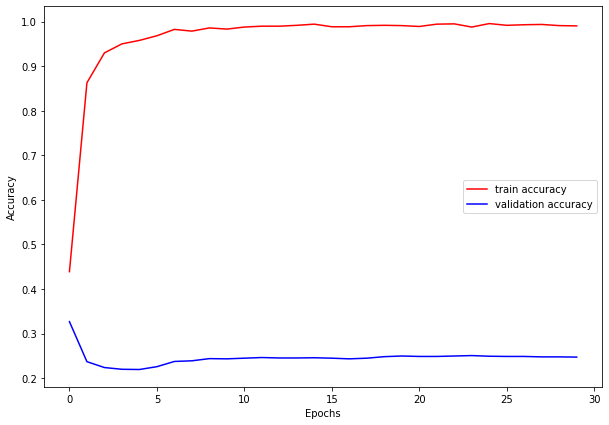

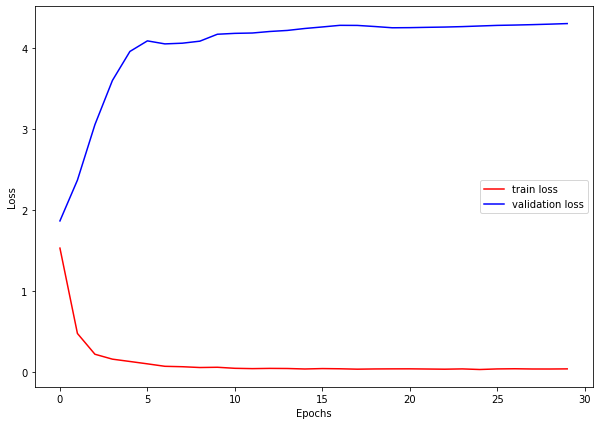

lr: 0.001_wd: 0.0005_gamma: 0.2284502123246045
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.1689484119415283




Train Loss: 1.5038, Train Acc: 0.46
Val Loss: 2.1081, Val Acc: 0.32


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.4090709090232849




Train Loss: 0.4969, Train Acc: 0.85
Val Loss: 2.1503, Val Acc: 0.42


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2118, Train Acc: 0.94
Val Loss: 2.4167, Val Acc: 0.46


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.16398850083351135




Train Loss: 0.1419, Train Acc: 0.95
Val Loss: 2.6772, Val Acc: 0.48


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1199, Train Acc: 0.96
Val Loss: 2.9259, Val Acc: 0.47


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.09867826104164124




Train Loss: 0.0989, Train Acc: 0.96
Val Loss: 3.0154, Val Acc: 0.46


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.08446919173002243




Train Loss: 0.0730, Train Acc: 0.97
Val Loss: 3.1070, Val Acc: 0.43


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0697, Train Acc: 0.97
Val Loss: 3.0854, Val Acc: 0.42


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.06543239206075668




Train Loss: 0.0554, Train Acc: 0.98
Val Loss: 3.0274, Val Acc: 0.44


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0468, Train Acc: 0.99
Val Loss: 2.9968, Val Acc: 0.46


Starting epoch 11/30, LR = [0.0002284502123246045]
Step 60, Loss 0.05145670846104622




Train Loss: 0.0455, Train Acc: 0.99
Val Loss: 2.9970, Val Acc: 0.46


Starting epoch 12/30, LR = [0.0002284502123246045]
Step 70, Loss 0.05042405426502228




Train Loss: 0.0445, Train Acc: 0.99
Val Loss: 2.9948, Val Acc: 0.46


Starting epoch 13/30, LR = [0.0002284502123246045]




Train Loss: 0.0404, Train Acc: 0.99
Val Loss: 2.9881, Val Acc: 0.46


Starting epoch 14/30, LR = [0.0002284502123246045]
Step 80, Loss 0.043420787900686264




Train Loss: 0.0430, Train Acc: 0.99
Val Loss: 2.9749, Val Acc: 0.46


Starting epoch 15/30, LR = [0.0002284502123246045]




Train Loss: 0.0423, Train Acc: 0.99
Val Loss: 2.9697, Val Acc: 0.47


Starting epoch 16/30, LR = [0.0002284502123246045]
Step 90, Loss 0.03172897920012474




Train Loss: 0.0395, Train Acc: 0.99
Val Loss: 2.9718, Val Acc: 0.46


Starting epoch 17/30, LR = [0.0002284502123246045]
Step 100, Loss 0.0284345131367445




Train Loss: 0.0392, Train Acc: 0.99
Val Loss: 2.9782, Val Acc: 0.47


Starting epoch 18/30, LR = [0.0002284502123246045]




Train Loss: 0.0369, Train Acc: 0.99
Val Loss: 2.9798, Val Acc: 0.47


Starting epoch 19/30, LR = [0.0002284502123246045]
Step 110, Loss 0.049164243042469025




Train Loss: 0.0349, Train Acc: 0.99
Val Loss: 2.9815, Val Acc: 0.47


Starting epoch 20/30, LR = [0.0002284502123246045]




Train Loss: 0.0349, Train Acc: 0.99
Val Loss: 2.9901, Val Acc: 0.47


Starting epoch 21/30, LR = [5.218949951115688e-05]
Step 120, Loss 0.04968396946787834




Train Loss: 0.0318, Train Acc: 0.99
Val Loss: 2.9937, Val Acc: 0.47


Starting epoch 22/30, LR = [5.218949951115688e-05]
Step 130, Loss 0.025790560990571976




Train Loss: 0.0307, Train Acc: 0.99
Val Loss: 2.9968, Val Acc: 0.47


Starting epoch 23/30, LR = [5.218949951115688e-05]




Train Loss: 0.0338, Train Acc: 0.99
Val Loss: 2.9968, Val Acc: 0.47


Starting epoch 24/30, LR = [5.218949951115688e-05]
Step 140, Loss 0.03674405813217163




Train Loss: 0.0309, Train Acc: 0.99
Val Loss: 2.9964, Val Acc: 0.47


Starting epoch 25/30, LR = [5.218949951115688e-05]




Train Loss: 0.0279, Train Acc: 1.00
Val Loss: 2.9956, Val Acc: 0.47


Starting epoch 26/30, LR = [5.218949951115688e-05]
Step 150, Loss 0.023389805108308792




Train Loss: 0.0310, Train Acc: 0.99
Val Loss: 2.9968, Val Acc: 0.47


Starting epoch 27/30, LR = [5.218949951115688e-05]
Step 160, Loss 0.024601764976978302




Train Loss: 0.0341, Train Acc: 0.99
Val Loss: 2.9992, Val Acc: 0.47


Starting epoch 28/30, LR = [5.218949951115688e-05]




Train Loss: 0.0312, Train Acc: 0.99
Val Loss: 3.0018, Val Acc: 0.47


Starting epoch 29/30, LR = [5.218949951115688e-05]
Step 170, Loss 0.03014996647834778




Train Loss: 0.0292, Train Acc: 1.00
Val Loss: 3.0037, Val Acc: 0.47


Starting epoch 30/30, LR = [5.218949951115688e-05]




Train Loss: 0.0305, Train Acc: 0.99
Val Loss: 3.0038, Val Acc: 0.47




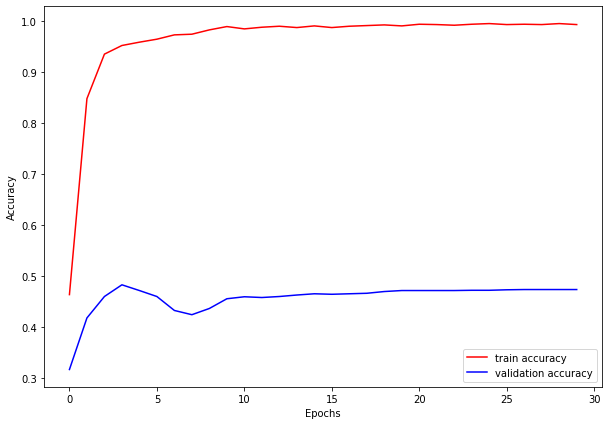

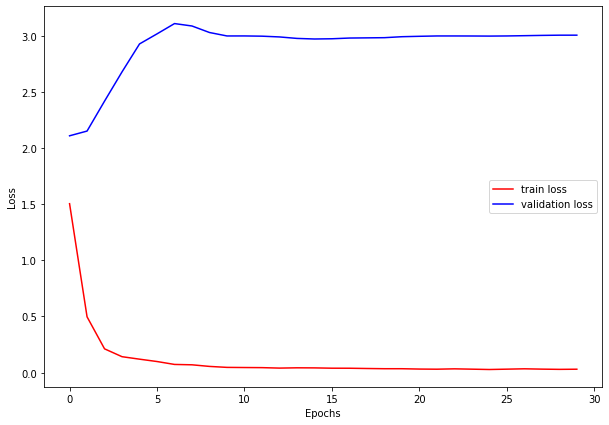

Iteration 4 / 8
lr: 0.0001_wd: 0.0005_gamma: 0.17782676022153115
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 1.9953361749649048




Train Loss: 1.8708, Train Acc: 0.35
Val Loss: 2.1604, Val Acc: 0.16


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.4144675731658936




Train Loss: 1.4679, Train Acc: 0.53
Val Loss: 2.0770, Val Acc: 0.20


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.1079, Train Acc: 0.61
Val Loss: 2.0144, Val Acc: 0.23


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.8559606075286865




Train Loss: 0.8578, Train Acc: 0.72
Val Loss: 1.9889, Val Acc: 0.24


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.7025, Train Acc: 0.78
Val Loss: 1.9993, Val Acc: 0.23


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.5690825581550598




Train Loss: 0.5717, Train Acc: 0.85
Val Loss: 2.0348, Val Acc: 0.23


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.48549845814704895




Train Loss: 0.4870, Train Acc: 0.87
Val Loss: 2.0813, Val Acc: 0.22


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.4211, Train Acc: 0.89
Val Loss: 2.1248, Val Acc: 0.23


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.3229309916496277




Train Loss: 0.3632, Train Acc: 0.91
Val Loss: 2.1739, Val Acc: 0.22


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3179, Train Acc: 0.92
Val Loss: 2.2170, Val Acc: 0.22


Starting epoch 11/30, LR = [1.7782676022153116e-05]
Step 60, Loss 0.33209314942359924




Train Loss: 0.3060, Train Acc: 0.93
Val Loss: 2.2248, Val Acc: 0.22


Starting epoch 12/30, LR = [1.7782676022153116e-05]
Step 70, Loss 0.2851741909980774




Train Loss: 0.2999, Train Acc: 0.93
Val Loss: 2.2314, Val Acc: 0.22


Starting epoch 13/30, LR = [1.7782676022153116e-05]




Train Loss: 0.2959, Train Acc: 0.92
Val Loss: 2.2386, Val Acc: 0.22


Starting epoch 14/30, LR = [1.7782676022153116e-05]
Step 80, Loss 0.2764047384262085




Train Loss: 0.2976, Train Acc: 0.92
Val Loss: 2.2458, Val Acc: 0.22


Starting epoch 15/30, LR = [1.7782676022153116e-05]




Train Loss: 0.2856, Train Acc: 0.93
Val Loss: 2.2514, Val Acc: 0.22


Starting epoch 16/30, LR = [1.7782676022153116e-05]
Step 90, Loss 0.23907431960105896




Train Loss: 0.2898, Train Acc: 0.92
Val Loss: 2.2579, Val Acc: 0.22


Starting epoch 17/30, LR = [1.7782676022153116e-05]
Step 100, Loss 0.2970007359981537




Train Loss: 0.2844, Train Acc: 0.93
Val Loss: 2.2636, Val Acc: 0.22


Starting epoch 18/30, LR = [1.7782676022153116e-05]




Train Loss: 0.2697, Train Acc: 0.93
Val Loss: 2.2700, Val Acc: 0.22


Starting epoch 19/30, LR = [1.7782676022153116e-05]
Step 110, Loss 0.26256558299064636




Train Loss: 0.2613, Train Acc: 0.94
Val Loss: 2.2752, Val Acc: 0.22


Starting epoch 20/30, LR = [1.7782676022153116e-05]




Train Loss: 0.2594, Train Acc: 0.94
Val Loss: 2.2805, Val Acc: 0.22


Starting epoch 21/30, LR = [3.162235665088594e-06]
Step 120, Loss 0.35436925292015076




Train Loss: 0.2648, Train Acc: 0.93
Val Loss: 2.2814, Val Acc: 0.22


Starting epoch 22/30, LR = [3.162235665088594e-06]
Step 130, Loss 0.2533949017524719




Train Loss: 0.2639, Train Acc: 0.93
Val Loss: 2.2825, Val Acc: 0.22


Starting epoch 23/30, LR = [3.162235665088594e-06]




Train Loss: 0.2622, Train Acc: 0.94
Val Loss: 2.2834, Val Acc: 0.22


Starting epoch 24/30, LR = [3.162235665088594e-06]
Step 140, Loss 0.2372269481420517




Train Loss: 0.2639, Train Acc: 0.93
Val Loss: 2.2844, Val Acc: 0.22


Starting epoch 25/30, LR = [3.162235665088594e-06]




Train Loss: 0.2618, Train Acc: 0.93
Val Loss: 2.2855, Val Acc: 0.22


Starting epoch 26/30, LR = [3.162235665088594e-06]
Step 150, Loss 0.2655338943004608




Train Loss: 0.2681, Train Acc: 0.93
Val Loss: 2.2865, Val Acc: 0.22


Starting epoch 27/30, LR = [3.162235665088594e-06]
Step 160, Loss 0.27855440974235535




Train Loss: 0.2730, Train Acc: 0.93
Val Loss: 2.2876, Val Acc: 0.22


Starting epoch 28/30, LR = [3.162235665088594e-06]




Train Loss: 0.2621, Train Acc: 0.93
Val Loss: 2.2886, Val Acc: 0.22


Starting epoch 29/30, LR = [3.162235665088594e-06]
Step 170, Loss 0.2646501064300537




Train Loss: 0.2601, Train Acc: 0.93
Val Loss: 2.2897, Val Acc: 0.22


Starting epoch 30/30, LR = [3.162235665088594e-06]




Train Loss: 0.2585, Train Acc: 0.93
Val Loss: 2.2909, Val Acc: 0.22




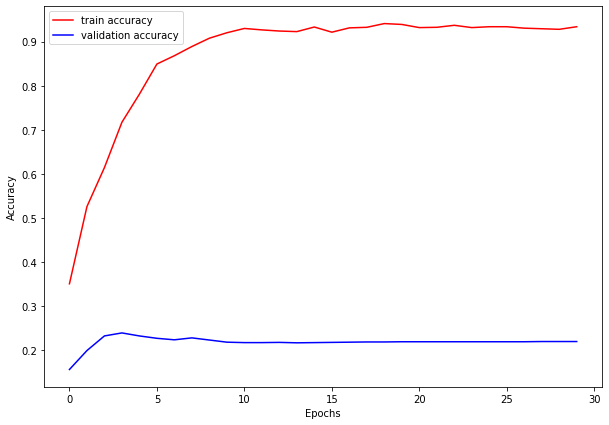

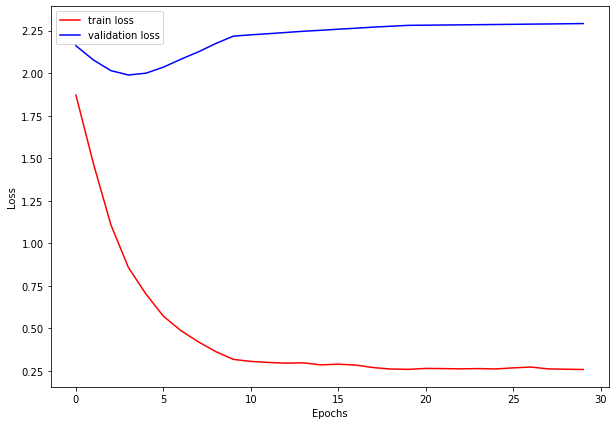

lr: 0.0001_wd: 0.0005_gamma: 0.17782676022153115
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.2337605953216553




Train Loss: 2.0803, Train Acc: 0.15
Val Loss: 2.1134, Val Acc: 0.26


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.442772388458252




Train Loss: 1.5575, Train Acc: 0.46
Val Loss: 2.0864, Val Acc: 0.30


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0854, Train Acc: 0.64
Val Loss: 2.0532, Val Acc: 0.33


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.8854276537895203




Train Loss: 0.8428, Train Acc: 0.73
Val Loss: 2.0244, Val Acc: 0.33


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6839, Train Acc: 0.80
Val Loss: 2.0027, Val Acc: 0.33


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.6766216158866882




Train Loss: 0.5742, Train Acc: 0.84
Val Loss: 1.9927, Val Acc: 0.33


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.4446641206741333




Train Loss: 0.4812, Train Acc: 0.88
Val Loss: 1.9939, Val Acc: 0.32


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.4112, Train Acc: 0.90
Val Loss: 1.9984, Val Acc: 0.32


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.38702505826950073




Train Loss: 0.3631, Train Acc: 0.91
Val Loss: 2.0054, Val Acc: 0.32


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3366, Train Acc: 0.91
Val Loss: 2.0146, Val Acc: 0.32


Starting epoch 11/30, LR = [1.7782676022153116e-05]
Step 60, Loss 0.3287949562072754




Train Loss: 0.3060, Train Acc: 0.93
Val Loss: 2.0166, Val Acc: 0.32


Starting epoch 12/30, LR = [1.7782676022153116e-05]
Step 70, Loss 0.31753528118133545




Train Loss: 0.3061, Train Acc: 0.93
Val Loss: 2.0182, Val Acc: 0.32


Starting epoch 13/30, LR = [1.7782676022153116e-05]




Train Loss: 0.3005, Train Acc: 0.93
Val Loss: 2.0193, Val Acc: 0.32


Starting epoch 14/30, LR = [1.7782676022153116e-05]
Step 80, Loss 0.3032262921333313




Train Loss: 0.2878, Train Acc: 0.93
Val Loss: 2.0204, Val Acc: 0.32


Starting epoch 15/30, LR = [1.7782676022153116e-05]




Train Loss: 0.2848, Train Acc: 0.93
Val Loss: 2.0215, Val Acc: 0.32


Starting epoch 16/30, LR = [1.7782676022153116e-05]
Step 90, Loss 0.28793972730636597




Train Loss: 0.2753, Train Acc: 0.93
Val Loss: 2.0222, Val Acc: 0.32


Starting epoch 17/30, LR = [1.7782676022153116e-05]
Step 100, Loss 0.3047395944595337




Train Loss: 0.2761, Train Acc: 0.93
Val Loss: 2.0233, Val Acc: 0.32


Starting epoch 18/30, LR = [1.7782676022153116e-05]




Train Loss: 0.2830, Train Acc: 0.94
Val Loss: 2.0246, Val Acc: 0.32


Starting epoch 19/30, LR = [1.7782676022153116e-05]
Step 110, Loss 0.35197770595550537




Train Loss: 0.2806, Train Acc: 0.93
Val Loss: 2.0256, Val Acc: 0.32


Starting epoch 20/30, LR = [1.7782676022153116e-05]




Train Loss: 0.2773, Train Acc: 0.93
Val Loss: 2.0262, Val Acc: 0.32


Starting epoch 21/30, LR = [3.162235665088594e-06]
Step 120, Loss 0.2300981879234314




Train Loss: 0.2633, Train Acc: 0.93
Val Loss: 2.0263, Val Acc: 0.32


Starting epoch 22/30, LR = [3.162235665088594e-06]
Step 130, Loss 0.26951679587364197




Train Loss: 0.2664, Train Acc: 0.94
Val Loss: 2.0264, Val Acc: 0.32


Starting epoch 23/30, LR = [3.162235665088594e-06]




Train Loss: 0.2626, Train Acc: 0.94
Val Loss: 2.0267, Val Acc: 0.32


Starting epoch 24/30, LR = [3.162235665088594e-06]
Step 140, Loss 0.23833733797073364




Train Loss: 0.2638, Train Acc: 0.94
Val Loss: 2.0269, Val Acc: 0.32


Starting epoch 25/30, LR = [3.162235665088594e-06]




Train Loss: 0.2674, Train Acc: 0.93
Val Loss: 2.0271, Val Acc: 0.32


Starting epoch 26/30, LR = [3.162235665088594e-06]
Step 150, Loss 0.2417466938495636




Train Loss: 0.2633, Train Acc: 0.93
Val Loss: 2.0273, Val Acc: 0.32


Starting epoch 27/30, LR = [3.162235665088594e-06]
Step 160, Loss 0.2879761755466461




Train Loss: 0.2635, Train Acc: 0.94
Val Loss: 2.0275, Val Acc: 0.32


Starting epoch 28/30, LR = [3.162235665088594e-06]




Train Loss: 0.2668, Train Acc: 0.94
Val Loss: 2.0278, Val Acc: 0.32


Starting epoch 29/30, LR = [3.162235665088594e-06]
Step 170, Loss 0.28204360604286194




Train Loss: 0.2683, Train Acc: 0.93
Val Loss: 2.0281, Val Acc: 0.32


Starting epoch 30/30, LR = [3.162235665088594e-06]




Train Loss: 0.2549, Train Acc: 0.94
Val Loss: 2.0285, Val Acc: 0.32




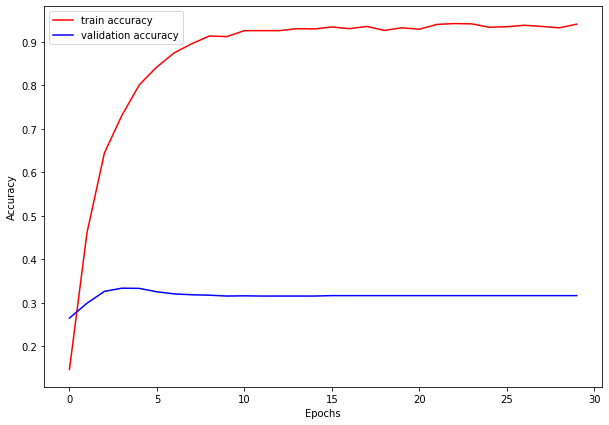

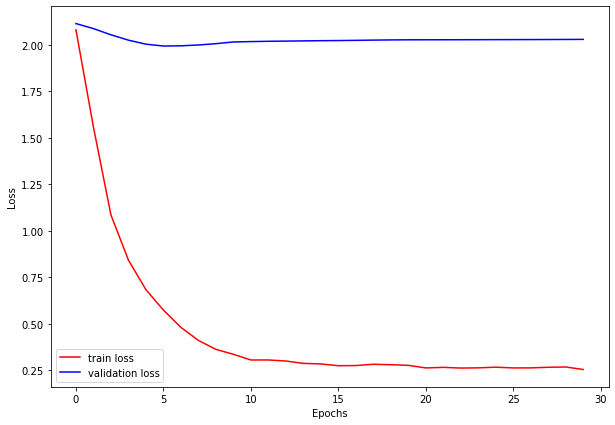

Iteration 5 / 8
lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.37415993889995247
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.027860164642334




Train Loss: 1.9386, Train Acc: 0.28
Val Loss: 2.0897, Val Acc: 0.20


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.3884601593017578




Train Loss: 1.5119, Train Acc: 0.49
Val Loss: 2.0145, Val Acc: 0.26


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0985, Train Acc: 0.62
Val Loss: 1.9614, Val Acc: 0.31


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.8851197957992554




Train Loss: 0.8544, Train Acc: 0.73
Val Loss: 1.9505, Val Acc: 0.33


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6827, Train Acc: 0.79
Val Loss: 1.9770, Val Acc: 0.33


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.511418342590332




Train Loss: 0.5569, Train Acc: 0.85
Val Loss: 2.0306, Val Acc: 0.33


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.4696001708507538




Train Loss: 0.4772, Train Acc: 0.88
Val Loss: 2.0973, Val Acc: 0.32


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.4059, Train Acc: 0.91
Val Loss: 2.1521, Val Acc: 0.31


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.3349219858646393




Train Loss: 0.3614, Train Acc: 0.92
Val Loss: 2.2019, Val Acc: 0.30


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3235, Train Acc: 0.92
Val Loss: 2.2505, Val Acc: 0.29


Starting epoch 11/30, LR = [3.741599388999525e-05]
Step 60, Loss 0.3577018678188324




Train Loss: 0.3029, Train Acc: 0.93
Val Loss: 2.2669, Val Acc: 0.29


Starting epoch 12/30, LR = [3.741599388999525e-05]
Step 70, Loss 0.3092465102672577




Train Loss: 0.2970, Train Acc: 0.92
Val Loss: 2.2830, Val Acc: 0.29


Starting epoch 13/30, LR = [3.741599388999525e-05]




Train Loss: 0.2816, Train Acc: 0.94
Val Loss: 2.2998, Val Acc: 0.29


Starting epoch 14/30, LR = [3.741599388999525e-05]
Step 80, Loss 0.23506401479244232




Train Loss: 0.2730, Train Acc: 0.93
Val Loss: 2.3156, Val Acc: 0.29


Starting epoch 15/30, LR = [3.741599388999525e-05]




Train Loss: 0.2720, Train Acc: 0.93
Val Loss: 2.3303, Val Acc: 0.29


Starting epoch 16/30, LR = [3.741599388999525e-05]
Step 90, Loss 0.2932768166065216




Train Loss: 0.2644, Train Acc: 0.93
Val Loss: 2.3439, Val Acc: 0.29


Starting epoch 17/30, LR = [3.741599388999525e-05]
Step 100, Loss 0.3018873631954193




Train Loss: 0.2557, Train Acc: 0.94
Val Loss: 2.3563, Val Acc: 0.29


Starting epoch 18/30, LR = [3.741599388999525e-05]




Train Loss: 0.2532, Train Acc: 0.93
Val Loss: 2.3699, Val Acc: 0.28


Starting epoch 19/30, LR = [3.741599388999525e-05]
Step 110, Loss 0.25472158193588257




Train Loss: 0.2413, Train Acc: 0.95
Val Loss: 2.3841, Val Acc: 0.28


Starting epoch 20/30, LR = [3.741599388999525e-05]




Train Loss: 0.2438, Train Acc: 0.93
Val Loss: 2.3961, Val Acc: 0.28


Starting epoch 21/30, LR = [1.3999565987761617e-05]
Step 120, Loss 0.20122256875038147




Train Loss: 0.2363, Train Acc: 0.94
Val Loss: 2.4009, Val Acc: 0.28


Starting epoch 22/30, LR = [1.3999565987761617e-05]
Step 130, Loss 0.23769618570804596




Train Loss: 0.2426, Train Acc: 0.94
Val Loss: 2.4056, Val Acc: 0.28


Starting epoch 23/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2280, Train Acc: 0.94
Val Loss: 2.4101, Val Acc: 0.28


Starting epoch 24/30, LR = [1.3999565987761617e-05]
Step 140, Loss 0.22373707592487335




Train Loss: 0.2329, Train Acc: 0.94
Val Loss: 2.4143, Val Acc: 0.28


Starting epoch 25/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2298, Train Acc: 0.94
Val Loss: 2.4186, Val Acc: 0.28


Starting epoch 26/30, LR = [1.3999565987761617e-05]
Step 150, Loss 0.21372297406196594




Train Loss: 0.2309, Train Acc: 0.94
Val Loss: 2.4243, Val Acc: 0.28


Starting epoch 27/30, LR = [1.3999565987761617e-05]
Step 160, Loss 0.2893403470516205




Train Loss: 0.2264, Train Acc: 0.94
Val Loss: 2.4288, Val Acc: 0.28


Starting epoch 28/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2270, Train Acc: 0.94
Val Loss: 2.4335, Val Acc: 0.28


Starting epoch 29/30, LR = [1.3999565987761617e-05]
Step 170, Loss 0.21628686785697937




Train Loss: 0.2251, Train Acc: 0.94
Val Loss: 2.4383, Val Acc: 0.28


Starting epoch 30/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2215, Train Acc: 0.95
Val Loss: 2.4429, Val Acc: 0.28




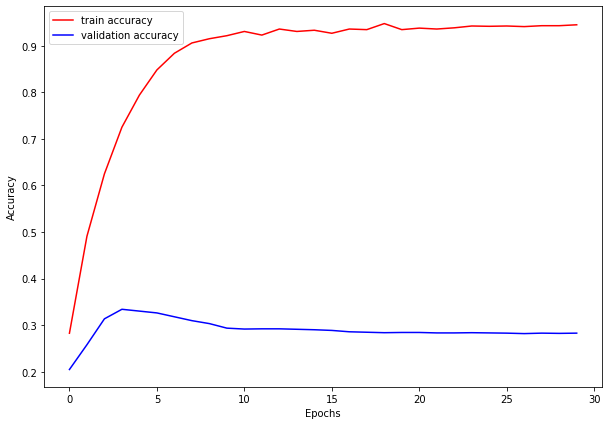

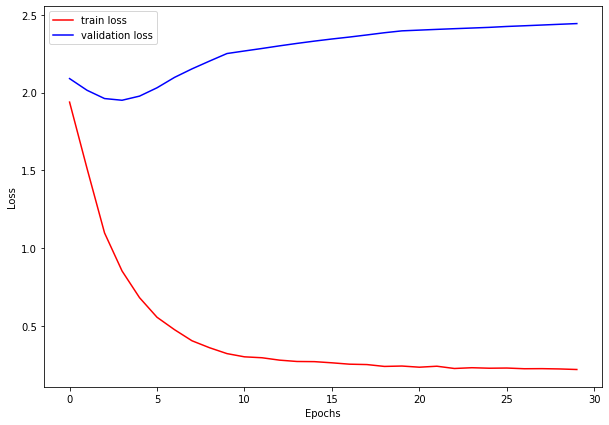

lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.37415993889995247
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.01102614402771




Train Loss: 1.8673, Train Acc: 0.28
Val Loss: 2.3005, Val Acc: 0.03


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.33939790725708




Train Loss: 1.4329, Train Acc: 0.55
Val Loss: 2.2546, Val Acc: 0.05


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0459, Train Acc: 0.66
Val Loss: 2.1939, Val Acc: 0.13


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.8229281902313232




Train Loss: 0.8048, Train Acc: 0.74
Val Loss: 2.1306, Val Acc: 0.24


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6567, Train Acc: 0.81
Val Loss: 2.0741, Val Acc: 0.34


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.5736514329910278




Train Loss: 0.5358, Train Acc: 0.86
Val Loss: 2.0313, Val Acc: 0.42


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.461214154958725




Train Loss: 0.4482, Train Acc: 0.89
Val Loss: 2.0009, Val Acc: 0.47


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.3913, Train Acc: 0.90
Val Loss: 1.9825, Val Acc: 0.50


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.4069904386997223




Train Loss: 0.3421, Train Acc: 0.92
Val Loss: 1.9722, Val Acc: 0.51


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3133, Train Acc: 0.93
Val Loss: 1.9686, Val Acc: 0.51


Starting epoch 11/30, LR = [3.741599388999525e-05]
Step 60, Loss 0.2782529294490814




Train Loss: 0.2848, Train Acc: 0.93
Val Loss: 1.9685, Val Acc: 0.52


Starting epoch 12/30, LR = [3.741599388999525e-05]
Step 70, Loss 0.23045839369297028




Train Loss: 0.2687, Train Acc: 0.94
Val Loss: 1.9684, Val Acc: 0.52


Starting epoch 13/30, LR = [3.741599388999525e-05]




Train Loss: 0.2739, Train Acc: 0.93
Val Loss: 1.9684, Val Acc: 0.52


Starting epoch 14/30, LR = [3.741599388999525e-05]
Step 80, Loss 0.3088516592979431




Train Loss: 0.2679, Train Acc: 0.93
Val Loss: 1.9688, Val Acc: 0.52


Starting epoch 15/30, LR = [3.741599388999525e-05]




Train Loss: 0.2635, Train Acc: 0.94
Val Loss: 1.9689, Val Acc: 0.52


Starting epoch 16/30, LR = [3.741599388999525e-05]
Step 90, Loss 0.2764677405357361




Train Loss: 0.2543, Train Acc: 0.94
Val Loss: 1.9701, Val Acc: 0.52


Starting epoch 17/30, LR = [3.741599388999525e-05]
Step 100, Loss 0.2608562707901001




Train Loss: 0.2368, Train Acc: 0.95
Val Loss: 1.9711, Val Acc: 0.52


Starting epoch 18/30, LR = [3.741599388999525e-05]




Train Loss: 0.2338, Train Acc: 0.95
Val Loss: 1.9716, Val Acc: 0.52


Starting epoch 19/30, LR = [3.741599388999525e-05]
Step 110, Loss 0.21013891696929932




Train Loss: 0.2292, Train Acc: 0.94
Val Loss: 1.9729, Val Acc: 0.52


Starting epoch 20/30, LR = [3.741599388999525e-05]




Train Loss: 0.2253, Train Acc: 0.94
Val Loss: 1.9738, Val Acc: 0.52


Starting epoch 21/30, LR = [1.3999565987761617e-05]
Step 120, Loss 0.21359148621559143




Train Loss: 0.2231, Train Acc: 0.94
Val Loss: 1.9743, Val Acc: 0.52


Starting epoch 22/30, LR = [1.3999565987761617e-05]
Step 130, Loss 0.24669797718524933




Train Loss: 0.2148, Train Acc: 0.95
Val Loss: 1.9746, Val Acc: 0.52


Starting epoch 23/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2262, Train Acc: 0.95
Val Loss: 1.9747, Val Acc: 0.52


Starting epoch 24/30, LR = [1.3999565987761617e-05]
Step 140, Loss 0.2215399295091629




Train Loss: 0.2190, Train Acc: 0.95
Val Loss: 1.9749, Val Acc: 0.52


Starting epoch 25/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2256, Train Acc: 0.94
Val Loss: 1.9752, Val Acc: 0.52


Starting epoch 26/30, LR = [1.3999565987761617e-05]
Step 150, Loss 0.20751194655895233




Train Loss: 0.2213, Train Acc: 0.94
Val Loss: 1.9756, Val Acc: 0.52


Starting epoch 27/30, LR = [1.3999565987761617e-05]
Step 160, Loss 0.2083452343940735




Train Loss: 0.2218, Train Acc: 0.94
Val Loss: 1.9758, Val Acc: 0.52


Starting epoch 28/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2122, Train Acc: 0.95
Val Loss: 1.9761, Val Acc: 0.52


Starting epoch 29/30, LR = [1.3999565987761617e-05]
Step 170, Loss 0.20930953323841095




Train Loss: 0.2127, Train Acc: 0.95
Val Loss: 1.9763, Val Acc: 0.52


Starting epoch 30/30, LR = [1.3999565987761617e-05]




Train Loss: 0.2074, Train Acc: 0.95
Val Loss: 1.9769, Val Acc: 0.52




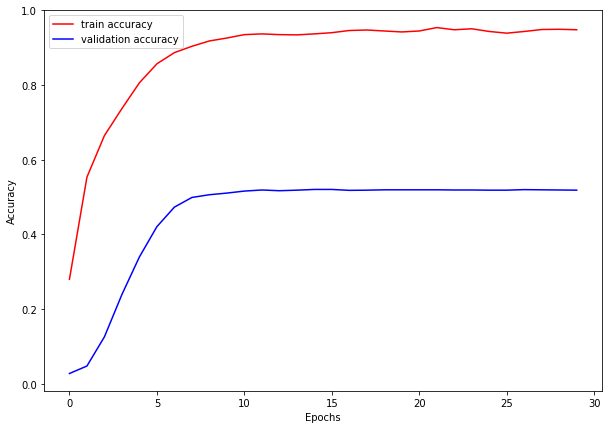

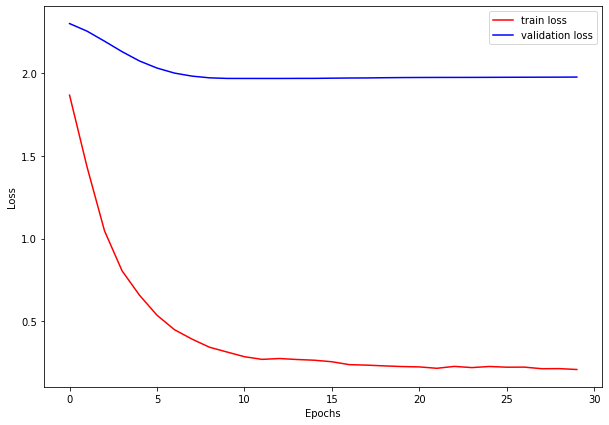

Iteration 6 / 8
lr: 0.001_wd: 4.9999999999999996e-06_gamma: 0.37142457495346914
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.3739452362060547




Train Loss: 1.5844, Train Acc: 0.41
Val Loss: 1.7830, Val Acc: 0.37


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.3608566224575043




Train Loss: 0.4881, Train Acc: 0.86
Val Loss: 2.0083, Val Acc: 0.31


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2071, Train Acc: 0.95
Val Loss: 2.5576, Val Acc: 0.29


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.0999627411365509




Train Loss: 0.1463, Train Acc: 0.96
Val Loss: 2.9870, Val Acc: 0.28


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1263, Train Acc: 0.95
Val Loss: 3.3017, Val Acc: 0.28


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.06010141223669052




Train Loss: 0.0957, Train Acc: 0.97
Val Loss: 3.4635, Val Acc: 0.28


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.09686607867479324




Train Loss: 0.0891, Train Acc: 0.97
Val Loss: 3.4839, Val Acc: 0.29


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0680, Train Acc: 0.98
Val Loss: 3.4559, Val Acc: 0.30


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.043350253254175186




Train Loss: 0.0598, Train Acc: 0.98
Val Loss: 3.5009, Val Acc: 0.31


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0497, Train Acc: 0.99
Val Loss: 3.5416, Val Acc: 0.31


Starting epoch 11/30, LR = [0.00037142457495346914]
Step 60, Loss 0.0467088520526886




Train Loss: 0.0483, Train Acc: 0.99
Val Loss: 3.5472, Val Acc: 0.31


Starting epoch 12/30, LR = [0.00037142457495346914]
Step 70, Loss 0.06219806149601936




Train Loss: 0.0521, Train Acc: 0.99
Val Loss: 3.5636, Val Acc: 0.31


Starting epoch 13/30, LR = [0.00037142457495346914]




Train Loss: 0.0438, Train Acc: 0.99
Val Loss: 3.6092, Val Acc: 0.30


Starting epoch 14/30, LR = [0.00037142457495346914]
Step 80, Loss 0.0381336435675621




Train Loss: 0.0395, Train Acc: 0.99
Val Loss: 3.6563, Val Acc: 0.30


Starting epoch 15/30, LR = [0.00037142457495346914]




Train Loss: 0.0451, Train Acc: 0.99
Val Loss: 3.6923, Val Acc: 0.30


Starting epoch 16/30, LR = [0.00037142457495346914]
Step 90, Loss 0.031141430139541626




Train Loss: 0.0351, Train Acc: 0.99
Val Loss: 3.7225, Val Acc: 0.30


Starting epoch 17/30, LR = [0.00037142457495346914]
Step 100, Loss 0.033563219010829926




Train Loss: 0.0397, Train Acc: 0.99
Val Loss: 3.7367, Val Acc: 0.30


Starting epoch 18/30, LR = [0.00037142457495346914]




Train Loss: 0.0366, Train Acc: 0.99
Val Loss: 3.7382, Val Acc: 0.30


Starting epoch 19/30, LR = [0.00037142457495346914]
Step 110, Loss 0.03714599460363388




Train Loss: 0.0322, Train Acc: 0.99
Val Loss: 3.7496, Val Acc: 0.30


Starting epoch 20/30, LR = [0.00037142457495346914]




Train Loss: 0.0320, Train Acc: 0.99
Val Loss: 3.7688, Val Acc: 0.30


Starting epoch 21/30, LR = [0.00013795621487936523]
Step 120, Loss 0.04663676396012306




Train Loss: 0.0319, Train Acc: 0.99
Val Loss: 3.7860, Val Acc: 0.30


Starting epoch 22/30, LR = [0.00013795621487936523]
Step 130, Loss 0.018056482076644897




Train Loss: 0.0298, Train Acc: 1.00
Val Loss: 3.8068, Val Acc: 0.30


Starting epoch 23/30, LR = [0.00013795621487936523]




Train Loss: 0.0312, Train Acc: 0.99
Val Loss: 3.8321, Val Acc: 0.30


Starting epoch 24/30, LR = [0.00013795621487936523]
Step 140, Loss 0.030752750113606453




Train Loss: 0.0332, Train Acc: 0.99
Val Loss: 3.8515, Val Acc: 0.30


Starting epoch 25/30, LR = [0.00013795621487936523]




Train Loss: 0.0278, Train Acc: 1.00
Val Loss: 3.8640, Val Acc: 0.30


Starting epoch 26/30, LR = [0.00013795621487936523]
Step 150, Loss 0.04256095364689827




Train Loss: 0.0331, Train Acc: 0.99
Val Loss: 3.8750, Val Acc: 0.30


Starting epoch 27/30, LR = [0.00013795621487936523]
Step 160, Loss 0.041257232427597046




Train Loss: 0.0300, Train Acc: 0.99
Val Loss: 3.8804, Val Acc: 0.30


Starting epoch 28/30, LR = [0.00013795621487936523]




Train Loss: 0.0301, Train Acc: 1.00
Val Loss: 3.8833, Val Acc: 0.30


Starting epoch 29/30, LR = [0.00013795621487936523]
Step 170, Loss 0.036198537796735764




Train Loss: 0.0254, Train Acc: 1.00
Val Loss: 3.8859, Val Acc: 0.30


Starting epoch 30/30, LR = [0.00013795621487936523]




Train Loss: 0.0274, Train Acc: 1.00
Val Loss: 3.8905, Val Acc: 0.30




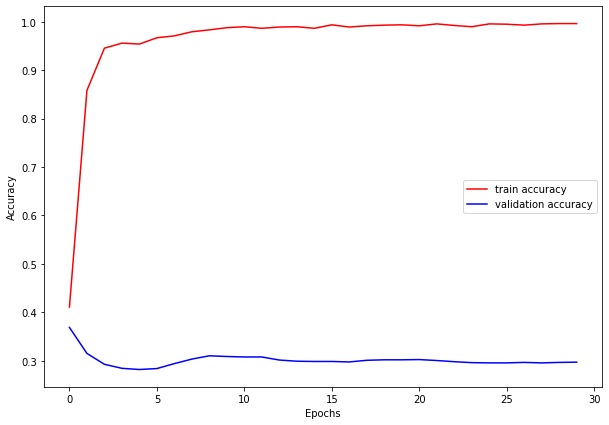

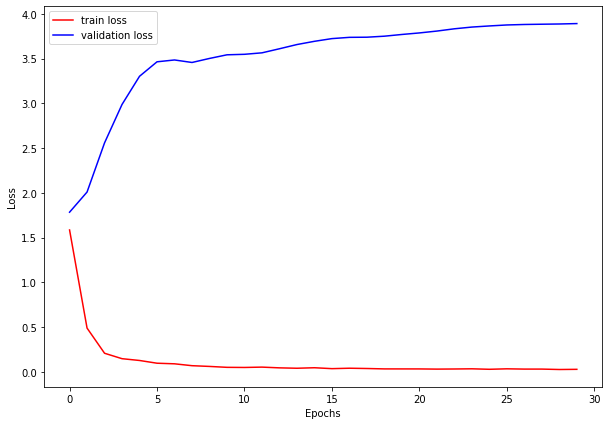

lr: 0.001_wd: 4.9999999999999996e-06_gamma: 0.37142457495346914
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.127943515777588




Train Loss: 1.3837, Train Acc: 0.50
Val Loss: 2.0978, Val Acc: 0.31


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.3075181245803833




Train Loss: 0.4516, Train Acc: 0.87
Val Loss: 2.0791, Val Acc: 0.37


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2025, Train Acc: 0.94
Val Loss: 2.2907, Val Acc: 0.39


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.11097163707017899




Train Loss: 0.1290, Train Acc: 0.96
Val Loss: 2.5085, Val Acc: 0.40


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1009, Train Acc: 0.97
Val Loss: 2.7588, Val Acc: 0.39


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.06629659235477448




Train Loss: 0.0819, Train Acc: 0.97
Val Loss: 2.8321, Val Acc: 0.40


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.06450352072715759




Train Loss: 0.0711, Train Acc: 0.98
Val Loss: 2.8146, Val Acc: 0.41


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0635, Train Acc: 0.98
Val Loss: 2.7356, Val Acc: 0.42


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.046790797263383865




Train Loss: 0.0525, Train Acc: 0.98
Val Loss: 2.6380, Val Acc: 0.43


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0367, Train Acc: 0.99
Val Loss: 2.5840, Val Acc: 0.44


Starting epoch 11/30, LR = [0.00037142457495346914]
Step 60, Loss 0.0455271452665329




Train Loss: 0.0397, Train Acc: 0.99
Val Loss: 2.5735, Val Acc: 0.44


Starting epoch 12/30, LR = [0.00037142457495346914]
Step 70, Loss 0.04355534166097641




Train Loss: 0.0379, Train Acc: 0.99
Val Loss: 2.5703, Val Acc: 0.44


Starting epoch 13/30, LR = [0.00037142457495346914]




Train Loss: 0.0341, Train Acc: 0.99
Val Loss: 2.5687, Val Acc: 0.44


Starting epoch 14/30, LR = [0.00037142457495346914]
Step 80, Loss 0.027510518208146095




Train Loss: 0.0330, Train Acc: 0.99
Val Loss: 2.5583, Val Acc: 0.44


Starting epoch 15/30, LR = [0.00037142457495346914]




Train Loss: 0.0315, Train Acc: 0.99
Val Loss: 2.5542, Val Acc: 0.44


Starting epoch 16/30, LR = [0.00037142457495346914]
Step 90, Loss 0.0359942801296711




Train Loss: 0.0337, Train Acc: 0.99
Val Loss: 2.5547, Val Acc: 0.44


Starting epoch 17/30, LR = [0.00037142457495346914]
Step 100, Loss 0.026906607672572136




Train Loss: 0.0273, Train Acc: 0.99
Val Loss: 2.5693, Val Acc: 0.45


Starting epoch 18/30, LR = [0.00037142457495346914]




Train Loss: 0.0299, Train Acc: 0.99
Val Loss: 2.5795, Val Acc: 0.45


Starting epoch 19/30, LR = [0.00037142457495346914]
Step 110, Loss 0.031225083395838737




Train Loss: 0.0262, Train Acc: 1.00
Val Loss: 2.5729, Val Acc: 0.45


Starting epoch 20/30, LR = [0.00037142457495346914]




Train Loss: 0.0298, Train Acc: 0.99
Val Loss: 2.5567, Val Acc: 0.46


Starting epoch 21/30, LR = [0.00013795621487936523]
Step 120, Loss 0.017043381929397583




Train Loss: 0.0246, Train Acc: 1.00
Val Loss: 2.5548, Val Acc: 0.46


Starting epoch 22/30, LR = [0.00013795621487936523]
Step 130, Loss 0.038716189563274384




Train Loss: 0.0278, Train Acc: 0.99
Val Loss: 2.5484, Val Acc: 0.46


Starting epoch 23/30, LR = [0.00013795621487936523]




Train Loss: 0.0238, Train Acc: 1.00
Val Loss: 2.5451, Val Acc: 0.45


Starting epoch 24/30, LR = [0.00013795621487936523]
Step 140, Loss 0.022594982758164406




Train Loss: 0.0245, Train Acc: 0.99
Val Loss: 2.5459, Val Acc: 0.45


Starting epoch 25/30, LR = [0.00013795621487936523]




Train Loss: 0.0231, Train Acc: 1.00
Val Loss: 2.5501, Val Acc: 0.45


Starting epoch 26/30, LR = [0.00013795621487936523]
Step 150, Loss 0.022679533809423447




Train Loss: 0.0225, Train Acc: 1.00
Val Loss: 2.5506, Val Acc: 0.45


Starting epoch 27/30, LR = [0.00013795621487936523]
Step 160, Loss 0.01836482807993889




Train Loss: 0.0226, Train Acc: 0.99
Val Loss: 2.5516, Val Acc: 0.46


Starting epoch 28/30, LR = [0.00013795621487936523]




Train Loss: 0.0272, Train Acc: 0.99
Val Loss: 2.5513, Val Acc: 0.46


Starting epoch 29/30, LR = [0.00013795621487936523]
Step 170, Loss 0.053274914622306824




Train Loss: 0.0259, Train Acc: 0.99
Val Loss: 2.5441, Val Acc: 0.46


Starting epoch 30/30, LR = [0.00013795621487936523]




Train Loss: 0.0244, Train Acc: 1.00
Val Loss: 2.5405, Val Acc: 0.46




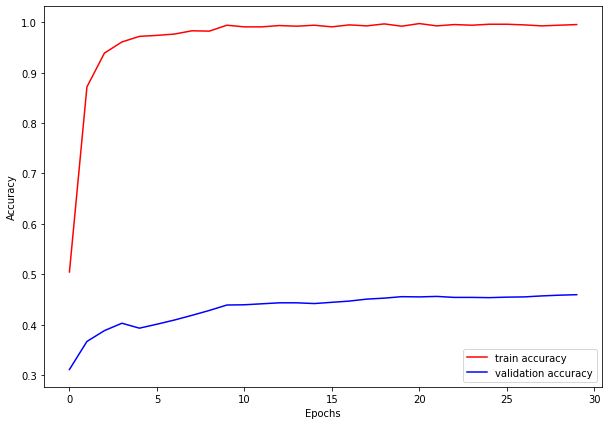

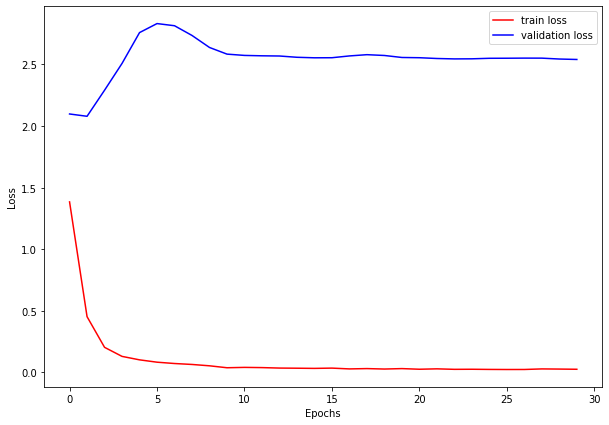

Iteration 7 / 8
lr: 0.0001_wd: 5e-05_gamma: 0.2097903624206885
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.1762685775756836




Train Loss: 2.0600, Train Acc: 0.17
Val Loss: 2.2868, Val Acc: 0.12


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.3796780109405518




Train Loss: 1.5539, Train Acc: 0.49
Val Loss: 2.1871, Val Acc: 0.15


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0920, Train Acc: 0.64
Val Loss: 2.0984, Val Acc: 0.19


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.8054792284965515




Train Loss: 0.8447, Train Acc: 0.73
Val Loss: 2.0450, Val Acc: 0.22


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6689, Train Acc: 0.81
Val Loss: 2.0324, Val Acc: 0.22


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.5690745711326599




Train Loss: 0.5520, Train Acc: 0.85
Val Loss: 2.0504, Val Acc: 0.22


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.5099677443504333




Train Loss: 0.4730, Train Acc: 0.88
Val Loss: 2.0833, Val Acc: 0.22


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.3972, Train Acc: 0.90
Val Loss: 2.1233, Val Acc: 0.22


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.3978562653064728




Train Loss: 0.3627, Train Acc: 0.90
Val Loss: 2.1664, Val Acc: 0.22


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3287, Train Acc: 0.91
Val Loss: 2.2008, Val Acc: 0.22


Starting epoch 11/30, LR = [2.097903624206885e-05]
Step 60, Loss 0.2749992609024048




Train Loss: 0.3022, Train Acc: 0.92
Val Loss: 2.2067, Val Acc: 0.22


Starting epoch 12/30, LR = [2.097903624206885e-05]
Step 70, Loss 0.2940104305744171




Train Loss: 0.2943, Train Acc: 0.92
Val Loss: 2.2131, Val Acc: 0.22


Starting epoch 13/30, LR = [2.097903624206885e-05]




Train Loss: 0.2960, Train Acc: 0.92
Val Loss: 2.2200, Val Acc: 0.22


Starting epoch 14/30, LR = [2.097903624206885e-05]
Step 80, Loss 0.2857308089733124




Train Loss: 0.2955, Train Acc: 0.92
Val Loss: 2.2260, Val Acc: 0.22


Starting epoch 15/30, LR = [2.097903624206885e-05]




Train Loss: 0.2753, Train Acc: 0.93
Val Loss: 2.2317, Val Acc: 0.22


Starting epoch 16/30, LR = [2.097903624206885e-05]
Step 90, Loss 0.310994029045105




Train Loss: 0.2694, Train Acc: 0.93
Val Loss: 2.2370, Val Acc: 0.22


Starting epoch 17/30, LR = [2.097903624206885e-05]
Step 100, Loss 0.32201728224754333




Train Loss: 0.2868, Train Acc: 0.92
Val Loss: 2.2421, Val Acc: 0.22


Starting epoch 18/30, LR = [2.097903624206885e-05]




Train Loss: 0.2699, Train Acc: 0.93
Val Loss: 2.2474, Val Acc: 0.22


Starting epoch 19/30, LR = [2.097903624206885e-05]
Step 110, Loss 0.26869818568229675




Train Loss: 0.2706, Train Acc: 0.93
Val Loss: 2.2527, Val Acc: 0.22


Starting epoch 20/30, LR = [2.097903624206885e-05]




Train Loss: 0.2711, Train Acc: 0.92
Val Loss: 2.2573, Val Acc: 0.22


Starting epoch 21/30, LR = [4.4011996164603825e-06]
Step 120, Loss 0.25470128655433655




Train Loss: 0.2678, Train Acc: 0.93
Val Loss: 2.2583, Val Acc: 0.22


Starting epoch 22/30, LR = [4.4011996164603825e-06]
Step 130, Loss 0.28103315830230713




Train Loss: 0.2627, Train Acc: 0.93
Val Loss: 2.2594, Val Acc: 0.22


Starting epoch 23/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2624, Train Acc: 0.93
Val Loss: 2.2605, Val Acc: 0.22


Starting epoch 24/30, LR = [4.4011996164603825e-06]
Step 140, Loss 0.27077874541282654




Train Loss: 0.2671, Train Acc: 0.93
Val Loss: 2.2617, Val Acc: 0.22


Starting epoch 25/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2659, Train Acc: 0.93
Val Loss: 2.2626, Val Acc: 0.22


Starting epoch 26/30, LR = [4.4011996164603825e-06]
Step 150, Loss 0.25776198506355286




Train Loss: 0.2740, Train Acc: 0.92
Val Loss: 2.2637, Val Acc: 0.22


Starting epoch 27/30, LR = [4.4011996164603825e-06]
Step 160, Loss 0.22496755421161652




Train Loss: 0.2564, Train Acc: 0.93
Val Loss: 2.2648, Val Acc: 0.22


Starting epoch 28/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2619, Train Acc: 0.93
Val Loss: 2.2656, Val Acc: 0.22


Starting epoch 29/30, LR = [4.4011996164603825e-06]
Step 170, Loss 0.24685953557491302




Train Loss: 0.2616, Train Acc: 0.93
Val Loss: 2.2666, Val Acc: 0.22


Starting epoch 30/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2586, Train Acc: 0.93
Val Loss: 2.2677, Val Acc: 0.22




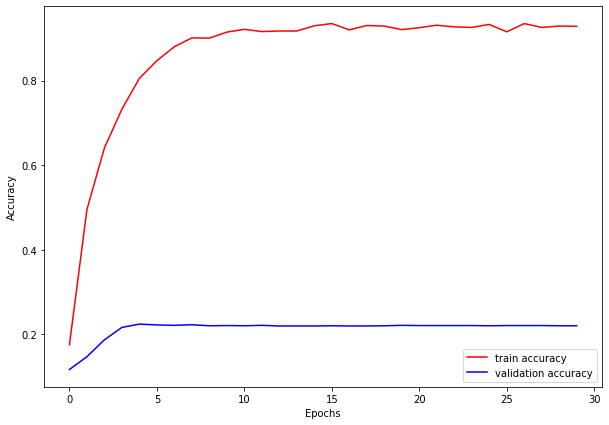

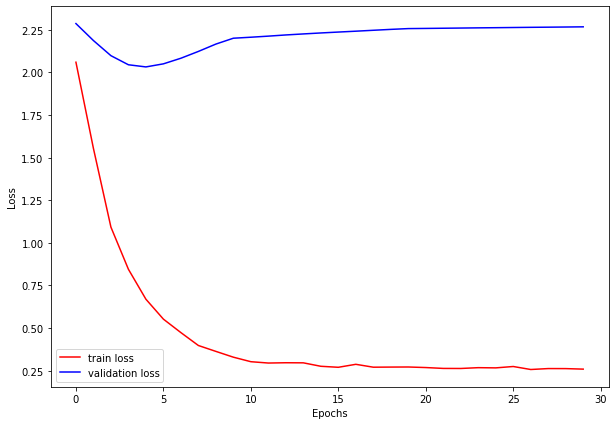

lr: 0.0001_wd: 5e-05_gamma: 0.2097903624206885
Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.0448248386383057




Train Loss: 1.8955, Train Acc: 0.29
Val Loss: 2.0297, Val Acc: 0.31


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.3586403131484985




Train Loss: 1.4365, Train Acc: 0.53
Val Loss: 1.9826, Val Acc: 0.35


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0352, Train Acc: 0.68
Val Loss: 1.9181, Val Acc: 0.44


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.7733092308044434




Train Loss: 0.7960, Train Acc: 0.77
Val Loss: 1.8492, Val Acc: 0.52


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6265, Train Acc: 0.84
Val Loss: 1.7888, Val Acc: 0.55


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.6052021980285645




Train Loss: 0.5187, Train Acc: 0.87
Val Loss: 1.7441, Val Acc: 0.54


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.4287552833557129




Train Loss: 0.4385, Train Acc: 0.89
Val Loss: 1.7142, Val Acc: 0.53


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.3785, Train Acc: 0.91
Val Loss: 1.6938, Val Acc: 0.51


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.3483826220035553




Train Loss: 0.3355, Train Acc: 0.92
Val Loss: 1.6795, Val Acc: 0.50


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.2994, Train Acc: 0.92
Val Loss: 1.6716, Val Acc: 0.49


Starting epoch 11/30, LR = [2.097903624206885e-05]
Step 60, Loss 0.284787654876709




Train Loss: 0.2835, Train Acc: 0.93
Val Loss: 1.6710, Val Acc: 0.48


Starting epoch 12/30, LR = [2.097903624206885e-05]
Step 70, Loss 0.35407787561416626




Train Loss: 0.2821, Train Acc: 0.93
Val Loss: 1.6701, Val Acc: 0.48


Starting epoch 13/30, LR = [2.097903624206885e-05]




Train Loss: 0.2720, Train Acc: 0.94
Val Loss: 1.6695, Val Acc: 0.48


Starting epoch 14/30, LR = [2.097903624206885e-05]
Step 80, Loss 0.24440982937812805




Train Loss: 0.2682, Train Acc: 0.94
Val Loss: 1.6690, Val Acc: 0.48


Starting epoch 15/30, LR = [2.097903624206885e-05]




Train Loss: 0.2667, Train Acc: 0.93
Val Loss: 1.6684, Val Acc: 0.48


Starting epoch 16/30, LR = [2.097903624206885e-05]
Step 90, Loss 0.20805348455905914




Train Loss: 0.2584, Train Acc: 0.93
Val Loss: 1.6679, Val Acc: 0.48


Starting epoch 17/30, LR = [2.097903624206885e-05]
Step 100, Loss 0.27899670600891113




Train Loss: 0.2613, Train Acc: 0.94
Val Loss: 1.6673, Val Acc: 0.48


Starting epoch 18/30, LR = [2.097903624206885e-05]




Train Loss: 0.2507, Train Acc: 0.93
Val Loss: 1.6671, Val Acc: 0.48


Starting epoch 19/30, LR = [2.097903624206885e-05]
Step 110, Loss 0.22992774844169617




Train Loss: 0.2537, Train Acc: 0.93
Val Loss: 1.6670, Val Acc: 0.48


Starting epoch 20/30, LR = [2.097903624206885e-05]




Train Loss: 0.2442, Train Acc: 0.94
Val Loss: 1.6669, Val Acc: 0.49


Starting epoch 21/30, LR = [4.4011996164603825e-06]
Step 120, Loss 0.2512451112270355




Train Loss: 0.2475, Train Acc: 0.94
Val Loss: 1.6668, Val Acc: 0.48


Starting epoch 22/30, LR = [4.4011996164603825e-06]
Step 130, Loss 0.20437633991241455




Train Loss: 0.2373, Train Acc: 0.94
Val Loss: 1.6667, Val Acc: 0.48


Starting epoch 23/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2463, Train Acc: 0.93
Val Loss: 1.6665, Val Acc: 0.48


Starting epoch 24/30, LR = [4.4011996164603825e-06]
Step 140, Loss 0.210057333111763




Train Loss: 0.2412, Train Acc: 0.94
Val Loss: 1.6664, Val Acc: 0.48


Starting epoch 25/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2394, Train Acc: 0.94
Val Loss: 1.6662, Val Acc: 0.48


Starting epoch 26/30, LR = [4.4011996164603825e-06]
Step 150, Loss 0.26511150598526




Train Loss: 0.2468, Train Acc: 0.94
Val Loss: 1.6661, Val Acc: 0.48


Starting epoch 27/30, LR = [4.4011996164603825e-06]
Step 160, Loss 0.24041973054409027




Train Loss: 0.2421, Train Acc: 0.94
Val Loss: 1.6661, Val Acc: 0.48


Starting epoch 28/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2402, Train Acc: 0.94
Val Loss: 1.6660, Val Acc: 0.48


Starting epoch 29/30, LR = [4.4011996164603825e-06]
Step 170, Loss 0.23645800352096558




Train Loss: 0.2447, Train Acc: 0.94
Val Loss: 1.6661, Val Acc: 0.49


Starting epoch 30/30, LR = [4.4011996164603825e-06]




Train Loss: 0.2376, Train Acc: 0.94
Val Loss: 1.6660, Val Acc: 0.49




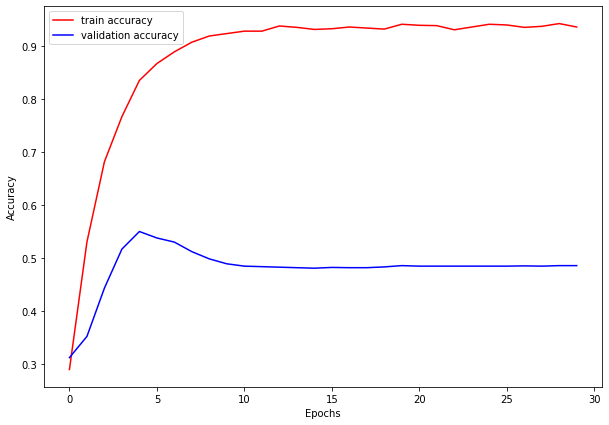

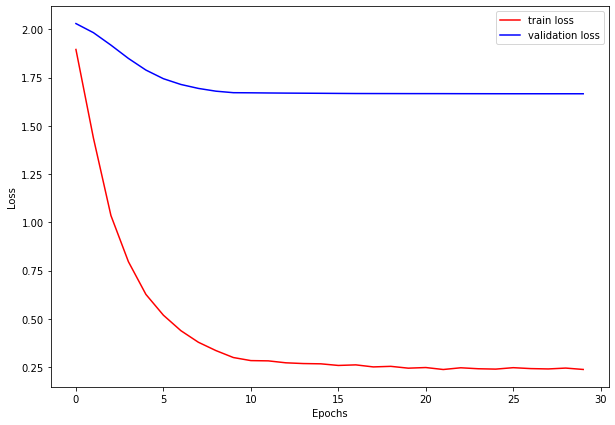

Iteration 8 / 8
lr: 0.001_wd: 5e-05_gamma: 0.14646140854446577
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.1127309799194336




Train Loss: 1.4032, Train Acc: 0.49
Val Loss: 1.7648, Val Acc: 0.32


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.36544859409332275




Train Loss: 0.4545, Train Acc: 0.87
Val Loss: 2.1437, Val Acc: 0.25


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.1988, Train Acc: 0.94
Val Loss: 2.7675, Val Acc: 0.25


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.22047820687294006




Train Loss: 0.1416, Train Acc: 0.96
Val Loss: 3.2600, Val Acc: 0.26


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1160, Train Acc: 0.96
Val Loss: 3.6347, Val Acc: 0.25


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.10373244434595108




Train Loss: 0.0899, Train Acc: 0.97
Val Loss: 3.8104, Val Acc: 0.25


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.08293067663908005




Train Loss: 0.0848, Train Acc: 0.98
Val Loss: 3.9021, Val Acc: 0.26


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0616, Train Acc: 0.98
Val Loss: 3.8502, Val Acc: 0.27


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.052243441343307495




Train Loss: 0.0533, Train Acc: 0.98
Val Loss: 3.8303, Val Acc: 0.27


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0451, Train Acc: 0.98
Val Loss: 3.7752, Val Acc: 0.28


Starting epoch 11/30, LR = [0.00014646140854446577]
Step 60, Loss 0.05225073918700218




Train Loss: 0.0478, Train Acc: 0.99
Val Loss: 3.7792, Val Acc: 0.28


Starting epoch 12/30, LR = [0.00014646140854446577]
Step 70, Loss 0.028118614107370377




Train Loss: 0.0439, Train Acc: 0.99
Val Loss: 3.7895, Val Acc: 0.27


Starting epoch 13/30, LR = [0.00014646140854446577]




Train Loss: 0.0439, Train Acc: 0.99
Val Loss: 3.8006, Val Acc: 0.27


Starting epoch 14/30, LR = [0.00014646140854446577]
Step 80, Loss 0.03876524046063423




Train Loss: 0.0427, Train Acc: 0.99
Val Loss: 3.8064, Val Acc: 0.27


Starting epoch 15/30, LR = [0.00014646140854446577]




Train Loss: 0.0430, Train Acc: 0.99
Val Loss: 3.8152, Val Acc: 0.27


Starting epoch 16/30, LR = [0.00014646140854446577]
Step 90, Loss 0.04704669862985611




Train Loss: 0.0422, Train Acc: 0.99
Val Loss: 3.8263, Val Acc: 0.27


Starting epoch 17/30, LR = [0.00014646140854446577]
Step 100, Loss 0.04376250505447388




Train Loss: 0.0402, Train Acc: 0.99
Val Loss: 3.8416, Val Acc: 0.27


Starting epoch 18/30, LR = [0.00014646140854446577]




Train Loss: 0.0360, Train Acc: 0.99
Val Loss: 3.8552, Val Acc: 0.27


Starting epoch 19/30, LR = [0.00014646140854446577]
Step 110, Loss 0.0376993864774704




Train Loss: 0.0331, Train Acc: 0.99
Val Loss: 3.8585, Val Acc: 0.27


Starting epoch 20/30, LR = [0.00014646140854446577]




Train Loss: 0.0411, Train Acc: 0.99
Val Loss: 3.8568, Val Acc: 0.27


Starting epoch 21/30, LR = [2.145094419282891e-05]
Step 120, Loss 0.04358126223087311




Train Loss: 0.0387, Train Acc: 0.99
Val Loss: 3.8563, Val Acc: 0.27


Starting epoch 22/30, LR = [2.145094419282891e-05]
Step 130, Loss 0.029156984761357307




Train Loss: 0.0381, Train Acc: 0.99
Val Loss: 3.8565, Val Acc: 0.27


Starting epoch 23/30, LR = [2.145094419282891e-05]




Train Loss: 0.0401, Train Acc: 0.99
Val Loss: 3.8572, Val Acc: 0.27


Starting epoch 24/30, LR = [2.145094419282891e-05]
Step 140, Loss 0.039107050746679306




Train Loss: 0.0404, Train Acc: 0.99
Val Loss: 3.8571, Val Acc: 0.27


Starting epoch 25/30, LR = [2.145094419282891e-05]




Train Loss: 0.0386, Train Acc: 0.99
Val Loss: 3.8555, Val Acc: 0.27


Starting epoch 26/30, LR = [2.145094419282891e-05]
Step 150, Loss 0.03801809996366501




Train Loss: 0.0364, Train Acc: 0.99
Val Loss: 3.8536, Val Acc: 0.27


Starting epoch 27/30, LR = [2.145094419282891e-05]
Step 160, Loss 0.0358847975730896




Train Loss: 0.0445, Train Acc: 0.99
Val Loss: 3.8522, Val Acc: 0.27


Starting epoch 28/30, LR = [2.145094419282891e-05]




Train Loss: 0.0386, Train Acc: 0.99
Val Loss: 3.8503, Val Acc: 0.27


Starting epoch 29/30, LR = [2.145094419282891e-05]
Step 170, Loss 0.04670898616313934




Train Loss: 0.0355, Train Acc: 0.99
Val Loss: 3.8502, Val Acc: 0.27


Starting epoch 30/30, LR = [2.145094419282891e-05]




Train Loss: 0.0347, Train Acc: 0.99
Val Loss: 3.8503, Val Acc: 0.27




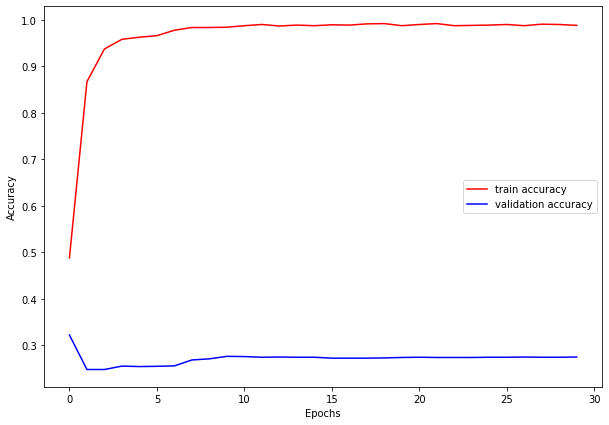

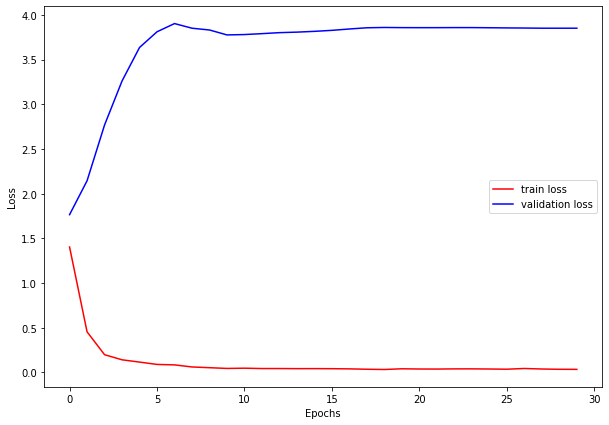

lr: 0.001_wd: 5e-05_gamma: 0.14646140854446577
Starting epoch 1/30, LR = [0.001]
Step 0, Loss 2.226430654525757




Train Loss: 1.4881, Train Acc: 0.44
Val Loss: 1.7033, Val Acc: 0.56


Starting epoch 2/30, LR = [0.001]
Step 10, Loss 0.36711546778678894




Train Loss: 0.4584, Train Acc: 0.87
Val Loss: 1.7559, Val Acc: 0.61


Starting epoch 3/30, LR = [0.001]




Train Loss: 0.2075, Train Acc: 0.93
Val Loss: 1.8550, Val Acc: 0.63


Starting epoch 4/30, LR = [0.001]
Step 20, Loss 0.15186293423175812




Train Loss: 0.1331, Train Acc: 0.96
Val Loss: 1.9118, Val Acc: 0.63


Starting epoch 5/30, LR = [0.001]




Train Loss: 0.1095, Train Acc: 0.96
Val Loss: 1.9897, Val Acc: 0.63


Starting epoch 6/30, LR = [0.001]
Step 30, Loss 0.08032239228487015




Train Loss: 0.0810, Train Acc: 0.97
Val Loss: 2.0461, Val Acc: 0.62


Starting epoch 7/30, LR = [0.001]
Step 40, Loss 0.0914636179804802




Train Loss: 0.0750, Train Acc: 0.97
Val Loss: 2.0399, Val Acc: 0.60


Starting epoch 8/30, LR = [0.001]




Train Loss: 0.0636, Train Acc: 0.98
Val Loss: 2.0411, Val Acc: 0.59


Starting epoch 9/30, LR = [0.001]
Step 50, Loss 0.04963207244873047




Train Loss: 0.0526, Train Acc: 0.99
Val Loss: 2.0545, Val Acc: 0.59


Starting epoch 10/30, LR = [0.001]




Train Loss: 0.0450, Train Acc: 0.99
Val Loss: 2.0516, Val Acc: 0.59


Starting epoch 11/30, LR = [0.00014646140854446577]
Step 60, Loss 0.05845297500491142




Train Loss: 0.0468, Train Acc: 0.99
Val Loss: 2.0510, Val Acc: 0.59


Starting epoch 12/30, LR = [0.00014646140854446577]
Step 70, Loss 0.04968925565481186




Train Loss: 0.0412, Train Acc: 0.99
Val Loss: 2.0483, Val Acc: 0.60


Starting epoch 13/30, LR = [0.00014646140854446577]




Train Loss: 0.0471, Train Acc: 0.98
Val Loss: 2.0464, Val Acc: 0.60


Starting epoch 14/30, LR = [0.00014646140854446577]
Step 80, Loss 0.03965453431010246




Train Loss: 0.0408, Train Acc: 0.99
Val Loss: 2.0425, Val Acc: 0.60


Starting epoch 15/30, LR = [0.00014646140854446577]




Train Loss: 0.0424, Train Acc: 0.99
Val Loss: 2.0379, Val Acc: 0.60


Starting epoch 16/30, LR = [0.00014646140854446577]
Step 90, Loss 0.04006006941199303




Train Loss: 0.0417, Train Acc: 0.99
Val Loss: 2.0344, Val Acc: 0.60


Starting epoch 17/30, LR = [0.00014646140854446577]
Step 100, Loss 0.034438036382198334




Train Loss: 0.0353, Train Acc: 0.99
Val Loss: 2.0299, Val Acc: 0.60


Starting epoch 18/30, LR = [0.00014646140854446577]




Train Loss: 0.0409, Train Acc: 0.99
Val Loss: 2.0279, Val Acc: 0.61


Starting epoch 19/30, LR = [0.00014646140854446577]
Step 110, Loss 0.03101983293890953




Train Loss: 0.0340, Train Acc: 0.99
Val Loss: 2.0276, Val Acc: 0.61


Starting epoch 20/30, LR = [0.00014646140854446577]




Train Loss: 0.0356, Train Acc: 0.99
Val Loss: 2.0265, Val Acc: 0.61


Starting epoch 21/30, LR = [2.145094419282891e-05]
Step 120, Loss 0.034767791628837585




Train Loss: 0.0373, Train Acc: 0.99
Val Loss: 2.0270, Val Acc: 0.61


Starting epoch 22/30, LR = [2.145094419282891e-05]
Step 130, Loss 0.05027030035853386




Train Loss: 0.0376, Train Acc: 0.99
Val Loss: 2.0276, Val Acc: 0.61


Starting epoch 23/30, LR = [2.145094419282891e-05]




Train Loss: 0.0388, Train Acc: 0.99
Val Loss: 2.0282, Val Acc: 0.61


Starting epoch 24/30, LR = [2.145094419282891e-05]
Step 140, Loss 0.024752607569098473




Train Loss: 0.0362, Train Acc: 0.99
Val Loss: 2.0283, Val Acc: 0.61


Starting epoch 25/30, LR = [2.145094419282891e-05]




Train Loss: 0.0428, Train Acc: 0.99
Val Loss: 2.0279, Val Acc: 0.61


Starting epoch 26/30, LR = [2.145094419282891e-05]
Step 150, Loss 0.03699735179543495




Train Loss: 0.0370, Train Acc: 0.99
Val Loss: 2.0266, Val Acc: 0.61


Starting epoch 27/30, LR = [2.145094419282891e-05]
Step 160, Loss 0.044910598546266556




Train Loss: 0.0349, Train Acc: 0.99
Val Loss: 2.0255, Val Acc: 0.61


Starting epoch 28/30, LR = [2.145094419282891e-05]




Train Loss: 0.0421, Train Acc: 0.99
Val Loss: 2.0248, Val Acc: 0.61


Starting epoch 29/30, LR = [2.145094419282891e-05]
Step 170, Loss 0.04110696166753769




Train Loss: 0.0341, Train Acc: 0.99
Val Loss: 2.0237, Val Acc: 0.61


Starting epoch 30/30, LR = [2.145094419282891e-05]




Train Loss: 0.0325, Train Acc: 0.99
Val Loss: 2.0229, Val Acc: 0.61




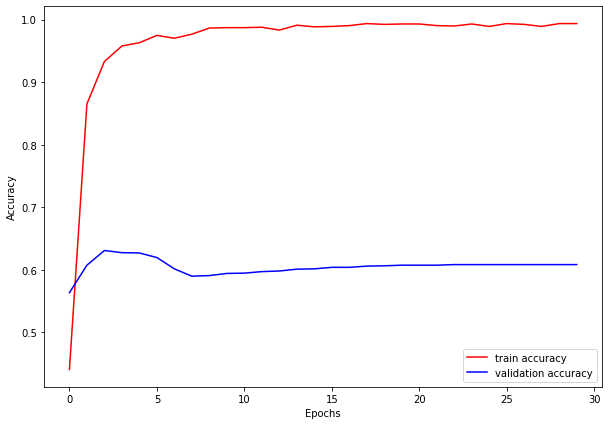

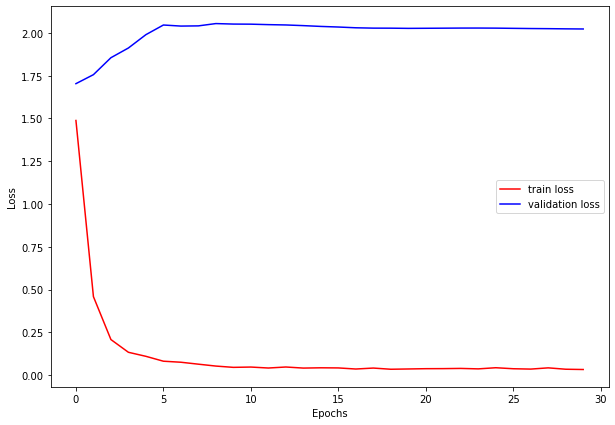

In [ ]:
import random
num_iters=8

for i in range(num_iters):
    print(f'Iteration {i+1} / {num_iters}')
    lr = 10**(-random.randint(2,4))
    wd = 5*10**(-random.randint(4,6))
    gamma = random.uniform(0.1,0.5)
    
    s = f'lr: {lr}_wd: {wd}_gamma: {gamma}'
    print(s)
    net = torchvision.models.alexnet(pretrained=True) 
    net.classifier[6] = nn.Linear(4096, NUM_CLASSES) 
    criterion = nn.CrossEntropyLoss() 
    parameters_to_optimize = net.parameters() 
    optimizer = optim.SGD(parameters_to_optimize, lr=lr, momentum=MOMENTUM, weight_decay=wd)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=gamma)
    training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=cartoon_dataloader)
    
    plot_results(training_loss,training_accuracy,validation_loss,validation_accuracy,"Cartoon_alexnet_noDANN_pretrained_"+s)
    print(s)
    net = torchvision.models.alexnet(pretrained=True) 
    net.classifier[6] = nn.Linear(4096, NUM_CLASSES) 
    criterion = nn.CrossEntropyLoss() 
    parameters_to_optimize = net.parameters() 
    optimizer = optim.SGD(parameters_to_optimize, lr=lr, momentum=MOMENTUM, weight_decay=wd)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=gamma)
    
    training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=sketch_dataloader)
    
    plot_results(training_loss,training_accuracy,validation_loss,validation_accuracy,"Sketch_alexnet_noDANN_pretrained_"+s)

### TESTING THE BEST SET

SET THE FOUND HYPERPARAMETERS

In [ ]:
DEVICE = 'cuda' 

NUM_CLASSES = 7 

BATCH_SIZE = 256     
                     

LR = 1e-4            
MOMENTUM = 0.9       
WEIGHT_DECAY = 5e-6  
ALPHA = 0.1         
NUM_EPOCHS = 30      
STEP_SIZE = 10       
GAMMA = 0.38          

LOG_FREQUENCY = 10

NUM_DOMAINS = 2

In [ ]:

net = alexnet(pretrained = True)
net.classifier[6] = nn.Linear(4096,NUM_CLASSES)
criterion = nn.CrossEntropyLoss() 
domain_criterion = nn.CrossEntropyLoss()

parameters_to_optimize = net.parameters()


optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)


scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

In [ ]:
training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=target_dataloader)

Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.0981805324554443




Train Loss: 1.9641, Train Acc: 0.18
Val Loss: 1.9739, Val Acc: 0.25


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.2544989585876465




Train Loss: 1.4716, Train Acc: 0.49
Val Loss: 1.8577, Val Acc: 0.32


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0582, Train Acc: 0.61
Val Loss: 1.7566, Val Acc: 0.36


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.7913678288459778




Train Loss: 0.7957, Train Acc: 0.71
Val Loss: 1.6855, Val Acc: 0.38


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6317, Train Acc: 0.76
Val Loss: 1.6446, Val Acc: 0.40


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.5781139731407166




Train Loss: 0.5333, Train Acc: 0.79
Val Loss: 1.6261, Val Acc: 0.40


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.46179383993148804




Train Loss: 0.4377, Train Acc: 0.81
Val Loss: 1.6219, Val Acc: 0.40


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.3774, Train Acc: 0.83
Val Loss: 1.6243, Val Acc: 0.40


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.3165556788444519




Train Loss: 0.3404, Train Acc: 0.85
Val Loss: 1.6292, Val Acc: 0.40


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3045, Train Acc: 0.85
Val Loss: 1.6354, Val Acc: 0.41


Starting epoch 11/30, LR = [3.8e-05]
Step 60, Loss 0.2803284525871277




Train Loss: 0.2846, Train Acc: 0.85
Val Loss: 1.6367, Val Acc: 0.41


Starting epoch 12/30, LR = [3.8e-05]
Step 70, Loss 0.30396878719329834




Train Loss: 0.2825, Train Acc: 0.86
Val Loss: 1.6388, Val Acc: 0.41


Starting epoch 13/30, LR = [3.8e-05]




Train Loss: 0.2672, Train Acc: 0.86
Val Loss: 1.6411, Val Acc: 0.41


Starting epoch 14/30, LR = [3.8e-05]
Step 80, Loss 0.28906872868537903




Train Loss: 0.2613, Train Acc: 0.86
Val Loss: 1.6424, Val Acc: 0.41


Starting epoch 15/30, LR = [3.8e-05]




Train Loss: 0.2654, Train Acc: 0.85
Val Loss: 1.6449, Val Acc: 0.41


Starting epoch 16/30, LR = [3.8e-05]
Step 90, Loss 0.2580198049545288




Train Loss: 0.2550, Train Acc: 0.86
Val Loss: 1.6470, Val Acc: 0.41


Starting epoch 17/30, LR = [3.8e-05]
Step 100, Loss 0.25847873091697693




Train Loss: 0.2457, Train Acc: 0.87
Val Loss: 1.6487, Val Acc: 0.42


Starting epoch 18/30, LR = [3.8e-05]




Train Loss: 0.2368, Train Acc: 0.86
Val Loss: 1.6504, Val Acc: 0.42


Starting epoch 19/30, LR = [3.8e-05]
Step 110, Loss 0.23153750598430634




Train Loss: 0.2302, Train Acc: 0.87
Val Loss: 1.6523, Val Acc: 0.42


Starting epoch 20/30, LR = [3.8e-05]




Train Loss: 0.2266, Train Acc: 0.87
Val Loss: 1.6539, Val Acc: 0.41


Starting epoch 21/30, LR = [1.444e-05]
Step 120, Loss 0.25942036509513855




Train Loss: 0.2273, Train Acc: 0.86
Val Loss: 1.6541, Val Acc: 0.41


Starting epoch 22/30, LR = [1.444e-05]
Step 130, Loss 0.2115425020456314




Train Loss: 0.2321, Train Acc: 0.86
Val Loss: 1.6544, Val Acc: 0.41


Starting epoch 23/30, LR = [1.444e-05]




Train Loss: 0.2195, Train Acc: 0.87
Val Loss: 1.6546, Val Acc: 0.42


Starting epoch 24/30, LR = [1.444e-05]
Step 140, Loss 0.2341185212135315




Train Loss: 0.2233, Train Acc: 0.87
Val Loss: 1.6557, Val Acc: 0.42


Starting epoch 25/30, LR = [1.444e-05]




Train Loss: 0.2195, Train Acc: 0.87
Val Loss: 1.6565, Val Acc: 0.42


Starting epoch 26/30, LR = [1.444e-05]
Step 150, Loss 0.26363861560821533




Train Loss: 0.2177, Train Acc: 0.87
Val Loss: 1.6567, Val Acc: 0.42


Starting epoch 27/30, LR = [1.444e-05]
Step 160, Loss 0.1758011132478714




Train Loss: 0.2144, Train Acc: 0.87
Val Loss: 1.6572, Val Acc: 0.42


Starting epoch 28/30, LR = [1.444e-05]




Train Loss: 0.2154, Train Acc: 0.87
Val Loss: 1.6578, Val Acc: 0.42


Starting epoch 29/30, LR = [1.444e-05]
Step 170, Loss 0.229908287525177




Train Loss: 0.2126, Train Acc: 0.87
Val Loss: 1.6586, Val Acc: 0.42


Starting epoch 30/30, LR = [1.444e-05]




Train Loss: 0.2125, Train Acc: 0.87
Val Loss: 1.6591, Val Acc: 0.42




In [ ]:
training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=cartoon_dataloader)
training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=sketch_dataloader)

Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.276968240737915




Train Loss: 2.1976, Train Acc: 0.14
Val Loss: 2.2408, Val Acc: 0.20


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.5496829748153687




Train Loss: 1.6705, Train Acc: 0.39
Val Loss: 2.1485, Val Acc: 0.24


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.1929, Train Acc: 0.54
Val Loss: 2.0991, Val Acc: 0.26


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.9164015054702759




Train Loss: 0.9107, Train Acc: 0.63
Val Loss: 2.0977, Val Acc: 0.26


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.7396, Train Acc: 0.70
Val Loss: 2.1293, Val Acc: 0.25


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.6645359396934509




Train Loss: 0.5968, Train Acc: 0.77
Val Loss: 2.1778, Val Acc: 0.24


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.44619375467300415




Train Loss: 0.5054, Train Acc: 0.80
Val Loss: 2.2333, Val Acc: 0.23


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.4369, Train Acc: 0.81
Val Loss: 2.2908, Val Acc: 0.23


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.3928567171096802




Train Loss: 0.3833, Train Acc: 0.83
Val Loss: 2.3490, Val Acc: 0.23


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3420, Train Acc: 0.84
Val Loss: 2.3913, Val Acc: 0.23


Starting epoch 11/30, LR = [3.8e-05]
Step 60, Loss 0.33778324723243713




Train Loss: 0.3256, Train Acc: 0.85
Val Loss: 2.4068, Val Acc: 0.23


Starting epoch 12/30, LR = [3.8e-05]
Step 70, Loss 0.25021159648895264




Train Loss: 0.3117, Train Acc: 0.85
Val Loss: 2.4200, Val Acc: 0.23


Starting epoch 13/30, LR = [3.8e-05]




Train Loss: 0.3009, Train Acc: 0.85
Val Loss: 2.4332, Val Acc: 0.23


Starting epoch 14/30, LR = [3.8e-05]
Step 80, Loss 0.27098608016967773




Train Loss: 0.2899, Train Acc: 0.85
Val Loss: 2.4467, Val Acc: 0.23


Starting epoch 15/30, LR = [3.8e-05]




Train Loss: 0.2825, Train Acc: 0.86
Val Loss: 2.4583, Val Acc: 0.23


Starting epoch 16/30, LR = [3.8e-05]
Step 90, Loss 0.2894391119480133




Train Loss: 0.2772, Train Acc: 0.85
Val Loss: 2.4710, Val Acc: 0.23


Starting epoch 17/30, LR = [3.8e-05]
Step 100, Loss 0.26319754123687744




Train Loss: 0.2770, Train Acc: 0.85
Val Loss: 2.4839, Val Acc: 0.23


Starting epoch 18/30, LR = [3.8e-05]




Train Loss: 0.2574, Train Acc: 0.86
Val Loss: 2.4971, Val Acc: 0.23


Starting epoch 19/30, LR = [3.8e-05]
Step 110, Loss 0.251871258020401




Train Loss: 0.2635, Train Acc: 0.85
Val Loss: 2.5077, Val Acc: 0.23


Starting epoch 20/30, LR = [3.8e-05]




Train Loss: 0.2540, Train Acc: 0.86
Val Loss: 2.5186, Val Acc: 0.23


Starting epoch 21/30, LR = [1.444e-05]
Step 120, Loss 0.24476763606071472




Train Loss: 0.2548, Train Acc: 0.86
Val Loss: 2.5229, Val Acc: 0.23


Starting epoch 22/30, LR = [1.444e-05]
Step 130, Loss 0.20808972418308258




Train Loss: 0.2370, Train Acc: 0.87
Val Loss: 2.5263, Val Acc: 0.23


Starting epoch 23/30, LR = [1.444e-05]




Train Loss: 0.2375, Train Acc: 0.87
Val Loss: 2.5297, Val Acc: 0.23


Starting epoch 24/30, LR = [1.444e-05]
Step 140, Loss 0.28963661193847656




Train Loss: 0.2409, Train Acc: 0.86
Val Loss: 2.5336, Val Acc: 0.23


Starting epoch 25/30, LR = [1.444e-05]




Train Loss: 0.2337, Train Acc: 0.87
Val Loss: 2.5371, Val Acc: 0.23


Starting epoch 26/30, LR = [1.444e-05]
Step 150, Loss 0.25487974286079407




Train Loss: 0.2337, Train Acc: 0.87
Val Loss: 2.5409, Val Acc: 0.23


Starting epoch 27/30, LR = [1.444e-05]
Step 160, Loss 0.21941877901554108




Train Loss: 0.2356, Train Acc: 0.87
Val Loss: 2.5442, Val Acc: 0.23


Starting epoch 28/30, LR = [1.444e-05]




Train Loss: 0.2343, Train Acc: 0.86
Val Loss: 2.5483, Val Acc: 0.23


Starting epoch 29/30, LR = [1.444e-05]
Step 170, Loss 0.21698391437530518




Train Loss: 0.2351, Train Acc: 0.86
Val Loss: 2.5531, Val Acc: 0.23


Starting epoch 30/30, LR = [1.444e-05]




Train Loss: 0.2247, Train Acc: 0.86
Val Loss: 2.5579, Val Acc: 0.23


Starting epoch 1/30, LR = [5.487200000000001e-06]
Step 0, Loss 0.2518967390060425




Train Loss: 0.2355, Train Acc: 0.87
Val Loss: 1.9718, Val Acc: 0.39


Starting epoch 2/30, LR = [5.487200000000001e-06]
Step 10, Loss 0.2086690366268158




Train Loss: 0.2272, Train Acc: 0.87
Val Loss: 1.9722, Val Acc: 0.39


Starting epoch 3/30, LR = [5.487200000000001e-06]




Train Loss: 0.2314, Train Acc: 0.87
Val Loss: 1.9725, Val Acc: 0.39


Starting epoch 4/30, LR = [5.487200000000001e-06]
Step 20, Loss 0.21387901902198792




Train Loss: 0.2230, Train Acc: 0.87
Val Loss: 1.9728, Val Acc: 0.39


Starting epoch 5/30, LR = [5.487200000000001e-06]




Train Loss: 0.2290, Train Acc: 0.86
Val Loss: 1.9731, Val Acc: 0.39


Starting epoch 6/30, LR = [5.487200000000001e-06]
Step 30, Loss 0.1876068413257599




Train Loss: 0.2247, Train Acc: 0.87
Val Loss: 1.9733, Val Acc: 0.39


Starting epoch 7/30, LR = [5.487200000000001e-06]
Step 40, Loss 0.1847495287656784




Train Loss: 0.2280, Train Acc: 0.87
Val Loss: 1.9734, Val Acc: 0.39


Starting epoch 8/30, LR = [5.487200000000001e-06]




Train Loss: 0.2192, Train Acc: 0.87
Val Loss: 1.9738, Val Acc: 0.39


Starting epoch 9/30, LR = [5.487200000000001e-06]
Step 50, Loss 0.20690080523490906




Train Loss: 0.2224, Train Acc: 0.86
Val Loss: 1.9740, Val Acc: 0.39


Starting epoch 10/30, LR = [5.487200000000001e-06]




Train Loss: 0.2295, Train Acc: 0.87
Val Loss: 1.9743, Val Acc: 0.39


Starting epoch 11/30, LR = [2.0851360000000003e-06]
Step 60, Loss 0.22268374264240265




Train Loss: 0.2243, Train Acc: 0.87
Val Loss: 1.9743, Val Acc: 0.39


Starting epoch 12/30, LR = [2.0851360000000003e-06]
Step 70, Loss 0.2273617684841156




Train Loss: 0.2272, Train Acc: 0.87
Val Loss: 1.9743, Val Acc: 0.39


Starting epoch 13/30, LR = [2.0851360000000003e-06]




Train Loss: 0.2161, Train Acc: 0.87
Val Loss: 1.9744, Val Acc: 0.39


Starting epoch 14/30, LR = [2.0851360000000003e-06]
Step 80, Loss 0.21819503605365753




Train Loss: 0.2148, Train Acc: 0.87
Val Loss: 1.9744, Val Acc: 0.39


Starting epoch 15/30, LR = [2.0851360000000003e-06]




Train Loss: 0.2207, Train Acc: 0.87
Val Loss: 1.9745, Val Acc: 0.39


Starting epoch 16/30, LR = [2.0851360000000003e-06]
Step 90, Loss 0.19715118408203125




Train Loss: 0.2162, Train Acc: 0.87
Val Loss: 1.9746, Val Acc: 0.39


Starting epoch 17/30, LR = [2.0851360000000003e-06]
Step 100, Loss 0.2407735288143158




Train Loss: 0.2224, Train Acc: 0.87
Val Loss: 1.9747, Val Acc: 0.39


Starting epoch 18/30, LR = [2.0851360000000003e-06]




Train Loss: 0.2174, Train Acc: 0.87
Val Loss: 1.9748, Val Acc: 0.39


Starting epoch 19/30, LR = [2.0851360000000003e-06]
Step 110, Loss 0.19630129635334015




Train Loss: 0.2217, Train Acc: 0.87
Val Loss: 1.9749, Val Acc: 0.39


Starting epoch 20/30, LR = [2.0851360000000003e-06]




Train Loss: 0.2204, Train Acc: 0.87
Val Loss: 1.9750, Val Acc: 0.39


Starting epoch 21/30, LR = [7.923516800000001e-07]
Step 120, Loss 0.21510064601898193




Train Loss: 0.2308, Train Acc: 0.86
Val Loss: 1.9751, Val Acc: 0.39


Starting epoch 22/30, LR = [7.923516800000001e-07]
Step 130, Loss 0.22363238036632538




Train Loss: 0.2167, Train Acc: 0.87
Val Loss: 1.9751, Val Acc: 0.39


Starting epoch 23/30, LR = [7.923516800000001e-07]




Train Loss: 0.2191, Train Acc: 0.87
Val Loss: 1.9752, Val Acc: 0.39


Starting epoch 24/30, LR = [7.923516800000001e-07]
Step 140, Loss 0.24848510324954987




Train Loss: 0.2219, Train Acc: 0.87
Val Loss: 1.9752, Val Acc: 0.39


Starting epoch 25/30, LR = [7.923516800000001e-07]




Train Loss: 0.2194, Train Acc: 0.87
Val Loss: 1.9753, Val Acc: 0.39


Starting epoch 26/30, LR = [7.923516800000001e-07]
Step 150, Loss 0.18754282593727112




Train Loss: 0.2177, Train Acc: 0.87
Val Loss: 1.9753, Val Acc: 0.39


Starting epoch 27/30, LR = [7.923516800000001e-07]
Step 160, Loss 0.18616682291030884




Train Loss: 0.2175, Train Acc: 0.87
Val Loss: 1.9754, Val Acc: 0.39


Starting epoch 28/30, LR = [7.923516800000001e-07]




Train Loss: 0.2145, Train Acc: 0.87
Val Loss: 1.9754, Val Acc: 0.39


Starting epoch 29/30, LR = [7.923516800000001e-07]
Step 170, Loss 0.2349008321762085




Train Loss: 0.2299, Train Acc: 0.86
Val Loss: 1.9755, Val Acc: 0.39


Starting epoch 30/30, LR = [7.923516800000001e-07]




Train Loss: 0.2175, Train Acc: 0.87
Val Loss: 1.9755, Val Acc: 0.39




In [ ]:
test(net,target_dataloader)


Test Accuracy: 0.43701171875


0.43701171875

## DOMAIN ADAPTATION

### RUNS

In [ ]:
def train_dann(net,src_dataloader,target_dataloader,ALPHA):
  
  net = net.to(DEVICE) 
  
  cudnn.benchmark 
  train_loss , train_accuracy , train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy = [], [], [], [], [], []
  train_domain_loss, train_domain_accuracy,train_total_loss, train_total_accuracy = [], [], [], []
  val_loss , val_accuracy = [], []

  current_step = 0
  
  for epoch in range(NUM_EPOCHS):
    val_running_loss = 0.0
    val_running_correct = 0
    train_running_loss = 0.0
    train_running_correct = 0
    train_running_src_domain_loss = 0.0
    train_running_src_domain_correct = 0
    train_running_target_domain_loss = 0.0
    train_running_target_domain_correct = 0
    train_running_total_loss = 0.0
    train_running_total_correct = 0

    train_NUM_BATCHES = 0
    val_NUM_BATCHES = 0
    print('Starting epoch {}/{}, LR = {}'.format(epoch+1, NUM_EPOCHS, scheduler.get_last_lr()))
    net.train(True)
    len_dataloader = max(len(src_dataloader), len(target_dataloader))
    data_source_iter = iter(src_dataloader)
    data_target_iter = iter(target_dataloader)
   
    
    for i in range(len_dataloader):
      
    

      try:
        data_source = data_source_iter.next()
        src_images, src_labels = data_source
      except StopIteration:
        data_source_iter = iter(src_dataloader)
        src_images, src_labels = next(data_source_iter)
     
      
      
      src_images = src_images.to(DEVICE)
      src_labels = src_labels.to(DEVICE)
      domain_src_labels = torch.zeros(BATCH_SIZE,dtype=torch.int64).to(DEVICE)
      train_NUM_BATCHES += 1
      
      net.train() 

      
      optimizer.zero_grad() 

      
      outputs = net(src_images)

      # STEP 1: Classification task for source dataloader
      loss = criterion(outputs, src_labels)

      train_running_loss += loss.item()
      _, preds = torch.max(outputs.data, 1)
      train_running_correct += torch.sum(preds == src_labels.data).data.item()
      

     
      
      # STEP 2: Domain classification for source dataloader
      domain_src_outputs = net(src_images,alpha = ALPHA)
      domain_src_loss = domain_criterion(domain_src_outputs, domain_src_labels)
      train_running_src_domain_loss += domain_src_loss.item()
      _, dom_src_preds = torch.max(domain_src_outputs.data, 1)
      train_running_src_domain_correct += torch.sum(dom_src_preds == domain_src_labels.data).data.item()
      

      # STEP 3: Domain classification for target dataloader
      try:
        data_target = data_target_iter.next()
        target_images, target_labels = data_target
      except StopIteration:
        data_target_iter = iter(target_dataloader)
        target_images, target_labels = next(data_target_iter)
      
      target_images = target_images.to(DEVICE)
      domain_target_labels = torch.ones(BATCH_SIZE,dtype=torch.int64).to(DEVICE)
      domain_target_outputs = net(target_images,alpha = ALPHA)
      #print(domain_target_labels.shape)
      #print("outputs:",domain_target_outputs.shape)
      domain_target_loss = domain_criterion(domain_target_outputs, domain_target_labels)
      train_running_target_domain_loss += domain_target_loss.item()
      _, dom_target_preds = torch.max(domain_target_outputs.data, 1)
      train_running_target_domain_correct += torch.sum(dom_target_preds == domain_target_labels.data).data.item()
      
      total_loss = loss + domain_src_loss + domain_target_loss
      total_loss.backward()

      train_running_total_loss += total_loss.item()
      

      optimizer.step()
      current_step += 1
      

    net.train(False) # Set model to validation mode
    
    for val_images, val_labels in tqdm(target_dataloader): 
      val_NUM_BATCHES += 1
      val_images = val_images.to(DEVICE)
      val_labels = val_labels.to(DEVICE)

      
      outputs = net(val_images)
      domain_outputs = net(val_images,ALPHA)

      
      _, preds = torch.max(outputs.data, 1)

      
      val_running_correct += torch.sum(preds == val_labels.data).data.item()

      val_running_loss += loss.item()
    print()
    epoch_train_loss = train_running_loss/float(train_NUM_BATCHES)
    epoch_train_accuracy = train_running_correct/float(len(target_dataloader)*BATCH_SIZE)
    print(f"Source class Loss: {epoch_train_loss:.4f}, Train class Acc: {epoch_train_accuracy:.2f}")
    epoch_val_loss = val_running_loss/float(val_NUM_BATCHES)
    epoch_val_accuracy = val_running_correct / float(len(target_dataloader)*BATCH_SIZE)
    print(f'Target class Loss: {epoch_val_loss:.4f}, Val class Acc: {epoch_val_accuracy:.2f}')
    epoch_train_domain_loss = train_running_src_domain_loss/float(train_NUM_BATCHES)
    epoch_train_domain_accuracy = train_running_src_domain_correct/float(len(target_dataloader)*BATCH_SIZE)
    print(f"Source domain Loss: {epoch_train_domain_loss:.4f}, Source domain Acc: {epoch_train_domain_accuracy:.2f}")
    epoch_target_domain_loss = train_running_target_domain_loss/float(train_NUM_BATCHES)
    epoch_target_domain_accuracy = train_running_target_domain_correct/float(len(target_dataloader)*BATCH_SIZE)
    print(f"Target domain Loss: {epoch_target_domain_loss:.4f}, Target domain Acc: {epoch_target_domain_accuracy:.2f}")
    epoch_train_total_loss = train_running_total_loss/float((train_NUM_BATCHES*3))
    epoch_train_total_accuracy = (train_running_correct + train_running_src_domain_correct + train_running_target_domain_correct)/float(len(target_dataloader)*BATCH_SIZE*3)
    print(f"Total train Loss: {epoch_train_total_loss:.4f}, Total train Acc: {epoch_train_total_accuracy:.2f}")
    epoch_train_tot_domain_loss = (train_running_src_domain_loss + train_running_target_domain_loss)/float(train_NUM_BATCHES*2)
    epoch_train_tot_domain_accuracy = (train_running_src_domain_correct + train_running_target_domain_correct)/float(len(target_dataloader)*2*BATCH_SIZE)
    print(f"Total domain Loss: {epoch_train_tot_domain_loss:.4f}, Total domain Acc: {epoch_train_tot_domain_accuracy:.2f}")
    train_loss.append(epoch_train_loss)
    train_accuracy.append(epoch_train_accuracy)
    val_loss.append(epoch_val_loss)
    val_accuracy.append(epoch_val_accuracy)
    train_src_domain_loss.append(epoch_train_domain_loss) 
    train_src_domain_accuracy.append(epoch_train_domain_accuracy) 
    train_target_domain_loss.append(epoch_target_domain_loss) 
    train_target_domain_accuracy.append(epoch_target_domain_accuracy)
    train_total_loss.append(epoch_train_total_loss)
    train_total_accuracy.append(epoch_train_total_accuracy)
    train_domain_loss.append(epoch_train_tot_domain_loss)
    train_domain_accuracy.append(epoch_train_tot_domain_accuracy)
    # Step the scheduler
    scheduler.step() 
    print()
    print()


    
  return train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy

Iteration 1 / 8
lr: 0.001_wd: 5e-05_gamma: 0.4480316841269075_alpha: 0.06655710093502458
Starting epoch 1/30, LR = [0.001]




Source class Loss: 1.2518, Train class Acc: 0.55
Target class Loss: 0.4451, Val class Acc: 0.22
Source domain Loss: 0.3299, Source domain Acc: 0.83
Target domain Loss: 0.3010, Target domain Acc: 0.86
Total train Loss: 0.6276, Total train Acc: 0.75
Total domain Loss: 0.3154, Total domain Acc: 0.85


Starting epoch 2/30, LR = [0.001]




Source class Loss: 0.2962, Train class Acc: 0.92
Target class Loss: 0.2607, Val class Acc: 0.25
Source domain Loss: 0.1239, Source domain Acc: 0.97
Target domain Loss: 0.0329, Target domain Acc: 0.99
Total train Loss: 0.1510, Total train Acc: 0.96
Total domain Loss: 0.0784, Total domain Acc: 0.98


Starting epoch 3/30, LR = [0.001]




Source class Loss: 0.1447, Train class Acc: 0.95
Target class Loss: 0.1380, Val class Acc: 0.20
Source domain Loss: 0.0429, Source domain Acc: 0.98
Target domain Loss: 0.0960, Target domain Acc: 0.97
Total train Loss: 0.0945, Total train Acc: 0.97
Total domain Loss: 0.0694, Total domain Acc: 0.98


Starting epoch 4/30, LR = [0.001]




Source class Loss: 0.1138, Train class Acc: 0.96
Target class Loss: 0.0784, Val class Acc: 0.27
Source domain Loss: 0.0596, Source domain Acc: 0.98
Target domain Loss: 0.0275, Target domain Acc: 0.99
Total train Loss: 0.0670, Total train Acc: 0.98
Total domain Loss: 0.0436, Total domain Acc: 0.98


Starting epoch 5/30, LR = [0.001]




Source class Loss: 0.0954, Train class Acc: 0.97
Target class Loss: 0.0829, Val class Acc: 0.24
Source domain Loss: 0.0194, Source domain Acc: 0.99
Target domain Loss: 0.0260, Target domain Acc: 0.99
Total train Loss: 0.0469, Total train Acc: 0.98
Total domain Loss: 0.0227, Total domain Acc: 0.99


Starting epoch 6/30, LR = [0.001]




Source class Loss: 0.0654, Train class Acc: 0.98
Target class Loss: 0.0659, Val class Acc: 0.24
Source domain Loss: 0.0185, Source domain Acc: 0.99
Target domain Loss: 0.0130, Target domain Acc: 1.00
Total train Loss: 0.0323, Total train Acc: 0.99
Total domain Loss: 0.0158, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.001]




Source class Loss: 0.0577, Train class Acc: 0.98
Target class Loss: 0.0615, Val class Acc: 0.25
Source domain Loss: 0.0105, Source domain Acc: 1.00
Target domain Loss: 0.0204, Target domain Acc: 0.99
Total train Loss: 0.0295, Total train Acc: 0.99
Total domain Loss: 0.0154, Total domain Acc: 0.99


Starting epoch 8/30, LR = [0.001]




Source class Loss: 0.0450, Train class Acc: 0.99
Target class Loss: 0.0270, Val class Acc: 0.25
Source domain Loss: 0.0146, Source domain Acc: 1.00
Target domain Loss: 0.0068, Target domain Acc: 1.00
Total train Loss: 0.0221, Total train Acc: 0.99
Total domain Loss: 0.0107, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.001]




Source class Loss: 0.0417, Train class Acc: 0.99
Target class Loss: 0.0327, Val class Acc: 0.25
Source domain Loss: 0.0077, Source domain Acc: 1.00
Target domain Loss: 0.0116, Target domain Acc: 1.00
Total train Loss: 0.0203, Total train Acc: 0.99
Total domain Loss: 0.0096, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.001]




Source class Loss: 0.0327, Train class Acc: 0.99
Target class Loss: 0.0322, Val class Acc: 0.25
Source domain Loss: 0.0070, Source domain Acc: 1.00
Target domain Loss: 0.0056, Target domain Acc: 1.00
Total train Loss: 0.0151, Total train Acc: 1.00
Total domain Loss: 0.0063, Total domain Acc: 1.00


Starting epoch 11/30, LR = [0.0004480316841269075]




Source class Loss: 0.0306, Train class Acc: 1.00
Target class Loss: 0.0409, Val class Acc: 0.25
Source domain Loss: 0.0052, Source domain Acc: 1.00
Target domain Loss: 0.0056, Target domain Acc: 1.00
Total train Loss: 0.0138, Total train Acc: 1.00
Total domain Loss: 0.0054, Total domain Acc: 1.00


Starting epoch 12/30, LR = [0.0004480316841269075]




Source class Loss: 0.0295, Train class Acc: 0.99
Target class Loss: 0.0229, Val class Acc: 0.25
Source domain Loss: 0.0040, Source domain Acc: 1.00
Target domain Loss: 0.0060, Target domain Acc: 1.00
Total train Loss: 0.0132, Total train Acc: 1.00
Total domain Loss: 0.0050, Total domain Acc: 1.00


Starting epoch 13/30, LR = [0.0004480316841269075]




Source class Loss: 0.0263, Train class Acc: 1.00
Target class Loss: 0.0302, Val class Acc: 0.25
Source domain Loss: 0.0069, Source domain Acc: 1.00
Target domain Loss: 0.0058, Target domain Acc: 1.00
Total train Loss: 0.0130, Total train Acc: 1.00
Total domain Loss: 0.0063, Total domain Acc: 1.00


Starting epoch 14/30, LR = [0.0004480316841269075]




Source class Loss: 0.0277, Train class Acc: 0.99
Target class Loss: 0.0308, Val class Acc: 0.26
Source domain Loss: 0.0054, Source domain Acc: 1.00
Target domain Loss: 0.0053, Target domain Acc: 1.00
Total train Loss: 0.0128, Total train Acc: 1.00
Total domain Loss: 0.0054, Total domain Acc: 1.00


Starting epoch 15/30, LR = [0.0004480316841269075]




Source class Loss: 0.0272, Train class Acc: 0.99
Target class Loss: 0.0416, Val class Acc: 0.26
Source domain Loss: 0.0041, Source domain Acc: 1.00
Target domain Loss: 0.0070, Target domain Acc: 1.00
Total train Loss: 0.0128, Total train Acc: 1.00
Total domain Loss: 0.0056, Total domain Acc: 1.00


Starting epoch 16/30, LR = [0.0004480316841269075]




Source class Loss: 0.0227, Train class Acc: 1.00
Target class Loss: 0.0157, Val class Acc: 0.26
Source domain Loss: 0.0045, Source domain Acc: 1.00
Target domain Loss: 0.0025, Target domain Acc: 1.00
Total train Loss: 0.0099, Total train Acc: 1.00
Total domain Loss: 0.0035, Total domain Acc: 1.00


Starting epoch 17/30, LR = [0.0004480316841269075]




Source class Loss: 0.0208, Train class Acc: 1.00
Target class Loss: 0.0173, Val class Acc: 0.26
Source domain Loss: 0.0037, Source domain Acc: 1.00
Target domain Loss: 0.0048, Target domain Acc: 1.00
Total train Loss: 0.0098, Total train Acc: 1.00
Total domain Loss: 0.0043, Total domain Acc: 1.00


Starting epoch 18/30, LR = [0.0004480316841269075]




Source class Loss: 0.0198, Train class Acc: 1.00
Target class Loss: 0.0272, Val class Acc: 0.26
Source domain Loss: 0.0035, Source domain Acc: 1.00
Target domain Loss: 0.0042, Target domain Acc: 1.00
Total train Loss: 0.0092, Total train Acc: 1.00
Total domain Loss: 0.0038, Total domain Acc: 1.00


Starting epoch 19/30, LR = [0.0004480316841269075]




Source class Loss: 0.0185, Train class Acc: 1.00
Target class Loss: 0.0139, Val class Acc: 0.26
Source domain Loss: 0.0039, Source domain Acc: 1.00
Target domain Loss: 0.0048, Target domain Acc: 1.00
Total train Loss: 0.0091, Total train Acc: 1.00
Total domain Loss: 0.0044, Total domain Acc: 1.00


Starting epoch 20/30, LR = [0.0004480316841269075]




Source class Loss: 0.0171, Train class Acc: 1.00
Target class Loss: 0.0141, Val class Acc: 0.26
Source domain Loss: 0.0049, Source domain Acc: 1.00
Target domain Loss: 0.0040, Target domain Acc: 1.00
Total train Loss: 0.0087, Total train Acc: 1.00
Total domain Loss: 0.0045, Total domain Acc: 1.00


Starting epoch 21/30, LR = [0.00020073238998159304]




Source class Loss: 0.0167, Train class Acc: 1.00
Target class Loss: 0.0179, Val class Acc: 0.26
Source domain Loss: 0.0049, Source domain Acc: 1.00
Target domain Loss: 0.0046, Target domain Acc: 1.00
Total train Loss: 0.0087, Total train Acc: 1.00
Total domain Loss: 0.0048, Total domain Acc: 1.00


Starting epoch 22/30, LR = [0.00020073238998159304]




Source class Loss: 0.0173, Train class Acc: 1.00
Target class Loss: 0.0126, Val class Acc: 0.26
Source domain Loss: 0.0021, Source domain Acc: 1.00
Target domain Loss: 0.0044, Target domain Acc: 1.00
Total train Loss: 0.0079, Total train Acc: 1.00
Total domain Loss: 0.0032, Total domain Acc: 1.00


Starting epoch 23/30, LR = [0.00020073238998159304]




Source class Loss: 0.0165, Train class Acc: 1.00
Target class Loss: 0.0207, Val class Acc: 0.26
Source domain Loss: 0.0039, Source domain Acc: 1.00
Target domain Loss: 0.0058, Target domain Acc: 1.00
Total train Loss: 0.0087, Total train Acc: 1.00
Total domain Loss: 0.0048, Total domain Acc: 1.00


Starting epoch 24/30, LR = [0.00020073238998159304]




Source class Loss: 0.0162, Train class Acc: 1.00
Target class Loss: 0.0257, Val class Acc: 0.26
Source domain Loss: 0.0045, Source domain Acc: 1.00
Target domain Loss: 0.0043, Target domain Acc: 1.00
Total train Loss: 0.0083, Total train Acc: 1.00
Total domain Loss: 0.0044, Total domain Acc: 1.00


Starting epoch 25/30, LR = [0.00020073238998159304]




Source class Loss: 0.0152, Train class Acc: 1.00
Target class Loss: 0.0161, Val class Acc: 0.26
Source domain Loss: 0.0023, Source domain Acc: 1.00
Target domain Loss: 0.0047, Target domain Acc: 1.00
Total train Loss: 0.0074, Total train Acc: 1.00
Total domain Loss: 0.0035, Total domain Acc: 1.00


Starting epoch 26/30, LR = [0.00020073238998159304]




Source class Loss: 0.0176, Train class Acc: 1.00
Target class Loss: 0.0312, Val class Acc: 0.26
Source domain Loss: 0.0040, Source domain Acc: 1.00
Target domain Loss: 0.0032, Target domain Acc: 1.00
Total train Loss: 0.0083, Total train Acc: 1.00
Total domain Loss: 0.0036, Total domain Acc: 1.00


Starting epoch 27/30, LR = [0.00020073238998159304]




Source class Loss: 0.0166, Train class Acc: 1.00
Target class Loss: 0.0102, Val class Acc: 0.26
Source domain Loss: 0.0060, Source domain Acc: 1.00
Target domain Loss: 0.0019, Target domain Acc: 1.00
Total train Loss: 0.0082, Total train Acc: 1.00
Total domain Loss: 0.0040, Total domain Acc: 1.00


Starting epoch 28/30, LR = [0.00020073238998159304]




Source class Loss: 0.0155, Train class Acc: 1.00
Target class Loss: 0.0184, Val class Acc: 0.26
Source domain Loss: 0.0024, Source domain Acc: 1.00
Target domain Loss: 0.0035, Target domain Acc: 1.00
Total train Loss: 0.0071, Total train Acc: 1.00
Total domain Loss: 0.0029, Total domain Acc: 1.00


Starting epoch 29/30, LR = [0.00020073238998159304]




Source class Loss: 0.0145, Train class Acc: 1.00
Target class Loss: 0.0190, Val class Acc: 0.26
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0059, Target domain Acc: 1.00
Total train Loss: 0.0074, Total train Acc: 1.00
Total domain Loss: 0.0038, Total domain Acc: 1.00


Starting epoch 30/30, LR = [0.00020073238998159304]




Source class Loss: 0.0163, Train class Acc: 1.00
Target class Loss: 0.0170, Val class Acc: 0.26
Source domain Loss: 0.0024, Source domain Acc: 1.00
Target domain Loss: 0.0042, Target domain Acc: 1.00
Total train Loss: 0.0076, Total train Acc: 1.00
Total domain Loss: 0.0033, Total domain Acc: 1.00




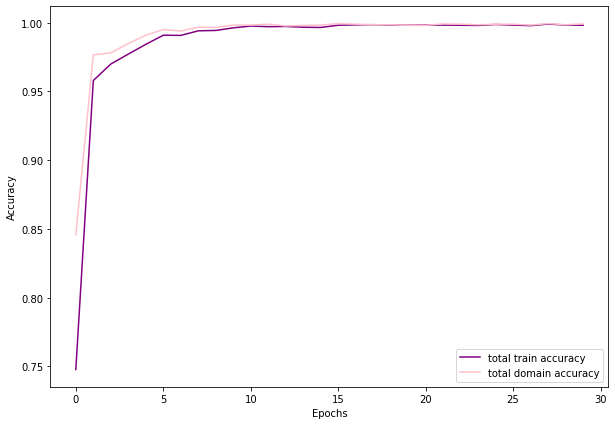

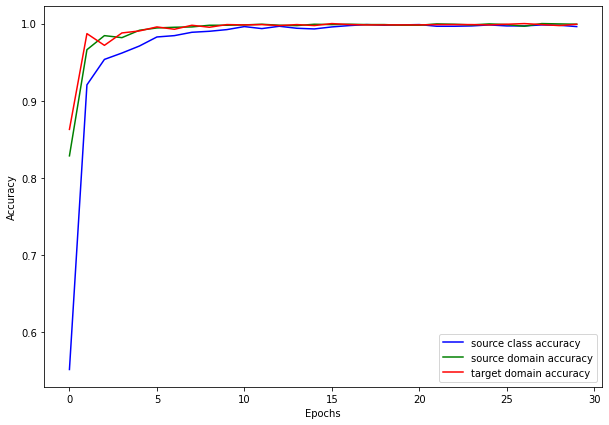

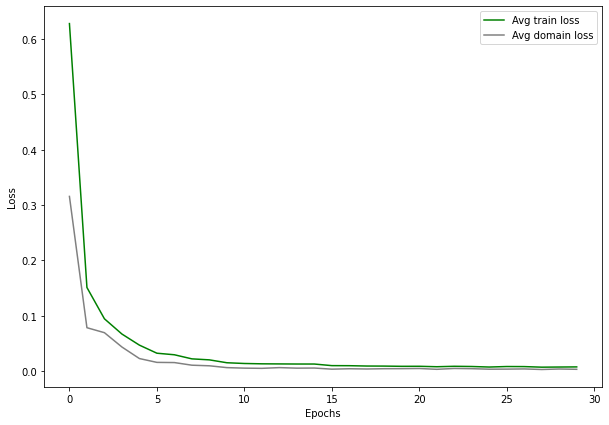

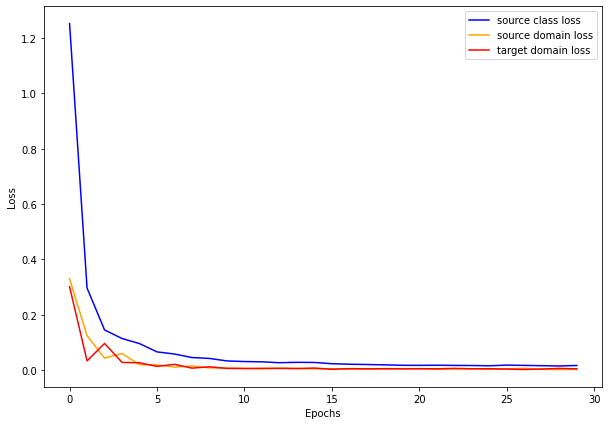

lr: 0.001_wd: 5e-05_gamma: 0.4480316841269075_alpha: 0.06655710093502458
Starting epoch 1/30, LR = [0.001]




Source class Loss: 0.8043, Train class Acc: 0.74
Target class Loss: 0.2115, Val class Acc: 0.16
Source domain Loss: 0.1406, Source domain Acc: 0.93
Target domain Loss: 0.0520, Target domain Acc: 0.97
Total train Loss: 0.3323, Total train Acc: 0.88
Total domain Loss: 0.0963, Total domain Acc: 0.95


Starting epoch 2/30, LR = [0.001]




Source class Loss: 0.1429, Train class Acc: 0.95
Target class Loss: 0.1299, Val class Acc: 0.16
Source domain Loss: 0.0007, Source domain Acc: 1.00
Target domain Loss: 0.0034, Target domain Acc: 1.00
Total train Loss: 0.0490, Total train Acc: 0.98
Total domain Loss: 0.0020, Total domain Acc: 1.00


Starting epoch 3/30, LR = [0.001]




Source class Loss: 0.0733, Train class Acc: 0.98
Target class Loss: 0.0541, Val class Acc: 0.16
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0005, Target domain Acc: 1.00
Total train Loss: 0.0247, Total train Acc: 0.99
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 4/30, LR = [0.001]




Source class Loss: 0.0528, Train class Acc: 0.98
Target class Loss: 0.0430, Val class Acc: 0.16
Source domain Loss: 0.0004, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0178, Total train Acc: 0.99
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 5/30, LR = [0.001]




Source class Loss: 0.0454, Train class Acc: 0.99
Target class Loss: 0.0474, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0003, Target domain Acc: 1.00
Total train Loss: 0.0153, Total train Acc: 1.00
Total domain Loss: 0.0002, Total domain Acc: 1.00


Starting epoch 6/30, LR = [0.001]




Source class Loss: 0.0278, Train class Acc: 0.99
Target class Loss: 0.0293, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0093, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.001]




Source class Loss: 0.0233, Train class Acc: 0.99
Target class Loss: 0.0182, Val class Acc: 0.17
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0078, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.001]




Source class Loss: 0.0206, Train class Acc: 1.00
Target class Loss: 0.0114, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0069, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.001]




Source class Loss: 0.0180, Train class Acc: 1.00
Target class Loss: 0.0160, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0060, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.001]




Source class Loss: 0.0139, Train class Acc: 1.00
Target class Loss: 0.0129, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0047, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 11/30, LR = [0.0004480316841269075]




Source class Loss: 0.0127, Train class Acc: 1.00
Target class Loss: 0.0088, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0043, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 12/30, LR = [0.0004480316841269075]




Source class Loss: 0.0131, Train class Acc: 1.00
Target class Loss: 0.0091, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0044, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 13/30, LR = [0.0004480316841269075]




Source class Loss: 0.0122, Train class Acc: 1.00
Target class Loss: 0.0066, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0041, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 14/30, LR = [0.0004480316841269075]




Source class Loss: 0.0106, Train class Acc: 1.00
Target class Loss: 0.0090, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0036, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 15/30, LR = [0.0004480316841269075]




Source class Loss: 0.0091, Train class Acc: 1.00
Target class Loss: 0.0081, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0031, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 16/30, LR = [0.0004480316841269075]




Source class Loss: 0.0090, Train class Acc: 1.00
Target class Loss: 0.0067, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0030, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 17/30, LR = [0.0004480316841269075]




Source class Loss: 0.0083, Train class Acc: 1.00
Target class Loss: 0.0048, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0028, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 18/30, LR = [0.0004480316841269075]




Source class Loss: 0.0078, Train class Acc: 1.00
Target class Loss: 0.0067, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0026, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 19/30, LR = [0.0004480316841269075]




Source class Loss: 0.0078, Train class Acc: 1.00
Target class Loss: 0.0090, Val class Acc: 0.17
Source domain Loss: 0.0003, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0027, Total train Acc: 1.00
Total domain Loss: 0.0002, Total domain Acc: 1.00


Starting epoch 20/30, LR = [0.0004480316841269075]




Source class Loss: 0.0077, Train class Acc: 1.00
Target class Loss: 0.0064, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0026, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 21/30, LR = [0.00020073238998159304]




Source class Loss: 0.0075, Train class Acc: 1.00
Target class Loss: 0.0070, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0025, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 22/30, LR = [0.00020073238998159304]




Source class Loss: 0.0073, Train class Acc: 1.00
Target class Loss: 0.0062, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0025, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 23/30, LR = [0.00020073238998159304]




Source class Loss: 0.0078, Train class Acc: 1.00
Target class Loss: 0.0092, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0026, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 24/30, LR = [0.00020073238998159304]




Source class Loss: 0.0067, Train class Acc: 1.00
Target class Loss: 0.0065, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0023, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 25/30, LR = [0.00020073238998159304]




Source class Loss: 0.0072, Train class Acc: 1.00
Target class Loss: 0.0051, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0024, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 26/30, LR = [0.00020073238998159304]




Source class Loss: 0.0058, Train class Acc: 1.00
Target class Loss: 0.0046, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0019, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 27/30, LR = [0.00020073238998159304]




Source class Loss: 0.0067, Train class Acc: 1.00
Target class Loss: 0.0052, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0022, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 28/30, LR = [0.00020073238998159304]




Source class Loss: 0.0066, Train class Acc: 1.00
Target class Loss: 0.0084, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0022, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 29/30, LR = [0.00020073238998159304]




Source class Loss: 0.0070, Train class Acc: 1.00
Target class Loss: 0.0085, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0023, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 30/30, LR = [0.00020073238998159304]




Source class Loss: 0.0058, Train class Acc: 1.00
Target class Loss: 0.0044, Val class Acc: 0.17
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0019, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00




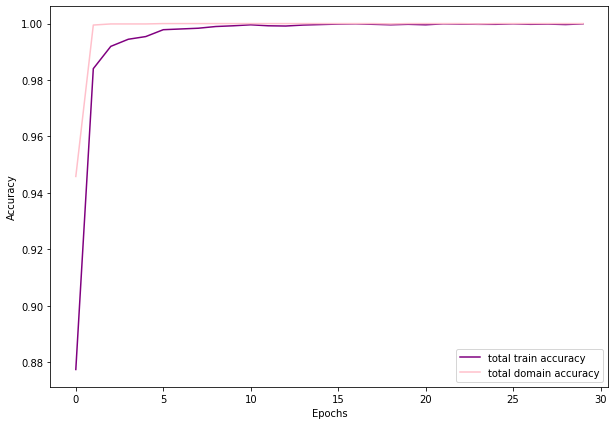

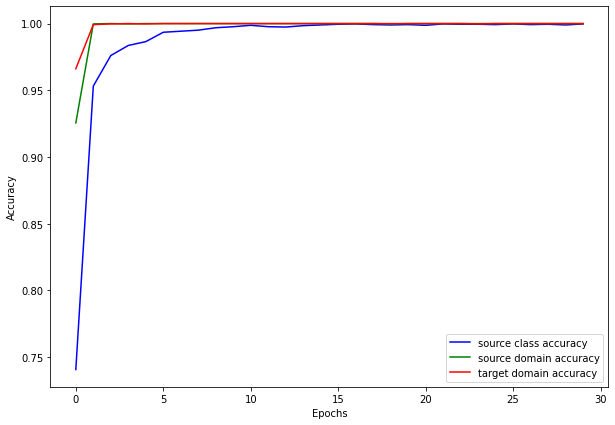

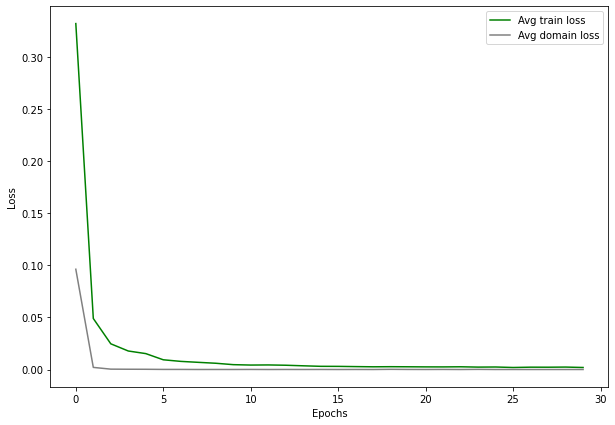

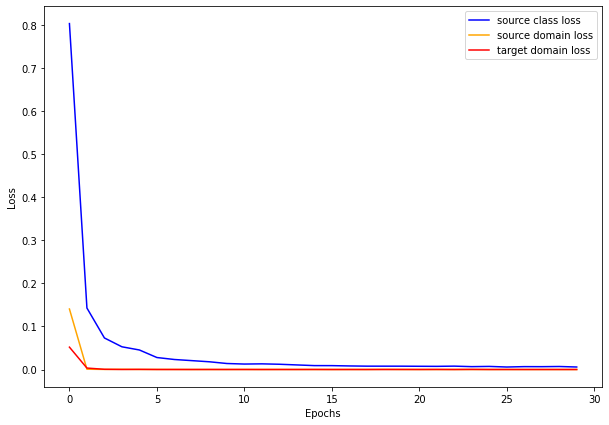

Iteration 2 / 8
lr: 0.01_wd: 4.9999999999999996e-06_gamma: 0.19366245338309276_alpha: 0.1249935351713108
Starting epoch 1/30, LR = [0.01]




Source class Loss: 0.9850, Train class Acc: 0.64
Target class Loss: 1.0091, Val class Acc: 0.21
Source domain Loss: 0.6830, Source domain Acc: 0.84
Target domain Loss: 0.5386, Target domain Acc: 0.81
Total train Loss: 0.7355, Total train Acc: 0.76
Total domain Loss: 0.6108, Total domain Acc: 0.83


Starting epoch 2/30, LR = [0.01]




Source class Loss: 7573894136.9726, Train class Acc: 0.36
Target class Loss: 68165038080.0000, Val class Acc: 0.12
Source domain Loss: 4132.8901, Source domain Acc: 0.71
Target domain Loss: 1595218475241.2891, Target domain Acc: 0.67
Total train Loss: 534264114946.3840, Total train Acc: 0.58
Total domain Loss: 797609239687.0896, Total domain Acc: 0.69


Starting epoch 3/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.21
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 0.43
Target domain Loss: nan, Target domain Acc: 0.57
Total train Loss: nan, Total train Acc: 0.40
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 4/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 5/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 6/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 7/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 8/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 9/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 10/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 11/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 12/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 13/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 14/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 15/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 16/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 17/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 18/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 19/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 20/30, LR = [0.0019366245338309277]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 21/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 22/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 23/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 24/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 25/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 26/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 27/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 28/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 29/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 30/30, LR = [0.0003750514585035858]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50




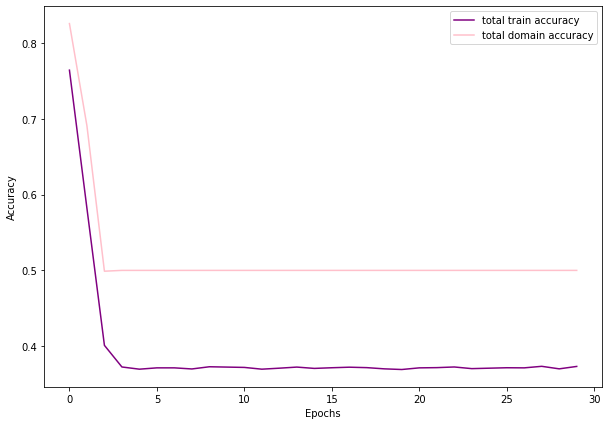

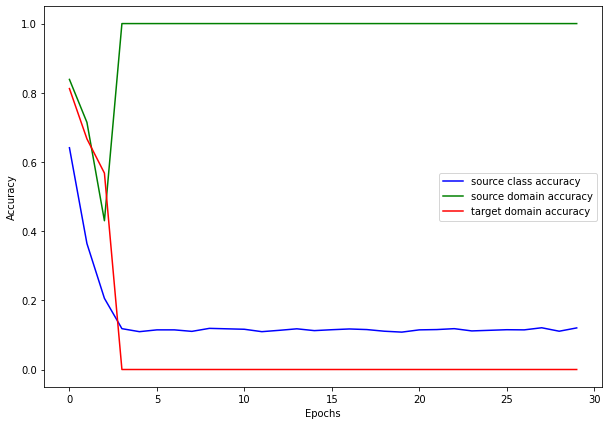

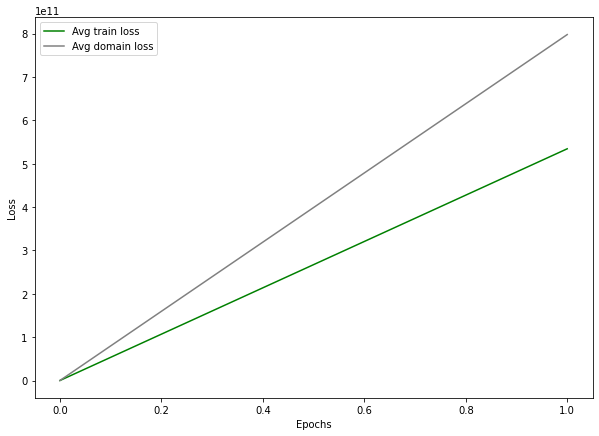

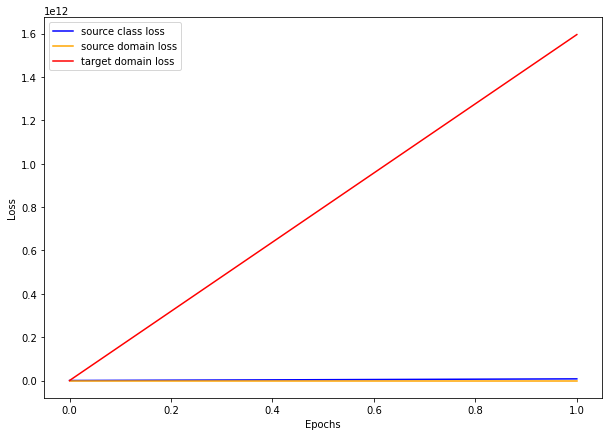

lr: 0.01_wd: 4.9999999999999996e-06_gamma: 0.19366245338309276_alpha: 0.1249935351713108
Starting epoch 1/30, LR = [0.01]




Source class Loss: 0.9984, Train class Acc: 0.68
Target class Loss: 0.8203, Val class Acc: 0.18
Source domain Loss: 0.2067, Source domain Acc: 0.95
Target domain Loss: 0.1077, Target domain Acc: 0.93
Total train Loss: 0.4376, Total train Acc: 0.85
Total domain Loss: 0.1572, Total domain Acc: 0.94


Starting epoch 2/30, LR = [0.01]




Source class Loss: 0.4585, Train class Acc: 0.83
Target class Loss: 0.3141, Val class Acc: 0.20
Source domain Loss: 0.0050, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.1545, Total train Acc: 0.94
Total domain Loss: 0.0025, Total domain Acc: 1.00


Starting epoch 3/30, LR = [0.01]




Source class Loss: 0.1961, Train class Acc: 0.93
Target class Loss: 0.1140, Val class Acc: 0.24
Source domain Loss: 0.0062, Source domain Acc: 1.00
Target domain Loss: 0.0072, Target domain Acc: 1.00
Total train Loss: 0.0698, Total train Acc: 0.98
Total domain Loss: 0.0067, Total domain Acc: 1.00


Starting epoch 4/30, LR = [0.01]




Source class Loss: 0.1051, Train class Acc: 0.96
Target class Loss: 0.1024, Val class Acc: 0.32
Source domain Loss: 0.0088, Source domain Acc: 1.00
Target domain Loss: 0.0035, Target domain Acc: 1.00
Total train Loss: 0.0391, Total train Acc: 0.99
Total domain Loss: 0.0061, Total domain Acc: 1.00


Starting epoch 5/30, LR = [0.01]




Source class Loss: 0.0531, Train class Acc: 0.98
Target class Loss: 0.0255, Val class Acc: 0.18
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0030, Target domain Acc: 1.00
Total train Loss: 0.0187, Total train Acc: 0.99
Total domain Loss: 0.0016, Total domain Acc: 1.00


Starting epoch 6/30, LR = [0.01]




Source class Loss: 0.0193, Train class Acc: 1.00
Target class Loss: 0.0043, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0064, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.01]




Source class Loss: 0.0155, Train class Acc: 1.00
Target class Loss: 0.0073, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0052, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.01]




Source class Loss: 0.0086, Train class Acc: 1.00
Target class Loss: 0.0060, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0029, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.01]




Source class Loss: 0.0039, Train class Acc: 1.00
Target class Loss: 0.0038, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0013, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.01]




Source class Loss: 0.0026, Train class Acc: 1.00
Target class Loss: 0.0012, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0009, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 11/30, LR = [0.0019366245338309277]




Source class Loss: 0.0021, Train class Acc: 1.00
Target class Loss: 0.0003, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0007, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 12/30, LR = [0.0019366245338309277]




Source class Loss: 0.0013, Train class Acc: 1.00
Target class Loss: 0.0008, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0004, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 13/30, LR = [0.0019366245338309277]




Source class Loss: 0.0019, Train class Acc: 1.00
Target class Loss: 0.0022, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 14/30, LR = [0.0019366245338309277]




Source class Loss: 0.0008, Train class Acc: 1.00
Target class Loss: 0.0006, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0003, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 15/30, LR = [0.0019366245338309277]




Source class Loss: 0.0008, Train class Acc: 1.00
Target class Loss: 0.0005, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0003, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 16/30, LR = [0.0019366245338309277]




Source class Loss: 0.0007, Train class Acc: 1.00
Target class Loss: 0.0001, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 17/30, LR = [0.0019366245338309277]




Source class Loss: 0.0007, Train class Acc: 1.00
Target class Loss: 0.0001, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 18/30, LR = [0.0019366245338309277]




Source class Loss: 0.0009, Train class Acc: 1.00
Target class Loss: 0.0005, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0003, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 19/30, LR = [0.0019366245338309277]




Source class Loss: 0.0006, Train class Acc: 1.00
Target class Loss: 0.0010, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 20/30, LR = [0.0019366245338309277]




Source class Loss: 0.0006, Train class Acc: 1.00
Target class Loss: 0.0005, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 21/30, LR = [0.0003750514585035858]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0010, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 22/30, LR = [0.0003750514585035858]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0008, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 23/30, LR = [0.0003750514585035858]




Source class Loss: 0.0011, Train class Acc: 1.00
Target class Loss: 0.0003, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0004, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 24/30, LR = [0.0003750514585035858]




Source class Loss: 0.0006, Train class Acc: 1.00
Target class Loss: 0.0005, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 25/30, LR = [0.0003750514585035858]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0006, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 26/30, LR = [0.0003750514585035858]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0003, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 27/30, LR = [0.0003750514585035858]




Source class Loss: 0.0011, Train class Acc: 1.00
Target class Loss: 0.0102, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0004, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 28/30, LR = [0.0003750514585035858]




Source class Loss: 0.0007, Train class Acc: 1.00
Target class Loss: 0.0003, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 29/30, LR = [0.0003750514585035858]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0005, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 30/30, LR = [0.0003750514585035858]




Source class Loss: 0.0007, Train class Acc: 1.00
Target class Loss: 0.0002, Val class Acc: 0.16
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00




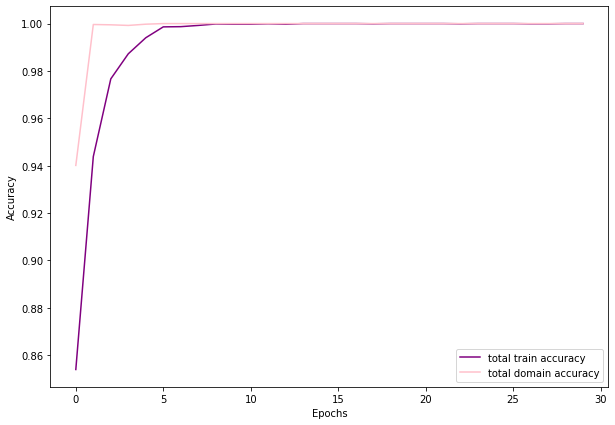

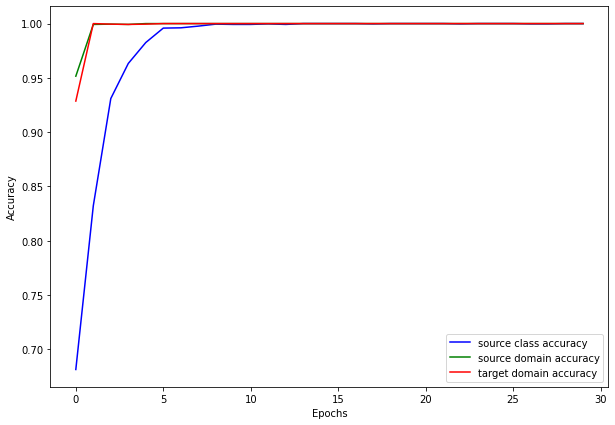

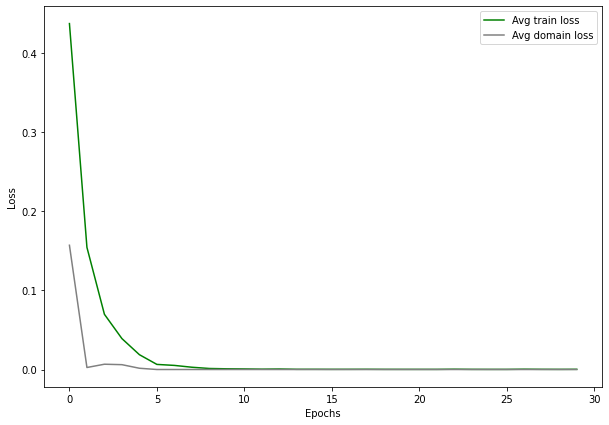

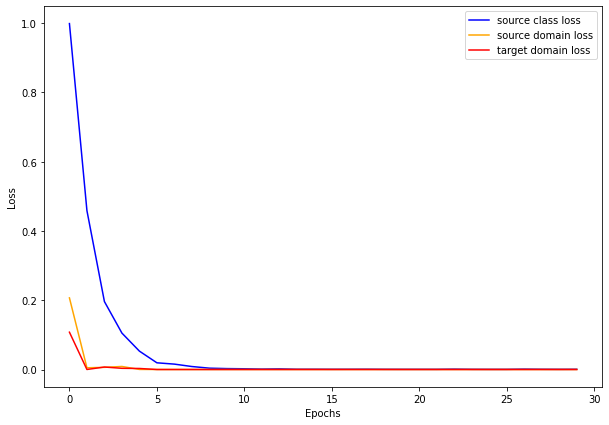

Iteration 3 / 8
lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.39411603817326646_alpha: 0.17806346402602843
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.6573, Train class Acc: 0.39
Target class Loss: 1.3631, Val class Acc: 0.19
Source domain Loss: 0.5896, Source domain Acc: 0.68
Target domain Loss: 0.3980, Target domain Acc: 0.81
Total train Loss: 0.8816, Total train Acc: 0.63
Total domain Loss: 0.4938, Total domain Acc: 0.74


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.1040, Train class Acc: 0.63
Target class Loss: 0.9684, Val class Acc: 0.23
Source domain Loss: 0.2533, Source domain Acc: 0.91
Target domain Loss: 0.1194, Target domain Acc: 0.96
Total train Loss: 0.4922, Total train Acc: 0.83
Total domain Loss: 0.1863, Total domain Acc: 0.93


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.7616, Train class Acc: 0.75
Target class Loss: 0.6477, Val class Acc: 0.21
Source domain Loss: 0.1195, Source domain Acc: 0.96
Target domain Loss: 0.1079, Target domain Acc: 0.96
Total train Loss: 0.3297, Total train Acc: 0.89
Total domain Loss: 0.1137, Total domain Acc: 0.96


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.5584, Train class Acc: 0.83
Target class Loss: 0.5303, Val class Acc: 0.19
Source domain Loss: 0.0826, Source domain Acc: 0.97
Target domain Loss: 0.0750, Target domain Acc: 0.97
Total train Loss: 0.2387, Total train Acc: 0.92
Total domain Loss: 0.0788, Total domain Acc: 0.97


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.4445, Train class Acc: 0.87
Target class Loss: 0.4153, Val class Acc: 0.18
Source domain Loss: 0.0756, Source domain Acc: 0.98
Target domain Loss: 0.0641, Target domain Acc: 0.98
Total train Loss: 0.1947, Total train Acc: 0.94
Total domain Loss: 0.0699, Total domain Acc: 0.98


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.3443, Train class Acc: 0.91
Target class Loss: 0.2980, Val class Acc: 0.17
Source domain Loss: 0.0659, Source domain Acc: 0.98
Target domain Loss: 0.0538, Target domain Acc: 0.98
Total train Loss: 0.1547, Total train Acc: 0.96
Total domain Loss: 0.0599, Total domain Acc: 0.98


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.2984, Train class Acc: 0.92
Target class Loss: 0.3321, Val class Acc: 0.17
Source domain Loss: 0.0550, Source domain Acc: 0.98
Target domain Loss: 0.0534, Target domain Acc: 0.98
Total train Loss: 0.1356, Total train Acc: 0.96
Total domain Loss: 0.0542, Total domain Acc: 0.98


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.2546, Train class Acc: 0.93
Target class Loss: 0.2227, Val class Acc: 0.16
Source domain Loss: 0.0557, Source domain Acc: 0.98
Target domain Loss: 0.0455, Target domain Acc: 0.98
Total train Loss: 0.1186, Total train Acc: 0.97
Total domain Loss: 0.0506, Total domain Acc: 0.98


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2423, Train class Acc: 0.93
Target class Loss: 0.2355, Val class Acc: 0.16
Source domain Loss: 0.0523, Source domain Acc: 0.98
Target domain Loss: 0.0417, Target domain Acc: 0.98
Total train Loss: 0.1121, Total train Acc: 0.97
Total domain Loss: 0.0470, Total domain Acc: 0.98


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2228, Train class Acc: 0.93
Target class Loss: 0.2196, Val class Acc: 0.16
Source domain Loss: 0.0501, Source domain Acc: 0.98
Target domain Loss: 0.0451, Target domain Acc: 0.98
Total train Loss: 0.1060, Total train Acc: 0.97
Total domain Loss: 0.0476, Total domain Acc: 0.98


Starting epoch 11/30, LR = [3.941160381732665e-05]




Source class Loss: 0.2030, Train class Acc: 0.94
Target class Loss: 0.1598, Val class Acc: 0.16
Source domain Loss: 0.0479, Source domain Acc: 0.98
Target domain Loss: 0.0380, Target domain Acc: 0.99
Total train Loss: 0.0963, Total train Acc: 0.97
Total domain Loss: 0.0430, Total domain Acc: 0.99


Starting epoch 12/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1968, Train class Acc: 0.94
Target class Loss: 0.1578, Val class Acc: 0.16
Source domain Loss: 0.0506, Source domain Acc: 0.98
Target domain Loss: 0.0430, Target domain Acc: 0.98
Total train Loss: 0.0968, Total train Acc: 0.97
Total domain Loss: 0.0468, Total domain Acc: 0.98


Starting epoch 13/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1936, Train class Acc: 0.94
Target class Loss: 0.1771, Val class Acc: 0.16
Source domain Loss: 0.0425, Source domain Acc: 0.99
Target domain Loss: 0.0407, Target domain Acc: 0.99
Total train Loss: 0.0923, Total train Acc: 0.97
Total domain Loss: 0.0416, Total domain Acc: 0.99


Starting epoch 14/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1928, Train class Acc: 0.94
Target class Loss: 0.1946, Val class Acc: 0.16
Source domain Loss: 0.0417, Source domain Acc: 0.99
Target domain Loss: 0.0397, Target domain Acc: 0.98
Total train Loss: 0.0914, Total train Acc: 0.97
Total domain Loss: 0.0407, Total domain Acc: 0.99


Starting epoch 15/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1846, Train class Acc: 0.95
Target class Loss: 0.1479, Val class Acc: 0.16
Source domain Loss: 0.0437, Source domain Acc: 0.98
Target domain Loss: 0.0429, Target domain Acc: 0.99
Total train Loss: 0.0904, Total train Acc: 0.97
Total domain Loss: 0.0433, Total domain Acc: 0.98


Starting epoch 16/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1807, Train class Acc: 0.95
Target class Loss: 0.2081, Val class Acc: 0.16
Source domain Loss: 0.0404, Source domain Acc: 0.99
Target domain Loss: 0.0416, Target domain Acc: 0.98
Total train Loss: 0.0876, Total train Acc: 0.97
Total domain Loss: 0.0410, Total domain Acc: 0.99


Starting epoch 17/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1833, Train class Acc: 0.95
Target class Loss: 0.1666, Val class Acc: 0.16
Source domain Loss: 0.0439, Source domain Acc: 0.98
Target domain Loss: 0.0367, Target domain Acc: 0.98
Total train Loss: 0.0879, Total train Acc: 0.97
Total domain Loss: 0.0403, Total domain Acc: 0.98


Starting epoch 18/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1690, Train class Acc: 0.95
Target class Loss: 0.1669, Val class Acc: 0.16
Source domain Loss: 0.0446, Source domain Acc: 0.98
Target domain Loss: 0.0351, Target domain Acc: 0.99
Total train Loss: 0.0829, Total train Acc: 0.97
Total domain Loss: 0.0398, Total domain Acc: 0.98


Starting epoch 19/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1691, Train class Acc: 0.95
Target class Loss: 0.1420, Val class Acc: 0.16
Source domain Loss: 0.0469, Source domain Acc: 0.98
Target domain Loss: 0.0325, Target domain Acc: 0.99
Total train Loss: 0.0828, Total train Acc: 0.98
Total domain Loss: 0.0397, Total domain Acc: 0.99


Starting epoch 20/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1598, Train class Acc: 0.95
Target class Loss: 0.1610, Val class Acc: 0.16
Source domain Loss: 0.0390, Source domain Acc: 0.99
Target domain Loss: 0.0384, Target domain Acc: 0.99
Total train Loss: 0.0791, Total train Acc: 0.97
Total domain Loss: 0.0387, Total domain Acc: 0.99


Starting epoch 21/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1638, Train class Acc: 0.95
Target class Loss: 0.1384, Val class Acc: 0.16
Source domain Loss: 0.0384, Source domain Acc: 0.99
Target domain Loss: 0.0385, Target domain Acc: 0.99
Total train Loss: 0.0802, Total train Acc: 0.98
Total domain Loss: 0.0385, Total domain Acc: 0.99


Starting epoch 22/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1620, Train class Acc: 0.95
Target class Loss: 0.1575, Val class Acc: 0.16
Source domain Loss: 0.0395, Source domain Acc: 0.99
Target domain Loss: 0.0342, Target domain Acc: 0.98
Total train Loss: 0.0786, Total train Acc: 0.98
Total domain Loss: 0.0369, Total domain Acc: 0.99


Starting epoch 23/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1598, Train class Acc: 0.95
Target class Loss: 0.1746, Val class Acc: 0.17
Source domain Loss: 0.0412, Source domain Acc: 0.98
Target domain Loss: 0.0371, Target domain Acc: 0.99
Total train Loss: 0.0794, Total train Acc: 0.97
Total domain Loss: 0.0391, Total domain Acc: 0.99


Starting epoch 24/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1561, Train class Acc: 0.95
Target class Loss: 0.1332, Val class Acc: 0.16
Source domain Loss: 0.0381, Source domain Acc: 0.99
Target domain Loss: 0.0352, Target domain Acc: 0.99
Total train Loss: 0.0765, Total train Acc: 0.98
Total domain Loss: 0.0366, Total domain Acc: 0.99


Starting epoch 25/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1666, Train class Acc: 0.95
Target class Loss: 0.1989, Val class Acc: 0.16
Source domain Loss: 0.0395, Source domain Acc: 0.99
Target domain Loss: 0.0323, Target domain Acc: 0.99
Total train Loss: 0.0795, Total train Acc: 0.98
Total domain Loss: 0.0359, Total domain Acc: 0.99


Starting epoch 26/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1502, Train class Acc: 0.96
Target class Loss: 0.1381, Val class Acc: 0.16
Source domain Loss: 0.0340, Source domain Acc: 0.99
Target domain Loss: 0.0335, Target domain Acc: 0.99
Total train Loss: 0.0726, Total train Acc: 0.98
Total domain Loss: 0.0338, Total domain Acc: 0.99


Starting epoch 27/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1557, Train class Acc: 0.95
Target class Loss: 0.1688, Val class Acc: 0.16
Source domain Loss: 0.0325, Source domain Acc: 0.99
Target domain Loss: 0.0358, Target domain Acc: 0.99
Total train Loss: 0.0747, Total train Acc: 0.98
Total domain Loss: 0.0342, Total domain Acc: 0.99


Starting epoch 28/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1572, Train class Acc: 0.96
Target class Loss: 0.1675, Val class Acc: 0.16
Source domain Loss: 0.0325, Source domain Acc: 0.99
Target domain Loss: 0.0347, Target domain Acc: 0.99
Total train Loss: 0.0748, Total train Acc: 0.98
Total domain Loss: 0.0336, Total domain Acc: 0.99


Starting epoch 29/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1596, Train class Acc: 0.95
Target class Loss: 0.1816, Val class Acc: 0.16
Source domain Loss: 0.0337, Source domain Acc: 0.99
Target domain Loss: 0.0327, Target domain Acc: 0.99
Total train Loss: 0.0753, Total train Acc: 0.98
Total domain Loss: 0.0332, Total domain Acc: 0.99


Starting epoch 30/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1606, Train class Acc: 0.95
Target class Loss: 0.1933, Val class Acc: 0.16
Source domain Loss: 0.0301, Source domain Acc: 0.99
Target domain Loss: 0.0355, Target domain Acc: 0.99
Total train Loss: 0.0754, Total train Acc: 0.98
Total domain Loss: 0.0328, Total domain Acc: 0.99




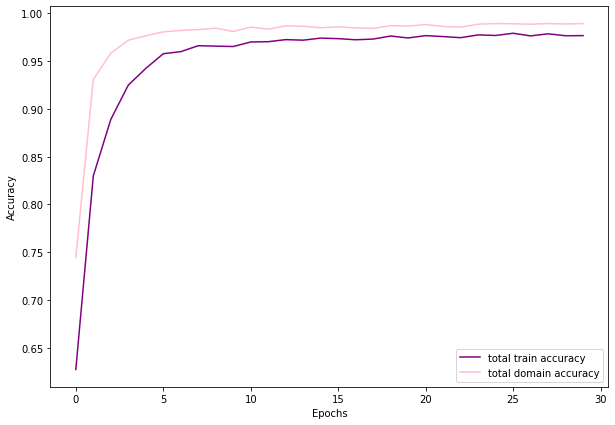

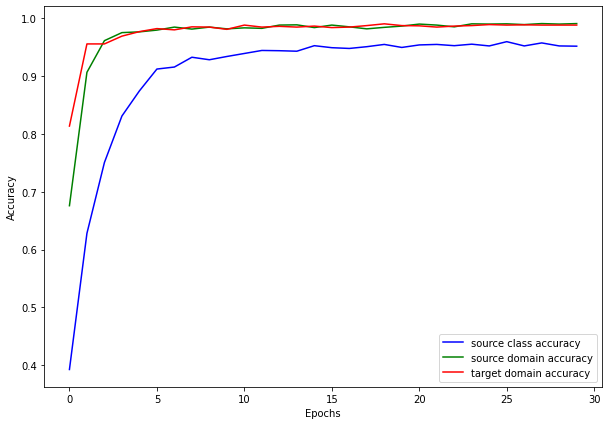

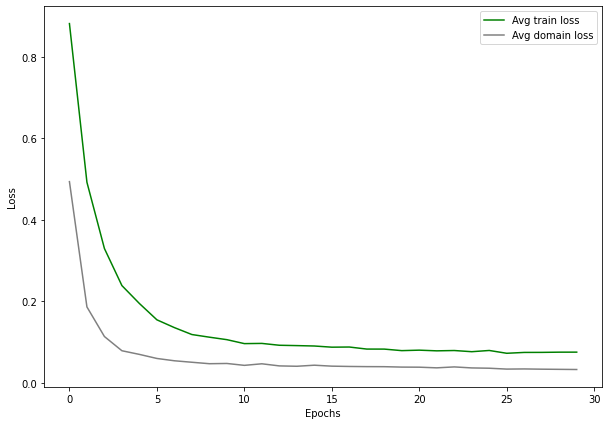

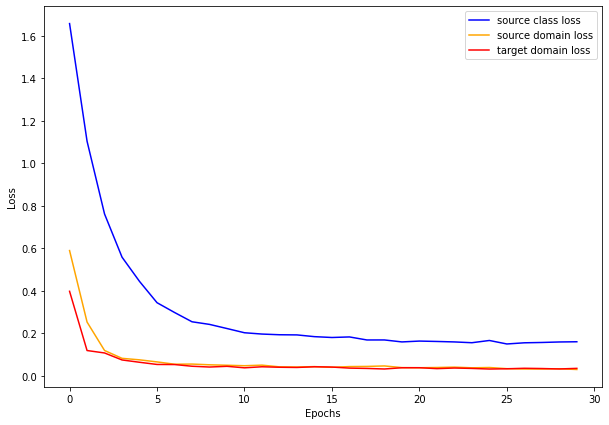

lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.39411603817326646_alpha: 0.17806346402602843
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.7262, Train class Acc: 0.38
Target class Loss: 1.1869, Val class Acc: 0.24
Source domain Loss: 0.5344, Source domain Acc: 0.71
Target domain Loss: 0.0993, Target domain Acc: 1.00
Total train Loss: 0.7866, Total train Acc: 0.70
Total domain Loss: 0.3169, Total domain Acc: 0.85


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 0.8033, Train class Acc: 0.75
Target class Loss: 0.6312, Val class Acc: 0.32
Source domain Loss: 0.0276, Source domain Acc: 1.00
Target domain Loss: 0.0073, Target domain Acc: 1.00
Total train Loss: 0.2794, Total train Acc: 0.92
Total domain Loss: 0.0175, Total domain Acc: 1.00


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.4902, Train class Acc: 0.87
Target class Loss: 0.4525, Val class Acc: 0.30
Source domain Loss: 0.0079, Source domain Acc: 1.00
Target domain Loss: 0.0048, Target domain Acc: 1.00
Total train Loss: 0.1676, Total train Acc: 0.96
Total domain Loss: 0.0064, Total domain Acc: 1.00


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.3427, Train class Acc: 0.91
Target class Loss: 0.2809, Val class Acc: 0.28
Source domain Loss: 0.0056, Source domain Acc: 1.00
Target domain Loss: 0.0033, Target domain Acc: 1.00
Total train Loss: 0.1172, Total train Acc: 0.97
Total domain Loss: 0.0044, Total domain Acc: 1.00


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.2761, Train class Acc: 0.93
Target class Loss: 0.2908, Val class Acc: 0.27
Source domain Loss: 0.0045, Source domain Acc: 1.00
Target domain Loss: 0.0031, Target domain Acc: 1.00
Total train Loss: 0.0946, Total train Acc: 0.98
Total domain Loss: 0.0038, Total domain Acc: 1.00


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.2238, Train class Acc: 0.94
Target class Loss: 0.2033, Val class Acc: 0.27
Source domain Loss: 0.0031, Source domain Acc: 1.00
Target domain Loss: 0.0027, Target domain Acc: 1.00
Total train Loss: 0.0765, Total train Acc: 0.98
Total domain Loss: 0.0029, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.1939, Train class Acc: 0.95
Target class Loss: 0.2099, Val class Acc: 0.27
Source domain Loss: 0.0029, Source domain Acc: 1.00
Target domain Loss: 0.0020, Target domain Acc: 1.00
Total train Loss: 0.0663, Total train Acc: 0.98
Total domain Loss: 0.0025, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.1714, Train class Acc: 0.95
Target class Loss: 0.1631, Val class Acc: 0.26
Source domain Loss: 0.0023, Source domain Acc: 1.00
Target domain Loss: 0.0018, Target domain Acc: 1.00
Total train Loss: 0.0585, Total train Acc: 0.98
Total domain Loss: 0.0021, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.1646, Train class Acc: 0.95
Target class Loss: 0.1748, Val class Acc: 0.26
Source domain Loss: 0.0023, Source domain Acc: 1.00
Target domain Loss: 0.0014, Target domain Acc: 1.00
Total train Loss: 0.0561, Total train Acc: 0.98
Total domain Loss: 0.0018, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.1426, Train class Acc: 0.96
Target class Loss: 0.1240, Val class Acc: 0.26
Source domain Loss: 0.0015, Source domain Acc: 1.00
Target domain Loss: 0.0016, Target domain Acc: 1.00
Total train Loss: 0.0486, Total train Acc: 0.99
Total domain Loss: 0.0015, Total domain Acc: 1.00


Starting epoch 11/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1323, Train class Acc: 0.96
Target class Loss: 0.1455, Val class Acc: 0.26
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0010, Target domain Acc: 1.00
Total train Loss: 0.0451, Total train Acc: 0.99
Total domain Loss: 0.0014, Total domain Acc: 1.00


Starting epoch 12/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1384, Train class Acc: 0.96
Target class Loss: 0.1244, Val class Acc: 0.26
Source domain Loss: 0.0020, Source domain Acc: 1.00
Target domain Loss: 0.0013, Target domain Acc: 1.00
Total train Loss: 0.0472, Total train Acc: 0.99
Total domain Loss: 0.0016, Total domain Acc: 1.00


Starting epoch 13/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1345, Train class Acc: 0.96
Target class Loss: 0.1598, Val class Acc: 0.26
Source domain Loss: 0.0014, Source domain Acc: 1.00
Target domain Loss: 0.0010, Target domain Acc: 1.00
Total train Loss: 0.0456, Total train Acc: 0.99
Total domain Loss: 0.0012, Total domain Acc: 1.00


Starting epoch 14/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1260, Train class Acc: 0.97
Target class Loss: 0.1247, Val class Acc: 0.26
Source domain Loss: 0.0012, Source domain Acc: 1.00
Target domain Loss: 0.0013, Target domain Acc: 1.00
Total train Loss: 0.0428, Total train Acc: 0.99
Total domain Loss: 0.0013, Total domain Acc: 1.00


Starting epoch 15/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1177, Train class Acc: 0.97
Target class Loss: 0.1188, Val class Acc: 0.26
Source domain Loss: 0.0013, Source domain Acc: 1.00
Target domain Loss: 0.0012, Target domain Acc: 1.00
Total train Loss: 0.0400, Total train Acc: 0.99
Total domain Loss: 0.0012, Total domain Acc: 1.00


Starting epoch 16/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1238, Train class Acc: 0.96
Target class Loss: 0.1182, Val class Acc: 0.26
Source domain Loss: 0.0019, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0423, Total train Acc: 0.99
Total domain Loss: 0.0015, Total domain Acc: 1.00


Starting epoch 17/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1160, Train class Acc: 0.97
Target class Loss: 0.1342, Val class Acc: 0.26
Source domain Loss: 0.0014, Source domain Acc: 1.00
Target domain Loss: 0.0012, Target domain Acc: 1.00
Total train Loss: 0.0395, Total train Acc: 0.99
Total domain Loss: 0.0013, Total domain Acc: 1.00


Starting epoch 18/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1153, Train class Acc: 0.97
Target class Loss: 0.1117, Val class Acc: 0.26
Source domain Loss: 0.0015, Source domain Acc: 1.00
Target domain Loss: 0.0010, Target domain Acc: 1.00
Total train Loss: 0.0392, Total train Acc: 0.99
Total domain Loss: 0.0012, Total domain Acc: 1.00


Starting epoch 19/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1180, Train class Acc: 0.97
Target class Loss: 0.1253, Val class Acc: 0.26
Source domain Loss: 0.0013, Source domain Acc: 1.00
Target domain Loss: 0.0012, Target domain Acc: 1.00
Total train Loss: 0.0401, Total train Acc: 0.99
Total domain Loss: 0.0012, Total domain Acc: 1.00


Starting epoch 20/30, LR = [3.941160381732665e-05]




Source class Loss: 0.1039, Train class Acc: 0.97
Target class Loss: 0.0925, Val class Acc: 0.26
Source domain Loss: 0.0010, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0353, Total train Acc: 0.99
Total domain Loss: 0.0011, Total domain Acc: 1.00


Starting epoch 21/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1016, Train class Acc: 0.98
Target class Loss: 0.1089, Val class Acc: 0.26
Source domain Loss: 0.0015, Source domain Acc: 1.00
Target domain Loss: 0.0015, Target domain Acc: 1.00
Total train Loss: 0.0349, Total train Acc: 0.99
Total domain Loss: 0.0015, Total domain Acc: 1.00


Starting epoch 22/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1030, Train class Acc: 0.97
Target class Loss: 0.1306, Val class Acc: 0.26
Source domain Loss: 0.0009, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0350, Total train Acc: 0.99
Total domain Loss: 0.0010, Total domain Acc: 1.00


Starting epoch 23/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1033, Train class Acc: 0.97
Target class Loss: 0.1048, Val class Acc: 0.26
Source domain Loss: 0.0010, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0351, Total train Acc: 0.99
Total domain Loss: 0.0011, Total domain Acc: 1.00


Starting epoch 24/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1017, Train class Acc: 0.97
Target class Loss: 0.0924, Val class Acc: 0.26
Source domain Loss: 0.0011, Source domain Acc: 1.00
Target domain Loss: 0.0010, Target domain Acc: 1.00
Total train Loss: 0.0346, Total train Acc: 0.99
Total domain Loss: 0.0010, Total domain Acc: 1.00


Starting epoch 25/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1047, Train class Acc: 0.97
Target class Loss: 0.1223, Val class Acc: 0.26
Source domain Loss: 0.0008, Source domain Acc: 1.00
Target domain Loss: 0.0012, Target domain Acc: 1.00
Total train Loss: 0.0356, Total train Acc: 0.99
Total domain Loss: 0.0010, Total domain Acc: 1.00


Starting epoch 26/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1080, Train class Acc: 0.97
Target class Loss: 0.1055, Val class Acc: 0.26
Source domain Loss: 0.0010, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0367, Total train Acc: 0.99
Total domain Loss: 0.0011, Total domain Acc: 1.00


Starting epoch 27/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1025, Train class Acc: 0.97
Target class Loss: 0.1072, Val class Acc: 0.26
Source domain Loss: 0.0011, Source domain Acc: 1.00
Target domain Loss: 0.0009, Target domain Acc: 1.00
Total train Loss: 0.0348, Total train Acc: 0.99
Total domain Loss: 0.0010, Total domain Acc: 1.00


Starting epoch 28/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1025, Train class Acc: 0.97
Target class Loss: 0.0724, Val class Acc: 0.26
Source domain Loss: 0.0009, Source domain Acc: 1.00
Target domain Loss: 0.0008, Target domain Acc: 1.00
Total train Loss: 0.0347, Total train Acc: 0.99
Total domain Loss: 0.0009, Total domain Acc: 1.00


Starting epoch 29/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1056, Train class Acc: 0.97
Target class Loss: 0.0914, Val class Acc: 0.26
Source domain Loss: 0.0009, Source domain Acc: 1.00
Target domain Loss: 0.0009, Target domain Acc: 1.00
Total train Loss: 0.0358, Total train Acc: 0.99
Total domain Loss: 0.0009, Total domain Acc: 1.00


Starting epoch 30/30, LR = [1.5532745154539163e-05]




Source class Loss: 0.1028, Train class Acc: 0.97
Target class Loss: 0.1092, Val class Acc: 0.26
Source domain Loss: 0.0012, Source domain Acc: 1.00
Target domain Loss: 0.0008, Target domain Acc: 1.00
Total train Loss: 0.0349, Total train Acc: 0.99
Total domain Loss: 0.0010, Total domain Acc: 1.00




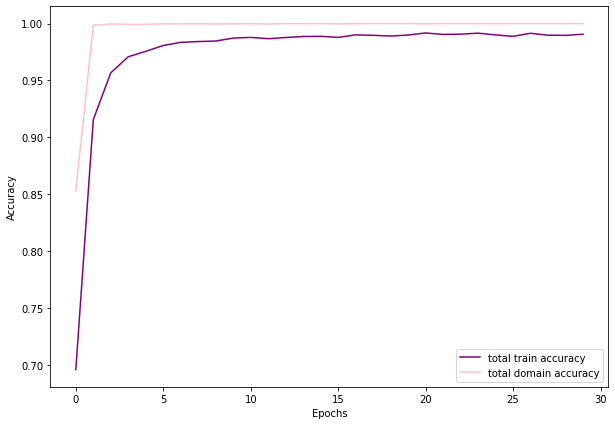

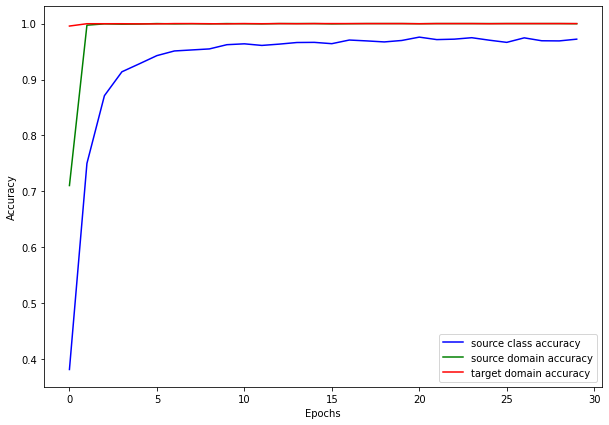

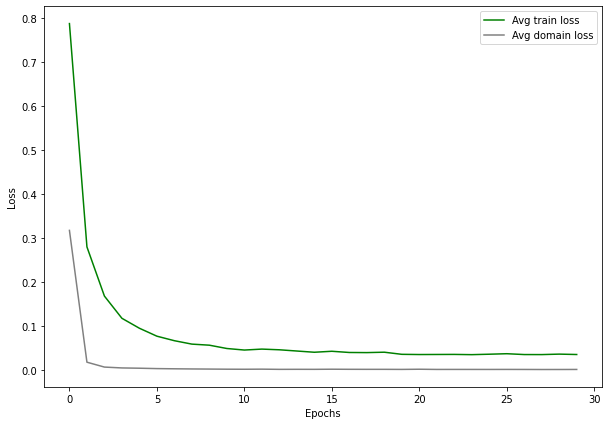

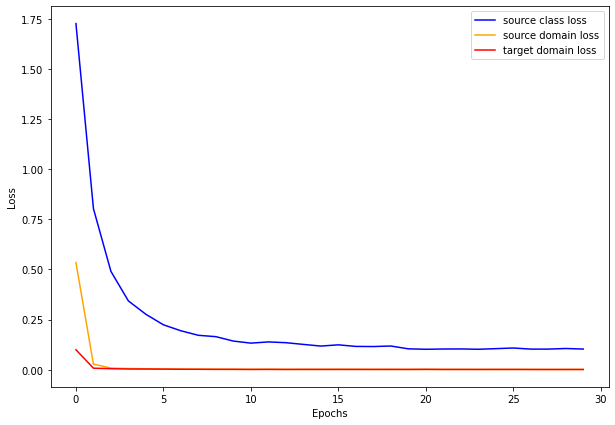

Iteration 4 / 8
lr: 0.001_wd: 0.0005_gamma: 0.46399843688832176_alpha: 0.28765090931183734
Starting epoch 1/30, LR = [0.001]




Source class Loss: 1.1631, Train class Acc: 0.58
Target class Loss: 0.4557, Val class Acc: 0.18
Source domain Loss: 0.3187, Source domain Acc: 0.85
Target domain Loss: 0.2439, Target domain Acc: 0.90
Total train Loss: 0.5752, Total train Acc: 0.78
Total domain Loss: 0.2813, Total domain Acc: 0.87


Starting epoch 2/30, LR = [0.001]




Source class Loss: 0.2763, Train class Acc: 0.92
Target class Loss: 0.1994, Val class Acc: 0.20
Source domain Loss: 0.1369, Source domain Acc: 0.97
Target domain Loss: 0.0592, Target domain Acc: 0.98
Total train Loss: 0.1575, Total train Acc: 0.95
Total domain Loss: 0.0981, Total domain Acc: 0.97


Starting epoch 3/30, LR = [0.001]




Source class Loss: 0.1448, Train class Acc: 0.95
Target class Loss: 0.1229, Val class Acc: 0.12
Source domain Loss: 0.0405, Source domain Acc: 0.99
Target domain Loss: 0.0650, Target domain Acc: 0.98
Total train Loss: 0.0834, Total train Acc: 0.97
Total domain Loss: 0.0528, Total domain Acc: 0.98


Starting epoch 4/30, LR = [0.001]




Source class Loss: 0.1035, Train class Acc: 0.96
Target class Loss: 0.0985, Val class Acc: 0.16
Source domain Loss: 0.0550, Source domain Acc: 0.98
Target domain Loss: 0.0228, Target domain Acc: 0.99
Total train Loss: 0.0604, Total train Acc: 0.98
Total domain Loss: 0.0389, Total domain Acc: 0.99


Starting epoch 5/30, LR = [0.001]




Source class Loss: 0.0784, Train class Acc: 0.98
Target class Loss: 0.0748, Val class Acc: 0.15
Source domain Loss: 0.0167, Source domain Acc: 0.99
Target domain Loss: 0.0331, Target domain Acc: 0.99
Total train Loss: 0.0427, Total train Acc: 0.99
Total domain Loss: 0.0249, Total domain Acc: 0.99


Starting epoch 6/30, LR = [0.001]




Source class Loss: 0.0637, Train class Acc: 0.98
Target class Loss: 0.0485, Val class Acc: 0.16
Source domain Loss: 0.0216, Source domain Acc: 0.99
Target domain Loss: 0.0088, Target domain Acc: 1.00
Total train Loss: 0.0314, Total train Acc: 0.99
Total domain Loss: 0.0152, Total domain Acc: 0.99


Starting epoch 7/30, LR = [0.001]




Source class Loss: 0.0559, Train class Acc: 0.98
Target class Loss: 0.0736, Val class Acc: 0.16
Source domain Loss: 0.0095, Source domain Acc: 1.00
Target domain Loss: 0.0225, Target domain Acc: 0.99
Total train Loss: 0.0293, Total train Acc: 0.99
Total domain Loss: 0.0160, Total domain Acc: 0.99


Starting epoch 8/30, LR = [0.001]




Source class Loss: 0.0421, Train class Acc: 0.99
Target class Loss: 0.0469, Val class Acc: 0.17
Source domain Loss: 0.0111, Source domain Acc: 1.00
Target domain Loss: 0.0054, Target domain Acc: 1.00
Total train Loss: 0.0195, Total train Acc: 1.00
Total domain Loss: 0.0082, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.001]




Source class Loss: 0.0395, Train class Acc: 0.99
Target class Loss: 0.0380, Val class Acc: 0.18
Source domain Loss: 0.0074, Source domain Acc: 1.00
Target domain Loss: 0.0136, Target domain Acc: 0.99
Total train Loss: 0.0202, Total train Acc: 0.99
Total domain Loss: 0.0105, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.001]




Source class Loss: 0.0366, Train class Acc: 0.99
Target class Loss: 0.0372, Val class Acc: 0.18
Source domain Loss: 0.0120, Source domain Acc: 0.99
Target domain Loss: 0.0066, Target domain Acc: 1.00
Total train Loss: 0.0184, Total train Acc: 0.99
Total domain Loss: 0.0093, Total domain Acc: 1.00


Starting epoch 11/30, LR = [0.00046399843688832177]




Source class Loss: 0.0280, Train class Acc: 0.99
Target class Loss: 0.0227, Val class Acc: 0.18
Source domain Loss: 0.0037, Source domain Acc: 1.00
Target domain Loss: 0.0075, Target domain Acc: 1.00
Total train Loss: 0.0131, Total train Acc: 1.00
Total domain Loss: 0.0056, Total domain Acc: 1.00


Starting epoch 12/30, LR = [0.00046399843688832177]




Source class Loss: 0.0275, Train class Acc: 1.00
Target class Loss: 0.0317, Val class Acc: 0.18
Source domain Loss: 0.0065, Source domain Acc: 1.00
Target domain Loss: 0.0059, Target domain Acc: 1.00
Total train Loss: 0.0133, Total train Acc: 1.00
Total domain Loss: 0.0062, Total domain Acc: 1.00


Starting epoch 13/30, LR = [0.00046399843688832177]




Source class Loss: 0.0243, Train class Acc: 1.00
Target class Loss: 0.0354, Val class Acc: 0.18
Source domain Loss: 0.0063, Source domain Acc: 1.00
Target domain Loss: 0.0090, Target domain Acc: 1.00
Total train Loss: 0.0132, Total train Acc: 1.00
Total domain Loss: 0.0077, Total domain Acc: 1.00


Starting epoch 14/30, LR = [0.00046399843688832177]




Source class Loss: 0.0253, Train class Acc: 1.00
Target class Loss: 0.0176, Val class Acc: 0.19
Source domain Loss: 0.0036, Source domain Acc: 1.00
Target domain Loss: 0.0030, Target domain Acc: 1.00
Total train Loss: 0.0107, Total train Acc: 1.00
Total domain Loss: 0.0033, Total domain Acc: 1.00


Starting epoch 15/30, LR = [0.00046399843688832177]




Source class Loss: 0.0208, Train class Acc: 1.00
Target class Loss: 0.0206, Val class Acc: 0.19
Source domain Loss: 0.0054, Source domain Acc: 1.00
Target domain Loss: 0.0047, Target domain Acc: 1.00
Total train Loss: 0.0103, Total train Acc: 1.00
Total domain Loss: 0.0051, Total domain Acc: 1.00


Starting epoch 16/30, LR = [0.00046399843688832177]




Source class Loss: 0.0218, Train class Acc: 1.00
Target class Loss: 0.0199, Val class Acc: 0.19
Source domain Loss: 0.0046, Source domain Acc: 1.00
Target domain Loss: 0.0071, Target domain Acc: 1.00
Total train Loss: 0.0112, Total train Acc: 1.00
Total domain Loss: 0.0059, Total domain Acc: 1.00


Starting epoch 17/30, LR = [0.00046399843688832177]




Source class Loss: 0.0228, Train class Acc: 1.00
Target class Loss: 0.0284, Val class Acc: 0.18
Source domain Loss: 0.0046, Source domain Acc: 1.00
Target domain Loss: 0.0045, Target domain Acc: 1.00
Total train Loss: 0.0107, Total train Acc: 1.00
Total domain Loss: 0.0046, Total domain Acc: 1.00


Starting epoch 18/30, LR = [0.00046399843688832177]




Source class Loss: 0.0171, Train class Acc: 1.00
Target class Loss: 0.0251, Val class Acc: 0.18
Source domain Loss: 0.0046, Source domain Acc: 1.00
Target domain Loss: 0.0035, Target domain Acc: 1.00
Total train Loss: 0.0084, Total train Acc: 1.00
Total domain Loss: 0.0041, Total domain Acc: 1.00


Starting epoch 19/30, LR = [0.00046399843688832177]




Source class Loss: 0.0198, Train class Acc: 1.00
Target class Loss: 0.0181, Val class Acc: 0.18
Source domain Loss: 0.0056, Source domain Acc: 1.00
Target domain Loss: 0.0038, Target domain Acc: 1.00
Total train Loss: 0.0097, Total train Acc: 1.00
Total domain Loss: 0.0047, Total domain Acc: 1.00


Starting epoch 20/30, LR = [0.00046399843688832177]




Source class Loss: 0.0168, Train class Acc: 1.00
Target class Loss: 0.0151, Val class Acc: 0.19
Source domain Loss: 0.0024, Source domain Acc: 1.00
Target domain Loss: 0.0046, Target domain Acc: 1.00
Total train Loss: 0.0079, Total train Acc: 1.00
Total domain Loss: 0.0035, Total domain Acc: 1.00


Starting epoch 21/30, LR = [0.0002152945494348059]




Source class Loss: 0.0191, Train class Acc: 1.00
Target class Loss: 0.0101, Val class Acc: 0.19
Source domain Loss: 0.0054, Source domain Acc: 1.00
Target domain Loss: 0.0042, Target domain Acc: 1.00
Total train Loss: 0.0095, Total train Acc: 1.00
Total domain Loss: 0.0048, Total domain Acc: 1.00


Starting epoch 22/30, LR = [0.0002152945494348059]




Source class Loss: 0.0177, Train class Acc: 1.00
Target class Loss: 0.0137, Val class Acc: 0.19
Source domain Loss: 0.0024, Source domain Acc: 1.00
Target domain Loss: 0.0045, Target domain Acc: 1.00
Total train Loss: 0.0082, Total train Acc: 1.00
Total domain Loss: 0.0035, Total domain Acc: 1.00


Starting epoch 23/30, LR = [0.0002152945494348059]




Source class Loss: 0.0173, Train class Acc: 1.00
Target class Loss: 0.0227, Val class Acc: 0.19
Source domain Loss: 0.0045, Source domain Acc: 1.00
Target domain Loss: 0.0020, Target domain Acc: 1.00
Total train Loss: 0.0079, Total train Acc: 1.00
Total domain Loss: 0.0032, Total domain Acc: 1.00


Starting epoch 24/30, LR = [0.0002152945494348059]




Source class Loss: 0.0159, Train class Acc: 1.00
Target class Loss: 0.0093, Val class Acc: 0.19
Source domain Loss: 0.0035, Source domain Acc: 1.00
Target domain Loss: 0.0051, Target domain Acc: 1.00
Total train Loss: 0.0082, Total train Acc: 1.00
Total domain Loss: 0.0043, Total domain Acc: 1.00


Starting epoch 25/30, LR = [0.0002152945494348059]




Source class Loss: 0.0160, Train class Acc: 1.00
Target class Loss: 0.0113, Val class Acc: 0.19
Source domain Loss: 0.0037, Source domain Acc: 1.00
Target domain Loss: 0.0030, Target domain Acc: 1.00
Total train Loss: 0.0076, Total train Acc: 1.00
Total domain Loss: 0.0033, Total domain Acc: 1.00


Starting epoch 26/30, LR = [0.0002152945494348059]




Source class Loss: 0.0166, Train class Acc: 1.00
Target class Loss: 0.0169, Val class Acc: 0.19
Source domain Loss: 0.0048, Source domain Acc: 1.00
Target domain Loss: 0.0052, Target domain Acc: 1.00
Total train Loss: 0.0089, Total train Acc: 1.00
Total domain Loss: 0.0050, Total domain Acc: 1.00


Starting epoch 27/30, LR = [0.0002152945494348059]




Source class Loss: 0.0130, Train class Acc: 1.00
Target class Loss: 0.0132, Val class Acc: 0.19
Source domain Loss: 0.0032, Source domain Acc: 1.00
Target domain Loss: 0.0043, Target domain Acc: 1.00
Total train Loss: 0.0068, Total train Acc: 1.00
Total domain Loss: 0.0037, Total domain Acc: 1.00


Starting epoch 28/30, LR = [0.0002152945494348059]




Source class Loss: 0.0141, Train class Acc: 1.00
Target class Loss: 0.0182, Val class Acc: 0.19
Source domain Loss: 0.0032, Source domain Acc: 1.00
Target domain Loss: 0.0049, Target domain Acc: 1.00
Total train Loss: 0.0074, Total train Acc: 1.00
Total domain Loss: 0.0041, Total domain Acc: 1.00


Starting epoch 29/30, LR = [0.0002152945494348059]




Source class Loss: 0.0145, Train class Acc: 1.00
Target class Loss: 0.0144, Val class Acc: 0.19
Source domain Loss: 0.0032, Source domain Acc: 1.00
Target domain Loss: 0.0029, Target domain Acc: 1.00
Total train Loss: 0.0069, Total train Acc: 1.00
Total domain Loss: 0.0030, Total domain Acc: 1.00


Starting epoch 30/30, LR = [0.0002152945494348059]




Source class Loss: 0.0136, Train class Acc: 1.00
Target class Loss: 0.0102, Val class Acc: 0.19
Source domain Loss: 0.0047, Source domain Acc: 1.00
Target domain Loss: 0.0043, Target domain Acc: 1.00
Total train Loss: 0.0075, Total train Acc: 1.00
Total domain Loss: 0.0045, Total domain Acc: 1.00




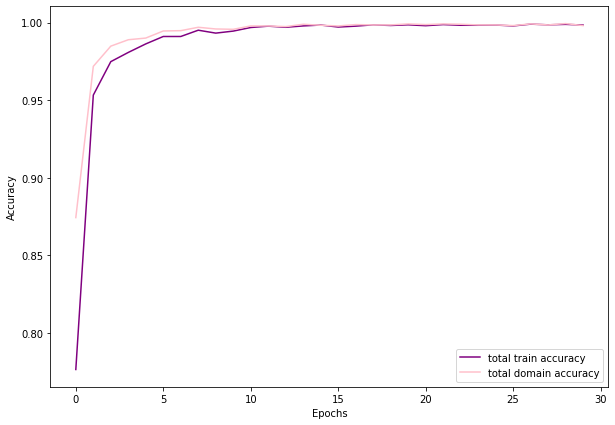

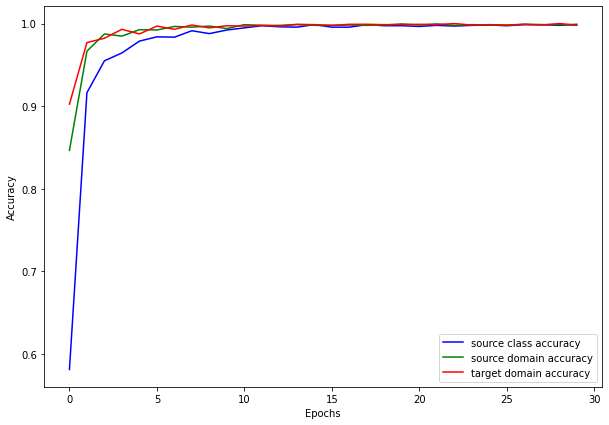

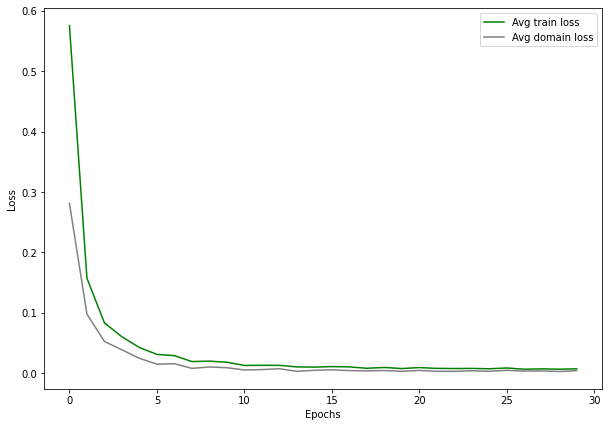

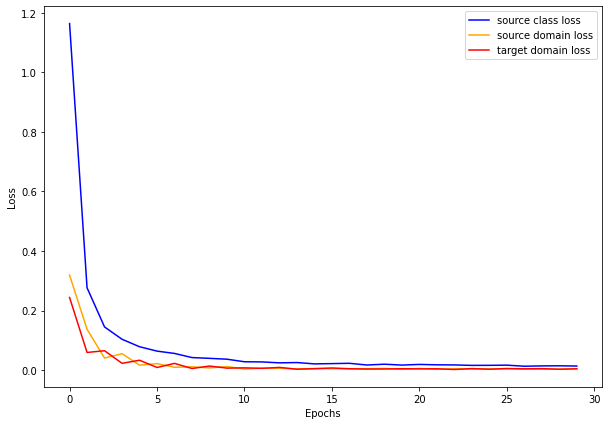

lr: 0.001_wd: 0.0005_gamma: 0.46399843688832176_alpha: 0.28765090931183734
Starting epoch 1/30, LR = [0.001]




Source class Loss: 0.8250, Train class Acc: 0.70
Target class Loss: 0.1996, Val class Acc: 0.26
Source domain Loss: 0.1372, Source domain Acc: 0.93
Target domain Loss: 0.0495, Target domain Acc: 0.97
Total train Loss: 0.3372, Total train Acc: 0.87
Total domain Loss: 0.0933, Total domain Acc: 0.95


Starting epoch 2/30, LR = [0.001]




Source class Loss: 0.1374, Train class Acc: 0.96
Target class Loss: 0.1341, Val class Acc: 0.28
Source domain Loss: 0.0006, Source domain Acc: 1.00
Target domain Loss: 0.0045, Target domain Acc: 1.00
Total train Loss: 0.0475, Total train Acc: 0.98
Total domain Loss: 0.0026, Total domain Acc: 1.00


Starting epoch 3/30, LR = [0.001]




Source class Loss: 0.0888, Train class Acc: 0.97
Target class Loss: 0.0466, Val class Acc: 0.28
Source domain Loss: 0.0004, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0297, Total train Acc: 0.99
Total domain Loss: 0.0002, Total domain Acc: 1.00


Starting epoch 4/30, LR = [0.001]




Source class Loss: 0.0548, Train class Acc: 0.98
Target class Loss: 0.0395, Val class Acc: 0.30
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0183, Total train Acc: 0.99
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 5/30, LR = [0.001]




Source class Loss: 0.0340, Train class Acc: 0.99
Target class Loss: 0.0194, Val class Acc: 0.31
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0114, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 6/30, LR = [0.001]




Source class Loss: 0.0283, Train class Acc: 0.99
Target class Loss: 0.0300, Val class Acc: 0.30
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0095, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.001]




Source class Loss: 0.0251, Train class Acc: 1.00
Target class Loss: 0.0308, Val class Acc: 0.30
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0084, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.001]




Source class Loss: 0.0194, Train class Acc: 1.00
Target class Loss: 0.0178, Val class Acc: 0.31
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0065, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.001]




Source class Loss: 0.0175, Train class Acc: 1.00
Target class Loss: 0.0131, Val class Acc: 0.31
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0059, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.001]




Source class Loss: 0.0131, Train class Acc: 1.00
Target class Loss: 0.0096, Val class Acc: 0.31
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0044, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 11/30, LR = [0.00046399843688832177]




Source class Loss: 0.0136, Train class Acc: 1.00
Target class Loss: 0.0092, Val class Acc: 0.31
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0046, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 12/30, LR = [0.00046399843688832177]




Source class Loss: 0.0114, Train class Acc: 1.00
Target class Loss: 0.0149, Val class Acc: 0.31
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0038, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 13/30, LR = [0.00046399843688832177]




Source class Loss: 0.0121, Train class Acc: 1.00
Target class Loss: 0.0048, Val class Acc: 0.31
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0041, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 14/30, LR = [0.00046399843688832177]




Source class Loss: 0.0093, Train class Acc: 1.00
Target class Loss: 0.0081, Val class Acc: 0.32
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0031, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 15/30, LR = [0.00046399843688832177]




Source class Loss: 0.0101, Train class Acc: 1.00
Target class Loss: 0.0064, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0034, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 16/30, LR = [0.00046399843688832177]




Source class Loss: 0.0093, Train class Acc: 1.00
Target class Loss: 0.0074, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0031, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 17/30, LR = [0.00046399843688832177]




Source class Loss: 0.0081, Train class Acc: 1.00
Target class Loss: 0.0079, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0027, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 18/30, LR = [0.00046399843688832177]




Source class Loss: 0.0084, Train class Acc: 1.00
Target class Loss: 0.0099, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0028, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 19/30, LR = [0.00046399843688832177]




Source class Loss: 0.0072, Train class Acc: 1.00
Target class Loss: 0.0071, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0024, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 20/30, LR = [0.00046399843688832177]




Source class Loss: 0.0067, Train class Acc: 1.00
Target class Loss: 0.0055, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0022, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 21/30, LR = [0.0002152945494348059]




Source class Loss: 0.0079, Train class Acc: 1.00
Target class Loss: 0.0165, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0026, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 22/30, LR = [0.0002152945494348059]




Source class Loss: 0.0065, Train class Acc: 1.00
Target class Loss: 0.0082, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0022, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 23/30, LR = [0.0002152945494348059]




Source class Loss: 0.0068, Train class Acc: 1.00
Target class Loss: 0.0055, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0023, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 24/30, LR = [0.0002152945494348059]




Source class Loss: 0.0066, Train class Acc: 1.00
Target class Loss: 0.0097, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0022, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 25/30, LR = [0.0002152945494348059]




Source class Loss: 0.0062, Train class Acc: 1.00
Target class Loss: 0.0052, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0021, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 26/30, LR = [0.0002152945494348059]




Source class Loss: 0.0068, Train class Acc: 1.00
Target class Loss: 0.0085, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0023, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 27/30, LR = [0.0002152945494348059]




Source class Loss: 0.0065, Train class Acc: 1.00
Target class Loss: 0.0021, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0023, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 28/30, LR = [0.0002152945494348059]




Source class Loss: 0.0074, Train class Acc: 1.00
Target class Loss: 0.0085, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0025, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 29/30, LR = [0.0002152945494348059]




Source class Loss: 0.0060, Train class Acc: 1.00
Target class Loss: 0.0069, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0020, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 30/30, LR = [0.0002152945494348059]




Source class Loss: 0.0055, Train class Acc: 1.00
Target class Loss: 0.0057, Val class Acc: 0.32
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0018, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00




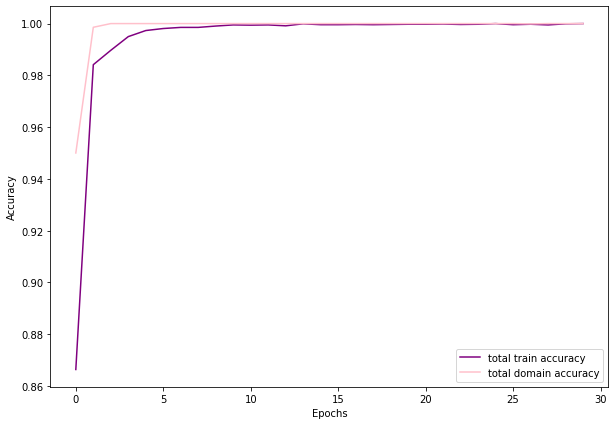

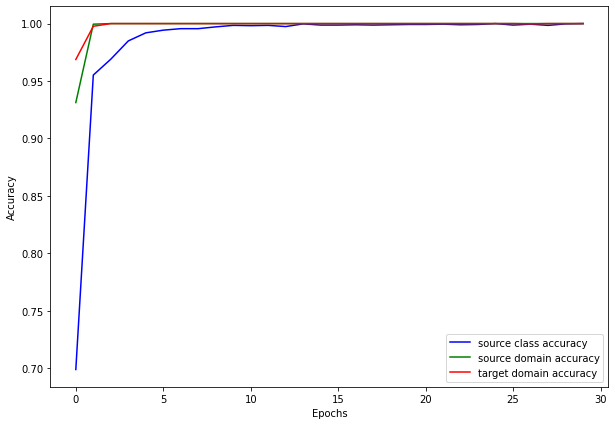

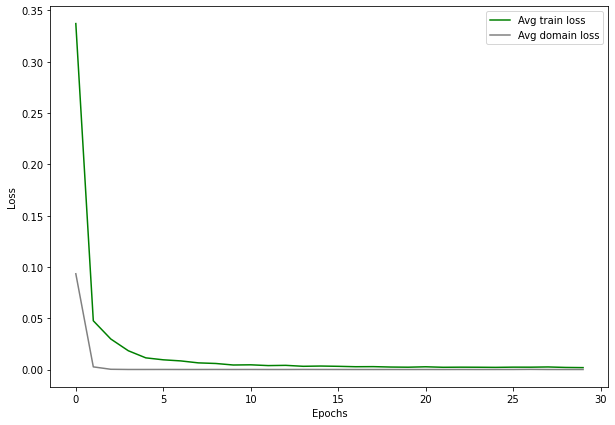

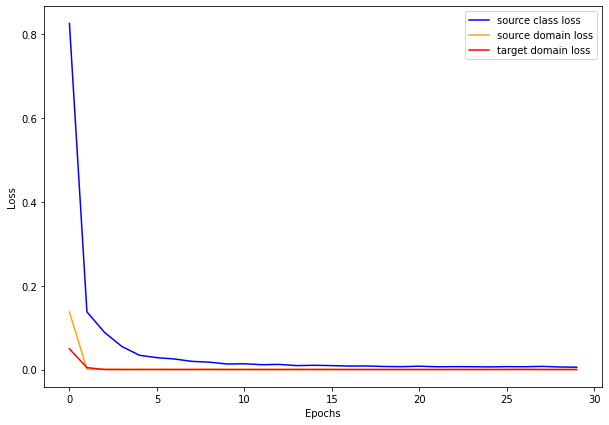

Iteration 5 / 8
lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.38179587820015626_alpha: 0.23005670838165035
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.8889, Train class Acc: 0.27
Target class Loss: 1.5705, Val class Acc: 0.20
Source domain Loss: 0.7848, Source domain Acc: 0.53
Target domain Loss: 0.3961, Target domain Acc: 0.83
Total train Loss: 1.0233, Total train Acc: 0.54
Total domain Loss: 0.5905, Total domain Acc: 0.68


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.1958, Train class Acc: 0.61
Target class Loss: 1.0054, Val class Acc: 0.28
Source domain Loss: 0.2495, Source domain Acc: 0.92
Target domain Loss: 0.1325, Target domain Acc: 0.95
Total train Loss: 0.5259, Total train Acc: 0.83
Total domain Loss: 0.1910, Total domain Acc: 0.94


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.7768, Train class Acc: 0.77
Target class Loss: 0.5934, Val class Acc: 0.29
Source domain Loss: 0.1190, Source domain Acc: 0.96
Target domain Loss: 0.1043, Target domain Acc: 0.96
Total train Loss: 0.3334, Total train Acc: 0.90
Total domain Loss: 0.1117, Total domain Acc: 0.96


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.5841, Train class Acc: 0.84
Target class Loss: 0.5472, Val class Acc: 0.27
Source domain Loss: 0.0859, Source domain Acc: 0.97
Target domain Loss: 0.0799, Target domain Acc: 0.97
Total train Loss: 0.2500, Total train Acc: 0.93
Total domain Loss: 0.0829, Total domain Acc: 0.97


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.4428, Train class Acc: 0.89
Target class Loss: 0.4375, Val class Acc: 0.26
Source domain Loss: 0.0752, Source domain Acc: 0.98
Target domain Loss: 0.0598, Target domain Acc: 0.98
Total train Loss: 0.1926, Total train Acc: 0.95
Total domain Loss: 0.0675, Total domain Acc: 0.98


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.3666, Train class Acc: 0.91
Target class Loss: 0.3558, Val class Acc: 0.26
Source domain Loss: 0.0666, Source domain Acc: 0.98
Target domain Loss: 0.0544, Target domain Acc: 0.98
Total train Loss: 0.1625, Total train Acc: 0.96
Total domain Loss: 0.0605, Total domain Acc: 0.98


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.3122, Train class Acc: 0.91
Target class Loss: 0.3142, Val class Acc: 0.25
Source domain Loss: 0.0629, Source domain Acc: 0.98
Target domain Loss: 0.0503, Target domain Acc: 0.98
Total train Loss: 0.1418, Total train Acc: 0.96
Total domain Loss: 0.0566, Total domain Acc: 0.98


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.2823, Train class Acc: 0.92
Target class Loss: 0.2951, Val class Acc: 0.25
Source domain Loss: 0.0589, Source domain Acc: 0.98
Target domain Loss: 0.0515, Target domain Acc: 0.98
Total train Loss: 0.1309, Total train Acc: 0.96
Total domain Loss: 0.0552, Total domain Acc: 0.98


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2456, Train class Acc: 0.93
Target class Loss: 0.2562, Val class Acc: 0.24
Source domain Loss: 0.0505, Source domain Acc: 0.98
Target domain Loss: 0.0498, Target domain Acc: 0.98
Total train Loss: 0.1153, Total train Acc: 0.96
Total domain Loss: 0.0501, Total domain Acc: 0.98


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2250, Train class Acc: 0.94
Target class Loss: 0.2378, Val class Acc: 0.23
Source domain Loss: 0.0542, Source domain Acc: 0.98
Target domain Loss: 0.0421, Target domain Acc: 0.98
Total train Loss: 0.1071, Total train Acc: 0.97
Total domain Loss: 0.0481, Total domain Acc: 0.98


Starting epoch 11/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.2209, Train class Acc: 0.94
Target class Loss: 0.2301, Val class Acc: 0.23
Source domain Loss: 0.0484, Source domain Acc: 0.98
Target domain Loss: 0.0426, Target domain Acc: 0.98
Total train Loss: 0.1040, Total train Acc: 0.97
Total domain Loss: 0.0455, Total domain Acc: 0.98


Starting epoch 12/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.2066, Train class Acc: 0.94
Target class Loss: 0.1650, Val class Acc: 0.23
Source domain Loss: 0.0483, Source domain Acc: 0.98
Target domain Loss: 0.0392, Target domain Acc: 0.99
Total train Loss: 0.0980, Total train Acc: 0.97
Total domain Loss: 0.0437, Total domain Acc: 0.98


Starting epoch 13/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.2040, Train class Acc: 0.95
Target class Loss: 0.2283, Val class Acc: 0.23
Source domain Loss: 0.0394, Source domain Acc: 0.99
Target domain Loss: 0.0407, Target domain Acc: 0.99
Total train Loss: 0.0947, Total train Acc: 0.97
Total domain Loss: 0.0401, Total domain Acc: 0.99


Starting epoch 14/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1974, Train class Acc: 0.95
Target class Loss: 0.1963, Val class Acc: 0.23
Source domain Loss: 0.0460, Source domain Acc: 0.98
Target domain Loss: 0.0439, Target domain Acc: 0.98
Total train Loss: 0.0958, Total train Acc: 0.97
Total domain Loss: 0.0450, Total domain Acc: 0.98


Starting epoch 15/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1863, Train class Acc: 0.95
Target class Loss: 0.2202, Val class Acc: 0.23
Source domain Loss: 0.0387, Source domain Acc: 0.99
Target domain Loss: 0.0370, Target domain Acc: 0.99
Total train Loss: 0.0873, Total train Acc: 0.97
Total domain Loss: 0.0379, Total domain Acc: 0.99


Starting epoch 16/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1863, Train class Acc: 0.95
Target class Loss: 0.2092, Val class Acc: 0.23
Source domain Loss: 0.0404, Source domain Acc: 0.99
Target domain Loss: 0.0388, Target domain Acc: 0.99
Total train Loss: 0.0885, Total train Acc: 0.97
Total domain Loss: 0.0396, Total domain Acc: 0.99


Starting epoch 17/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1847, Train class Acc: 0.95
Target class Loss: 0.1997, Val class Acc: 0.23
Source domain Loss: 0.0436, Source domain Acc: 0.99
Target domain Loss: 0.0396, Target domain Acc: 0.99
Total train Loss: 0.0893, Total train Acc: 0.97
Total domain Loss: 0.0416, Total domain Acc: 0.99


Starting epoch 18/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1674, Train class Acc: 0.95
Target class Loss: 0.1284, Val class Acc: 0.23
Source domain Loss: 0.0381, Source domain Acc: 0.99
Target domain Loss: 0.0363, Target domain Acc: 0.99
Total train Loss: 0.0806, Total train Acc: 0.98
Total domain Loss: 0.0372, Total domain Acc: 0.99


Starting epoch 19/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1840, Train class Acc: 0.95
Target class Loss: 0.1796, Val class Acc: 0.23
Source domain Loss: 0.0371, Source domain Acc: 0.99
Target domain Loss: 0.0359, Target domain Acc: 0.99
Total train Loss: 0.0857, Total train Acc: 0.97
Total domain Loss: 0.0365, Total domain Acc: 0.99


Starting epoch 20/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1729, Train class Acc: 0.95
Target class Loss: 0.1747, Val class Acc: 0.22
Source domain Loss: 0.0404, Source domain Acc: 0.99
Target domain Loss: 0.0360, Target domain Acc: 0.99
Total train Loss: 0.0831, Total train Acc: 0.97
Total domain Loss: 0.0382, Total domain Acc: 0.99


Starting epoch 21/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1668, Train class Acc: 0.95
Target class Loss: 0.1417, Val class Acc: 0.22
Source domain Loss: 0.0381, Source domain Acc: 0.99
Target domain Loss: 0.0379, Target domain Acc: 0.99
Total train Loss: 0.0809, Total train Acc: 0.97
Total domain Loss: 0.0380, Total domain Acc: 0.99


Starting epoch 22/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1621, Train class Acc: 0.96
Target class Loss: 0.1588, Val class Acc: 0.22
Source domain Loss: 0.0384, Source domain Acc: 0.99
Target domain Loss: 0.0335, Target domain Acc: 0.99
Total train Loss: 0.0780, Total train Acc: 0.98
Total domain Loss: 0.0360, Total domain Acc: 0.99


Starting epoch 23/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1674, Train class Acc: 0.95
Target class Loss: 0.1899, Val class Acc: 0.22
Source domain Loss: 0.0372, Source domain Acc: 0.98
Target domain Loss: 0.0357, Target domain Acc: 0.99
Total train Loss: 0.0801, Total train Acc: 0.98
Total domain Loss: 0.0364, Total domain Acc: 0.99


Starting epoch 24/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1706, Train class Acc: 0.95
Target class Loss: 0.2177, Val class Acc: 0.22
Source domain Loss: 0.0395, Source domain Acc: 0.98
Target domain Loss: 0.0363, Target domain Acc: 0.99
Total train Loss: 0.0821, Total train Acc: 0.97
Total domain Loss: 0.0379, Total domain Acc: 0.99


Starting epoch 25/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1577, Train class Acc: 0.96
Target class Loss: 0.1412, Val class Acc: 0.22
Source domain Loss: 0.0404, Source domain Acc: 0.98
Target domain Loss: 0.0344, Target domain Acc: 0.99
Total train Loss: 0.0775, Total train Acc: 0.98
Total domain Loss: 0.0374, Total domain Acc: 0.99


Starting epoch 26/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1563, Train class Acc: 0.96
Target class Loss: 0.1400, Val class Acc: 0.22
Source domain Loss: 0.0357, Source domain Acc: 0.99
Target domain Loss: 0.0378, Target domain Acc: 0.98
Total train Loss: 0.0766, Total train Acc: 0.98
Total domain Loss: 0.0367, Total domain Acc: 0.99


Starting epoch 27/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1622, Train class Acc: 0.96
Target class Loss: 0.1514, Val class Acc: 0.22
Source domain Loss: 0.0349, Source domain Acc: 0.99
Target domain Loss: 0.0330, Target domain Acc: 0.99
Total train Loss: 0.0767, Total train Acc: 0.98
Total domain Loss: 0.0339, Total domain Acc: 0.99


Starting epoch 28/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1501, Train class Acc: 0.96
Target class Loss: 0.1626, Val class Acc: 0.22
Source domain Loss: 0.0347, Source domain Acc: 0.99
Target domain Loss: 0.0350, Target domain Acc: 0.99
Total train Loss: 0.0732, Total train Acc: 0.98
Total domain Loss: 0.0348, Total domain Acc: 0.99


Starting epoch 29/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1521, Train class Acc: 0.96
Target class Loss: 0.1368, Val class Acc: 0.22
Source domain Loss: 0.0344, Source domain Acc: 0.99
Target domain Loss: 0.0385, Target domain Acc: 0.98
Total train Loss: 0.0750, Total train Acc: 0.98
Total domain Loss: 0.0365, Total domain Acc: 0.99


Starting epoch 30/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1537, Train class Acc: 0.96
Target class Loss: 0.1497, Val class Acc: 0.22
Source domain Loss: 0.0352, Source domain Acc: 0.99
Target domain Loss: 0.0316, Target domain Acc: 0.99
Total train Loss: 0.0735, Total train Acc: 0.98
Total domain Loss: 0.0334, Total domain Acc: 0.99




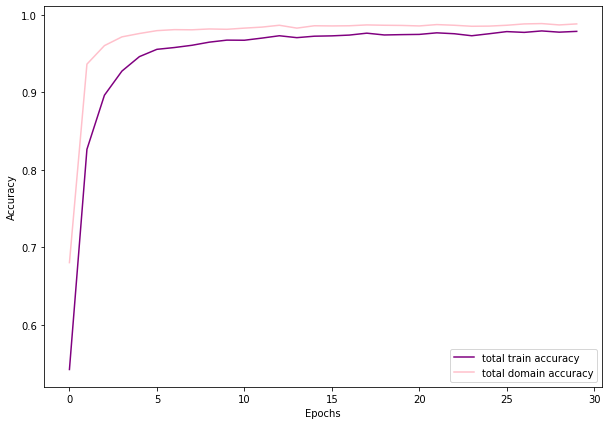

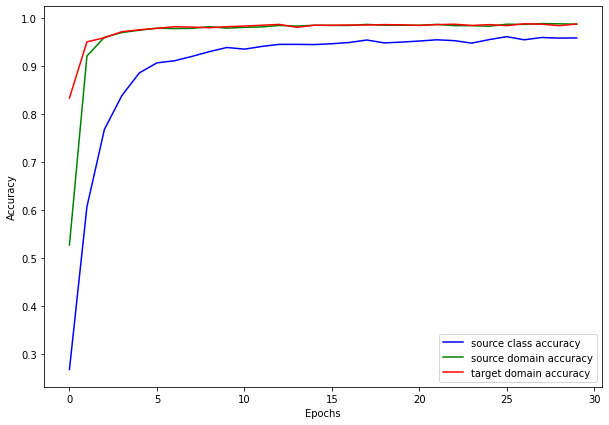

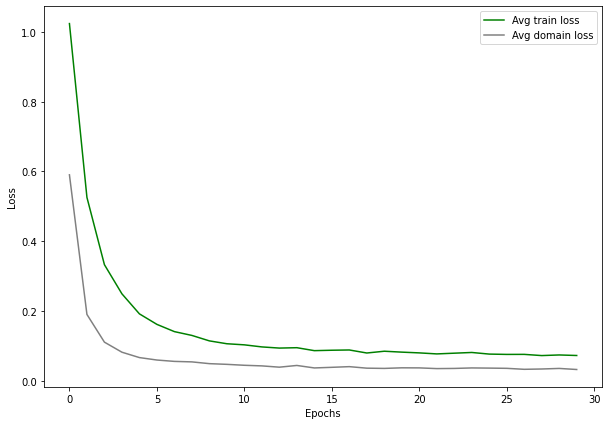

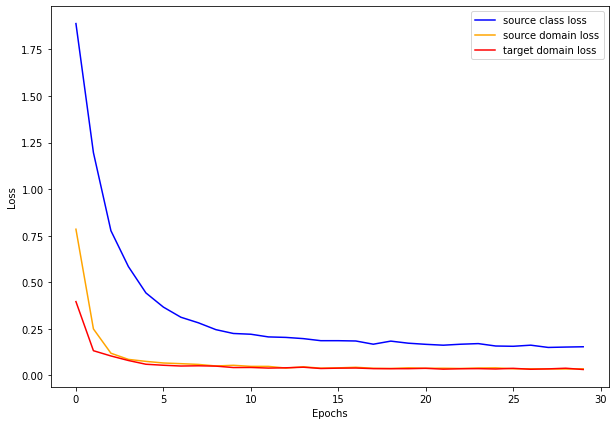

lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.38179587820015626_alpha: 0.23005670838165035
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.6818, Train class Acc: 0.38
Target class Loss: 1.0791, Val class Acc: 0.10
Source domain Loss: 0.3337, Source domain Acc: 0.86
Target domain Loss: 0.1093, Target domain Acc: 0.99
Total train Loss: 0.7082, Total train Acc: 0.74
Total domain Loss: 0.2215, Total domain Acc: 0.93


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 0.7953, Train class Acc: 0.74
Target class Loss: 0.6242, Val class Acc: 0.20
Source domain Loss: 0.0385, Source domain Acc: 0.99
Target domain Loss: 0.0051, Target domain Acc: 1.00
Total train Loss: 0.2796, Total train Acc: 0.91
Total domain Loss: 0.0218, Total domain Acc: 1.00


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.4755, Train class Acc: 0.87
Target class Loss: 0.3142, Val class Acc: 0.20
Source domain Loss: 0.0116, Source domain Acc: 1.00
Target domain Loss: 0.0057, Target domain Acc: 1.00
Total train Loss: 0.1643, Total train Acc: 0.95
Total domain Loss: 0.0087, Total domain Acc: 1.00


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.3412, Train class Acc: 0.90
Target class Loss: 0.3396, Val class Acc: 0.20
Source domain Loss: 0.0058, Source domain Acc: 1.00
Target domain Loss: 0.0055, Target domain Acc: 1.00
Total train Loss: 0.1175, Total train Acc: 0.97
Total domain Loss: 0.0057, Total domain Acc: 1.00


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.2651, Train class Acc: 0.93
Target class Loss: 0.2190, Val class Acc: 0.20
Source domain Loss: 0.0042, Source domain Acc: 1.00
Target domain Loss: 0.0032, Target domain Acc: 1.00
Total train Loss: 0.0908, Total train Acc: 0.97
Total domain Loss: 0.0037, Total domain Acc: 1.00


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.2302, Train class Acc: 0.93
Target class Loss: 0.2360, Val class Acc: 0.20
Source domain Loss: 0.0051, Source domain Acc: 1.00
Target domain Loss: 0.0023, Target domain Acc: 1.00
Total train Loss: 0.0792, Total train Acc: 0.98
Total domain Loss: 0.0037, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.2004, Train class Acc: 0.95
Target class Loss: 0.1470, Val class Acc: 0.20
Source domain Loss: 0.0038, Source domain Acc: 1.00
Target domain Loss: 0.0024, Target domain Acc: 1.00
Total train Loss: 0.0689, Total train Acc: 0.98
Total domain Loss: 0.0031, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.1798, Train class Acc: 0.95
Target class Loss: 0.1712, Val class Acc: 0.20
Source domain Loss: 0.0033, Source domain Acc: 1.00
Target domain Loss: 0.0027, Target domain Acc: 1.00
Total train Loss: 0.0619, Total train Acc: 0.98
Total domain Loss: 0.0030, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.1629, Train class Acc: 0.95
Target class Loss: 0.1221, Val class Acc: 0.20
Source domain Loss: 0.0024, Source domain Acc: 1.00
Target domain Loss: 0.0018, Target domain Acc: 1.00
Total train Loss: 0.0557, Total train Acc: 0.98
Total domain Loss: 0.0021, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.1513, Train class Acc: 0.96
Target class Loss: 0.1334, Val class Acc: 0.20
Source domain Loss: 0.0030, Source domain Acc: 1.00
Target domain Loss: 0.0014, Target domain Acc: 1.00
Total train Loss: 0.0519, Total train Acc: 0.98
Total domain Loss: 0.0022, Total domain Acc: 1.00


Starting epoch 11/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1418, Train class Acc: 0.96
Target class Loss: 0.1511, Val class Acc: 0.20
Source domain Loss: 0.0022, Source domain Acc: 1.00
Target domain Loss: 0.0026, Target domain Acc: 1.00
Total train Loss: 0.0489, Total train Acc: 0.99
Total domain Loss: 0.0024, Total domain Acc: 1.00


Starting epoch 12/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1430, Train class Acc: 0.96
Target class Loss: 0.1320, Val class Acc: 0.20
Source domain Loss: 0.0017, Source domain Acc: 1.00
Target domain Loss: 0.0024, Target domain Acc: 1.00
Total train Loss: 0.0490, Total train Acc: 0.99
Total domain Loss: 0.0020, Total domain Acc: 1.00


Starting epoch 13/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1344, Train class Acc: 0.96
Target class Loss: 0.1258, Val class Acc: 0.20
Source domain Loss: 0.0020, Source domain Acc: 1.00
Target domain Loss: 0.0016, Target domain Acc: 1.00
Total train Loss: 0.0460, Total train Acc: 0.99
Total domain Loss: 0.0018, Total domain Acc: 1.00


Starting epoch 14/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1317, Train class Acc: 0.96
Target class Loss: 0.1385, Val class Acc: 0.20
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0019, Target domain Acc: 1.00
Total train Loss: 0.0451, Total train Acc: 0.99
Total domain Loss: 0.0018, Total domain Acc: 1.00


Starting epoch 15/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1305, Train class Acc: 0.96
Target class Loss: 0.0966, Val class Acc: 0.20
Source domain Loss: 0.0019, Source domain Acc: 1.00
Target domain Loss: 0.0015, Target domain Acc: 1.00
Total train Loss: 0.0446, Total train Acc: 0.99
Total domain Loss: 0.0017, Total domain Acc: 1.00


Starting epoch 16/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1287, Train class Acc: 0.96
Target class Loss: 0.1152, Val class Acc: 0.20
Source domain Loss: 0.0026, Source domain Acc: 1.00
Target domain Loss: 0.0013, Target domain Acc: 1.00
Total train Loss: 0.0442, Total train Acc: 0.99
Total domain Loss: 0.0020, Total domain Acc: 1.00


Starting epoch 17/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1227, Train class Acc: 0.97
Target class Loss: 0.1674, Val class Acc: 0.21
Source domain Loss: 0.0016, Source domain Acc: 1.00
Target domain Loss: 0.0015, Target domain Acc: 1.00
Total train Loss: 0.0419, Total train Acc: 0.99
Total domain Loss: 0.0015, Total domain Acc: 1.00


Starting epoch 18/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1179, Train class Acc: 0.96
Target class Loss: 0.1069, Val class Acc: 0.21
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0403, Total train Acc: 0.99
Total domain Loss: 0.0015, Total domain Acc: 1.00


Starting epoch 19/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1176, Train class Acc: 0.97
Target class Loss: 0.1090, Val class Acc: 0.21
Source domain Loss: 0.0021, Source domain Acc: 1.00
Target domain Loss: 0.0012, Target domain Acc: 1.00
Total train Loss: 0.0403, Total train Acc: 0.99
Total domain Loss: 0.0016, Total domain Acc: 1.00


Starting epoch 20/30, LR = [3.8179587820015626e-05]




Source class Loss: 0.1121, Train class Acc: 0.97
Target class Loss: 0.1141, Val class Acc: 0.21
Source domain Loss: 0.0016, Source domain Acc: 1.00
Target domain Loss: 0.0013, Target domain Acc: 1.00
Total train Loss: 0.0383, Total train Acc: 0.99
Total domain Loss: 0.0014, Total domain Acc: 1.00


Starting epoch 21/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1092, Train class Acc: 0.97
Target class Loss: 0.1009, Val class Acc: 0.21
Source domain Loss: 0.0020, Source domain Acc: 1.00
Target domain Loss: 0.0016, Target domain Acc: 1.00
Total train Loss: 0.0376, Total train Acc: 0.99
Total domain Loss: 0.0018, Total domain Acc: 1.00


Starting epoch 22/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1129, Train class Acc: 0.97
Target class Loss: 0.1201, Val class Acc: 0.21
Source domain Loss: 0.0016, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0385, Total train Acc: 0.99
Total domain Loss: 0.0013, Total domain Acc: 1.00


Starting epoch 23/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1097, Train class Acc: 0.97
Target class Loss: 0.0942, Val class Acc: 0.21
Source domain Loss: 0.0011, Source domain Acc: 1.00
Target domain Loss: 0.0013, Target domain Acc: 1.00
Total train Loss: 0.0374, Total train Acc: 0.99
Total domain Loss: 0.0012, Total domain Acc: 1.00


Starting epoch 24/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1066, Train class Acc: 0.97
Target class Loss: 0.0720, Val class Acc: 0.21
Source domain Loss: 0.0016, Source domain Acc: 1.00
Target domain Loss: 0.0012, Target domain Acc: 1.00
Total train Loss: 0.0365, Total train Acc: 0.99
Total domain Loss: 0.0014, Total domain Acc: 1.00


Starting epoch 25/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1136, Train class Acc: 0.97
Target class Loss: 0.1141, Val class Acc: 0.21
Source domain Loss: 0.0013, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0387, Total train Acc: 0.99
Total domain Loss: 0.0012, Total domain Acc: 1.00


Starting epoch 26/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1074, Train class Acc: 0.97
Target class Loss: 0.0982, Val class Acc: 0.21
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0010, Target domain Acc: 1.00
Total train Loss: 0.0367, Total train Acc: 0.99
Total domain Loss: 0.0014, Total domain Acc: 1.00


Starting epoch 27/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1020, Train class Acc: 0.97
Target class Loss: 0.0815, Val class Acc: 0.21
Source domain Loss: 0.0014, Source domain Acc: 1.00
Target domain Loss: 0.0014, Target domain Acc: 1.00
Total train Loss: 0.0349, Total train Acc: 0.99
Total domain Loss: 0.0014, Total domain Acc: 1.00


Starting epoch 28/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1027, Train class Acc: 0.97
Target class Loss: 0.1053, Val class Acc: 0.21
Source domain Loss: 0.0014, Source domain Acc: 1.00
Target domain Loss: 0.0009, Target domain Acc: 1.00
Total train Loss: 0.0350, Total train Acc: 0.99
Total domain Loss: 0.0012, Total domain Acc: 1.00


Starting epoch 29/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1060, Train class Acc: 0.97
Target class Loss: 0.1330, Val class Acc: 0.21
Source domain Loss: 0.0017, Source domain Acc: 1.00
Target domain Loss: 0.0011, Target domain Acc: 1.00
Total train Loss: 0.0363, Total train Acc: 0.99
Total domain Loss: 0.0014, Total domain Acc: 1.00


Starting epoch 30/30, LR = [1.4576809261062854e-05]




Source class Loss: 0.1031, Train class Acc: 0.97
Target class Loss: 0.1007, Val class Acc: 0.21
Source domain Loss: 0.0013, Source domain Acc: 1.00
Target domain Loss: 0.0010, Target domain Acc: 1.00
Total train Loss: 0.0351, Total train Acc: 0.99
Total domain Loss: 0.0011, Total domain Acc: 1.00




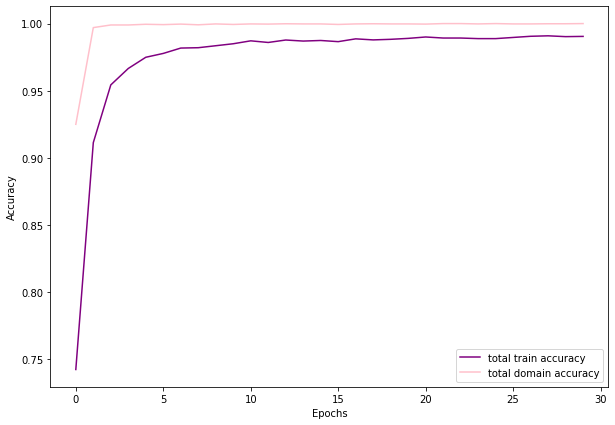

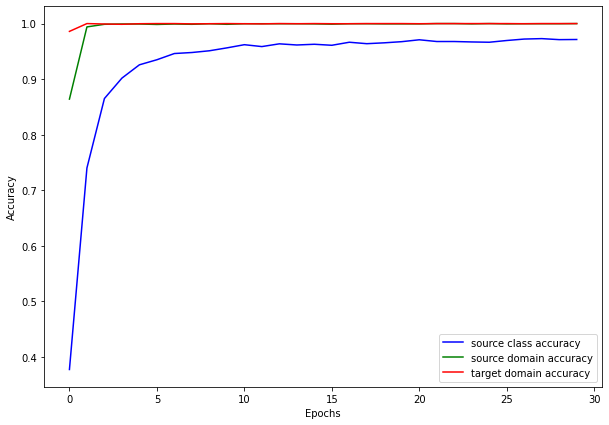

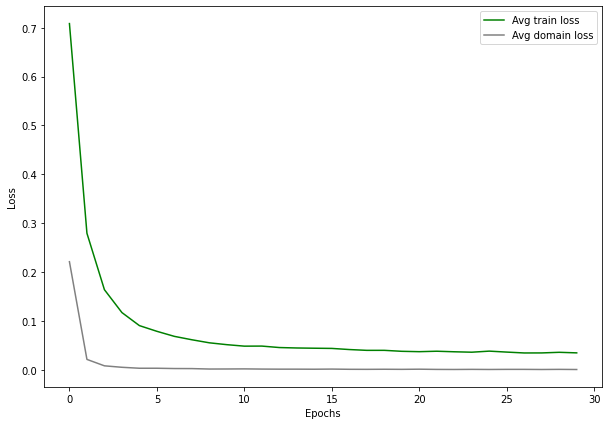

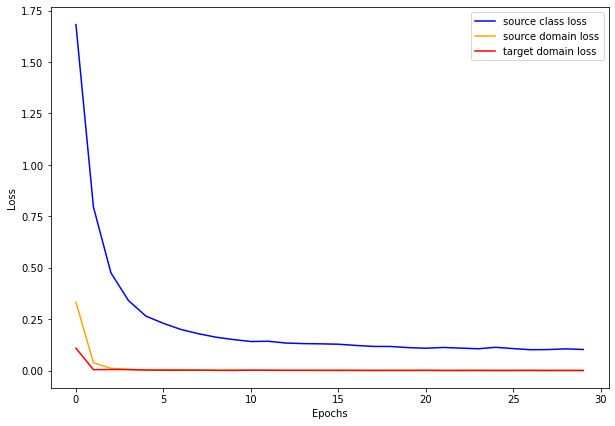

Iteration 6 / 8
lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.10421544425236849_alpha: 0.14157936260748577
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.7775, Train class Acc: 0.36
Target class Loss: 1.5237, Val class Acc: 0.27
Source domain Loss: 0.5768, Source domain Acc: 0.73
Target domain Loss: 0.5330, Target domain Acc: 0.72
Total train Loss: 0.9624, Total train Acc: 0.60
Total domain Loss: 0.5549, Total domain Acc: 0.72


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 1.2157, Train class Acc: 0.58
Target class Loss: 0.9823, Val class Acc: 0.33
Source domain Loss: 0.3184, Source domain Acc: 0.88
Target domain Loss: 0.0760, Target domain Acc: 0.98
Total train Loss: 0.5367, Total train Acc: 0.81
Total domain Loss: 0.1972, Total domain Acc: 0.93


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.8344, Train class Acc: 0.72
Target class Loss: 0.7994, Val class Acc: 0.35
Source domain Loss: 0.1255, Source domain Acc: 0.96
Target domain Loss: 0.1033, Target domain Acc: 0.96
Total train Loss: 0.3544, Total train Acc: 0.88
Total domain Loss: 0.1144, Total domain Acc: 0.96


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.6235, Train class Acc: 0.82
Target class Loss: 0.5598, Val class Acc: 0.33
Source domain Loss: 0.0715, Source domain Acc: 0.98
Target domain Loss: 0.0916, Target domain Acc: 0.97
Total train Loss: 0.2622, Total train Acc: 0.92
Total domain Loss: 0.0816, Total domain Acc: 0.97


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.4755, Train class Acc: 0.87
Target class Loss: 0.4274, Val class Acc: 0.31
Source domain Loss: 0.0640, Source domain Acc: 0.98
Target domain Loss: 0.0661, Target domain Acc: 0.97
Total train Loss: 0.2019, Total train Acc: 0.94
Total domain Loss: 0.0650, Total domain Acc: 0.98


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.3900, Train class Acc: 0.90
Target class Loss: 0.3596, Val class Acc: 0.29
Source domain Loss: 0.0660, Source domain Acc: 0.98
Target domain Loss: 0.0523, Target domain Acc: 0.98
Total train Loss: 0.1694, Total train Acc: 0.95
Total domain Loss: 0.0592, Total domain Acc: 0.98


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.3413, Train class Acc: 0.91
Target class Loss: 0.3112, Val class Acc: 0.28
Source domain Loss: 0.0643, Source domain Acc: 0.98
Target domain Loss: 0.0465, Target domain Acc: 0.98
Total train Loss: 0.1507, Total train Acc: 0.96
Total domain Loss: 0.0554, Total domain Acc: 0.98


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.2962, Train class Acc: 0.92
Target class Loss: 0.3115, Val class Acc: 0.27
Source domain Loss: 0.0572, Source domain Acc: 0.98
Target domain Loss: 0.0492, Target domain Acc: 0.98
Total train Loss: 0.1342, Total train Acc: 0.96
Total domain Loss: 0.0532, Total domain Acc: 0.98


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.2709, Train class Acc: 0.93
Target class Loss: 0.2913, Val class Acc: 0.26
Source domain Loss: 0.0501, Source domain Acc: 0.99
Target domain Loss: 0.0445, Target domain Acc: 0.98
Total train Loss: 0.1218, Total train Acc: 0.96
Total domain Loss: 0.0473, Total domain Acc: 0.98


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.2517, Train class Acc: 0.93
Target class Loss: 0.2679, Val class Acc: 0.26
Source domain Loss: 0.0468, Source domain Acc: 0.99
Target domain Loss: 0.0447, Target domain Acc: 0.99
Total train Loss: 0.1144, Total train Acc: 0.97
Total domain Loss: 0.0458, Total domain Acc: 0.99


Starting epoch 11/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2280, Train class Acc: 0.94
Target class Loss: 0.2472, Val class Acc: 0.26
Source domain Loss: 0.0415, Source domain Acc: 0.99
Target domain Loss: 0.0401, Target domain Acc: 0.99
Total train Loss: 0.1032, Total train Acc: 0.97
Total domain Loss: 0.0408, Total domain Acc: 0.99


Starting epoch 12/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2359, Train class Acc: 0.93
Target class Loss: 0.2371, Val class Acc: 0.26
Source domain Loss: 0.0460, Source domain Acc: 0.98
Target domain Loss: 0.0374, Target domain Acc: 0.98
Total train Loss: 0.1065, Total train Acc: 0.97
Total domain Loss: 0.0417, Total domain Acc: 0.98


Starting epoch 13/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2380, Train class Acc: 0.93
Target class Loss: 0.2558, Val class Acc: 0.26
Source domain Loss: 0.0495, Source domain Acc: 0.98
Target domain Loss: 0.0379, Target domain Acc: 0.99
Total train Loss: 0.1085, Total train Acc: 0.97
Total domain Loss: 0.0437, Total domain Acc: 0.99


Starting epoch 14/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2351, Train class Acc: 0.93
Target class Loss: 0.2637, Val class Acc: 0.25
Source domain Loss: 0.0429, Source domain Acc: 0.99
Target domain Loss: 0.0404, Target domain Acc: 0.99
Total train Loss: 0.1061, Total train Acc: 0.97
Total domain Loss: 0.0416, Total domain Acc: 0.99


Starting epoch 15/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2247, Train class Acc: 0.94
Target class Loss: 0.2230, Val class Acc: 0.25
Source domain Loss: 0.0486, Source domain Acc: 0.98
Target domain Loss: 0.0389, Target domain Acc: 0.99
Total train Loss: 0.1041, Total train Acc: 0.97
Total domain Loss: 0.0438, Total domain Acc: 0.98


Starting epoch 16/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2201, Train class Acc: 0.94
Target class Loss: 0.1826, Val class Acc: 0.25
Source domain Loss: 0.0461, Source domain Acc: 0.98
Target domain Loss: 0.0428, Target domain Acc: 0.98
Total train Loss: 0.1030, Total train Acc: 0.97
Total domain Loss: 0.0445, Total domain Acc: 0.98


Starting epoch 17/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2223, Train class Acc: 0.94
Target class Loss: 0.2129, Val class Acc: 0.25
Source domain Loss: 0.0402, Source domain Acc: 0.98
Target domain Loss: 0.0409, Target domain Acc: 0.98
Total train Loss: 0.1011, Total train Acc: 0.97
Total domain Loss: 0.0405, Total domain Acc: 0.98


Starting epoch 18/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2213, Train class Acc: 0.94
Target class Loss: 0.1919, Val class Acc: 0.25
Source domain Loss: 0.0423, Source domain Acc: 0.99
Target domain Loss: 0.0426, Target domain Acc: 0.99
Total train Loss: 0.1021, Total train Acc: 0.97
Total domain Loss: 0.0425, Total domain Acc: 0.99


Starting epoch 19/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2186, Train class Acc: 0.94
Target class Loss: 0.2036, Val class Acc: 0.25
Source domain Loss: 0.0455, Source domain Acc: 0.98
Target domain Loss: 0.0424, Target domain Acc: 0.98
Total train Loss: 0.1022, Total train Acc: 0.97
Total domain Loss: 0.0440, Total domain Acc: 0.98


Starting epoch 20/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.2217, Train class Acc: 0.94
Target class Loss: 0.1915, Val class Acc: 0.25
Source domain Loss: 0.0416, Source domain Acc: 0.99
Target domain Loss: 0.0417, Target domain Acc: 0.99
Total train Loss: 0.1017, Total train Acc: 0.97
Total domain Loss: 0.0417, Total domain Acc: 0.99


Starting epoch 21/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2262, Train class Acc: 0.94
Target class Loss: 0.2449, Val class Acc: 0.25
Source domain Loss: 0.0442, Source domain Acc: 0.98
Target domain Loss: 0.0401, Target domain Acc: 0.99
Total train Loss: 0.1035, Total train Acc: 0.97
Total domain Loss: 0.0421, Total domain Acc: 0.99


Starting epoch 22/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2188, Train class Acc: 0.94
Target class Loss: 0.2167, Val class Acc: 0.25
Source domain Loss: 0.0425, Source domain Acc: 0.98
Target domain Loss: 0.0370, Target domain Acc: 0.99
Total train Loss: 0.0994, Total train Acc: 0.97
Total domain Loss: 0.0398, Total domain Acc: 0.99


Starting epoch 23/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2265, Train class Acc: 0.93
Target class Loss: 0.2490, Val class Acc: 0.25
Source domain Loss: 0.0464, Source domain Acc: 0.98
Target domain Loss: 0.0423, Target domain Acc: 0.98
Total train Loss: 0.1051, Total train Acc: 0.97
Total domain Loss: 0.0444, Total domain Acc: 0.98


Starting epoch 24/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2183, Train class Acc: 0.94
Target class Loss: 0.1836, Val class Acc: 0.25
Source domain Loss: 0.0454, Source domain Acc: 0.99
Target domain Loss: 0.0378, Target domain Acc: 0.98
Total train Loss: 0.1005, Total train Acc: 0.97
Total domain Loss: 0.0416, Total domain Acc: 0.98


Starting epoch 25/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2176, Train class Acc: 0.94
Target class Loss: 0.2147, Val class Acc: 0.25
Source domain Loss: 0.0432, Source domain Acc: 0.98
Target domain Loss: 0.0411, Target domain Acc: 0.99
Total train Loss: 0.1006, Total train Acc: 0.97
Total domain Loss: 0.0421, Total domain Acc: 0.99


Starting epoch 26/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2210, Train class Acc: 0.94
Target class Loss: 0.1888, Val class Acc: 0.25
Source domain Loss: 0.0388, Source domain Acc: 0.98
Target domain Loss: 0.0399, Target domain Acc: 0.99
Total train Loss: 0.0999, Total train Acc: 0.97
Total domain Loss: 0.0394, Total domain Acc: 0.99


Starting epoch 27/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2182, Train class Acc: 0.94
Target class Loss: 0.1891, Val class Acc: 0.25
Source domain Loss: 0.0408, Source domain Acc: 0.99
Target domain Loss: 0.0403, Target domain Acc: 0.99
Total train Loss: 0.0998, Total train Acc: 0.97
Total domain Loss: 0.0406, Total domain Acc: 0.99


Starting epoch 28/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2145, Train class Acc: 0.95
Target class Loss: 0.2271, Val class Acc: 0.25
Source domain Loss: 0.0398, Source domain Acc: 0.99
Target domain Loss: 0.0361, Target domain Acc: 0.99
Total train Loss: 0.0968, Total train Acc: 0.97
Total domain Loss: 0.0379, Total domain Acc: 0.99


Starting epoch 29/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2043, Train class Acc: 0.95
Target class Loss: 0.1622, Val class Acc: 0.25
Source domain Loss: 0.0442, Source domain Acc: 0.98
Target domain Loss: 0.0389, Target domain Acc: 0.98
Total train Loss: 0.0958, Total train Acc: 0.97
Total domain Loss: 0.0415, Total domain Acc: 0.98


Starting epoch 30/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.2136, Train class Acc: 0.94
Target class Loss: 0.2187, Val class Acc: 0.25
Source domain Loss: 0.0401, Source domain Acc: 0.99
Target domain Loss: 0.0396, Target domain Acc: 0.99
Total train Loss: 0.0978, Total train Acc: 0.97
Total domain Loss: 0.0399, Total domain Acc: 0.99




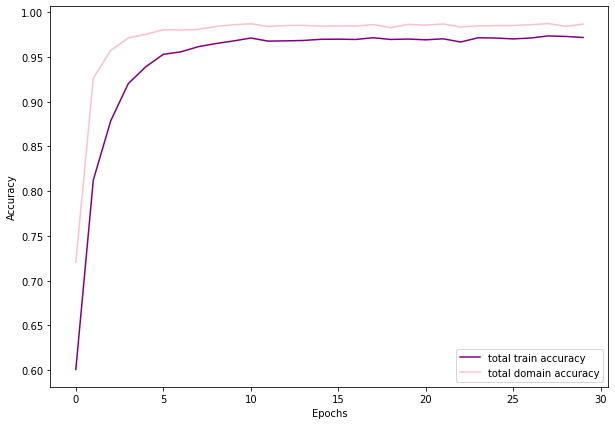

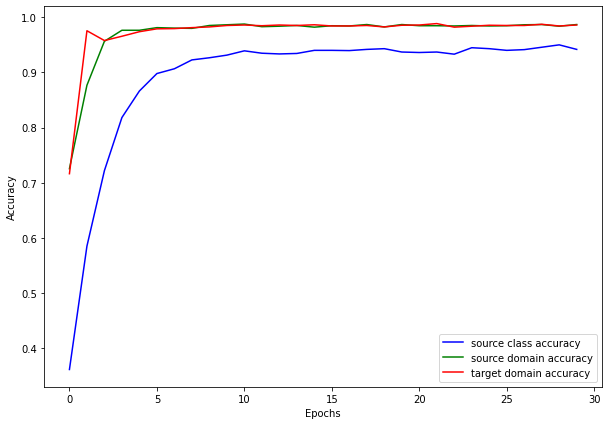

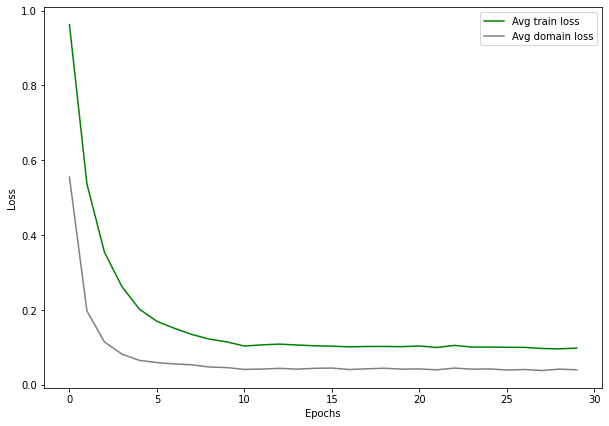

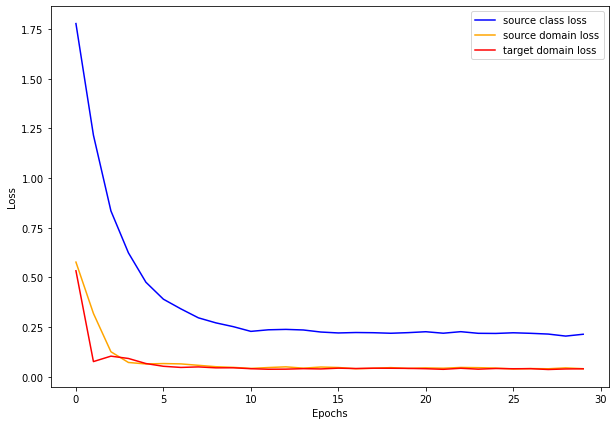

lr: 0.0001_wd: 4.9999999999999996e-06_gamma: 0.10421544425236849_alpha: 0.14157936260748577
Starting epoch 1/30, LR = [0.0001]




Source class Loss: 1.5128, Train class Acc: 0.45
Target class Loss: 1.0694, Val class Acc: 0.23
Source domain Loss: 0.5565, Source domain Acc: 0.69
Target domain Loss: 0.1810, Target domain Acc: 0.91
Total train Loss: 0.7501, Total train Acc: 0.68
Total domain Loss: 0.3688, Total domain Acc: 0.80


Starting epoch 2/30, LR = [0.0001]




Source class Loss: 0.7591, Train class Acc: 0.77
Target class Loss: 0.5473, Val class Acc: 0.29
Source domain Loss: 0.0311, Source domain Acc: 0.99
Target domain Loss: 0.0057, Target domain Acc: 1.00
Total train Loss: 0.2653, Total train Acc: 0.92
Total domain Loss: 0.0184, Total domain Acc: 1.00


Starting epoch 3/30, LR = [0.0001]




Source class Loss: 0.4690, Train class Acc: 0.88
Target class Loss: 0.4059, Val class Acc: 0.30
Source domain Loss: 0.0087, Source domain Acc: 1.00
Target domain Loss: 0.0061, Target domain Acc: 1.00
Total train Loss: 0.1612, Total train Acc: 0.96
Total domain Loss: 0.0074, Total domain Acc: 1.00


Starting epoch 4/30, LR = [0.0001]




Source class Loss: 0.3296, Train class Acc: 0.92
Target class Loss: 0.2843, Val class Acc: 0.31
Source domain Loss: 0.0058, Source domain Acc: 1.00
Target domain Loss: 0.0059, Target domain Acc: 1.00
Total train Loss: 0.1138, Total train Acc: 0.97
Total domain Loss: 0.0059, Total domain Acc: 1.00


Starting epoch 5/30, LR = [0.0001]




Source class Loss: 0.2652, Train class Acc: 0.93
Target class Loss: 0.2348, Val class Acc: 0.32
Source domain Loss: 0.0050, Source domain Acc: 1.00
Target domain Loss: 0.0038, Target domain Acc: 1.00
Total train Loss: 0.0913, Total train Acc: 0.98
Total domain Loss: 0.0044, Total domain Acc: 1.00


Starting epoch 6/30, LR = [0.0001]




Source class Loss: 0.2230, Train class Acc: 0.94
Target class Loss: 0.1861, Val class Acc: 0.31
Source domain Loss: 0.0033, Source domain Acc: 1.00
Target domain Loss: 0.0031, Target domain Acc: 1.00
Total train Loss: 0.0764, Total train Acc: 0.98
Total domain Loss: 0.0032, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.0001]




Source class Loss: 0.1939, Train class Acc: 0.95
Target class Loss: 0.1785, Val class Acc: 0.32
Source domain Loss: 0.0029, Source domain Acc: 1.00
Target domain Loss: 0.0034, Target domain Acc: 1.00
Total train Loss: 0.0667, Total train Acc: 0.98
Total domain Loss: 0.0031, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.0001]




Source class Loss: 0.1738, Train class Acc: 0.95
Target class Loss: 0.1666, Val class Acc: 0.31
Source domain Loss: 0.0026, Source domain Acc: 1.00
Target domain Loss: 0.0032, Target domain Acc: 1.00
Total train Loss: 0.0598, Total train Acc: 0.98
Total domain Loss: 0.0029, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.0001]




Source class Loss: 0.1584, Train class Acc: 0.96
Target class Loss: 0.1450, Val class Acc: 0.32
Source domain Loss: 0.0024, Source domain Acc: 1.00
Target domain Loss: 0.0023, Target domain Acc: 1.00
Total train Loss: 0.0543, Total train Acc: 0.99
Total domain Loss: 0.0023, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.0001]




Source class Loss: 0.1448, Train class Acc: 0.96
Target class Loss: 0.1615, Val class Acc: 0.32
Source domain Loss: 0.0034, Source domain Acc: 1.00
Target domain Loss: 0.0021, Target domain Acc: 1.00
Total train Loss: 0.0501, Total train Acc: 0.99
Total domain Loss: 0.0028, Total domain Acc: 1.00


Starting epoch 11/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1399, Train class Acc: 0.97
Target class Loss: 0.1471, Val class Acc: 0.32
Source domain Loss: 0.0022, Source domain Acc: 1.00
Target domain Loss: 0.0020, Target domain Acc: 1.00
Total train Loss: 0.0480, Total train Acc: 0.99
Total domain Loss: 0.0021, Total domain Acc: 1.00


Starting epoch 12/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1375, Train class Acc: 0.96
Target class Loss: 0.1452, Val class Acc: 0.32
Source domain Loss: 0.0017, Source domain Acc: 1.00
Target domain Loss: 0.0018, Target domain Acc: 1.00
Total train Loss: 0.0470, Total train Acc: 0.99
Total domain Loss: 0.0017, Total domain Acc: 1.00


Starting epoch 13/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1433, Train class Acc: 0.96
Target class Loss: 0.1642, Val class Acc: 0.32
Source domain Loss: 0.0026, Source domain Acc: 1.00
Target domain Loss: 0.0021, Target domain Acc: 1.00
Total train Loss: 0.0493, Total train Acc: 0.99
Total domain Loss: 0.0024, Total domain Acc: 1.00


Starting epoch 14/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1403, Train class Acc: 0.96
Target class Loss: 0.1255, Val class Acc: 0.32
Source domain Loss: 0.0017, Source domain Acc: 1.00
Target domain Loss: 0.0022, Target domain Acc: 1.00
Total train Loss: 0.0481, Total train Acc: 0.99
Total domain Loss: 0.0019, Total domain Acc: 1.00


Starting epoch 15/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1381, Train class Acc: 0.97
Target class Loss: 0.1513, Val class Acc: 0.32
Source domain Loss: 0.0026, Source domain Acc: 1.00
Target domain Loss: 0.0018, Target domain Acc: 1.00
Total train Loss: 0.0475, Total train Acc: 0.99
Total domain Loss: 0.0022, Total domain Acc: 1.00


Starting epoch 16/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1327, Train class Acc: 0.97
Target class Loss: 0.1132, Val class Acc: 0.32
Source domain Loss: 0.0019, Source domain Acc: 1.00
Target domain Loss: 0.0020, Target domain Acc: 1.00
Total train Loss: 0.0455, Total train Acc: 0.99
Total domain Loss: 0.0019, Total domain Acc: 1.00


Starting epoch 17/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1342, Train class Acc: 0.97
Target class Loss: 0.1367, Val class Acc: 0.32
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0025, Target domain Acc: 1.00
Total train Loss: 0.0462, Total train Acc: 0.99
Total domain Loss: 0.0022, Total domain Acc: 1.00


Starting epoch 18/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1331, Train class Acc: 0.96
Target class Loss: 0.1085, Val class Acc: 0.32
Source domain Loss: 0.0020, Source domain Acc: 1.00
Target domain Loss: 0.0025, Target domain Acc: 1.00
Total train Loss: 0.0458, Total train Acc: 0.99
Total domain Loss: 0.0022, Total domain Acc: 1.00


Starting epoch 19/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1276, Train class Acc: 0.97
Target class Loss: 0.1246, Val class Acc: 0.32
Source domain Loss: 0.0019, Source domain Acc: 1.00
Target domain Loss: 0.0023, Target domain Acc: 1.00
Total train Loss: 0.0439, Total train Acc: 0.99
Total domain Loss: 0.0021, Total domain Acc: 1.00


Starting epoch 20/30, LR = [1.0421544425236849e-05]




Source class Loss: 0.1291, Train class Acc: 0.97
Target class Loss: 0.1226, Val class Acc: 0.32
Source domain Loss: 0.0027, Source domain Acc: 1.00
Target domain Loss: 0.0021, Target domain Acc: 1.00
Total train Loss: 0.0446, Total train Acc: 0.99
Total domain Loss: 0.0024, Total domain Acc: 1.00


Starting epoch 21/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1333, Train class Acc: 0.96
Target class Loss: 0.1341, Val class Acc: 0.32
Source domain Loss: 0.0017, Source domain Acc: 1.00
Target domain Loss: 0.0020, Target domain Acc: 1.00
Total train Loss: 0.0457, Total train Acc: 0.99
Total domain Loss: 0.0019, Total domain Acc: 1.00


Starting epoch 22/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1268, Train class Acc: 0.97
Target class Loss: 0.1658, Val class Acc: 0.32
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0017, Target domain Acc: 1.00
Total train Loss: 0.0434, Total train Acc: 0.99
Total domain Loss: 0.0017, Total domain Acc: 1.00


Starting epoch 23/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1287, Train class Acc: 0.97
Target class Loss: 0.1331, Val class Acc: 0.32
Source domain Loss: 0.0036, Source domain Acc: 1.00
Target domain Loss: 0.0020, Target domain Acc: 1.00
Total train Loss: 0.0448, Total train Acc: 0.99
Total domain Loss: 0.0028, Total domain Acc: 1.00


Starting epoch 24/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1290, Train class Acc: 0.97
Target class Loss: 0.0998, Val class Acc: 0.32
Source domain Loss: 0.0017, Source domain Acc: 1.00
Target domain Loss: 0.0016, Target domain Acc: 1.00
Total train Loss: 0.0441, Total train Acc: 0.99
Total domain Loss: 0.0017, Total domain Acc: 1.00


Starting epoch 25/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1301, Train class Acc: 0.96
Target class Loss: 0.1415, Val class Acc: 0.32
Source domain Loss: 0.0025, Source domain Acc: 1.00
Target domain Loss: 0.0028, Target domain Acc: 1.00
Total train Loss: 0.0451, Total train Acc: 0.99
Total domain Loss: 0.0026, Total domain Acc: 1.00


Starting epoch 26/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1269, Train class Acc: 0.97
Target class Loss: 0.1158, Val class Acc: 0.32
Source domain Loss: 0.0017, Source domain Acc: 1.00
Target domain Loss: 0.0015, Target domain Acc: 1.00
Total train Loss: 0.0433, Total train Acc: 0.99
Total domain Loss: 0.0016, Total domain Acc: 1.00


Starting epoch 27/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1292, Train class Acc: 0.97
Target class Loss: 0.1256, Val class Acc: 0.32
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0018, Target domain Acc: 1.00
Total train Loss: 0.0443, Total train Acc: 0.99
Total domain Loss: 0.0018, Total domain Acc: 1.00


Starting epoch 28/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1322, Train class Acc: 0.96
Target class Loss: 0.1341, Val class Acc: 0.32
Source domain Loss: 0.0021, Source domain Acc: 1.00
Target domain Loss: 0.0014, Target domain Acc: 1.00
Total train Loss: 0.0452, Total train Acc: 0.99
Total domain Loss: 0.0018, Total domain Acc: 1.00


Starting epoch 29/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1319, Train class Acc: 0.96
Target class Loss: 0.1035, Val class Acc: 0.32
Source domain Loss: 0.0022, Source domain Acc: 1.00
Target domain Loss: 0.0022, Target domain Acc: 1.00
Total train Loss: 0.0454, Total train Acc: 0.99
Total domain Loss: 0.0022, Total domain Acc: 1.00


Starting epoch 30/30, LR = [1.0860858820718524e-06]




Source class Loss: 0.1285, Train class Acc: 0.97
Target class Loss: 0.1227, Val class Acc: 0.32
Source domain Loss: 0.0018, Source domain Acc: 1.00
Target domain Loss: 0.0021, Target domain Acc: 1.00
Total train Loss: 0.0441, Total train Acc: 0.99
Total domain Loss: 0.0020, Total domain Acc: 1.00




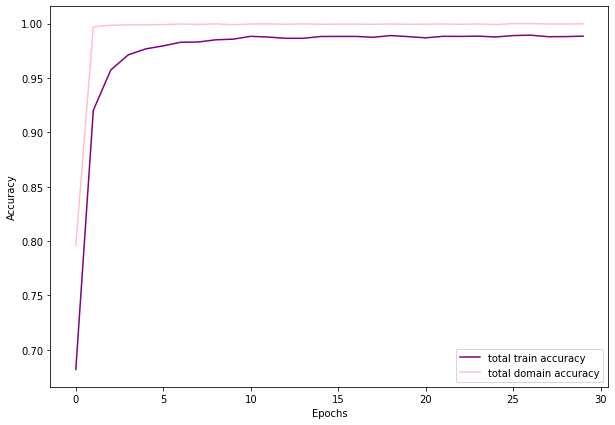

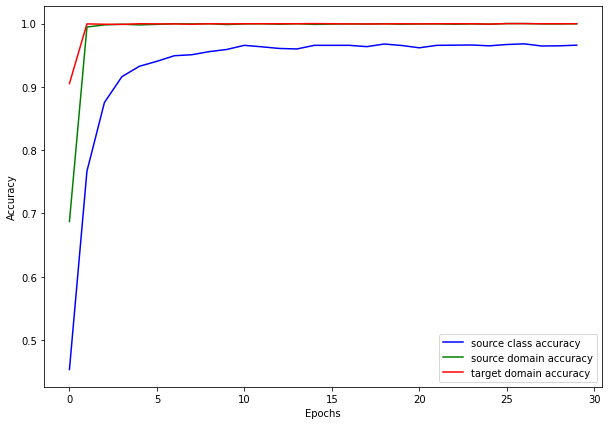

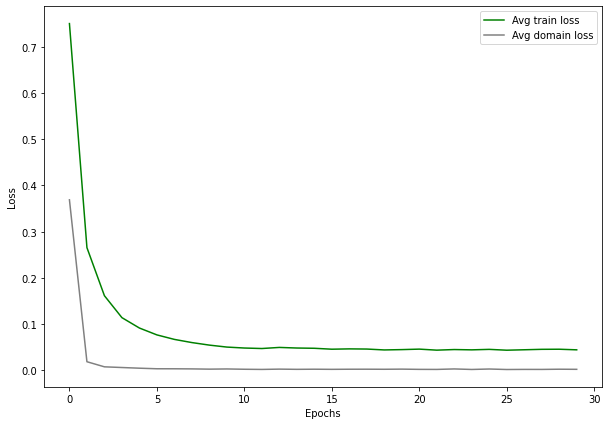

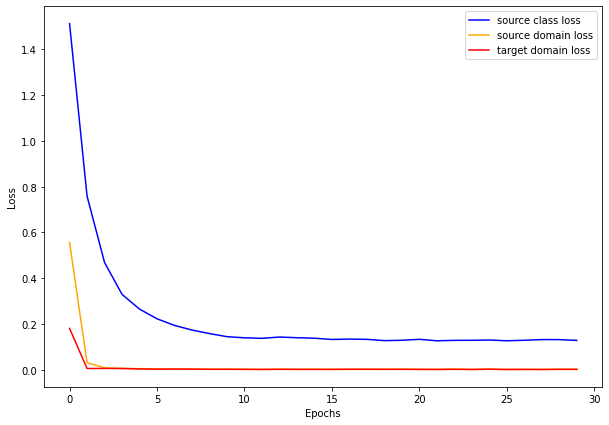

Iteration 7 / 8
lr: 0.01_wd: 4.9999999999999996e-06_gamma: 0.26214576232928044_alpha: 0.26050011945526946
Starting epoch 1/30, LR = [0.01]




Source class Loss: 1.3003, Train class Acc: 0.53
Target class Loss: 2.0272, Val class Acc: 0.20
Source domain Loss: 0.8765, Source domain Acc: 0.73
Target domain Loss: 0.9320, Target domain Acc: 0.77
Total train Loss: 1.0363, Total train Acc: 0.68
Total domain Loss: 0.9043, Total domain Acc: 0.75


Starting epoch 2/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.15
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 0.79
Target domain Loss: nan, Target domain Acc: 0.22
Total train Loss: nan, Total train Acc: 0.39
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 3/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 4/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 5/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 6/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 7/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 8/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 9/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 10/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 11/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 12/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 13/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 14/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 15/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 16/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 17/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 18/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 19/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 20/30, LR = [0.0026214576232928043]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 21/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 22/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 23/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 24/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 25/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 26/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 27/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 28/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 29/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 30/30, LR = [0.0006872040070719958]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.17
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50




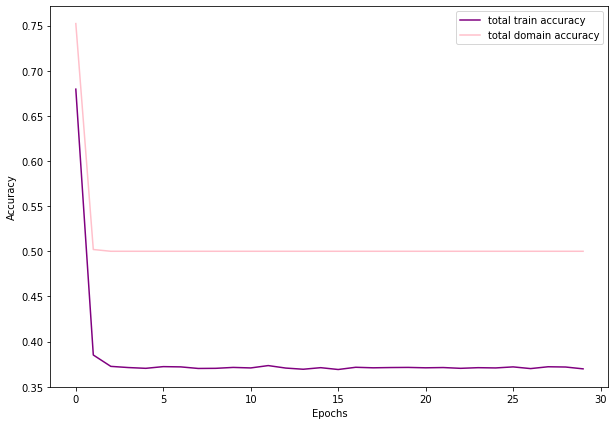

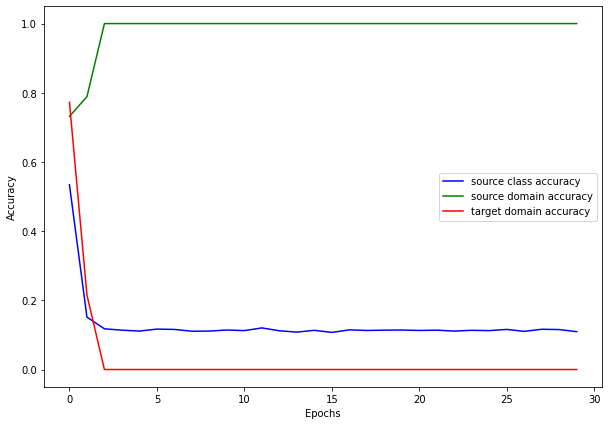

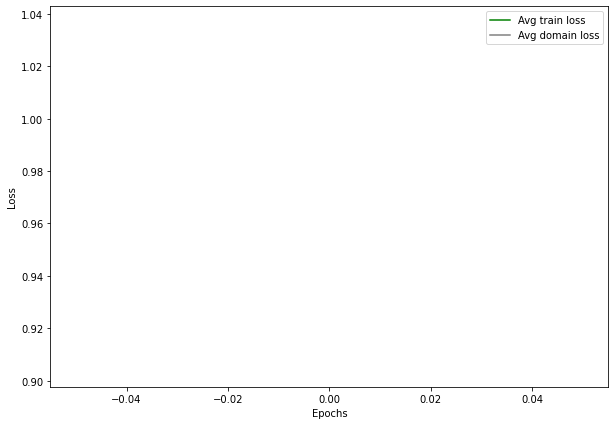

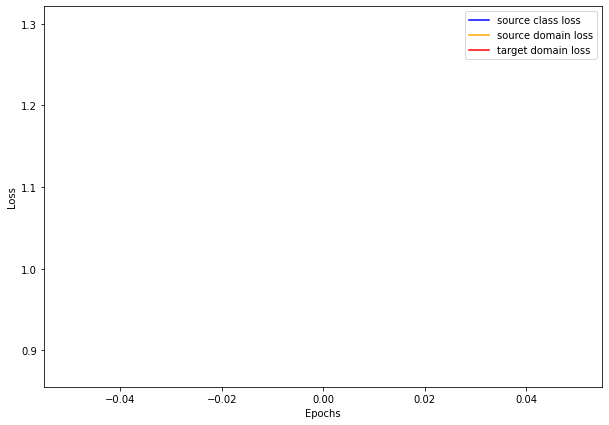

lr: 0.01_wd: 4.9999999999999996e-06_gamma: 0.26214576232928044_alpha: 0.26050011945526946
Starting epoch 1/30, LR = [0.01]




Source class Loss: 0.4928, Train class Acc: 0.82
Target class Loss: 0.3081, Val class Acc: 0.19
Source domain Loss: 0.0939, Source domain Acc: 0.95
Target domain Loss: 0.1070, Target domain Acc: 0.93
Total train Loss: 0.2312, Total train Acc: 0.90
Total domain Loss: 0.1005, Total domain Acc: 0.94


Starting epoch 2/30, LR = [0.01]




Source class Loss: 0.1110, Train class Acc: 0.96
Target class Loss: 0.0625, Val class Acc: 0.24
Source domain Loss: 0.0041, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0384, Total train Acc: 0.99
Total domain Loss: 0.0020, Total domain Acc: 1.00


Starting epoch 3/30, LR = [0.01]




Source class Loss: 0.0588, Train class Acc: 0.98
Target class Loss: 0.0189, Val class Acc: 0.21
Source domain Loss: 0.0009, Source domain Acc: 1.00
Target domain Loss: 0.0012, Target domain Acc: 1.00
Total train Loss: 0.0203, Total train Acc: 0.99
Total domain Loss: 0.0010, Total domain Acc: 1.00


Starting epoch 4/30, LR = [0.01]




Source class Loss: 0.0193, Train class Acc: 1.00
Target class Loss: 0.0130, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0064, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 5/30, LR = [0.01]




Source class Loss: 0.0108, Train class Acc: 1.00
Target class Loss: 0.0042, Val class Acc: 0.20
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0036, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 6/30, LR = [0.01]




Source class Loss: 0.0038, Train class Acc: 1.00
Target class Loss: 0.0027, Val class Acc: 0.20
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0013, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 7/30, LR = [0.01]




Source class Loss: 0.0019, Train class Acc: 1.00
Target class Loss: 0.0005, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.01]




Source class Loss: 0.0016, Train class Acc: 1.00
Target class Loss: 0.0044, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.01]




Source class Loss: 0.0015, Train class Acc: 1.00
Target class Loss: 0.0003, Val class Acc: 0.22
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.01]




Source class Loss: 0.0017, Train class Acc: 1.00
Target class Loss: 0.0005, Val class Acc: 0.25
Source domain Loss: 0.0044, Source domain Acc: 1.00
Target domain Loss: 0.0013, Target domain Acc: 1.00
Total train Loss: 0.0025, Total train Acc: 1.00
Total domain Loss: 0.0028, Total domain Acc: 1.00


Starting epoch 11/30, LR = [0.0026214576232928043]




Source class Loss: 0.0030, Train class Acc: 1.00
Target class Loss: 0.0022, Val class Acc: 0.24
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0048, Target domain Acc: 1.00
Total train Loss: 0.0026, Total train Acc: 1.00
Total domain Loss: 0.0024, Total domain Acc: 1.00


Starting epoch 12/30, LR = [0.0026214576232928043]




Source class Loss: 0.0029, Train class Acc: 1.00
Target class Loss: 0.0061, Val class Acc: 0.20
Source domain Loss: 0.0007, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0012, Total train Acc: 1.00
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 13/30, LR = [0.0026214576232928043]




Source class Loss: 0.0028, Train class Acc: 1.00
Target class Loss: 0.0016, Val class Acc: 0.20
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0009, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 14/30, LR = [0.0026214576232928043]




Source class Loss: 0.0011, Train class Acc: 1.00
Target class Loss: 0.0004, Val class Acc: 0.20
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0004, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 15/30, LR = [0.0026214576232928043]




Source class Loss: 0.0007, Train class Acc: 1.00
Target class Loss: 0.0008, Val class Acc: 0.20
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 16/30, LR = [0.0026214576232928043]




Source class Loss: 0.0014, Train class Acc: 1.00
Target class Loss: 0.0024, Val class Acc: 0.20
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 17/30, LR = [0.0026214576232928043]




Source class Loss: 0.0007, Train class Acc: 1.00
Target class Loss: 0.0004, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 18/30, LR = [0.0026214576232928043]




Source class Loss: 0.0006, Train class Acc: 1.00
Target class Loss: 0.0022, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 19/30, LR = [0.0026214576232928043]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0003, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 20/30, LR = [0.0026214576232928043]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0009, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 21/30, LR = [0.0006872040070719958]




Source class Loss: 0.0004, Train class Acc: 1.00
Target class Loss: 0.0002, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 22/30, LR = [0.0006872040070719958]




Source class Loss: 0.0005, Train class Acc: 1.00
Target class Loss: 0.0004, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0002, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 23/30, LR = [0.0006872040070719958]




Source class Loss: 0.0003, Train class Acc: 1.00
Target class Loss: 0.0002, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 24/30, LR = [0.0006872040070719958]




Source class Loss: 0.0004, Train class Acc: 1.00
Target class Loss: 0.0002, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 25/30, LR = [0.0006872040070719958]




Source class Loss: 0.0003, Train class Acc: 1.00
Target class Loss: 0.0003, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 26/30, LR = [0.0006872040070719958]




Source class Loss: 0.0003, Train class Acc: 1.00
Target class Loss: 0.0001, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 27/30, LR = [0.0006872040070719958]




Source class Loss: 0.0003, Train class Acc: 1.00
Target class Loss: 0.0001, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 28/30, LR = [0.0006872040070719958]




Source class Loss: 0.0002, Train class Acc: 1.00
Target class Loss: 0.0002, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 29/30, LR = [0.0006872040070719958]




Source class Loss: 0.0004, Train class Acc: 1.00
Target class Loss: 0.0002, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00


Starting epoch 30/30, LR = [0.0006872040070719958]




Source class Loss: 0.0004, Train class Acc: 1.00
Target class Loss: 0.0011, Val class Acc: 0.21
Source domain Loss: 0.0000, Source domain Acc: 1.00
Target domain Loss: 0.0000, Target domain Acc: 1.00
Total train Loss: 0.0001, Total train Acc: 1.00
Total domain Loss: 0.0000, Total domain Acc: 1.00




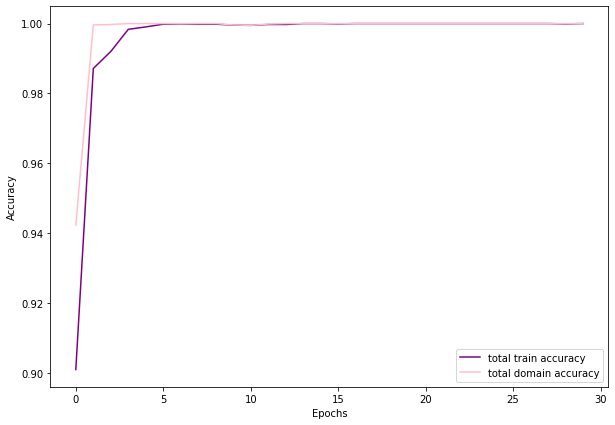

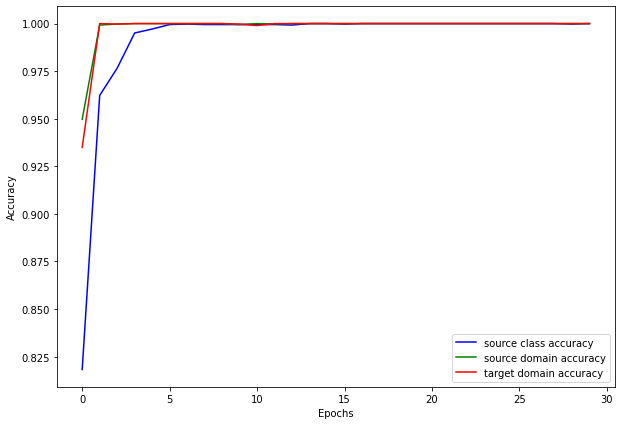

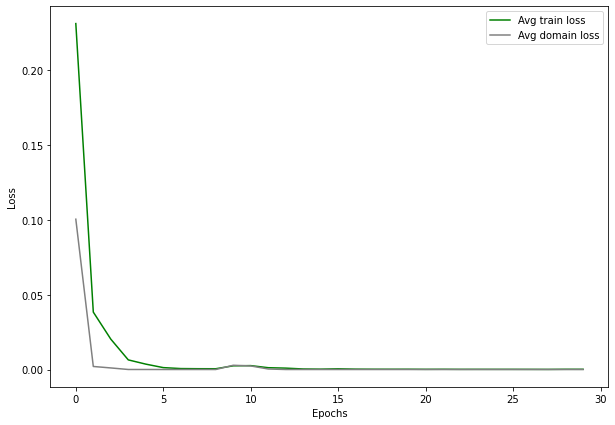

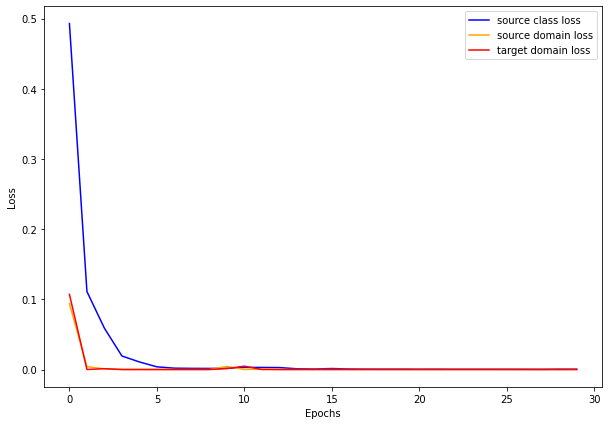

Iteration 8 / 8
lr: 0.01_wd: 5e-05_gamma: 0.39369454664490666_alpha: 0.12253807632175066
Starting epoch 1/30, LR = [0.01]




Source class Loss: 0.9238, Train class Acc: 0.68
Target class Loss: 0.7662, Val class Acc: 0.22
Source domain Loss: 0.4596, Source domain Acc: 0.87
Target domain Loss: 0.3986, Target domain Acc: 0.83
Total train Loss: 0.5940, Total train Acc: 0.79
Total domain Loss: 0.4291, Total domain Acc: 0.85


Starting epoch 2/30, LR = [0.01]




Source class Loss: 0.6267, Train class Acc: 0.79
Target class Loss: 0.5313, Val class Acc: 0.08
Source domain Loss: 0.0977, Source domain Acc: 0.97
Target domain Loss: 0.0762, Target domain Acc: 0.98
Total train Loss: 0.2669, Total train Acc: 0.91
Total domain Loss: 0.0869, Total domain Acc: 0.98


Starting epoch 3/30, LR = [0.01]




Source class Loss: 0.3886, Train class Acc: 0.87
Target class Loss: 0.3302, Val class Acc: 0.20
Source domain Loss: 0.1271, Source domain Acc: 0.97
Target domain Loss: 0.1058, Target domain Acc: 0.96
Total train Loss: 0.2072, Total train Acc: 0.93
Total domain Loss: 0.1165, Total domain Acc: 0.97


Starting epoch 4/30, LR = [0.01]




Source class Loss: 0.2860, Train class Acc: 0.90
Target class Loss: 0.2135, Val class Acc: 0.14
Source domain Loss: 0.0785, Source domain Acc: 0.98
Target domain Loss: 0.0673, Target domain Acc: 0.98
Total train Loss: 0.1439, Total train Acc: 0.95
Total domain Loss: 0.0729, Total domain Acc: 0.98


Starting epoch 5/30, LR = [0.01]




Source class Loss: 0.1551, Train class Acc: 0.95
Target class Loss: 0.1483, Val class Acc: 0.19
Source domain Loss: 0.0380, Source domain Acc: 0.98
Target domain Loss: 0.0437, Target domain Acc: 0.99
Total train Loss: 0.0789, Total train Acc: 0.97
Total domain Loss: 0.0408, Total domain Acc: 0.99


Starting epoch 6/30, LR = [0.01]




Source class Loss: 0.0956, Train class Acc: 0.97
Target class Loss: 0.0856, Val class Acc: 0.11
Source domain Loss: 0.0219, Source domain Acc: 0.99
Target domain Loss: 0.0205, Target domain Acc: 0.99
Total train Loss: 0.0460, Total train Acc: 0.98
Total domain Loss: 0.0212, Total domain Acc: 0.99


Starting epoch 7/30, LR = [0.01]




Source class Loss: 0.0652, Train class Acc: 0.98
Target class Loss: 0.0303, Val class Acc: 0.09
Source domain Loss: 0.0111, Source domain Acc: 1.00
Target domain Loss: 0.0115, Target domain Acc: 1.00
Total train Loss: 0.0293, Total train Acc: 0.99
Total domain Loss: 0.0113, Total domain Acc: 1.00


Starting epoch 8/30, LR = [0.01]




Source class Loss: 0.0429, Train class Acc: 0.99
Target class Loss: 0.0269, Val class Acc: 0.16
Source domain Loss: 0.0119, Source domain Acc: 0.99
Target domain Loss: 0.0102, Target domain Acc: 1.00
Total train Loss: 0.0217, Total train Acc: 0.99
Total domain Loss: 0.0111, Total domain Acc: 1.00


Starting epoch 9/30, LR = [0.01]




Source class Loss: 0.0288, Train class Acc: 0.99
Target class Loss: 0.0202, Val class Acc: 0.20
Source domain Loss: 0.0070, Source domain Acc: 1.00
Target domain Loss: 0.0018, Target domain Acc: 1.00
Total train Loss: 0.0125, Total train Acc: 1.00
Total domain Loss: 0.0044, Total domain Acc: 1.00


Starting epoch 10/30, LR = [0.01]




Source class Loss: 0.0131, Train class Acc: 1.00
Target class Loss: 0.0200, Val class Acc: 0.15
Source domain Loss: 0.0009, Source domain Acc: 1.00
Target domain Loss: 0.0039, Target domain Acc: 1.00
Total train Loss: 0.0060, Total train Acc: 1.00
Total domain Loss: 0.0024, Total domain Acc: 1.00


Starting epoch 11/30, LR = [0.003936945466449067]




Source class Loss: 0.0060, Train class Acc: 1.00
Target class Loss: 0.0059, Val class Acc: 0.16
Source domain Loss: 0.0032, Source domain Acc: 1.00
Target domain Loss: 0.0003, Target domain Acc: 1.00
Total train Loss: 0.0031, Total train Acc: 1.00
Total domain Loss: 0.0017, Total domain Acc: 1.00


Starting epoch 12/30, LR = [0.003936945466449067]




Source class Loss: 0.0047, Train class Acc: 1.00
Target class Loss: 0.0028, Val class Acc: 0.18
Source domain Loss: 0.0005, Source domain Acc: 1.00
Target domain Loss: 0.0006, Target domain Acc: 1.00
Total train Loss: 0.0019, Total train Acc: 1.00
Total domain Loss: 0.0005, Total domain Acc: 1.00


Starting epoch 13/30, LR = [0.003936945466449067]




Source class Loss: 0.0031, Train class Acc: 1.00
Target class Loss: 0.0029, Val class Acc: 0.18
Source domain Loss: 0.0005, Source domain Acc: 1.00
Target domain Loss: 0.0005, Target domain Acc: 1.00
Total train Loss: 0.0014, Total train Acc: 1.00
Total domain Loss: 0.0005, Total domain Acc: 1.00


Starting epoch 14/30, LR = [0.003936945466449067]




Source class Loss: 0.0031, Train class Acc: 1.00
Target class Loss: 0.0036, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0018, Target domain Acc: 1.00
Total train Loss: 0.0017, Total train Acc: 1.00
Total domain Loss: 0.0010, Total domain Acc: 1.00


Starting epoch 15/30, LR = [0.003936945466449067]




Source class Loss: 0.0033, Train class Acc: 1.00
Target class Loss: 0.0025, Val class Acc: 0.17
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0012, Total train Acc: 1.00
Total domain Loss: 0.0002, Total domain Acc: 1.00


Starting epoch 16/30, LR = [0.003936945466449067]




Source class Loss: 0.0030, Train class Acc: 1.00
Target class Loss: 0.0020, Val class Acc: 0.17
Source domain Loss: 0.0008, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0013, Total train Acc: 1.00
Total domain Loss: 0.0005, Total domain Acc: 1.00


Starting epoch 17/30, LR = [0.003936945466449067]




Source class Loss: 0.0019, Train class Acc: 1.00
Target class Loss: 0.0016, Val class Acc: 0.18
Source domain Loss: 0.0003, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0008, Total train Acc: 1.00
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 18/30, LR = [0.003936945466449067]




Source class Loss: 0.0014, Train class Acc: 1.00
Target class Loss: 0.0018, Val class Acc: 0.18
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0003, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0002, Total domain Acc: 1.00


Starting epoch 19/30, LR = [0.003936945466449067]




Source class Loss: 0.0012, Train class Acc: 1.00
Target class Loss: 0.0006, Val class Acc: 0.18
Source domain Loss: 0.0003, Source domain Acc: 1.00
Target domain Loss: 0.0004, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 20/30, LR = [0.003936945466449067]




Source class Loss: 0.0011, Train class Acc: 1.00
Target class Loss: 0.0013, Val class Acc: 0.17
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0003, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 21/30, LR = [0.001549953960579386]




Source class Loss: 0.0017, Train class Acc: 1.00
Target class Loss: 0.0004, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 22/30, LR = [0.001549953960579386]




Source class Loss: 0.0014, Train class Acc: 1.00
Target class Loss: 0.0009, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 23/30, LR = [0.001549953960579386]




Source class Loss: 0.0012, Train class Acc: 1.00
Target class Loss: 0.0012, Val class Acc: 0.17
Source domain Loss: 0.0004, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 24/30, LR = [0.001549953960579386]




Source class Loss: 0.0011, Train class Acc: 1.00
Target class Loss: 0.0011, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0003, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0002, Total domain Acc: 1.00


Starting epoch 25/30, LR = [0.001549953960579386]




Source class Loss: 0.0013, Train class Acc: 1.00
Target class Loss: 0.0010, Val class Acc: 0.17
Source domain Loss: 0.0004, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 26/30, LR = [0.001549953960579386]




Source class Loss: 0.0013, Train class Acc: 1.00
Target class Loss: 0.0004, Val class Acc: 0.17
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0002, Total domain Acc: 1.00


Starting epoch 27/30, LR = [0.001549953960579386]




Source class Loss: 0.0013, Train class Acc: 1.00
Target class Loss: 0.0018, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0002, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 28/30, LR = [0.001549953960579386]




Source class Loss: 0.0013, Train class Acc: 1.00
Target class Loss: 0.0011, Val class Acc: 0.17
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0004, Target domain Acc: 1.00
Total train Loss: 0.0006, Total train Acc: 1.00
Total domain Loss: 0.0003, Total domain Acc: 1.00


Starting epoch 29/30, LR = [0.001549953960579386]




Source class Loss: 0.0012, Train class Acc: 1.00
Target class Loss: 0.0009, Val class Acc: 0.17
Source domain Loss: 0.0001, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00


Starting epoch 30/30, LR = [0.001549953960579386]




Source class Loss: 0.0011, Train class Acc: 1.00
Target class Loss: 0.0009, Val class Acc: 0.17
Source domain Loss: 0.0002, Source domain Acc: 1.00
Target domain Loss: 0.0001, Target domain Acc: 1.00
Total train Loss: 0.0005, Total train Acc: 1.00
Total domain Loss: 0.0001, Total domain Acc: 1.00




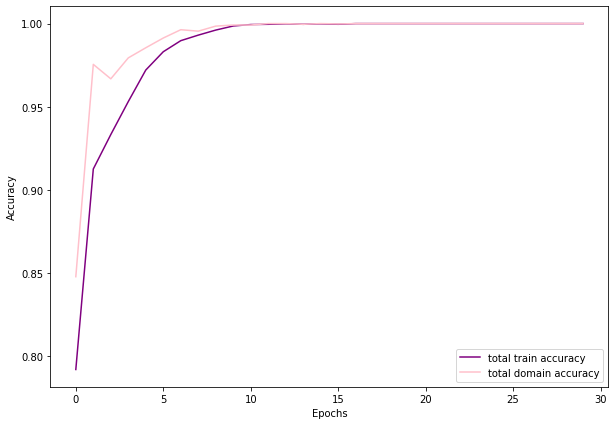

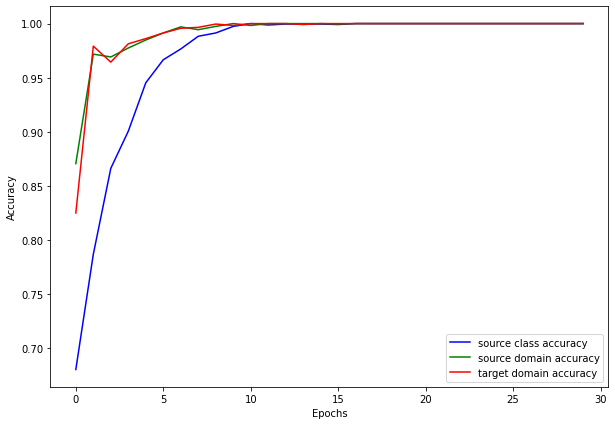

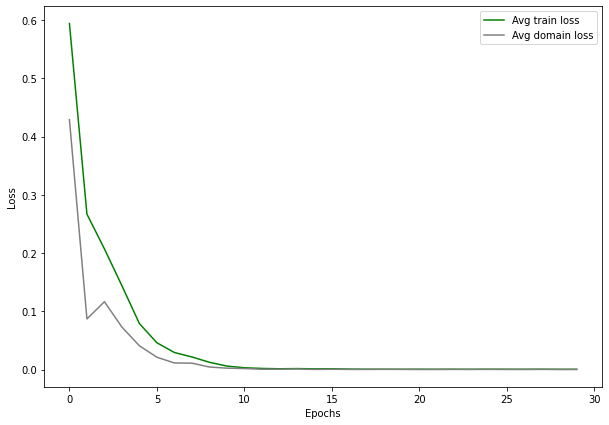

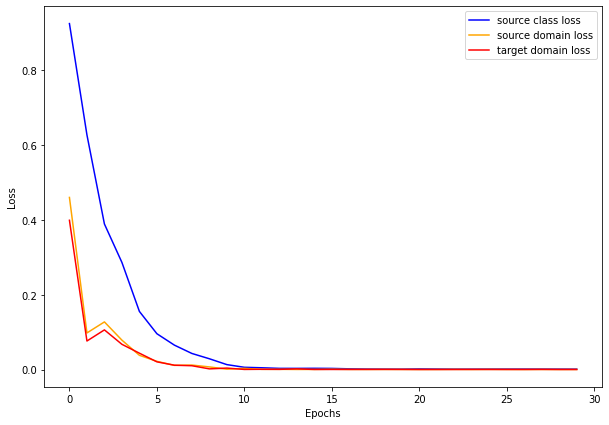

lr: 0.01_wd: 5e-05_gamma: 0.39369454664490666_alpha: 0.12253807632175066
Starting epoch 1/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.40
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 0.82
Target domain Loss: nan, Target domain Acc: 0.56
Total train Loss: nan, Total train Acc: 0.59
Total domain Loss: nan, Total domain Acc: 0.69


Starting epoch 2/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 3/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 4/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 5/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 6/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 7/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 8/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 9/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 10/30, LR = [0.01]




Source class Loss: nan, Train class Acc: 0.12
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 11/30, LR = [0.003936945466449067]




Source class Loss: nan, Train class Acc: 0.11
Target class Loss: nan, Val class Acc: 0.20
Source domain Loss: nan, Source domain Acc: 1.00
Target domain Loss: nan, Target domain Acc: 0.00
Total train Loss: nan, Total train Acc: 0.37
Total domain Loss: nan, Total domain Acc: 0.50


Starting epoch 12/30, LR = [0.003936945466449067]


In [ ]:
import random
num_iters=8

for i in range(num_iters):    
    print(f'Iteration {i+1} / {num_iters}')
    lr = 10**(-random.randint(2,4))
    wd = 5*10**(-random.randint(4,6))
    gamma = random.uniform(0.1,0.5)
    alpha = random.uniform(0.01,0.5)
    s = f'lr: {lr}_wd: {wd}_gamma: {gamma}_alpha: {alpha}'
    print(s)
    net = alexnet(pretrained=True)
    net.classifier[6] = nn.Linear(4096, NUM_CLASSES)
    net.domain_classifier[6] = nn.Linear(4096,NUM_DOMAINS)
    parameters_to_optimize = net.parameters() 
    optimizer = optim.SGD(parameters_to_optimize, lr=lr, momentum=MOMENTUM, weight_decay=wd)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=gamma)
    train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy = train_dann(net,src_dataloader=src_dataloader,target_dataloader=cartoon_dataloader,ALPHA=ALPHA)
    plot_DANN(train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy ,"cartoon_DANN"+ s)
    print(s)
    net = alexnet(pretrained=True)
    net.classifier[6] = nn.Linear(4096, NUM_CLASSES)
    net.domain_classifier[6] = nn.Linear(4096,NUM_DOMAINS)
    parameters_to_optimize = net.parameters() 
    optimizer = optim.SGD(parameters_to_optimize, lr=lr, momentum=MOMENTUM, weight_decay=wd)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=gamma)
    train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy = train_dann(net,src_dataloader=src_dataloader,target_dataloader=sketch_dataloader,ALPHA=ALPHA)
    plot_DANN(train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy ,"sketchDANN"+ s)

### TESTING THE BEST SET

SET THE BEST FOUND SET OF HYPERPARAMETERS

In [ ]:
DEVICE = 'cuda' 

NUM_CLASSES = 7 

BATCH_SIZE = 256     

LR = 1e-4            
MOMENTUM = 0.9       
WEIGHT_DECAY = 5e-5  
ALPHA = 0.1         

NUM_EPOCHS = 30      
STEP_SIZE = 10       
GAMMA = 0.36          

LOG_FREQUENCY = 10

NUM_DOMAINS = 2

In [ ]:
BATCH_SIZE = 256
src_dataloader = DataLoader(src_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
target_dataloader = DataLoader(target_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(pretrained=True) 

net.classifier[6] = nn.Linear(4096, NUM_CLASSES) 
net.domain_classifier[6] = nn.Linear(4096,NUM_DOMAINS)
criterion = nn.CrossEntropyLoss() 
domain_criterion = nn.CrossEntropyLoss()



parameters_to_optimize = net.parameters() 


optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)


scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)


In [ ]:
train_total_loss,train_total_accuracy,train_domain_loss,train_domain_accuracy,train_loss,train_accuracy,train_src_domain_loss, train_src_domain_accuracy, train_target_domain_loss, train_target_domain_accuracy,val_loss,val_accuracy = train_dann(net,src_dataloader=src_dataloader,target_dataloader=target_dataloader,ALPHA=ALPHA)

In [ ]:
training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=cartoon_dataloader)
training_loss,training_accuracy,validation_loss,validation_accuracy = fit(net,train_dataloader=src_dataloader,val_dataloader=sketch_dataloader)

Starting epoch 1/30, LR = [0.0001]
Step 0, Loss 2.222935199737549




Train Loss: 2.0627, Train Acc: 0.16
Val Loss: 2.1320, Val Acc: 0.20


Starting epoch 2/30, LR = [0.0001]
Step 10, Loss 1.4731800556182861




Train Loss: 1.5385, Train Acc: 0.42
Val Loss: 2.0308, Val Acc: 0.24


Starting epoch 3/30, LR = [0.0001]




Train Loss: 1.0989, Train Acc: 0.59
Val Loss: 1.9520, Val Acc: 0.28


Starting epoch 4/30, LR = [0.0001]
Step 20, Loss 0.8037401437759399




Train Loss: 0.8304, Train Acc: 0.68
Val Loss: 1.9147, Val Acc: 0.31


Starting epoch 5/30, LR = [0.0001]




Train Loss: 0.6578, Train Acc: 0.74
Val Loss: 1.9109, Val Acc: 0.30


Starting epoch 6/30, LR = [0.0001]
Step 30, Loss 0.542198896408081




Train Loss: 0.5519, Train Acc: 0.77
Val Loss: 1.9320, Val Acc: 0.31


Starting epoch 7/30, LR = [0.0001]
Step 40, Loss 0.5294376015663147




Train Loss: 0.4649, Train Acc: 0.80
Val Loss: 1.9761, Val Acc: 0.29


Starting epoch 8/30, LR = [0.0001]




Train Loss: 0.3982, Train Acc: 0.81
Val Loss: 2.0217, Val Acc: 0.29


Starting epoch 9/30, LR = [0.0001]
Step 50, Loss 0.3711686134338379




Train Loss: 0.3490, Train Acc: 0.84
Val Loss: 2.0742, Val Acc: 0.27


Starting epoch 10/30, LR = [0.0001]




Train Loss: 0.3106, Train Acc: 0.84
Val Loss: 2.1217, Val Acc: 0.27


Starting epoch 11/30, LR = [3.6e-05]
Step 60, Loss 0.2743087112903595




Train Loss: 0.2926, Train Acc: 0.86
Val Loss: 2.1395, Val Acc: 0.27


Starting epoch 12/30, LR = [3.6e-05]
Step 70, Loss 0.3235361874103546




Train Loss: 0.2890, Train Acc: 0.85
Val Loss: 2.1562, Val Acc: 0.26


Starting epoch 13/30, LR = [3.6e-05]




Train Loss: 0.2799, Train Acc: 0.85
Val Loss: 2.1702, Val Acc: 0.26


Starting epoch 14/30, LR = [3.6e-05]
Step 80, Loss 0.2502153217792511




Train Loss: 0.2737, Train Acc: 0.86
Val Loss: 2.1825, Val Acc: 0.26


Starting epoch 15/30, LR = [3.6e-05]




Train Loss: 0.2597, Train Acc: 0.86
Val Loss: 2.1946, Val Acc: 0.26


Starting epoch 16/30, LR = [3.6e-05]
Step 90, Loss 0.2671247720718384




Train Loss: 0.2588, Train Acc: 0.86
Val Loss: 2.2056, Val Acc: 0.26


Starting epoch 17/30, LR = [3.6e-05]
Step 100, Loss 0.26792237162590027




Train Loss: 0.2551, Train Acc: 0.86
Val Loss: 2.2153, Val Acc: 0.26


Starting epoch 18/30, LR = [3.6e-05]




Train Loss: 0.2401, Train Acc: 0.86
Val Loss: 2.2261, Val Acc: 0.26


Starting epoch 19/30, LR = [3.6e-05]
Step 110, Loss 0.28632229566574097




Train Loss: 0.2394, Train Acc: 0.86
Val Loss: 2.2359, Val Acc: 0.26


Starting epoch 20/30, LR = [3.6e-05]




Train Loss: 0.2400, Train Acc: 0.86
Val Loss: 2.2483, Val Acc: 0.26


Starting epoch 21/30, LR = [1.296e-05]
Step 120, Loss 0.2625095546245575




Train Loss: 0.2320, Train Acc: 0.86
Val Loss: 2.2516, Val Acc: 0.26


Starting epoch 22/30, LR = [1.296e-05]
Step 130, Loss 0.21803385019302368




Train Loss: 0.2330, Train Acc: 0.86
Val Loss: 2.2546, Val Acc: 0.26


Starting epoch 23/30, LR = [1.296e-05]




Train Loss: 0.2337, Train Acc: 0.86
Val Loss: 2.2584, Val Acc: 0.26


Starting epoch 24/30, LR = [1.296e-05]
Step 140, Loss 0.2416429966688156




Train Loss: 0.2262, Train Acc: 0.87
Val Loss: 2.2619, Val Acc: 0.26


Starting epoch 25/30, LR = [1.296e-05]




Train Loss: 0.2301, Train Acc: 0.87
Val Loss: 2.2644, Val Acc: 0.26


Starting epoch 26/30, LR = [1.296e-05]
Step 150, Loss 0.21948952972888947




Train Loss: 0.2182, Train Acc: 0.87
Val Loss: 2.2673, Val Acc: 0.26


Starting epoch 27/30, LR = [1.296e-05]
Step 160, Loss 0.2771774232387543




Train Loss: 0.2277, Train Acc: 0.86
Val Loss: 2.2695, Val Acc: 0.26


Starting epoch 28/30, LR = [1.296e-05]




Train Loss: 0.2232, Train Acc: 0.87
Val Loss: 2.2724, Val Acc: 0.26


Starting epoch 29/30, LR = [1.296e-05]
Step 170, Loss 0.2211168259382248




Train Loss: 0.2222, Train Acc: 0.87
Val Loss: 2.2751, Val Acc: 0.26


Starting epoch 30/30, LR = [1.296e-05]




Train Loss: 0.2230, Train Acc: 0.87
Val Loss: 2.2777, Val Acc: 0.26


Starting epoch 1/30, LR = [4.6656e-06]
Step 0, Loss 0.2333163619041443




Train Loss: 0.2201, Train Acc: 0.87
Val Loss: 2.1190, Val Acc: 0.47


Starting epoch 2/30, LR = [4.6656e-06]
Step 10, Loss 0.21839037537574768




Train Loss: 0.2202, Train Acc: 0.87
Val Loss: 2.1196, Val Acc: 0.47


Starting epoch 3/30, LR = [4.6656e-06]




Train Loss: 0.2124, Train Acc: 0.87
Val Loss: 2.1202, Val Acc: 0.47


Starting epoch 4/30, LR = [4.6656e-06]
Step 20, Loss 0.20550383627414703




Train Loss: 0.2252, Train Acc: 0.87
Val Loss: 2.1207, Val Acc: 0.47


Starting epoch 5/30, LR = [4.6656e-06]




Train Loss: 0.2149, Train Acc: 0.87
Val Loss: 2.1211, Val Acc: 0.47


Starting epoch 6/30, LR = [4.6656e-06]
Step 30, Loss 0.24560664594173431




Train Loss: 0.2181, Train Acc: 0.87
Val Loss: 2.1216, Val Acc: 0.47


Starting epoch 7/30, LR = [4.6656e-06]
Step 40, Loss 0.1875779926776886




Train Loss: 0.2133, Train Acc: 0.86
Val Loss: 2.1220, Val Acc: 0.47


Starting epoch 8/30, LR = [4.6656e-06]




Train Loss: 0.2180, Train Acc: 0.87
Val Loss: 2.1224, Val Acc: 0.47


Starting epoch 9/30, LR = [4.6656e-06]
Step 50, Loss 0.19867351651191711




Train Loss: 0.2123, Train Acc: 0.87
Val Loss: 2.1229, Val Acc: 0.47


Starting epoch 10/30, LR = [4.6656e-06]




Train Loss: 0.2051, Train Acc: 0.87
Val Loss: 2.1234, Val Acc: 0.47


Starting epoch 11/30, LR = [1.6796159999999998e-06]
Step 60, Loss 0.18454651534557343




Train Loss: 0.2145, Train Acc: 0.86
Val Loss: 2.1235, Val Acc: 0.47


Starting epoch 12/30, LR = [1.6796159999999998e-06]
Step 70, Loss 0.22408640384674072




Train Loss: 0.2113, Train Acc: 0.86
Val Loss: 2.1237, Val Acc: 0.47


Starting epoch 13/30, LR = [1.6796159999999998e-06]




Train Loss: 0.2077, Train Acc: 0.87
Val Loss: 2.1238, Val Acc: 0.47


Starting epoch 14/30, LR = [1.6796159999999998e-06]
Step 80, Loss 0.20619922876358032




Train Loss: 0.2035, Train Acc: 0.87
Val Loss: 2.1239, Val Acc: 0.47


Starting epoch 15/30, LR = [1.6796159999999998e-06]




Train Loss: 0.2060, Train Acc: 0.87
Val Loss: 2.1241, Val Acc: 0.47


Starting epoch 16/30, LR = [1.6796159999999998e-06]
Step 90, Loss 0.21754445135593414




Train Loss: 0.2120, Train Acc: 0.87
Val Loss: 2.1242, Val Acc: 0.47


Starting epoch 17/30, LR = [1.6796159999999998e-06]
Step 100, Loss 0.21138501167297363




Train Loss: 0.2137, Train Acc: 0.87
Val Loss: 2.1243, Val Acc: 0.47


Starting epoch 18/30, LR = [1.6796159999999998e-06]




Train Loss: 0.2099, Train Acc: 0.87
Val Loss: 2.1245, Val Acc: 0.47


Starting epoch 19/30, LR = [1.6796159999999998e-06]
Step 110, Loss 0.19944874942302704




Train Loss: 0.2122, Train Acc: 0.87
Val Loss: 2.1247, Val Acc: 0.47


Starting epoch 20/30, LR = [1.6796159999999998e-06]




Train Loss: 0.2117, Train Acc: 0.87
Val Loss: 2.1249, Val Acc: 0.47


Starting epoch 21/30, LR = [6.046617599999999e-07]
Step 120, Loss 0.17720825970172882




Train Loss: 0.2053, Train Acc: 0.87
Val Loss: 2.1249, Val Acc: 0.47


Starting epoch 22/30, LR = [6.046617599999999e-07]
Step 130, Loss 0.17770323157310486




Train Loss: 0.2109, Train Acc: 0.87
Val Loss: 2.1250, Val Acc: 0.47


Starting epoch 23/30, LR = [6.046617599999999e-07]




Train Loss: 0.2059, Train Acc: 0.87
Val Loss: 2.1250, Val Acc: 0.47


Starting epoch 24/30, LR = [6.046617599999999e-07]
Step 140, Loss 0.2079188972711563




Train Loss: 0.2134, Train Acc: 0.87
Val Loss: 2.1251, Val Acc: 0.47


Starting epoch 25/30, LR = [6.046617599999999e-07]




Train Loss: 0.2094, Train Acc: 0.87
Val Loss: 2.1251, Val Acc: 0.47


Starting epoch 26/30, LR = [6.046617599999999e-07]
Step 150, Loss 0.2090541571378708




Train Loss: 0.2079, Train Acc: 0.87
Val Loss: 2.1251, Val Acc: 0.47


Starting epoch 27/30, LR = [6.046617599999999e-07]
Step 160, Loss 0.24604535102844238




Train Loss: 0.2144, Train Acc: 0.87
Val Loss: 2.1252, Val Acc: 0.47


Starting epoch 28/30, LR = [6.046617599999999e-07]


In [ ]:
test(net,target_dataloader)



Test Accuracy: 0.38427734375


0.38427734375